## 1. Inspect First Segment NetCDF File

Load and examine the structure of the first segment file to understand the CRYO2ICE combined product.

In [1]:
import xarray as xr
import pandas as pd
import numpy as np
from pathlib import Path

# Define the base directory
base_dir = Path(r"D:\phd\data\cs2eo\sea_ice_SIR_SAR_L2_E__ATL07_antarctic_2021_09_combined_product")

# Load the first segment file
segment_file = base_dir / "segment_1.nc"

# Open the dataset
ds = xr.open_dataset(segment_file)

# Display basic information
print("=" * 80)
print(f"Dataset: {segment_file.name}")
print("=" * 80)
print(f"\nDataset dimensions:")
print(ds.dims)
print(f"\nDataset coordinates:")
print(ds.coords)
print(f"\nDataset attributes:")
for attr, value in ds.attrs.items():
    print(f"  {attr}: {value}")

Dataset: segment_1.nc

Dataset dimensions:
FrozenMappingWarningOnValuesAccess({})

Dataset coordinates:
Coordinates:
    *empty*

Dataset attributes:


## 2. Inspect NetCDF File Structure and Variables

The file appears to have a hierarchical structure. Let's use netCDF4 library to explore it properly.

In [2]:
import netCDF4 as nc

# Close the xarray dataset first
ds.close()

# Open with netCDF4 to explore the structure
nc_file = nc.Dataset(segment_file, 'r')

print("\n" + "=" * 80)
print("NETCDF FILE STRUCTURE")
print("=" * 80)

# Display file format
print(f"\nFile format: {nc_file.file_format}")

# Display global attributes
print(f"\nGlobal attributes:")
for attr in nc_file.ncattrs():
    print(f"  {attr}: {getattr(nc_file, attr)}")

# Display dimensions
print(f"\nDimensions:")
for dim_name, dim in nc_file.dimensions.items():
    print(f"  {dim_name}: {len(dim)} {'(unlimited)' if dim.isunlimited() else ''}")

# Display variables at root level
print(f"\nVariables at root level: {len(nc_file.variables)}")
for var_name in list(nc_file.variables.keys())[:10]:  # Show first 10
    var = nc_file.variables[var_name]
    print(f"\n  {var_name}:")
    print(f"    Shape: {var.shape}")
    print(f"    Dtype: {var.dtype}")
    print(f"    Dimensions: {var.dimensions}")

# Check for groups (hierarchical structure)
print(f"\n" + "=" * 80)
print(f"GROUPS IN FILE")
print("=" * 80)

def print_group_structure(group, indent=0):
    """Recursively print group structure"""
    prefix = "  " * indent
    
    if hasattr(group, 'groups'):
        for group_name, subgroup in group.groups.items():
            print(f"{prefix}📁 {group_name}/")
            print(f"{prefix}   Dimensions: {dict(subgroup.dimensions)}")
            print(f"{prefix}   Variables: {len(subgroup.variables)}")
            if len(subgroup.variables) > 0:
                print(f"{prefix}   Variable names: {list(subgroup.variables.keys())[:5]}...")
            print_group_structure(subgroup, indent + 1)

if len(nc_file.groups) > 0:
    print(f"\nFound {len(nc_file.groups)} group(s):\n")
    print_group_structure(nc_file)
else:
    print("\nNo groups found in file.")

# If there are groups, display variables from the first group
if len(nc_file.groups) > 0:
    first_group_name = list(nc_file.groups.keys())[0]
    first_group = nc_file.groups[first_group_name]
    
    print(f"\n" + "=" * 80)
    print(f"VARIABLES IN FIRST GROUP: {first_group_name}")
    print("=" * 80)
    
    print(f"\nTotal variables: {len(first_group.variables)}\n")
    
    # Display first 10 variables in detail
    for i, var_name in enumerate(list(first_group.variables.keys())[:10], 1):
        var = first_group.variables[var_name]
        print(f"\n{i}. {var_name}")
        print(f"   {'─' * 70}")
        print(f"   Shape: {var.shape}")
        print(f"   Dtype: {var.dtype}")
        print(f"   Dimensions: {var.dimensions}")
        
        # Display attributes
        if len(var.ncattrs()) > 0:
            print(f"   Attributes:")
            for attr in var.ncattrs():
                attr_value = str(getattr(var, attr))
                if len(attr_value) > 100:
                    attr_value = attr_value[:97] + "..."
                print(f"      {attr}: {attr_value}")
        
        # Show data preview
        try:
            if var.size > 0 and var.size < 1000000:  # Only for reasonable sized variables
                data = var[:]
                if hasattr(data, 'flatten'):
                    preview = data.flatten()[:5]
                    print(f"   Data preview: {preview}")
                    if np.issubdtype(var.dtype, np.number):
                        print(f"   Data range: [{np.nanmin(data):.4f}, {np.nanmax(data):.4f}]")
        except Exception as e:
            print(f"   Data preview: Unable to display")

# Close the netCDF file
nc_file.close()

print("\n" + "=" * 80)
print("INSPECTION COMPLETE")
print("=" * 80)


NETCDF FILE STRUCTURE

File format: NETCDF4

Global attributes:

Dimensions:

Variables at root level: 0

GROUPS IN FILE

Found 1 group(s):

📁 1/
   Dimensions: {}
   Variables: 0
  📁 SIR_SAR_L2_E/
     Dimensions: {'time_20_ku': "<class 'netCDF4.Dimension'>": name = 'time_20_ku', size = 411, 'time_cor_01': "<class 'netCDF4.Dimension'>": name = 'time_cor_01', size = 21}
     Variables: 60
     Variable names: ['alt_01', 'echo_avg_numval_20_ku', 'flag_cor_applied_20_ku', 'flag_cor_err_01', 'flag_instr_conf_rx_str_in_use_01']...
  📁 ATL07/
     Dimensions: {}
     Variables: 0
    📁 ancillary_data/
       Dimensions: {'phony_dim_19': "<class 'netCDF4.Dimension'>": name = 'phony_dim_19', size = 1}
       Variables: 25
       Variable names: ['atlas_sdp_gps_epoch', 'control', 'data_end_utc', 'data_start_utc', 'end_cycle']...
      📁 coarse_surface_finding/
         Dimensions: {'phony_dim_14': "<class 'netCDF4.Dimension'>": name = 'phony_dim_14', size = 1}
         Variables: 11
         

## 3. Load and Inspect CryoSat-2 and ICESat-2 Variables

Now that we've identified the hierarchical structure, let's explore the CryoSat-2 (SIR_SAR_L2_E) and ICESat-2 (ATL07) groups in detail.

In [3]:
# Re-open the file with netCDF4
nc_file = nc.Dataset(segment_file, 'r')

# Access the main group
main_group = nc_file.groups['1']

print("=" * 80)
print("CRYOSAT-2 (SIR_SAR_L2_E) VARIABLES")
print("=" * 80)

# Access CryoSat-2 group
cs2_group = main_group.groups['SIR_SAR_L2_E']

print(f"\nDimensions:")
for dim_name, dim in cs2_group.dimensions.items():
    print(f"  {dim_name}: {len(dim)}")

print(f"\nTotal variables: {len(cs2_group.variables)}")
print(f"\nAll variable names:")
for i, var_name in enumerate(cs2_group.variables.keys(), 1):
    print(f"  {i:2d}. {var_name}")

print(f"\n{'=' * 80}")
print("SAMPLE CRYOSAT-2 VARIABLES (First 10)")
print("=" * 80)

# Display first 10 variables in detail
for i, var_name in enumerate(list(cs2_group.variables.keys())[:10], 1):
    var = cs2_group.variables[var_name]
    print(f"\n{i}. {var_name}")
    print(f"   {'─' * 70}")
    print(f"   Shape: {var.shape}")
    print(f"   Dtype: {var.dtype}")
    print(f"   Dimensions: {var.dimensions}")
    
    # Display attributes
    if len(var.ncattrs()) > 0:
        print(f"   Attributes:")
        for attr in var.ncattrs()[:5]:  # Show first 5 attributes
            attr_value = str(getattr(var, attr))
            if len(attr_value) > 80:
                attr_value = attr_value[:77] + "..."
            print(f"      {attr}: {attr_value}")
    
    # Show data preview for numerical data
    try:
        if var.size > 0 and np.issubdtype(var.dtype, np.number):
            data = var[:]
            preview = data.flatten()[:5]
            print(f"   Data preview: {preview}")
            print(f"   Data range: [{np.nanmin(data):.4f}, {np.nanmax(data):.4f}]")
    except Exception as e:
        print(f"   Data preview: Unable to display")

print("\n" + "=" * 80)
print("ICESAT-2 (ATL07) STRUCTURE")
print("=" * 80)

# Access ICESat-2 group
atl07_group = main_group.groups['ATL07']

print(f"\nATL07 subgroups:")
for subgroup_name in atl07_group.groups.keys():
    subgroup = atl07_group.groups[subgroup_name]
    print(f"  📁 {subgroup_name}/")
    if hasattr(subgroup, 'groups') and len(subgroup.groups) > 0:
        for sub_subgroup_name in subgroup.groups.keys():
            print(f"    📁 {sub_subgroup_name}/")

# Focus on the beam groups (gt1l, gt1r, gt2l, gt2r, gt3l, gt3r)
beam_groups = [key for key in atl07_group.groups.keys() if key.startswith('gt')]

print(f"\n{'=' * 80}")
print(f"ICESAT-2 BEAM GROUPS (Total: {len(beam_groups)})")
print("=" * 80)

for beam in beam_groups[:2]:  # Show first 2 beams as examples
    beam_group = atl07_group.groups[beam]
    print(f"\n📍 Beam: {beam}")
    
    # Access sea_ice_segments
    if 'sea_ice_segments' in beam_group.groups:
        seg_group = beam_group.groups['sea_ice_segments']
        
        print(f"  Dimensions:")
        for dim_name, dim in seg_group.dimensions.items():
            print(f"    {dim_name}: {len(dim)}")
        
        print(f"\n  Top-level variables in sea_ice_segments:")
        for var_name in seg_group.variables.keys():
            var = seg_group.variables[var_name]
            print(f"    - {var_name}: {var.shape} {var.dtype}")
        
        # Show subgroups
        print(f"\n  Subgroups:")
        for subgroup_name in seg_group.groups.keys():
            subgroup = seg_group.groups[subgroup_name]
            print(f"    📁 {subgroup_name}/ ({len(subgroup.variables)} variables)")

print("\n" + "=" * 80)
print("DETAILED ICESat-2 VARIABLES - First Beam (gt1l)")
print("=" * 80)

# Get first beam for detailed inspection
first_beam = beam_groups[0]
beam_group = atl07_group.groups[first_beam]
seg_group = beam_group.groups['sea_ice_segments']

# Inspect heights subgroup (contains freeboard data)
if 'heights' in seg_group.groups:
    heights_group = seg_group.groups['heights']
    
    print(f"\n🔵 heights/ subgroup variables:")
    print(f"   Total variables: {len(heights_group.variables)}\n")
    
    for i, var_name in enumerate(heights_group.variables.keys(), 1):
        var = heights_group.variables[var_name]
        print(f"   {i:2d}. {var_name}")
        print(f"       Shape: {var.shape}, Dtype: {var.dtype}")
        
        # Display key attributes
        if 'long_name' in var.ncattrs():
            print(f"       Description: {var.long_name}")
        if 'units' in var.ncattrs():
            print(f"       Units: {var.units}")
        
        # Show data preview
        try:
            if var.size > 0 and np.issubdtype(var.dtype, np.number):
                data = var[:]
                print(f"       Range: [{np.nanmin(data):.4f}, {np.nanmax(data):.4f}]")
        except:
            pass
        print()

# Close the netCDF file
nc_file.close()

print("=" * 80)
print("INSPECTION COMPLETE")
print("=" * 80)

CRYOSAT-2 (SIR_SAR_L2_E) VARIABLES

Dimensions:
  time_20_ku: 411
  time_cor_01: 21

Total variables: 60

All variable names:
   1. alt_01
   2. echo_avg_numval_20_ku
   3. flag_cor_applied_20_ku
   4. flag_cor_err_01
   5. flag_instr_conf_rx_str_in_use_01
   6. flag_instr_mode_op_20_ku
   7. flag_prod_status_20_ku
   8. geoid_01
   9. height_1_20_ku
  10. height_2_20_ku
  11. height_3_20_ku
  12. height_sea_ice_floe_20_ku
  13. height_sea_ice_lead_20_ku
  14. hf_fluct_total_cor_01
  15. ind_first_meas_20hz_01
  16. ind_meas_1hz_20_ku
  17. inv_bar_cor_01
  18. iono_cor_01
  19. iono_cor_gim_01
  20. lat_01
  21. lat_poca_20_ku
  22. load_tide_01
  23. lon_01
  24. lon_poca_20_ku
  25. mean_sea_surf_sea_ice_01
  26. mod_dry_tropo_cor_01
  27. mod_wet_tropo_cor_01
  28. num_valid_01
  29. ocean_tide_01
  30. ocean_tide_eq_01
  31. odle_01
  32. off_nadir_pitch_angle_str_01
  33. off_nadir_roll_angle_str_01
  34. off_nadir_yaw_angle_str_01
  35. peakiness_20_ku
  36. pole_tide_01
  37. r

C:\Users\xliu38\AppData\Local\Temp\ipykernel_17344\3508053987.py:51: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  print(f"   Data range: [{np.nanmin(data):.4f}, {np.nanmax(data):.4f}]")


## 4. Extract Key Variables from CryoSat-2 and ICESat-2

Extract radar freeboard from CryoSat-2 and comprehensive variables from all six ICESat-2 beams to calculate the total freeboard.

In [4]:
import pandas as pd

# Re-open the file with netCDF4
nc_file = nc.Dataset(segment_file, 'r')
main_group = nc_file.groups['1']

print("=" * 80)
print("EXTRACTING CRYOSAT-2 KEY VARIABLES")
print("=" * 80)

# Access CryoSat-2 group
cs2_group = main_group.groups['SIR_SAR_L2_E']

# Extract key CryoSat-2 variables
cs2_data = {
    'radar_freeboard_20_ku': cs2_group.variables['radar_freeboard_20_ku'][:],
    'lat_poca_20_ku': cs2_group.variables['lat_poca_20_ku'][:],
    'lon_poca_20_ku': cs2_group.variables['lon_poca_20_ku'][:],
    'time_20_ku': cs2_group.variables['time_20_ku'][:]
}

# Get variable attributes for CryoSat-2
cs2_attrs = {}
for var_name in ['radar_freeboard_20_ku', 'lat_poca_20_ku', 'lon_poca_20_ku']:
    var = cs2_group.variables[var_name]
    cs2_attrs[var_name] = {
        'long_name': getattr(var, 'long_name', 'N/A'),
        'units': getattr(var, 'units', 'N/A'),
        'scale_factor': getattr(var, 'scale_factor', 1.0),
        '_FillValue': getattr(var, '_FillValue', None)
    }

print(f"\nCryoSat-2 Data Extracted:")
print(f"  Number of measurements: {len(cs2_data['radar_freeboard_20_ku'])}")
print(f"\n  Variable details:")
for var_name, attrs in cs2_attrs.items():
    print(f"\n  {var_name}:")
    print(f"    Description: {attrs['long_name']}")
    print(f"    Units: {attrs['units']}")
    print(f"    Scale factor: {attrs['scale_factor']}")
    if var_name == 'radar_freeboard_20_ku':
        valid_data = cs2_data[var_name][cs2_data[var_name] != attrs['_FillValue']]
        if len(valid_data) > 0:
            print(f"    Range: [{np.nanmin(valid_data):.4f}, {np.nanmax(valid_data):.4f}]")
            print(f"    Valid measurements: {len(valid_data)}/{len(cs2_data[var_name])}")

print("\n" + "=" * 80)
print("EXTRACTING ICESAT-2 VARIABLES FROM ALL BEAMS")
print("=" * 80)

# Access ICESat-2 group
atl07_group = main_group.groups['ATL07']

# Get all beam groups
beam_groups = [key for key in atl07_group.groups.keys() if key.startswith('gt')]
print(f"\nProcessing {len(beam_groups)} beams: {beam_groups}")

# Dictionary to store all ICESat-2 data
is2_data = {}

for beam in beam_groups:
    print(f"\n{'─' * 80}")
    print(f"📍 Processing Beam: {beam}")
    print(f"{'─' * 80}")
    
    beam_group = atl07_group.groups[beam]
    seg_group = beam_group.groups['sea_ice_segments']
    
    # Initialize beam data dictionary
    is2_data[beam] = {
        'main': {},
        'geolocation': {},
        'geophysical': {},
        'heights': {},
        'stats': {}
    }
    
    # Extract main variables
    print(f"\n  Main variables:")
    for var_name in seg_group.variables.keys():
        var = seg_group.variables[var_name]
        is2_data[beam]['main'][var_name] = var[:]
        print(f"    - {var_name}: {var.shape}")
    
    n_segments = len(is2_data[beam]['main']['delta_time'])
    print(f"  Total segments: {n_segments}")
    
    # Extract geolocation subgroup
    if 'geolocation' in seg_group.groups:
        geo_group = seg_group.groups['geolocation']
        print(f"\n  Geolocation variables ({len(geo_group.variables)}):")
        for var_name in geo_group.variables.keys():
            var = geo_group.variables[var_name]
            is2_data[beam]['geolocation'][var_name] = var[:]
            desc = getattr(var, 'long_name', 'N/A')
            print(f"    - {var_name}: {desc[:60]}")
    
    # Extract geophysical subgroup
    if 'geophysical' in seg_group.groups:
        geo_group = seg_group.groups['geophysical']
        print(f"\n  Geophysical variables ({len(geo_group.variables)}):")
        for var_name in geo_group.variables.keys():
            var = geo_group.variables[var_name]
            is2_data[beam]['geophysical'][var_name] = var[:]
            desc = getattr(var, 'long_name', 'N/A')
            print(f"    - {var_name}: {desc[:60]}")
    
    # Extract heights subgroup
    if 'heights' in seg_group.groups:
        heights_group = seg_group.groups['heights']
        print(f"\n  Heights variables ({len(heights_group.variables)}):")
        for var_name in heights_group.variables.keys():
            var = heights_group.variables[var_name]
            is2_data[beam]['heights'][var_name] = var[:]
            desc = getattr(var, 'long_name', 'N/A')
            units = getattr(var, 'units', 'N/A')
            print(f"    - {var_name}: {desc[:50]} [{units}]")
    
    # Extract stats subgroup
    if 'stats' in seg_group.groups:
        stats_group = seg_group.groups['stats']
        print(f"\n  Stats variables ({len(stats_group.variables)}):")
        # Only show first 10 for brevity
        for i, var_name in enumerate(list(stats_group.variables.keys())[:10], 1):
            var = stats_group.variables[var_name]
            is2_data[beam]['stats'][var_name] = var[:]
            desc = getattr(var, 'long_name', 'N/A')
            print(f"    {i:2d}. {var_name}: {desc[:50]}")
        if len(stats_group.variables) > 10:
            print(f"    ... and {len(stats_group.variables) - 10} more variables")
            # Extract remaining variables
            for var_name in list(stats_group.variables.keys())[10:]:
                var = stats_group.variables[var_name]
                is2_data[beam]['stats'][var_name] = var[:]

# Close the netCDF file
nc_file.close()

print("\n" + "=" * 80)
print("DATA EXTRACTION SUMMARY")
print("=" * 80)

print(f"\n📊 CryoSat-2 Data:")
print(f"   Measurements: {len(cs2_data['radar_freeboard_20_ku'])}")
print(f"   Variables: {list(cs2_data.keys())}")

print(f"\n📊 ICESat-2 Data:")
for beam in beam_groups:
    n_segments = len(is2_data[beam]['main']['delta_time'])
    n_main = len(is2_data[beam]['main'])
    n_geo = len(is2_data[beam]['geolocation'])
    n_geophys = len(is2_data[beam]['geophysical'])
    n_heights = len(is2_data[beam]['heights'])
    n_stats = len(is2_data[beam]['stats'])
    
    print(f"\n   Beam {beam}:")
    print(f"     Segments: {n_segments}")
    print(f"     Main variables: {n_main}")
    print(f"     Geolocation variables: {n_geo}")
    print(f"     Geophysical variables: {n_geophys}")
    print(f"     Heights variables: {n_heights}")
    print(f"     Stats variables: {n_stats}")

print("\n" + "=" * 80)
print("EXTRACTION COMPLETE")
print("=" * 80)

EXTRACTING CRYOSAT-2 KEY VARIABLES

CryoSat-2 Data Extracted:
  Number of measurements: 411

  Variable details:

  radar_freeboard_20_ku:
    Description: radar freeboard
    Units: m
    Scale factor: 0.001
    Range: [--, --]
    Valid measurements: 411/411

  lat_poca_20_ku:
    Description: latitude of the estimated echo location (POCA)
    Units: degrees_north
    Scale factor: 1e-07

  lon_poca_20_ku:
    Description: longitude of the estimated echo location (POCA)
    Units: degrees_east
    Scale factor: 1e-07

EXTRACTING ICESAT-2 VARIABLES FROM ALL BEAMS

Processing 6 beams: ['gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r']

────────────────────────────────────────────────────────────────────────────────
📍 Processing Beam: gt1l
────────────────────────────────────────────────────────────────────────────────

  Main variables:
    - delta_time: (10757,)
    - geoseg_beg: (10757,)
    - geoseg_end: (10757,)
    - height_segment_id: (10757,)
    - latitude: (10757,)
    - longitu

C:\Users\xliu38\AppData\Local\Temp\ipykernel_17344\2048056565.py:44: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  print(f"    Range: [{np.nanmin(valid_data):.4f}, {np.nanmax(valid_data):.4f}]")


    - height_segment_rms: height rms [meters]
    - height_segment_ssh_flag: Sea Surface Flag [1]
    - height_segment_surface_error_est: h surface error est [meters]
    - height_segment_type: Segment surface type [1]
    - height_segment_w_gaussian: width of best fit gaussian [meters]

  Stats variables (40):
     1. asr_25: Apparent Surface Reflectance 25hz
     2. backgr_calc: background count rate calculated
     3. backgr_r_200: Background rate 200 hz
     4. backgr_r_25: Background rate 25hz
     5. background_int_height: Height of column used in background calculation
     6. background_r_norm: Normalized background (50-shot)
     7. bsnow_con: Blowing snow confidence
     8. bsnow_h: Blowing snow top h
     9. cloud_flag_asr: Cloud Flag ASR
    10. cloud_flag_atm: Cloud Flag Atm
    ... and 30 more variables

────────────────────────────────────────────────────────────────────────────────
📍 Processing Beam: gt2l
─────────────────────────────────────────────────────────────────

## 5. Focus on Beam gt1r - Detailed Variable Inspection

Examine all variables in the gt1r beam's four subgroups and identify key variables for freeboard analysis.

In [5]:
# Re-open the file with netCDF4
nc_file = nc.Dataset(segment_file, 'r')
main_group = nc_file.groups['1']
atl07_group = main_group.groups['ATL07']

# Focus on gt1r beam
beam = 'gt1r'
beam_group = atl07_group.groups[beam]
seg_group = beam_group.groups['sea_ice_segments']

print("=" * 80)
print(f"DETAILED INSPECTION: BEAM {beam.upper()}")
print("=" * 80)

# Get number of segments
n_segments = len(seg_group.dimensions['delta_time'])
print(f"\nTotal segments in {beam}: {n_segments}")

# ============================================================================
# 1. MAIN VARIABLES
# ============================================================================
print("\n" + "=" * 80)
print("1. MAIN VARIABLES (sea_ice_segments level)")
print("=" * 80)

print(f"\nTotal main variables: {len(seg_group.variables)}\n")

for i, var_name in enumerate(seg_group.variables.keys(), 1):
    var = seg_group.variables[var_name]
    print(f"{i}. {var_name}")
    print(f"   Shape: {var.shape}, Dtype: {var.dtype}")
    
    if 'long_name' in var.ncattrs():
        print(f"   Description: {var.long_name}")
    if 'units' in var.ncattrs():
        print(f"   Units: {var.units}")
    
    # Preview data
    try:
        data = var[:]
        print(f"   Range: [{np.nanmin(data):.6f}, {np.nanmax(data):.6f}]")
    except:
        pass
    print()

# ============================================================================
# 2. GEOLOCATION SUBGROUP
# ============================================================================
print("=" * 80)
print("2. GEOLOCATION SUBGROUP")
print("=" * 80)

geo_group = seg_group.groups['geolocation']
print(f"\nTotal geolocation variables: {len(geo_group.variables)}\n")

for i, var_name in enumerate(geo_group.variables.keys(), 1):
    var = geo_group.variables[var_name]
    print(f"{i}. {var_name}")
    print(f"   Shape: {var.shape}, Dtype: {var.dtype}")
    
    if 'long_name' in var.ncattrs():
        print(f"   Description: {var.long_name}")
    if 'units' in var.ncattrs():
        print(f"   Units: {var.units}")
    
    # Preview data
    try:
        data = var[:]
        print(f"   Range: [{np.nanmin(data):.6f}, {np.nanmax(data):.6f}]")
    except:
        pass
    print()

# ============================================================================
# 3. GEOPHYSICAL SUBGROUP
# ============================================================================
print("=" * 80)
print("3. GEOPHYSICAL SUBGROUP")
print("=" * 80)

geophys_group = seg_group.groups['geophysical']
print(f"\nTotal geophysical variables: {len(geophys_group.variables)}\n")

for i, var_name in enumerate(geophys_group.variables.keys(), 1):
    var = geophys_group.variables[var_name]
    print(f"{i}. {var_name}")
    print(f"   Shape: {var.shape}, Dtype: {var.dtype}")
    
    if 'long_name' in var.ncattrs():
        print(f"   Description: {var.long_name}")
    if 'units' in var.ncattrs():
        print(f"   Units: {var.units}")
    
    # Preview data
    try:
        data = var[:]
        print(f"   Range: [{np.nanmin(data):.6f}, {np.nanmax(data):.6f}]")
    except:
        pass
    print()

# ============================================================================
# 4. HEIGHTS SUBGROUP
# ============================================================================
print("=" * 80)
print("4. HEIGHTS SUBGROUP")
print("=" * 80)

heights_group = seg_group.groups['heights']
print(f"\nTotal heights variables: {len(heights_group.variables)}\n")

for i, var_name in enumerate(heights_group.variables.keys(), 1):
    var = heights_group.variables[var_name]
    print(f"{i}. {var_name}")
    print(f"   Shape: {var.shape}, Dtype: {var.dtype}")
    
    if 'long_name' in var.ncattrs():
        print(f"   Description: {var.long_name}")
    if 'units' in var.ncattrs():
        print(f"   Units: {var.units}")
    
    # Preview data
    try:
        data = var[:]
        print(f"   Range: [{np.nanmin(data):.6f}, {np.nanmax(data):.6f}]")
    except:
        pass
    print()

# ============================================================================
# 5. STATS SUBGROUP (showing all 40 variables)
# ============================================================================
print("=" * 80)
print("5. STATS SUBGROUP")
print("=" * 80)

stats_group = seg_group.groups['stats']
print(f"\nTotal stats variables: {len(stats_group.variables)}\n")

for i, var_name in enumerate(stats_group.variables.keys(), 1):
    var = stats_group.variables[var_name]
    print(f"{i}. {var_name}")
    print(f"   Shape: {var.shape}, Dtype: {var.dtype}")
    
    if 'long_name' in var.ncattrs():
        desc = var.long_name
        if len(desc) > 70:
            desc = desc[:67] + "..."
        print(f"   Description: {desc}")
    if 'units' in var.ncattrs():
        print(f"   Units: {var.units}")
    print()

# ============================================================================
# 6. EXTRACT KEY VARIABLES FOR FREEBOARD ANALYSIS
# ============================================================================
print("=" * 80)
print("KEY VARIABLES FOR FREEBOARD ANALYSIS")
print("=" * 80)

# Extract key variables
key_vars = {
    'longitude': seg_group.variables['longitude'][:],
    'latitude': seg_group.variables['latitude'][:],
    'beam_fb_height': heights_group.variables['height_segment_height'][:]
}

print(f"\n🔍 EXTRACTED KEY VARIABLES:\n")

print("1. longitude")
print(f"   Source: sea_ice_segments/longitude")
print(f"   Shape: {key_vars['longitude'].shape}")
print(f"   Description: {seg_group.variables['longitude'].long_name}")
print(f"   Units: {seg_group.variables['longitude'].units}")
print(f"   Range: [{np.nanmin(key_vars['longitude']):.6f}, {np.nanmax(key_vars['longitude']):.6f}]")

print("\n2. latitude")
print(f"   Source: sea_ice_segments/latitude")
print(f"   Shape: {key_vars['latitude'].shape}")
print(f"   Description: {seg_group.variables['latitude'].long_name}")
print(f"   Units: {seg_group.variables['latitude'].units}")
print(f"   Range: [{np.nanmin(key_vars['latitude']):.6f}, {np.nanmax(key_vars['latitude']):.6f}]")

print("\n3. beam_fb_height (height_segment_height)")
print(f"   Source: sea_ice_segments/heights/height_segment_height")
print(f"   Shape: {key_vars['beam_fb_height'].shape}")
print(f"   Description: {heights_group.variables['height_segment_height'].long_name}")
print(f"   Units: {heights_group.variables['height_segment_height'].units}")
print(f"   Range: [{np.nanmin(key_vars['beam_fb_height']):.6f}, {np.nanmax(key_vars['beam_fb_height']):.6f}]")

# Display summary statistics
print("\n" + "=" * 80)
print("SUMMARY STATISTICS")
print("=" * 80)

for var_name, data in key_vars.items():
    valid_data = data[~np.isnan(data)]
    print(f"\n{var_name}:")
    print(f"  Total points: {len(data)}")
    print(f"  Valid points: {len(valid_data)} ({len(valid_data)/len(data)*100:.2f}%)")
    print(f"  Mean: {np.mean(valid_data):.6f}")
    print(f"  Std: {np.std(valid_data):.6f}")
    print(f"  Min: {np.min(valid_data):.6f}")
    print(f"  Max: {np.max(valid_data):.6f}")

# Close the netCDF file
nc_file.close()

print("\n" + "=" * 80)
print("INSPECTION COMPLETE")
print("=" * 80)

DETAILED INSPECTION: BEAM GT1R

Total segments in gt1r: 10871

1. MAIN VARIABLES (sea_ice_segments level)

Total main variables: 7

1. delta_time
   Shape: (10871,), Dtype: float64
   Description: Elapsed GPS seconds
   Units: seconds since 2018-01-01
   Range: [115640759.605580, 115640778.191396]

2. geoseg_beg
   Shape: (10871,), Dtype: int32
   Description: Beginning GEOSEG
   Units: 1
   Range: [1661591.000000, 1668189.000000]

3. geoseg_end
   Shape: (10871,), Dtype: int32
   Description: Ending GEOSEG
   Units: 1
   Range: [1661599.000000, 1668190.000000]

4. height_segment_id
   Shape: (10871,), Dtype: int32
   Description: Identifier of each height segment
   Units: 1
   Range: [32741.000000, 43611.000000]

5. latitude
   Shape: (10871,), Dtype: float64
   Description: Latitude
   Units: degrees_north
   Range: [-61.986063, -60.813403]

6. longitude
   Shape: (10871,), Dtype: float64
   Description: Longitude
   Units: degrees_east
   Range: [47.076114, 47.329576]

7. seg_dist_

C:\Users\xliu38\AppData\Local\Temp\ipykernel_17344\1503446248.py:69: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  print(f"   Range: [{np.nanmin(data):.6f}, {np.nanmax(data):.6f}]")


## 6. Visualise ICESat-2 Beam gt1r Data on Antarctic Map

Create interactive maps to visualize the spatial distribution of latitude, longitude, and height measurements from beam gt1r.

c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\matplotlib\cbook.py:1719: UserWarning: Warning: converting a masked element to nan.
  return math.isfinite(val)
c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\matplotlib\cbook.py:1719: UserWarning: Warning: converting a masked element to nan.
  return math.isfinite(val)


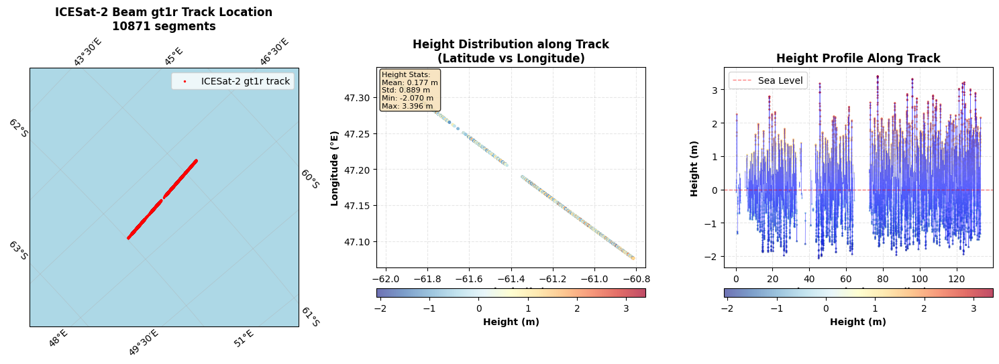

c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
C:\Users\xliu38\AppData\Local\Temp\ipykernel_20856\3454441454.py:140: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax_box.boxplot(box_data, vert=True, patch_artist=True,
c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


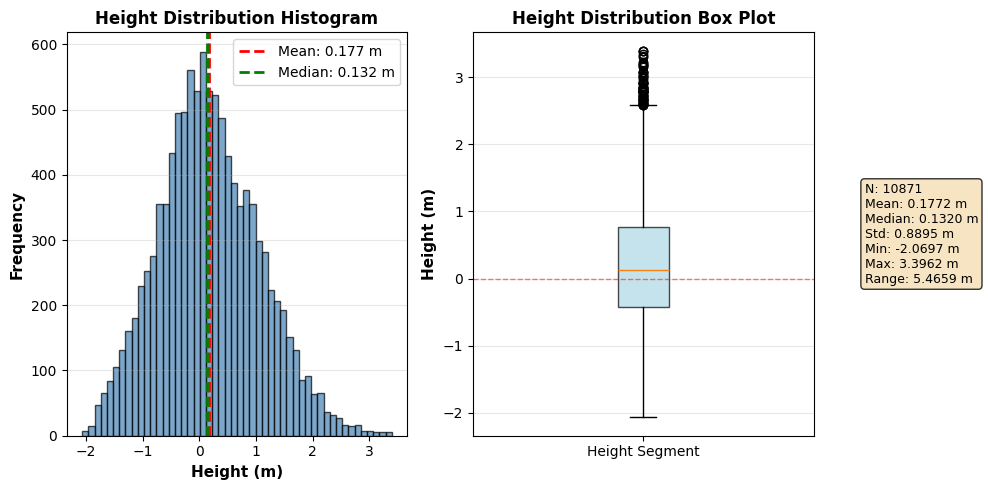

VISUALIZATION COMPLETE

Data Summary for Beam gt1r:
  Total segments: 10871
  Latitude range: [-61.986063, -60.813403]°N
  Longitude range: [47.076114, 47.329576]°E
  Height range: [-2.069694, 3.396236] m
  Along-track distance: ~133.19 km


In [6]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LinearSegmentedColormap
import numpy as np

# Extract the key variables from the previous cell
# (assuming key_vars dictionary still exists from previous cell)
# If not, we'll re-extract them

# Re-open the file and extract data
nc_file = nc.Dataset(segment_file, 'r')
main_group = nc_file.groups['1']
atl07_group = main_group.groups['ATL07']
beam = 'gt1r'
beam_group = atl07_group.groups[beam]
seg_group = beam_group.groups['sea_ice_segments']
heights_group = seg_group.groups['heights']

# Extract the three key variables
longitude = seg_group.variables['longitude'][:]
latitude = seg_group.variables['latitude'][:]
height = heights_group.variables['height_segment_height'][:]

nc_file.close()

# Create figure with subplots
fig = plt.figure(figsize=(15, 5))

# ============================================================================
# PLOT 1: Track Location on Antarctic Map
# ============================================================================
ax1 = fig.add_subplot(1, 3, 1, projection=ccrs.SouthPolarStereo())

# Set extent to focus on the data region with some buffer
lat_min, lat_max = latitude.min() - 1, latitude.max() + 1
lon_min, lon_max = longitude.min() - 1, longitude.max() + 1

ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# Add Antarctic features
ax1.add_feature(cfeature.LAND, facecolor='lightgray', zorder=1)
ax1.add_feature(cfeature.OCEAN, facecolor='lightblue', zorder=0)
ax1.add_feature(cfeature.COASTLINE, linewidth=0.5, zorder=2)
ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False,
              linewidth=0.5, alpha=0.5)

# Plot the track
scatter1 = ax1.scatter(longitude, latitude, c='red', s=2, 
                       transform=ccrs.PlateCarree(), zorder=3,
                       label='ICESat-2 gt1r track')

ax1.set_title(f'ICESat-2 Beam gt1r Track Location\n{len(latitude)} segments', 
              fontsize=12, fontweight='bold')
ax1.legend(loc='upper right')

# ============================================================================
# PLOT 2: Height Distribution along Track (Latitude)
# ============================================================================
ax2 = fig.add_subplot(1, 3, 2)

# Create color map based on height values
scatter2 = ax2.scatter(latitude, longitude, c=height, cmap='RdYlBu_r', 
                       s=10, edgecolors='none', alpha=0.7)

ax2.set_xlabel('Latitude (°N)', fontsize=10, fontweight='bold')
ax2.set_ylabel('Longitude (°E)', fontsize=10, fontweight='bold')
ax2.set_title('Height Distribution along Track\n(Latitude vs Longitude)', 
              fontsize=12, fontweight='bold')
ax2.grid(True, alpha=0.3, linestyle='--')

# Add colorbar
cbar2 = plt.colorbar(scatter2, ax=ax2, orientation='horizontal', 
                     pad=0.08, aspect=30)
cbar2.set_label('Height (m)', fontsize=10, fontweight='bold')

# Add statistics text
stats_text = f'Height Stats:\nMean: {np.mean(height):.3f} m\nStd: {np.std(height):.3f} m\nMin: {np.min(height):.3f} m\nMax: {np.max(height):.3f} m'
ax2.text(0.02, 0.98, stats_text, transform=ax2.transAxes,
         verticalalignment='top', fontsize=8,
         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

# ============================================================================
# PLOT 3: Height Profile along Track
# ============================================================================
ax3 = fig.add_subplot(1, 3, 3)

# Calculate along-track distance (approximate)
from scipy.spatial.distance import cdist
coords = np.column_stack([latitude, longitude])
distances = np.zeros(len(coords))
for i in range(1, len(coords)):
    distances[i] = distances[i-1] + np.linalg.norm(coords[i] - coords[i-1])

# Convert to kilometers (approximate)
distances_km = distances * 111  # 1 degree ≈ 111 km

# Plot height profile
ax3.plot(distances_km, height, 'b-', linewidth=0.5, alpha=0.6)
ax3.scatter(distances_km, height, c=height, cmap='RdYlBu_r', 
           s=5, edgecolors='none', alpha=0.8)

ax3.set_xlabel('Along-track Distance (km)', fontsize=10, fontweight='bold')
ax3.set_ylabel('Height (m)', fontsize=10, fontweight='bold')
ax3.set_title('Height Profile Along Track', fontsize=12, fontweight='bold')
ax3.grid(True, alpha=0.3, linestyle='--')
ax3.axhline(y=0, color='r', linestyle='--', linewidth=1, alpha=0.5, label='Sea Level')
ax3.legend(loc='best')

# Add colorbar
cbar3 = plt.colorbar(scatter2, ax=ax3, orientation='horizontal', 
                     pad=0.08, aspect=30)
cbar3.set_label('Height (m)', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

# ============================================================================
# ADDITIONAL ANALYSIS: Height Distribution Histogram
# ============================================================================
fig2, axes = plt.subplots(1, 2, figsize=(10, 5))

# Histogram of heights
ax_hist = axes[0]
n, bins, patches = ax_hist.hist(height, bins=50, color='steelblue', 
                                 edgecolor='black', alpha=0.7)
ax_hist.set_xlabel('Height (m)', fontsize=11, fontweight='bold')
ax_hist.set_ylabel('Frequency', fontsize=11, fontweight='bold')
ax_hist.set_title('Height Distribution Histogram', fontsize=12, fontweight='bold')
ax_hist.grid(True, alpha=0.3, axis='y')
ax_hist.axvline(x=np.mean(height), color='red', linestyle='--', 
                linewidth=2, label=f'Mean: {np.mean(height):.3f} m')
ax_hist.axvline(x=np.median(height), color='green', linestyle='--', 
                linewidth=2, label=f'Median: {np.median(height):.3f} m')
ax_hist.legend()

# Box plot
ax_box = axes[1]
box_data = [height]
bp = ax_box.boxplot(box_data, vert=True, patch_artist=True, 
                     labels=['Height Segment'])
bp['boxes'][0].set_facecolor('lightblue')
bp['boxes'][0].set_alpha(0.7)
ax_box.set_ylabel('Height (m)', fontsize=11, fontweight='bold')
ax_box.set_title('Height Distribution Box Plot', fontsize=12, fontweight='bold')
ax_box.grid(True, alpha=0.3, axis='y')
ax_box.axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=0.5)

# Add statistics
stats_text2 = f'N: {len(height)}\nMean: {np.mean(height):.4f} m\nMedian: {np.median(height):.4f} m\nStd: {np.std(height):.4f} m\nMin: {np.min(height):.4f} m\nMax: {np.max(height):.4f} m\nRange: {np.max(height)-np.min(height):.4f} m'
ax_box.text(1.15, 0.5, stats_text2, transform=ax_box.transAxes,
            verticalalignment='center', fontsize=9,
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

plt.tight_layout()
plt.show()

print("=" * 80)
print("VISUALIZATION COMPLETE")
print("=" * 80)
print(f"\nData Summary for Beam gt1r:")
print(f"  Total segments: {len(height)}")
print(f"  Latitude range: [{latitude.min():.6f}, {latitude.max():.6f}]°N")
print(f"  Longitude range: [{longitude.min():.6f}, {longitude.max():.6f}]°E")
print(f"  Height range: [{height.min():.6f}, {height.max():.6f}] m")
print(f"  Along-track distance: ~{distances_km[-1]:.2f} km")

## 8. Visualise All Six ICESat-2 Beams and Comparative Statistical Analysis

Compare all six ICESat-2 beams (gt1l, gt1r, gt2l, gt2r, gt3l, gt3r) with comprehensive spatial visualization and statistical analysis for scientific publication.

EXTRACTING DATA FROM ALL SIX BEAMS
✓ gt1l: 10757 segments
✓ gt1r: 10871 segments
✓ gt2l: 5804 segments
✓ gt2r: 5964 segments
✓ gt3l: 5450 segments
✓ gt3r: 5579 segments

CREATING SPATIAL VISUALIZATION


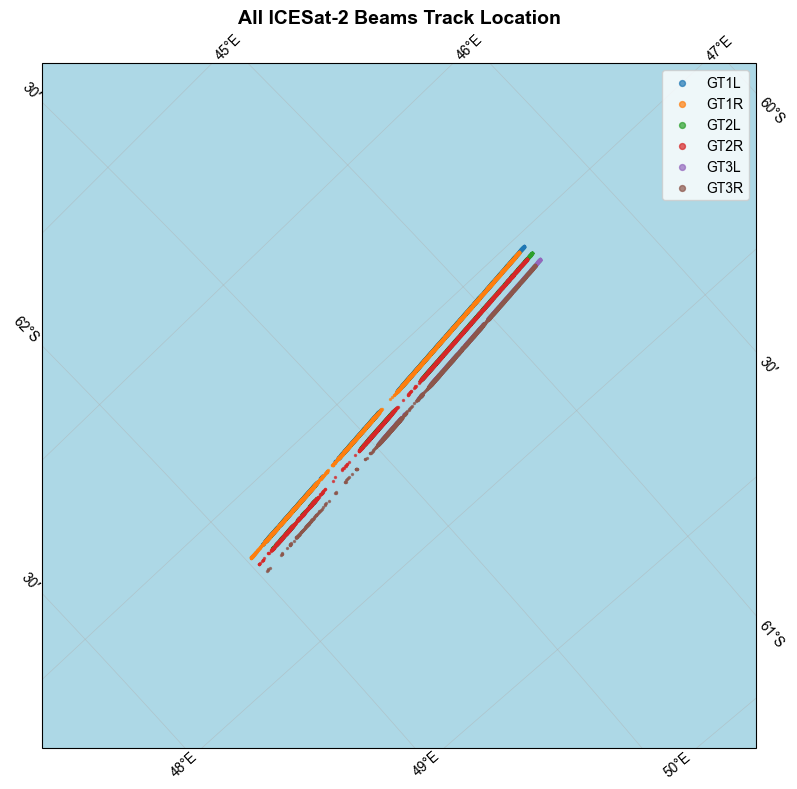

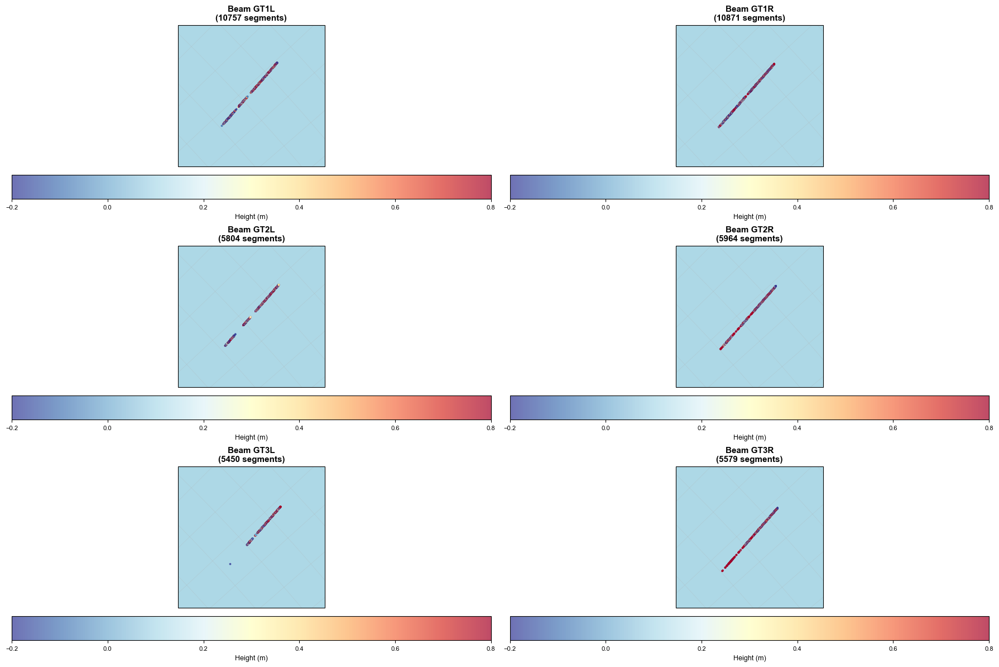


Creating height profile comparison...


c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\_methods.py:135: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\_methods.py:171: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


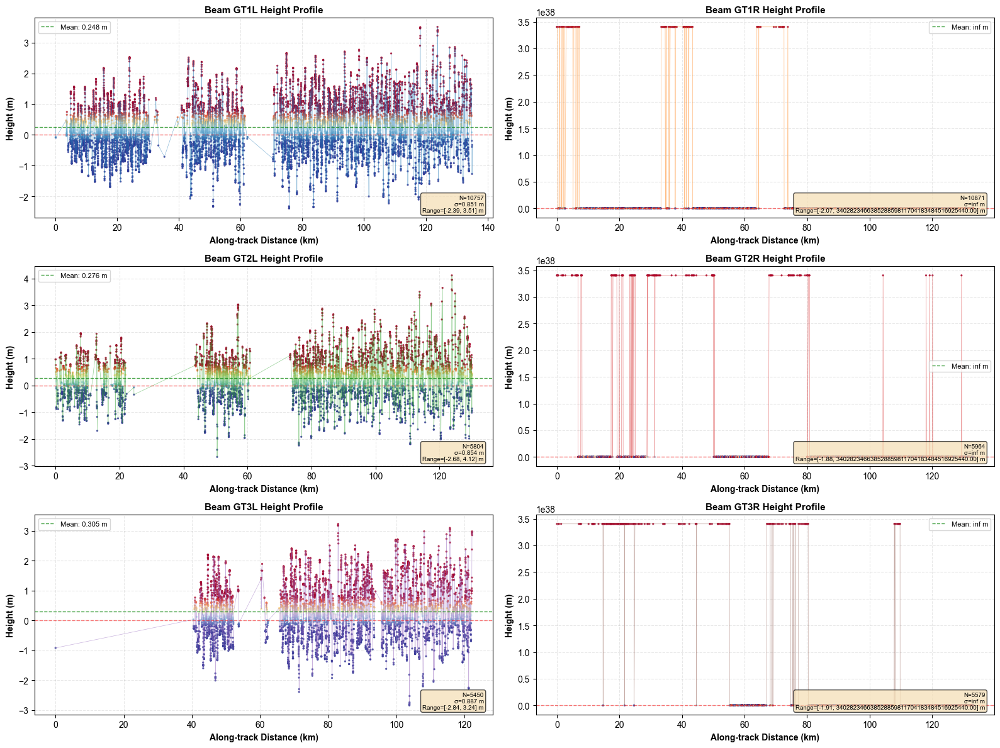


Creating statistical comparison plots...


C:\Users\xliu38\AppData\Local\Temp\ipykernel_17344\2153994173.py:189: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax1.boxplot(height_data, labels=beam_groups, patch_artist=True,
c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\_methods.py:135: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\_methods.py:135: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\function_base.py:162: RuntimeWarning: overflow encountered in multiply
 

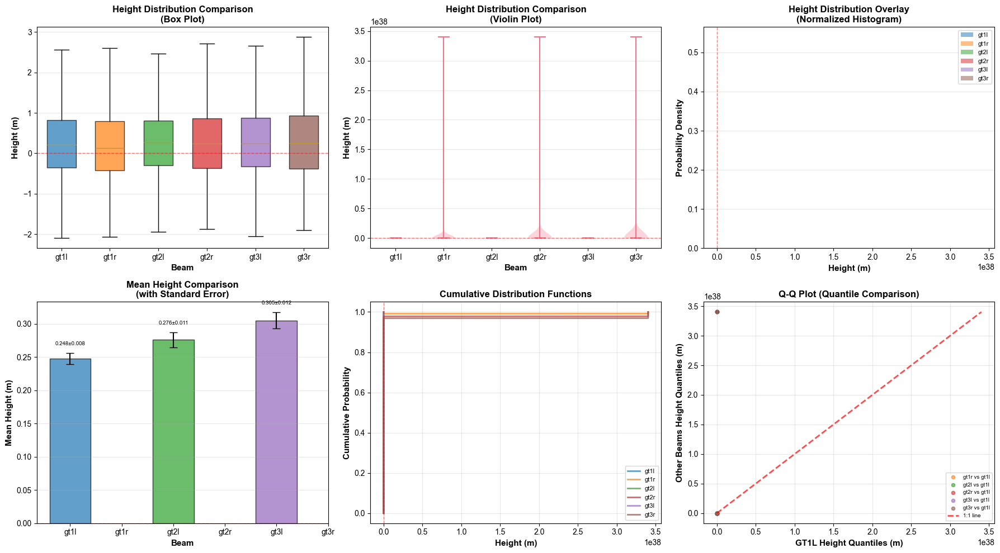


COMPREHENSIVE STATISTICAL ANALYSIS

Beam     N  Mean (m)  Median (m)  Std Dev (m)  Std Error (m)   Min (m)      Max (m)    Range (m)   Q25 (m)  Q75 (m)  IQR (m)  Skewness  Kurtosis     CV (%)
GT1L 10757  0.247586    0.209683     0.850640       0.008202 -2.387705 3.508846e+00 5.896551e+00 -0.349339 0.818160 1.167499  0.188799  0.043982 343.573975
GT1R 10871       inf    0.132013          inf            inf -2.069694 3.402823e+38 3.402823e+38 -0.425579 0.791917 1.217495       NaN       NaN        NaN
GT2L  5804  0.275963    0.269121     0.853766       0.011208 -2.676715 4.118128e+00 6.794843e+00 -0.294714 0.813076 1.107791  0.208129  0.429926 309.376678
GT2R  5964       inf    0.247025          inf            inf -1.876644 3.402823e+38 3.402823e+38 -0.366832 0.869210 1.236041       NaN       NaN        NaN
GT3L  5450  0.304939    0.243069     0.887485       0.012023 -2.844438 3.236582e+00 6.081019e+00 -0.321357 0.871530 1.192887  0.225624 -0.062879 291.037048
GT3R  5579       inf    0.2

c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\_methods.py:135: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\_methods.py:171: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
C:\Users\xliu38\AppData\Local\Temp\ipykernel_17344\2153994173.py:337: RuntimeWarning: invalid value encountered in scalar divide
  'CV (%)': (np.std(valid_heights) / np.mean(valid_heights)) * 100
c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\_methods.py:135: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
c:\Users\xliu38\OneDrive - University of Tasmania\PhD_ma

In [6]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns

# Set publication-quality plot style
plt.rcParams['font.size'] = 10
plt.rcParams['font.family'] = 'Arial'
sns.set_palette("husl")

# Re-open the file and extract data from all beams
nc_file = nc.Dataset(segment_file, 'r')
main_group = nc_file.groups['1']
atl07_group = main_group.groups['ATL07']

# Get all beam groups
beam_groups = [key for key in atl07_group.groups.keys() if key.startswith('gt')]
beam_groups.sort()  # Ensure consistent ordering

print("=" * 80)
print("EXTRACTING DATA FROM ALL SIX BEAMS")
print("=" * 80)

# Dictionary to store all beam data
all_beams_data = {}
beam_colors = {
    'gt1l': '#1f77b4',  # Blue
    'gt1r': '#ff7f0e',  # Orange
    'gt2l': '#2ca02c',  # Green
    'gt2r': '#d62728',  # Red
    'gt3l': '#9467bd',  # Purple
    'gt3r': '#8c564b'   # Brown
}

for beam in beam_groups:
    beam_group = atl07_group.groups[beam]
    seg_group = beam_group.groups['sea_ice_segments']
    heights_group = seg_group.groups['heights']
    
    # Create writable copies of the arrays
    all_beams_data[beam] = {
        'longitude': np.array(seg_group.variables['longitude'][:]),
        'latitude': np.array(seg_group.variables['latitude'][:]),
        'height': np.array(heights_group.variables['height_segment_height'][:]),
        'height_confidence': np.array(heights_group.variables['height_segment_confidence'][:]),
        'quality_flag': np.array(heights_group.variables['height_segment_quality'][:]),
        'ssh_flag': np.array(heights_group.variables['height_segment_ssh_flag'][:]),
        'segment_length': np.array(heights_group.variables['height_segment_length_seg'][:]),
        'n_photons': np.array(heights_group.variables['height_segment_n_pulse_seg'][:])
    }
    
    print(f"✓ {beam}: {len(all_beams_data[beam]['height'])} segments")

nc_file.close()

# ============================================================================
# FIGURE 1: SPATIAL DISTRIBUTION OF ALL BEAMS ON ANTARCTIC MAP
# ============================================================================
print("\n" + "=" * 80)
print("CREATING SPATIAL VISUALIZATION")
print("=" * 80)

# Calculate global extent for all beams
all_lats = np.concatenate([all_beams_data[beam]['latitude'] for beam in beam_groups])
all_lons = np.concatenate([all_beams_data[beam]['longitude'] for beam in beam_groups])
lat_min, lat_max = all_lats.min() - 0.5, all_lats.max() + 0.5
lon_min, lon_max = all_lons.min() - 0.5, all_lons.max() + 0.5

# Create separate figure for overview map
fig1a = plt.figure(figsize=(10, 8))
ax_overview = fig1a.add_subplot(1, 1, 1, projection=ccrs.SouthPolarStereo())
ax_overview.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
ax_overview.add_feature(cfeature.LAND, facecolor='lightgray', zorder=1)
ax_overview.add_feature(cfeature.OCEAN, facecolor='lightblue', zorder=0)
ax_overview.add_feature(cfeature.COASTLINE, linewidth=0.5, zorder=2)
ax_overview.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False,
                      linewidth=0.5, alpha=0.5)

for beam in beam_groups:
    ax_overview.scatter(all_beams_data[beam]['longitude'], 
                        all_beams_data[beam]['latitude'],
                        c=beam_colors[beam], s=2, alpha=0.7,
                        transform=ccrs.PlateCarree(), label=beam.upper(), zorder=3)

ax_overview.set_title('All ICESat-2 Beams Track Location', fontsize=14, fontweight='bold')
ax_overview.legend(loc='upper right', fontsize=10, markerscale=3)

plt.tight_layout()
plt.show()

# Create separate figure for individual beam height distributions (3x2 grid)
fig1b = plt.figure(figsize=(18, 12))

for idx, beam in enumerate(beam_groups, start=1):
    ax = fig1b.add_subplot(3, 2, idx, projection=ccrs.SouthPolarStereo())
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=1)
    ax.add_feature(cfeature.OCEAN, facecolor='lightblue', zorder=0)
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5, zorder=2)
    ax.gridlines(draw_labels=False, linewidth=0.3, alpha=0.5)
    
    scatter = ax.scatter(all_beams_data[beam]['longitude'],
                        all_beams_data[beam]['latitude'],
                        c=all_beams_data[beam]['height'],
                        cmap='RdYlBu_r', s=3, alpha=0.7,
                        transform=ccrs.PlateCarree(), zorder=3,
                        vmin=-0.2, vmax=0.8)
    
    ax.set_title(f'Beam {beam.upper()}\n({len(all_beams_data[beam]["height"])} segments)',
                fontsize=11, fontweight='bold')
    
    # Add colorbar
    cbar = plt.colorbar(scatter, ax=ax, orientation='horizontal', pad=0.05, aspect=20)
    cbar.set_label('Height (m)', fontsize=9)
    cbar.ax.tick_params(labelsize=8)

plt.tight_layout()
plt.show()

# ============================================================================
# FIGURE 2: HEIGHT PROFILES FOR ALL BEAMS
# ============================================================================
print("\nCreating height profile comparison...")

fig2, axes = plt.subplots(3, 2, figsize=(16, 12))
axes = axes.flatten()

for idx, beam in enumerate(beam_groups):
    ax = axes[idx]
    
    # Calculate along-track distance
    coords = np.column_stack([all_beams_data[beam]['latitude'], 
                              all_beams_data[beam]['longitude']])
    distances = np.zeros(len(coords))
    for i in range(1, len(coords)):
        distances[i] = distances[i-1] + np.linalg.norm(coords[i] - coords[i-1])
    distances_km = distances * 111
    
    # Plot height profile
    ax.plot(distances_km, all_beams_data[beam]['height'], 
           color=beam_colors[beam], linewidth=0.5, alpha=0.5)
    scatter = ax.scatter(distances_km, all_beams_data[beam]['height'],
                        c=all_beams_data[beam]['height'], cmap='RdYlBu_r',
                        s=2, alpha=0.7, vmin=-0.2, vmax=0.8)
    
    ax.axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=0.5)
    ax.axhline(y=np.mean(all_beams_data[beam]['height']), 
              color='green', linestyle='--', linewidth=1, alpha=0.7,
              label=f'Mean: {np.mean(all_beams_data[beam]["height"]):.3f} m')
    
    ax.set_xlabel('Along-track Distance (km)', fontsize=10, fontweight='bold')
    ax.set_ylabel('Height (m)', fontsize=10, fontweight='bold')
    ax.set_title(f'Beam {beam.upper()} Height Profile', 
                fontsize=11, fontweight='bold')
    ax.grid(True, alpha=0.3, linestyle='--')
    ax.legend(loc='best', fontsize=8)
    
    # Add statistics box
    stats_text = f'N={len(all_beams_data[beam]["height"])}\n'
    stats_text += f'σ={np.std(all_beams_data[beam]["height"]):.3f} m\n'
    stats_text += f'Range=[{np.min(all_beams_data[beam]["height"]):.2f}, '
    stats_text += f'{np.max(all_beams_data[beam]["height"]):.2f}] m'
    ax.text(0.98, 0.02, stats_text, transform=ax.transAxes,
            verticalalignment='bottom', horizontalalignment='right',
            fontsize=7, bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))

plt.tight_layout()
plt.show()

# ============================================================================
# FIGURE 3: STATISTICAL COMPARISON
# ============================================================================
print("\nCreating statistical comparison plots...")

fig3 = plt.figure(figsize=(18, 10))

# Prepare data for statistical analysis
height_data = [all_beams_data[beam]['height'] for beam in beam_groups]
df_stats = pd.DataFrame()

for beam in beam_groups:
    df_stats[beam] = pd.Series(all_beams_data[beam]['height'])

# Plot 1: Box plot comparison
ax1 = fig3.add_subplot(2, 3, 1)
bp = ax1.boxplot(height_data, labels=beam_groups, patch_artist=True,
                 showfliers=False, widths=0.6)
for patch, beam in zip(bp['boxes'], beam_groups):
    patch.set_facecolor(beam_colors[beam])
    patch.set_alpha(0.7)

ax1.set_ylabel('Height (m)', fontsize=11, fontweight='bold')
ax1.set_xlabel('Beam', fontsize=11, fontweight='bold')
ax1.set_title('Height Distribution Comparison\n(Box Plot)', 
             fontsize=12, fontweight='bold')
ax1.grid(True, alpha=0.3, axis='y')
ax1.axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=0.5)

# Plot 2: Violin plot
ax2 = fig3.add_subplot(2, 3, 2)
parts = ax2.violinplot(height_data, positions=range(1, len(beam_groups)+1),
                       showmeans=True, showmedians=True)
ax2.set_xticks(range(1, len(beam_groups)+1))
ax2.set_xticklabels(beam_groups)
ax2.set_ylabel('Height (m)', fontsize=11, fontweight='bold')
ax2.set_xlabel('Beam', fontsize=11, fontweight='bold')
ax2.set_title('Height Distribution Comparison\n(Violin Plot)',
             fontsize=12, fontweight='bold')
ax2.grid(True, alpha=0.3, axis='y')
ax2.axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=0.5)

# Plot 3: Histogram overlay
ax3 = fig3.add_subplot(2, 3, 3)
for beam in beam_groups:
    ax3.hist(all_beams_data[beam]['height'], bins=50, alpha=0.5,
            label=beam, color=beam_colors[beam], density=True)
ax3.set_xlabel('Height (m)', fontsize=11, fontweight='bold')
ax3.set_ylabel('Probability Density', fontsize=11, fontweight='bold')
ax3.set_title('Height Distribution Overlay\n(Normalized Histogram)',
             fontsize=12, fontweight='bold')
ax3.legend(loc='best', fontsize=8)
ax3.grid(True, alpha=0.3, axis='y')
ax3.axvline(x=0, color='red', linestyle='--', linewidth=1, alpha=0.5)

# Plot 4: Mean height comparison with error bars
ax4 = fig3.add_subplot(2, 3, 4)
means = [np.mean(all_beams_data[beam]['height']) for beam in beam_groups]
stds = [np.std(all_beams_data[beam]['height']) for beam in beam_groups]
sems = [stats.sem(all_beams_data[beam]['height']) for beam in beam_groups]

x_pos = np.arange(len(beam_groups))
bars = ax4.bar(x_pos, means, yerr=sems, capsize=5, alpha=0.7,
              color=[beam_colors[beam] for beam in beam_groups],
              edgecolor='black', linewidth=1)

ax4.set_xticks(x_pos)
ax4.set_xticklabels(beam_groups)
ax4.set_ylabel('Mean Height (m)', fontsize=11, fontweight='bold')
ax4.set_xlabel('Beam', fontsize=11, fontweight='bold')
ax4.set_title('Mean Height Comparison\n(with Standard Error)',
             fontsize=12, fontweight='bold')
ax4.grid(True, alpha=0.3, axis='y')
ax4.axhline(y=0, color='red', linestyle='--', linewidth=1, alpha=0.5)

# Add value labels on bars
for i, (mean, sem) in enumerate(zip(means, sems)):
    ax4.text(i, mean + sem + 0.01, f'{mean:.3f}±{sem:.3f}',
            ha='center', va='bottom', fontsize=7)

# Plot 5: Cumulative distribution functions
ax5 = fig3.add_subplot(2, 3, 5)
for beam in beam_groups:
    sorted_data = np.sort(all_beams_data[beam]['height'])
    cumulative = np.arange(1, len(sorted_data) + 1) / len(sorted_data)
    ax5.plot(sorted_data, cumulative, label=beam, 
            color=beam_colors[beam], linewidth=2, alpha=0.7)

ax5.set_xlabel('Height (m)', fontsize=11, fontweight='bold')
ax5.set_ylabel('Cumulative Probability', fontsize=11, fontweight='bold')
ax5.set_title('Cumulative Distribution Functions',
             fontsize=12, fontweight='bold')
ax5.legend(loc='best', fontsize=8)
ax5.grid(True, alpha=0.3)
ax5.axvline(x=0, color='red', linestyle='--', linewidth=1, alpha=0.5)

# Plot 6: Q-Q plot (comparing distributions)
ax6 = fig3.add_subplot(2, 3, 6)
reference_beam = beam_groups[0]  # Use gt1l as reference

# Calculate reference quantiles with writable array
ref_data = all_beams_data[reference_beam]['height'].copy()
ref_quantiles = np.percentile(ref_data, np.linspace(0, 100, 100))

for beam in beam_groups[1:]:
    # Calculate beam quantiles with writable array
    beam_data = all_beams_data[beam]['height'].copy()
    beam_quantiles = np.percentile(beam_data, np.linspace(0, 100, 100))
    ax6.scatter(ref_quantiles, beam_quantiles, alpha=0.6, s=20,
               label=f'{beam} vs {reference_beam}', color=beam_colors[beam])

# Add 1:1 line - using numpy min/max directly
all_quantile_values = [ref_quantiles]
for beam in beam_groups[1:]:
    beam_data = all_beams_data[beam]['height'].copy()
    all_quantile_values.append(np.percentile(beam_data, np.linspace(0, 100, 100)))

all_quantiles = np.concatenate(all_quantile_values)
min_val = np.min(all_quantiles)
max_val = np.max(all_quantiles)

ax6.plot([min_val, max_val], [min_val, max_val], 'r--', linewidth=2, alpha=0.7, label='1:1 line')

ax6.set_xlabel(f'{reference_beam.upper()} Height Quantiles (m)', 
              fontsize=11, fontweight='bold')
ax6.set_ylabel('Other Beams Height Quantiles (m)', 
              fontsize=11, fontweight='bold')
ax6.set_title('Q-Q Plot (Quantile Comparison)',
             fontsize=12, fontweight='bold')
ax6.legend(loc='best', fontsize=7)
ax6.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================================================
# STATISTICAL ANALYSIS TABLE
# ============================================================================
print("\n" + "=" * 80)
print("COMPREHENSIVE STATISTICAL ANALYSIS")
print("=" * 80)

# Create comprehensive statistics table
stats_table = []

for beam in beam_groups:
    heights = all_beams_data[beam]['height']
    valid_heights = heights[~np.isnan(heights)]
    
    stats_dict = {
        'Beam': beam.upper(),
        'N': len(valid_heights),
        'Mean (m)': np.mean(valid_heights),
        'Median (m)': np.median(valid_heights),
        'Std Dev (m)': np.std(valid_heights),
        'Std Error (m)': stats.sem(valid_heights),
        'Min (m)': np.min(valid_heights),
        'Max (m)': np.max(valid_heights),
        'Range (m)': np.max(valid_heights) - np.min(valid_heights),
        'Q25 (m)': np.percentile(valid_heights, 25),
        'Q75 (m)': np.percentile(valid_heights, 75),
        'IQR (m)': np.percentile(valid_heights, 75) - np.percentile(valid_heights, 25),
        'Skewness': stats.skew(valid_heights),
        'Kurtosis': stats.kurtosis(valid_heights),
        'CV (%)': (np.std(valid_heights) / np.mean(valid_heights)) * 100
    }
    stats_table.append(stats_dict)

df_stats_table = pd.DataFrame(stats_table)
print("\n" + df_stats_table.to_string(index=False))

# Save to CSV
df_stats_table.to_csv('icesat2_beams_statistics.csv', index=False)
print("\n✓ Statistics table saved to 'icesat2_beams_statistics.csv'")

# ============================================================================
# ANOVA and POST-HOC TESTS
# ============================================================================
print("\n" + "=" * 80)
print("STATISTICAL SIGNIFICANCE TESTS")
print("=" * 80)

# One-way ANOVA
f_stat, p_value = stats.f_oneway(*height_data)
print(f"\nOne-way ANOVA:")
print(f"  F-statistic: {f_stat:.4f}")
print(f"  p-value: {p_value:.4e}")
if p_value < 0.05:
    print(f"  Result: Significant differences exist between beams (p < 0.05)")
else:
    print(f"  Result: No significant differences between beams (p >= 0.05)")

# Kruskal-Wallis H-test (non-parametric alternative)
h_stat, p_value_kw = stats.kruskal(*height_data)
print(f"\nKruskal-Wallis H-test:")
print(f"  H-statistic: {h_stat:.4f}")
print(f"  p-value: {p_value_kw:.4e}")

# Pairwise comparisons (t-tests with Bonferroni correction)
print(f"\nPairwise T-tests (with Bonferroni correction):")
n_comparisons = len(beam_groups) * (len(beam_groups) - 1) // 2
alpha_corrected = 0.05 / n_comparisons
print(f"  Corrected α = {alpha_corrected:.4f}")
print(f"\n  {'Beam 1':<8} {'Beam 2':<8} {'t-stat':<12} {'p-value':<12} {'Significant'}")
print("  " + "-" * 60)

for i, beam1 in enumerate(beam_groups):
    for beam2 in beam_groups[i+1:]:
        t_stat, p_val = stats.ttest_ind(all_beams_data[beam1]['height'],
                                        all_beams_data[beam2]['height'])
        significant = "Yes" if p_val < alpha_corrected else "No"
        print(f"  {beam1.upper():<8} {beam2.upper():<8} {t_stat:<12.4f} "
              f"{p_val:<12.4e} {significant}")

# ============================================================================
# SUMMARY REPORT
# ============================================================================
print("\n" + "=" * 80)
print("SUMMARY REPORT")
print("=" * 80)

total_segments = sum(len(all_beams_data[beam]['height']) for beam in beam_groups)
all_heights = np.concatenate([all_beams_data[beam]['height'] for beam in beam_groups])

print(f"\nOverall Statistics:")
print(f"  Total segments across all beams: {total_segments}")
print(f"  Combined mean height: {np.mean(all_heights):.4f} m")
print(f"  Combined std dev: {np.std(all_heights):.4f} m")
print(f"  Combined median: {np.median(all_heights):.4f} m")
print(f"  Global height range: [{np.min(all_heights):.4f}, {np.max(all_heights):.4f}] m")

print("\n" + "=" * 80)
print("ANALYSIS COMPLETE")
print("=" * 80)

## 8. Extract and Analyze Key ATL07 Variables Following ICESat-2 Hackweek Methodology

Adapt the ICESat-2 Hackweek approach to extract and analyse key ATL07 variables for beam gt1l, focusing on sea ice segment heights, quality indicators, and geophysical corrections.

**Key Variables to Extract:**
- **Main:** latitude, longitude, delta_time, seg_dist_x
- **Heights:** height_segment_height, height_segment_confidence, height_segment_type, height_segment_ssh_flag, height_segment_w_gaussian
- **Stats:** photon_rate, cloud_flag_asr
- **Geophysical:** height_segment_lpe, height_segment_mss, height_segment_ocean, height_segment_ib

**Reference:** ICESat-2 Hackweek ATL07 Tutorial (https://github.com/ICESAT-2HackWeek/sea-ice-tutorials)

ICESat-2 ATL07 QUALITY METRICS VISUALIZATION (HACKWEEK STYLE)

Processing beam GT1L...


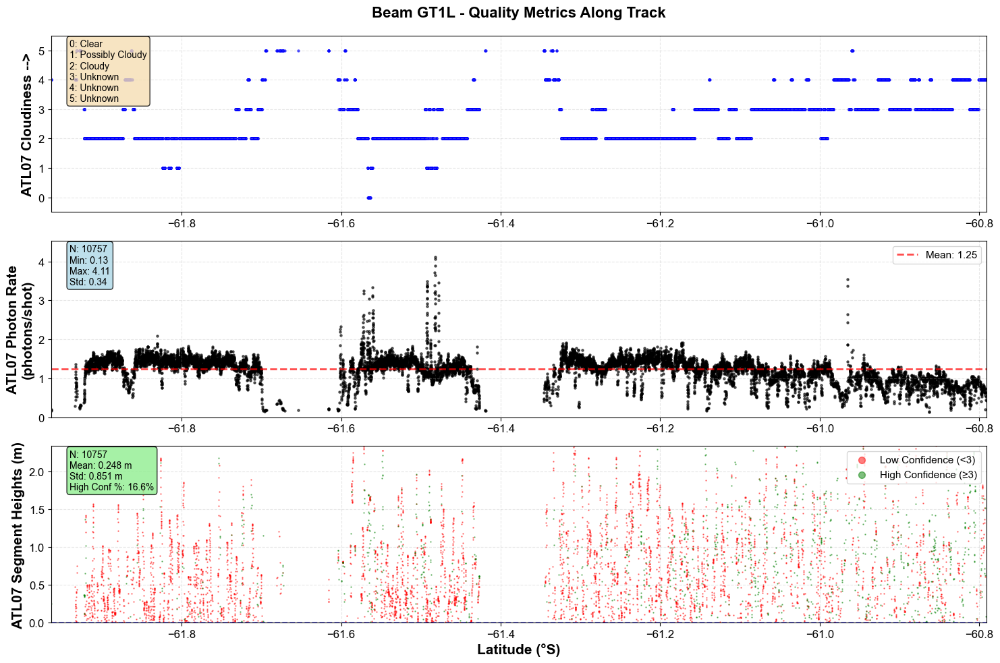


  Beam GT1L Summary:
    Total segments: 10757
    Clear sky segments: 49 (0.5%)
    Mean photon rate: 1.25 photons/shot
    High confidence segments: 1791 (16.6%)
    Mean height: 0.248 m

Processing beam GT1R...


C:\Users\xliu38\AppData\Local\Temp\ipykernel_14932\4056401393.py:75: RuntimeWarning: overflow encountered in scalar multiply
  y_max = min(20, max_pr * 1.1) if max_pr > 0 else 20
c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


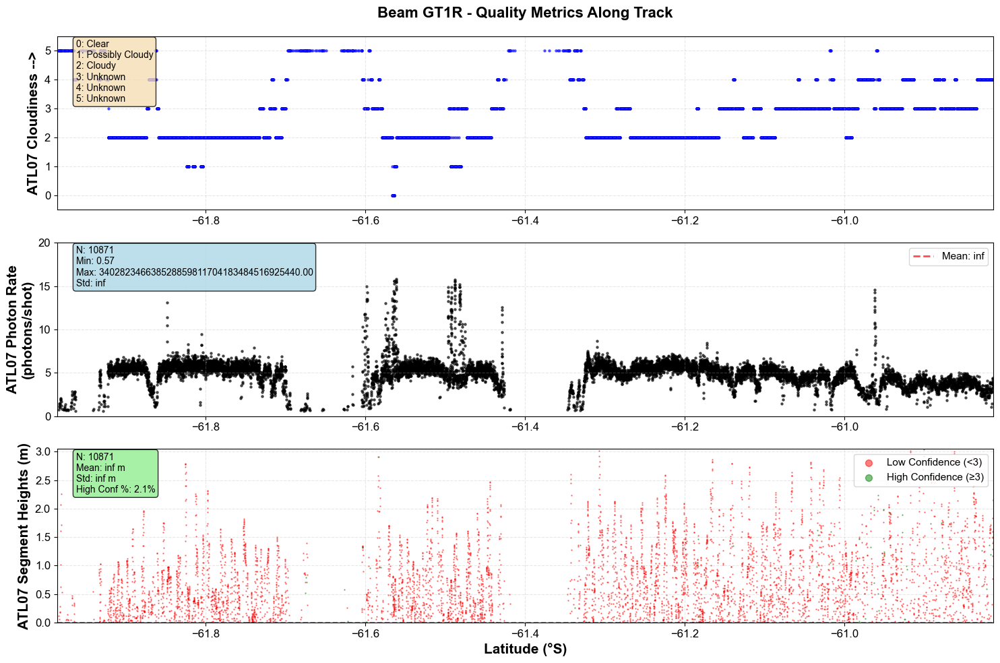


  Beam GT1R Summary:
    Total segments: 10871
    Clear sky segments: 44 (0.4%)
    Mean photon rate: inf photons/shot
    High confidence segments: 226 (2.1%)
    Mean height: inf m

Processing beam GT2L...


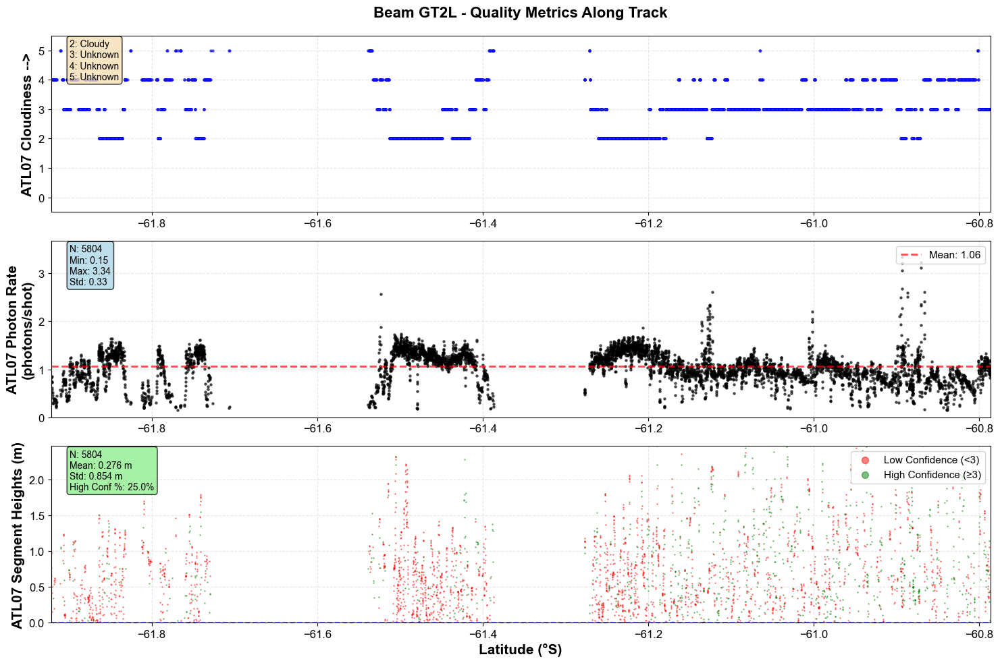


  Beam GT2L Summary:
    Total segments: 5804
    Clear sky segments: 0 (0.0%)
    Mean photon rate: 1.06 photons/shot
    High confidence segments: 1450 (25.0%)
    Mean height: 0.276 m

Processing beam GT2R...


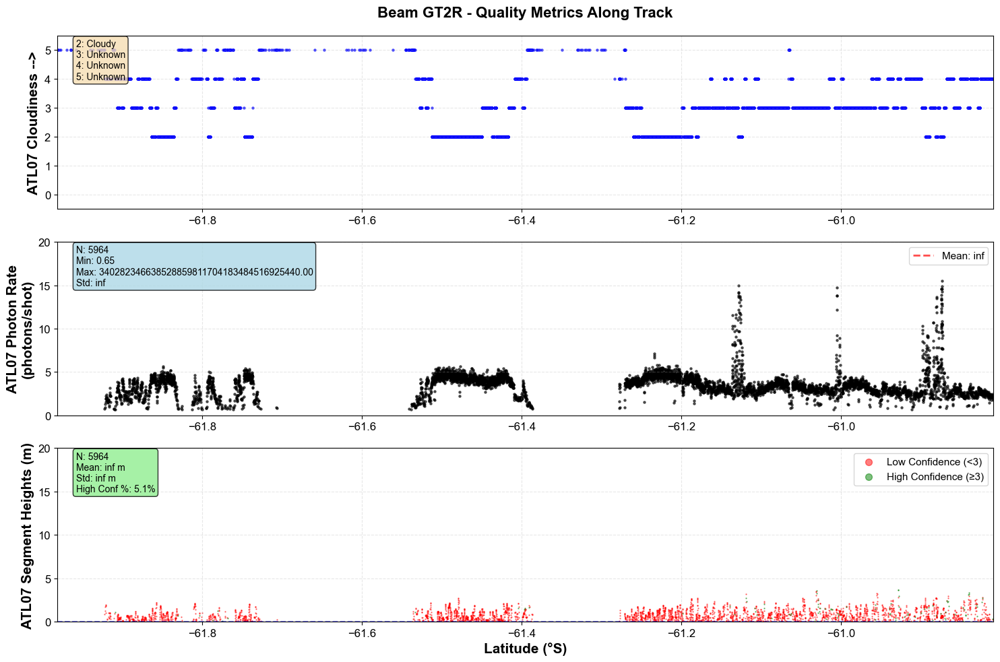


  Beam GT2R Summary:
    Total segments: 5964
    Clear sky segments: 0 (0.0%)
    Mean photon rate: inf photons/shot
    High confidence segments: 304 (5.1%)
    Mean height: inf m

Processing beam GT3L...


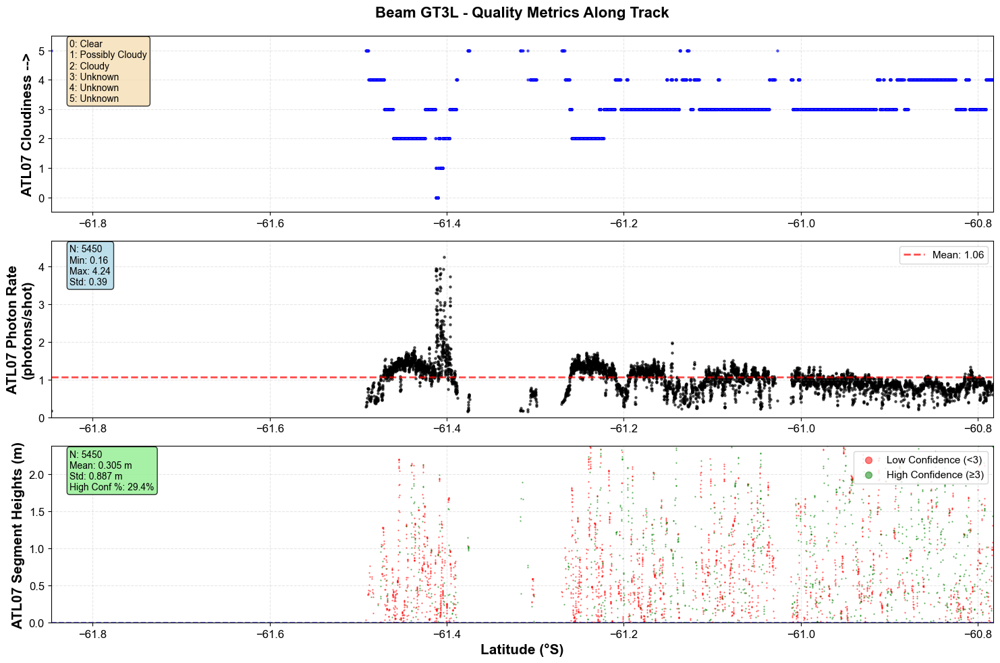


  Beam GT3L Summary:
    Total segments: 5450
    Clear sky segments: 46 (0.8%)
    Mean photon rate: 1.06 photons/shot
    High confidence segments: 1603 (29.4%)
    Mean height: 0.305 m

Processing beam GT3R...


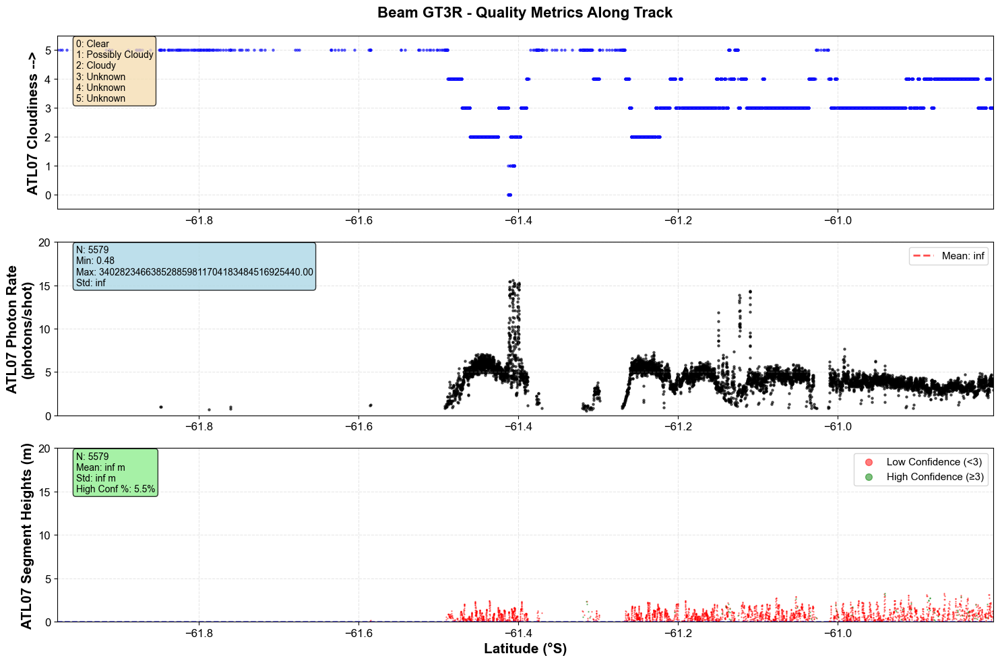


  Beam GT3R Summary:
    Total segments: 5579
    Clear sky segments: 44 (0.8%)
    Mean photon rate: inf photons/shot
    High confidence segments: 305 (5.5%)
    Mean height: inf m

HACKWEEK-STYLE VISUALIZATION COMPLETE FOR ALL BEAMS


In [11]:
# ============================================================================
# ICESat-2 Hackweek-Style Quality Metrics Visualization
# Adapted for CRYO2ICE ATL07 Product - All Six Beams
# ============================================================================

import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc

# Set publication-quality plot style
plt.rcParams['font.size'] = 12
plt.rcParams['font.family'] = 'Arial'

# Re-open the file and extract data from all beams
nc_file = nc.Dataset(segment_file, 'r')
main_group = nc_file.groups['1']
atl07_group = main_group.groups['ATL07']

# Get all beam groups
beam_groups = [key for key in atl07_group.groups.keys() if key.startswith('gt')]
beam_groups.sort()

print("=" * 80)
print("ICESat-2 ATL07 QUALITY METRICS VISUALIZATION (HACKWEEK STYLE)")
print("=" * 80)

# Create separate figures for each beam
for beam in beam_groups:
    print(f"\nProcessing beam {beam.upper()}...")
    
    beam_group = atl07_group.groups[beam]
    seg_group = beam_group.groups['sea_ice_segments']
    heights_group = seg_group.groups['heights']
    stats_group = seg_group.groups['stats']
    
    # Extract key variables as writable numpy arrays
    latitude = np.array(seg_group.variables['latitude'][:])
    cloud_flag = np.array(stats_group.variables['cloud_flag_asr'][:])
    photon_rate = np.array(stats_group.variables['photon_rate'][:])
    height_segment_height = np.array(heights_group.variables['height_segment_height'][:])
    height_confidence = np.array(heights_group.variables['height_segment_confidence'][:])
    
    # Create figure with 3 subplots (Hackweek style)
    fig, ax = plt.subplots(3, 1, figsize=(15, 10))
    
    # ========================================================================
    # SUBPLOT 1: ATL07 Cloudiness vs Latitude
    # ========================================================================
    ax[0].scatter(latitude, cloud_flag, s=5, c='b', alpha=0.6)
    ax[0].set_ylabel('ATL07 Cloudiness -->', fontsize=15, fontweight='bold')
    ax[0].set_xlim(np.nanmin(latitude), np.nanmax(latitude))
    ax[0].set_ylim(-0.5, np.nanmax(cloud_flag) + 0.5)
    ax[0].grid(True, alpha=0.3, linestyle='--')
    ax[0].set_title(f'Beam {beam.upper()} - Quality Metrics Along Track', 
                    fontsize=16, fontweight='bold', pad=20)
    
    # Add cloud flag legend
    cloud_labels = {0: 'Clear', 1: 'Possibly Cloudy', 2: 'Cloudy'}
    unique_clouds = np.unique(cloud_flag[~np.isnan(cloud_flag)])
    legend_text = '\n'.join([f'{int(c)}: {cloud_labels.get(int(c), "Unknown")}' 
                            for c in unique_clouds if not np.isnan(c)])
    ax[0].text(0.02, 0.98, legend_text, transform=ax[0].transAxes,
              verticalalignment='top', fontsize=10,
              bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    # ========================================================================
    # SUBPLOT 2: ATL07 Photon Rate vs Latitude
    # ========================================================================
    ax[1].scatter(latitude, photon_rate, s=5, c='k', alpha=0.6)
    
    # Calculate appropriate y-limit (handle NaN values)
    valid_photon_rate = photon_rate[~np.isnan(photon_rate)].copy()
    if len(valid_photon_rate) > 0:
        max_pr = np.nanmax(valid_photon_rate)
        y_max = min(20, max_pr * 1.1) if max_pr > 0 else 20
    else:
        y_max = 20
    
    ax[1].set_ylim(0, y_max)
    ax[1].set_xlim(np.nanmin(latitude), np.nanmax(latitude))
    ax[1].set_ylabel('ATL07 Photon Rate\n(photons/shot)', fontsize=15, fontweight='bold')
    ax[1].grid(True, alpha=0.3, linestyle='--')
    
    # Add mean photon rate line
    mean_pr = np.nanmean(photon_rate)
    ax[1].axhline(y=mean_pr, color='red', linestyle='--', linewidth=2, alpha=0.7,
                 label=f'Mean: {mean_pr:.2f}')
    ax[1].legend(loc='upper right', fontsize=11)
    
    # Add statistics box
    stats_text = f'N: {len(valid_photon_rate)}\nMin: {np.nanmin(photon_rate):.2f}\nMax: {np.nanmax(photon_rate):.2f}\nStd: {np.nanstd(photon_rate):.2f}'
    ax[1].text(0.02, 0.98, stats_text, transform=ax[1].transAxes,
              verticalalignment='top', fontsize=10,
              bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
    
    # ========================================================================
    # SUBPLOT 3: ATL07 Surface Heights vs Latitude (Confidence-colored)
    # ========================================================================
    # Separate by confidence level (analogous to ATL03 confidence in original)
    # Low confidence: < 3, High confidence: >= 3
    low_conf_mask = height_confidence < 3
    high_conf_mask = height_confidence >= 3
    
    # Plot low confidence in red
    ax[2].scatter(latitude[low_conf_mask], height_segment_height[low_conf_mask],
                 c='r', s=0.5, alpha=0.5, label='Low Confidence (<3)')
    
    # Plot high confidence in green
    ax[2].scatter(latitude[high_conf_mask], height_segment_height[high_conf_mask],
                 c='g', s=0.5, alpha=0.5, label='High Confidence (≥3)')
    
    # Set appropriate y-limits based on data - create writable copy
    valid_heights = height_segment_height[~np.isnan(height_segment_height)].copy()
    if len(valid_heights) > 0:
        height_min = max(0, np.percentile(valid_heights, 1))
        height_max = min(20, np.percentile(valid_heights, 99))
        ax[2].set_ylim(height_min, height_max)
    else:
        ax[2].set_ylim(0, 20)
    
    ax[2].set_xlim(np.nanmin(latitude), np.nanmax(latitude))
    ax[2].set_ylabel('ATL07 Segment Heights (m)', fontsize=15, fontweight='bold')
    ax[2].set_xlabel('Latitude (°S)', fontsize=15, fontweight='bold')
    ax[2].grid(True, alpha=0.3, linestyle='--')
    ax[2].legend(loc='upper right', fontsize=11, markerscale=10)
    
    # Add sea level reference line
    ax[2].axhline(y=0, color='blue', linestyle='--', linewidth=1.5, alpha=0.5)
    
    # Add statistics box for heights
    height_stats = f'N: {len(valid_heights)}\nMean: {np.nanmean(valid_heights):.3f} m\nStd: {np.nanstd(valid_heights):.3f} m\nHigh Conf %: {(high_conf_mask.sum()/len(height_confidence)*100):.1f}%'
    ax[2].text(0.02, 0.98, height_stats, transform=ax[2].transAxes,
              verticalalignment='top', fontsize=10,
              bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    # Print summary for this beam
    print(f"\n  Beam {beam.upper()} Summary:")
    print(f"    Total segments: {len(latitude)}")
    print(f"    Clear sky segments: {np.sum(cloud_flag == 0)} ({np.sum(cloud_flag == 0)/len(cloud_flag)*100:.1f}%)")
    print(f"    Mean photon rate: {mean_pr:.2f} photons/shot")
    print(f"    High confidence segments: {high_conf_mask.sum()} ({high_conf_mask.sum()/len(height_confidence)*100:.1f}%)")
    print(f"    Mean height: {np.nanmean(valid_heights):.3f} m")

nc_file.close()

print("\n" + "=" * 80)
print("HACKWEEK-STYLE VISUALIZATION COMPLETE FOR ALL BEAMS")
print("=" * 80)

## 9. ICESat-2 ATL07 Quality Metrics Visualisation - Arctic Style

Visualise comprehensive quality metrics for all six ICESat-2 beams following the Arctic sea ice analysis methodology from ICESat-2 Hackweek tutorials. This analysis includes:

Quality Metrics Analysed:

1. Photon Rate: Signal strength indicator for surface detection
2. Gaussian Width: Measure of surface roughness and return pulse spread
3. Surface Type Classification: Sea ice vs. lead discrimination
4. SSH Flag: Sea surface height reference identification
5. Surface Heights: Elevation relative to reference ellipsoid

ICESat-2 ATL07 QUALITY METRICS VISUALIZATION (ARCTIC-STYLE)

Processing beam GT1L...


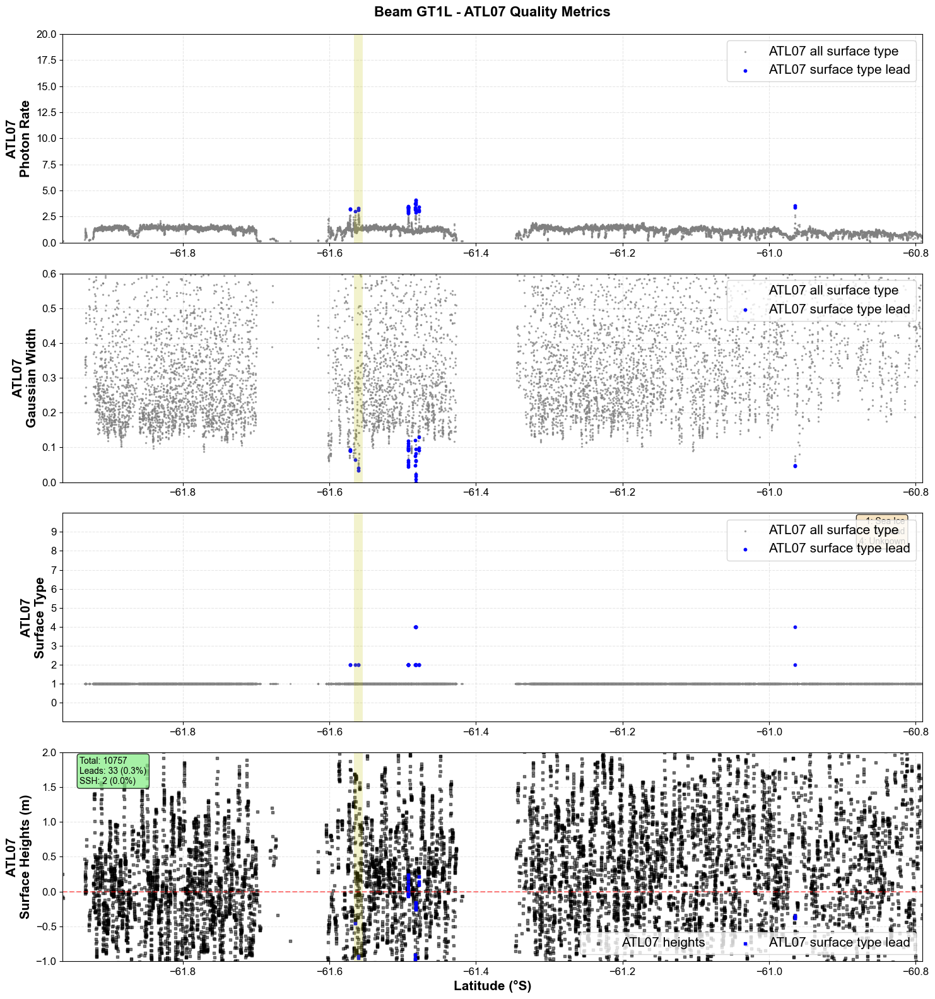

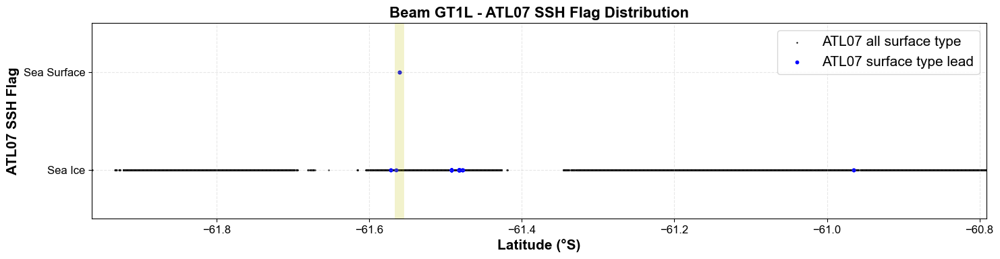


  Beam GT1L Summary:
    Total segments: 10757
    Lead segments: 33 (0.3%)
    SSH segments: 2 (0.0%)
    Mean photon rate: 1.25 photons/shot
    Mean gaussian width: inf
    Mean height: 0.248 m

Processing beam GT1R...


c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


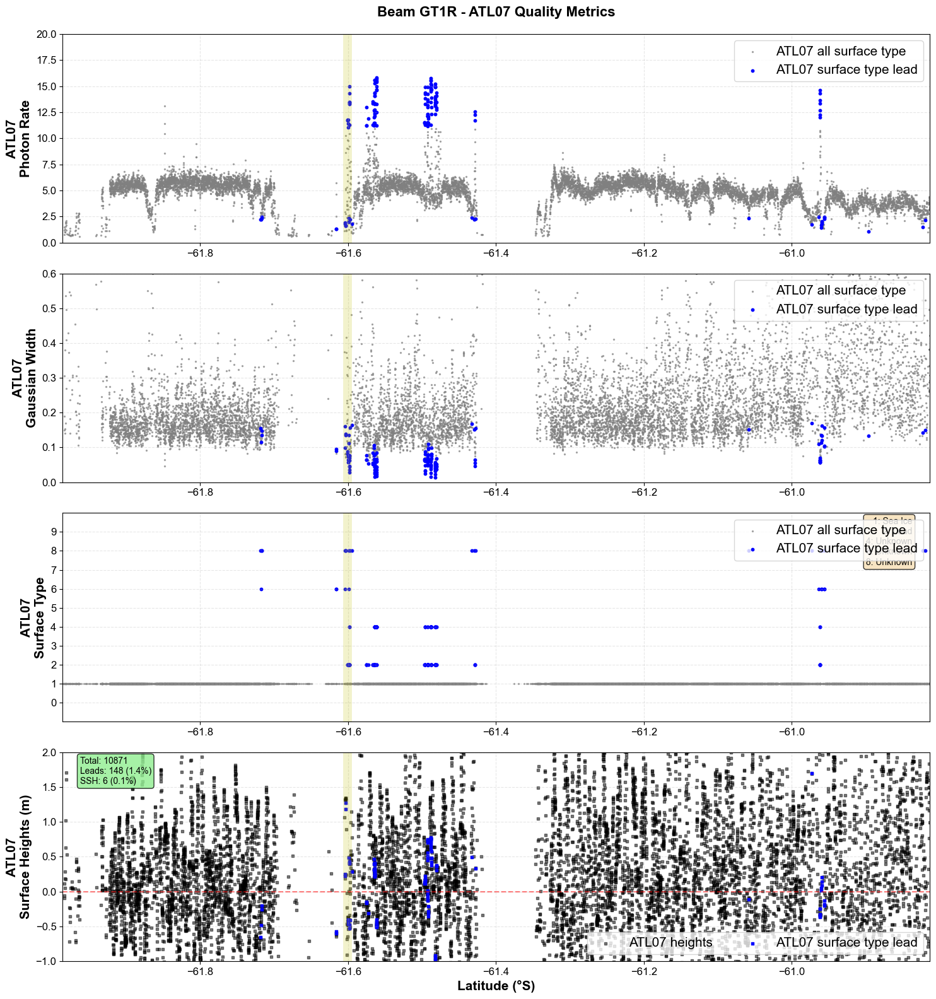

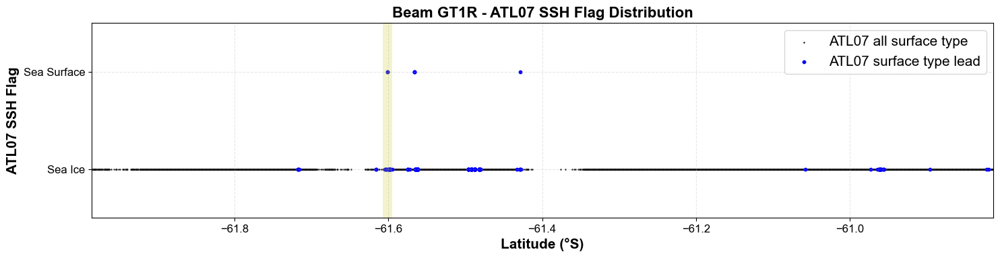


  Beam GT1R Summary:
    Total segments: 10871
    Lead segments: 148 (1.4%)
    SSH segments: 6 (0.1%)
    Mean photon rate: inf photons/shot
    Mean gaussian width: inf
    Mean height: inf m

Processing beam GT2L...


c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


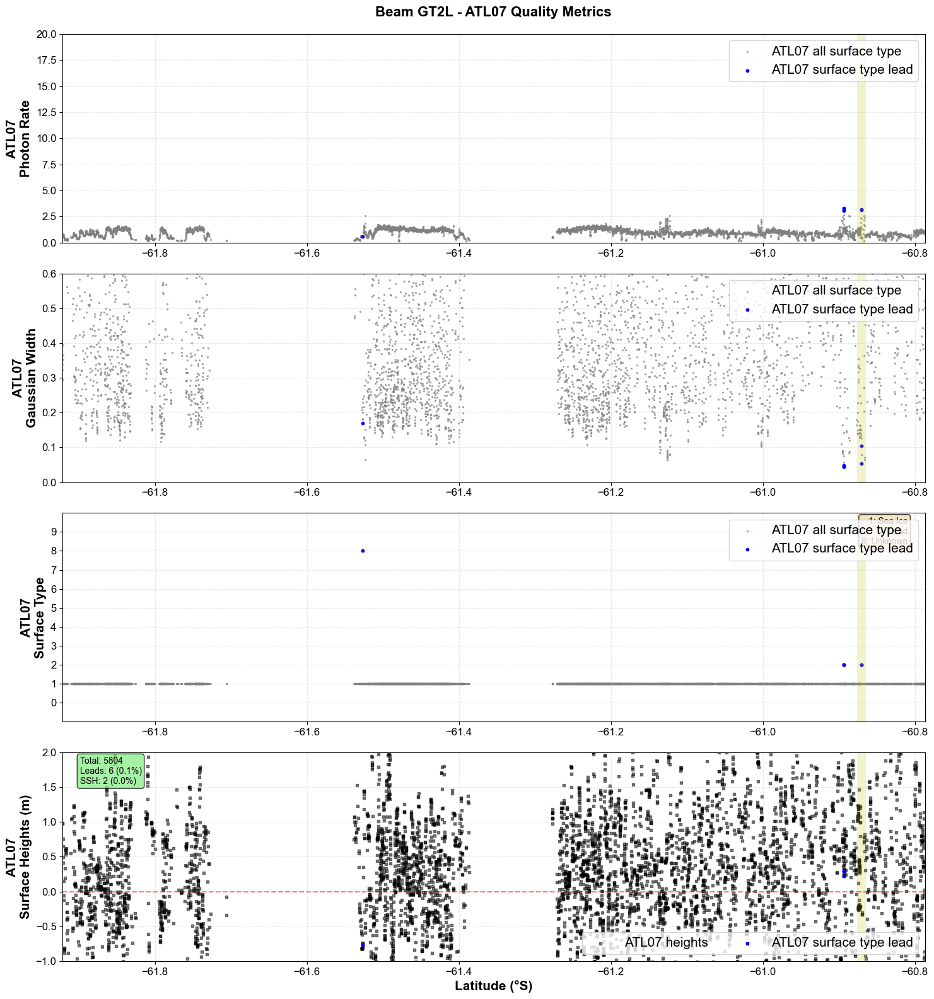

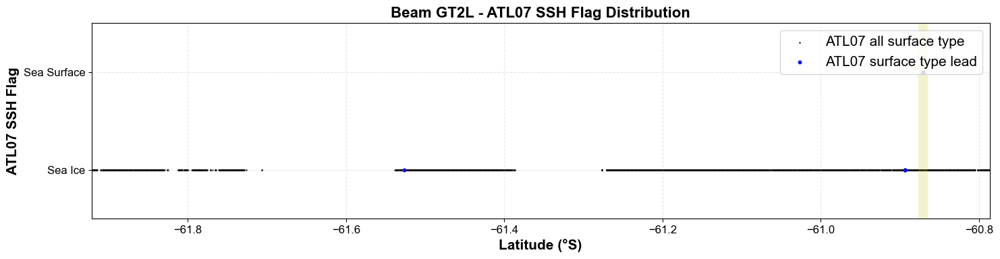


  Beam GT2L Summary:
    Total segments: 5804
    Lead segments: 6 (0.1%)
    SSH segments: 2 (0.0%)
    Mean photon rate: 1.06 photons/shot
    Mean gaussian width: inf
    Mean height: 0.276 m

Processing beam GT2R...


c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


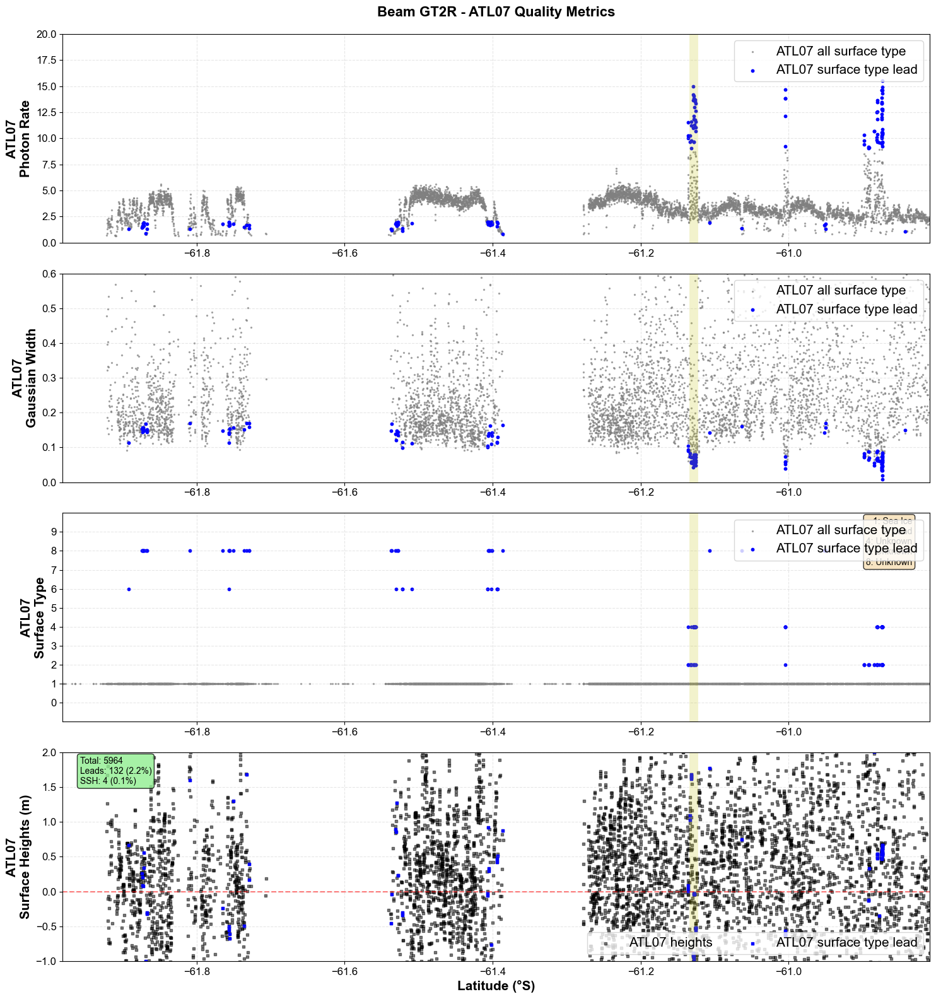

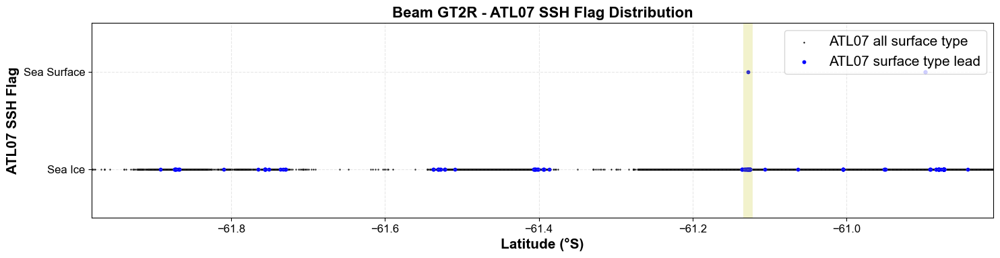


  Beam GT2R Summary:
    Total segments: 5964
    Lead segments: 132 (2.2%)
    SSH segments: 4 (0.1%)
    Mean photon rate: inf photons/shot
    Mean gaussian width: inf
    Mean height: inf m

Processing beam GT3L...


c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


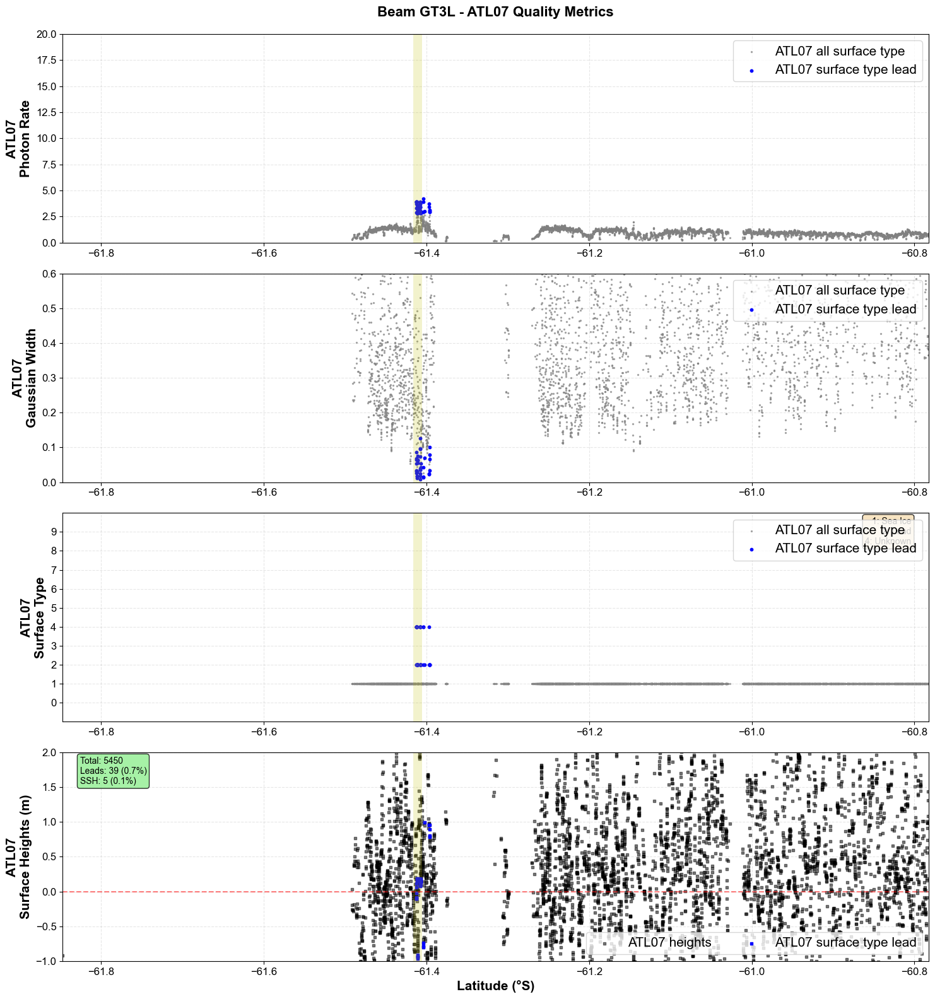

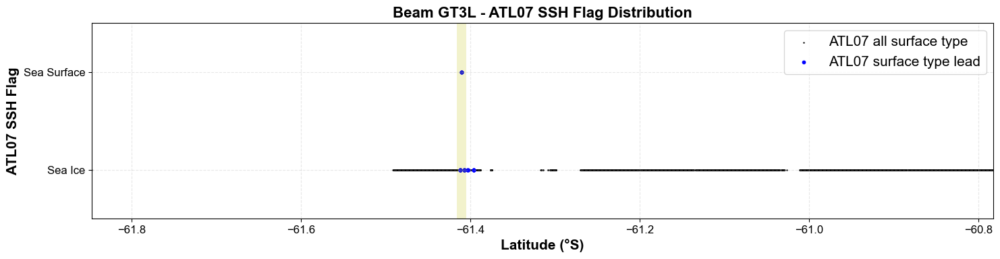


  Beam GT3L Summary:
    Total segments: 5450
    Lead segments: 39 (0.7%)
    SSH segments: 5 (0.1%)
    Mean photon rate: 1.06 photons/shot
    Mean gaussian width: inf
    Mean height: 0.305 m

Processing beam GT3R...


c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


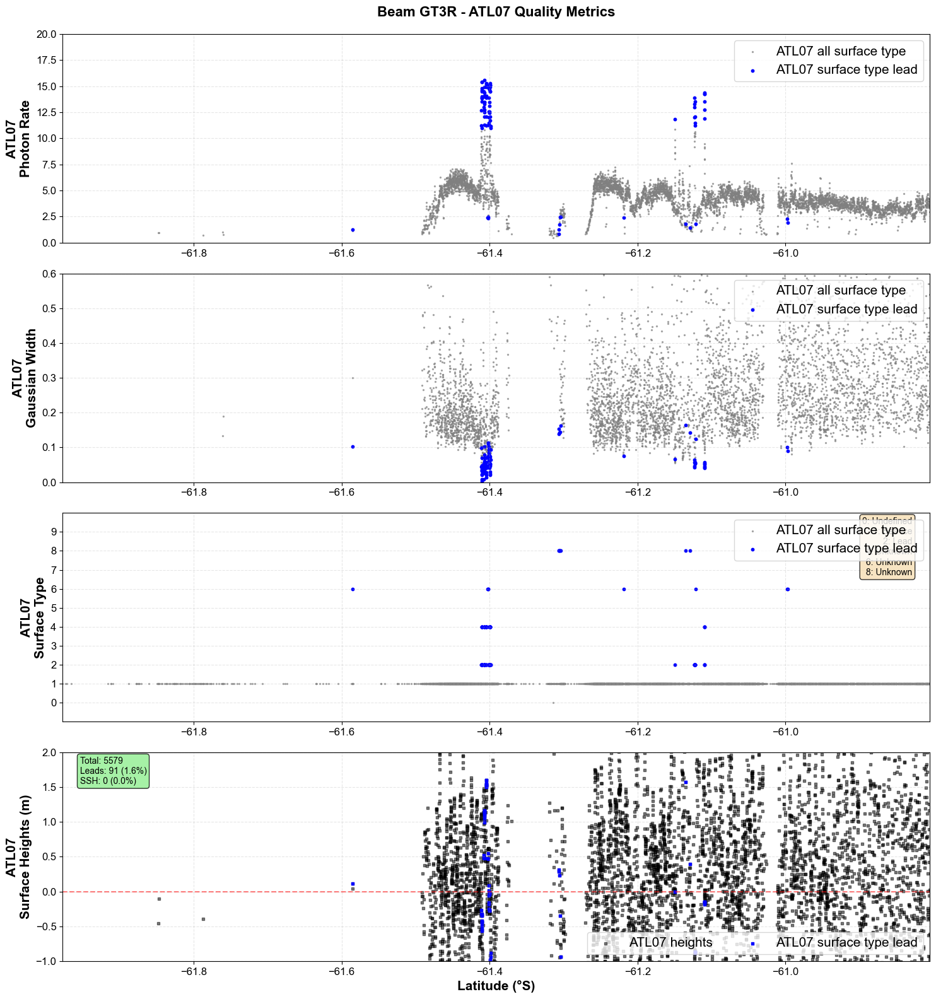

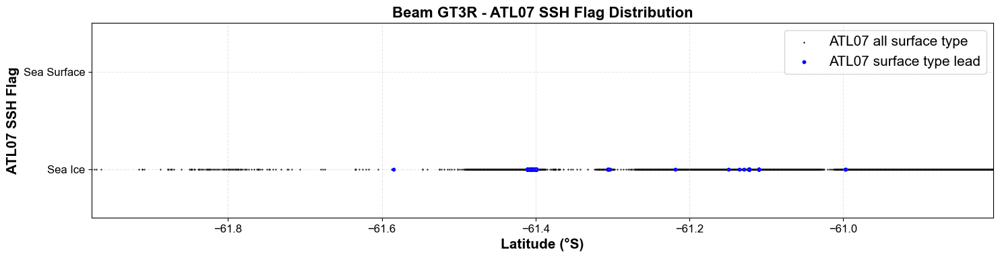


  Beam GT3R Summary:
    Total segments: 5579
    Lead segments: 91 (1.6%)
    SSH segments: 0 (0.0%)
    Mean photon rate: inf photons/shot
    Mean gaussian width: inf
    Mean height: inf m

ARCTIC-STYLE VISUALIZATION COMPLETE FOR ALL BEAMS


c:\Users\xliu38\OneDrive - University of Tasmania\PhD_manuscripts\manuscript2\scripts\.venv\lib\site-packages\numpy\_core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


In [12]:
# ============================================================================
# ICESat-2 ATL07 Quality Metrics Visualization - Arctic Style
# Adapted for Antarctic CRYO2ICE ATL07 Product - All Six Beams
# Following ICESat-2 Hackweek Arctic Example
# ============================================================================

import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc

# Set publication-quality plot style
plt.rcParams['font.size'] = 12
plt.rcParams['font.family'] = 'Arial'

# Re-open the file and extract data from all beams
nc_file = nc.Dataset(segment_file, 'r')
main_group = nc_file.groups['1']
atl07_group = main_group.groups['ATL07']

# Get all beam groups
beam_groups = [key for key in atl07_group.groups.keys() if key.startswith('gt')]
beam_groups.sort()

print("=" * 80)
print("ICESat-2 ATL07 QUALITY METRICS VISUALIZATION (ARCTIC-STYLE)")
print("=" * 80)

# Create separate figures for each beam
for beam in beam_groups:
    print(f"\nProcessing beam {beam.upper()}...")
    
    beam_group = atl07_group.groups[beam]
    seg_group = beam_group.groups['sea_ice_segments']
    heights_group = seg_group.groups['heights']
    stats_group = seg_group.groups['stats']
    
    # Extract key variables as writable numpy arrays
    latitude = np.array(seg_group.variables['latitude'][:])
    photon_rate = np.array(stats_group.variables['photon_rate'][:])
    height_segment_height = np.array(heights_group.variables['height_segment_height'][:])
    height_segment_type = np.array(heights_group.variables['height_segment_type'][:])
    ssh_flag = np.array(heights_group.variables['height_segment_ssh_flag'][:])
    gaussian_width = np.array(heights_group.variables['height_segment_w_gaussian'][:])
    
    # Calculate latitude range
    latmin = np.nanmin(latitude)
    latmax = np.nanmax(latitude)
    
    # Create figure with 4 subplots (Arctic style - removed ATL03)
    fig, ax = plt.subplots(4, 1, figsize=(15, 16))
    
    # ========================================================================
    # SUBPLOT 0: ATL07 Photon Rate vs Latitude
    # ========================================================================
    ax[0].scatter(latitude, photon_rate, s=2, c='gray', alpha=0.6, 
                 label='ATL07 all surface type')
    
    # Highlight leads (surface type > 1)
    lead_mask = height_segment_type > 1
    ax[0].scatter(latitude[lead_mask], photon_rate[lead_mask], 
                 s=10, c='b', label='ATL07 surface type lead')
    
    ax[0].legend(fontsize=15, loc='upper right')
    ax[0].set_ylim(0, 20)
    ax[0].set_ylabel('ATL07\nPhoton Rate', fontsize=15, fontweight='bold')
    ax[0].set_xlim(latmin, latmax)
    ax[0].grid(True, alpha=0.3, linestyle='--')
    ax[0].set_title(f'Beam {beam.upper()} - ATL07 Quality Metrics', 
                   fontsize=16, fontweight='bold', pad=20)
    
    # ========================================================================
    # SUBPLOT 1: ATL07 Gaussian Width vs Latitude
    # ========================================================================
    ax[1].scatter(latitude, gaussian_width, s=2, c='gray', alpha=0.6,
                 label='ATL07 all surface type')
    ax[1].scatter(latitude[lead_mask], gaussian_width[lead_mask], 
                 s=10, c='blue', label='ATL07 surface type lead')
    
    ax[1].legend(loc='upper right', fontsize=15)
    ax[1].set_ylabel('ATL07\nGaussian Width', fontsize=15, fontweight='bold')
    ax[1].set_ylim(0, 0.6)
    ax[1].set_xlim(latmin, latmax)
    ax[1].grid(True, alpha=0.3, linestyle='--')
    
    # ========================================================================
    # SUBPLOT 2: ATL07 Surface Type vs Latitude
    # ========================================================================
    ax[2].scatter(latitude, height_segment_type, s=2, c='gray', alpha=0.6,
                 label='ATL07 all surface type')
    ax[2].scatter(latitude[lead_mask], height_segment_type[lead_mask], 
                 s=10, c='blue', label='ATL07 surface type lead')
    
    ax[2].legend(fontsize=15, loc='upper right')
    ax[2].set_ylim(-1, 10)
    ax[2].set_ylabel('ATL07\nSurface Type', fontsize=15, fontweight='bold')
    ax[2].set_yticks(np.arange(0, 10, 1))
    ax[2].set_xlim(latmin, latmax)
    ax[2].grid(True, alpha=0.3, linestyle='--')
    
    # Add surface type legend
    stype_labels = {0: 'Undefined', 1: 'Sea Ice', 2: 'Lead', 3: 'Dark Lead'}
    unique_types = np.unique(height_segment_type[~np.isnan(height_segment_type)])
    legend_text = '\n'.join([f'{int(t)}: {stype_labels.get(int(t), "Unknown")}' 
                            for t in unique_types if not np.isnan(t)])
    ax[2].text(0.98, 0.98, legend_text, transform=ax[2].transAxes,
              verticalalignment='top', horizontalalignment='right',
              fontsize=10, bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    # ========================================================================
    # SUBPLOT 3: ATL07 Surface Heights and SSH Flag
    # ========================================================================
    # Plot all heights in black
    ax[3].scatter(latitude, height_segment_height, marker='s', s=5, 
                 c='k', alpha=0.5, label='ATL07 heights')
    
    # Highlight leads
    ax[3].scatter(latitude[lead_mask], height_segment_height[lead_mask], 
                 marker='s', s=10, c='b', label='ATL07 surface type lead')
    
    # Highlight sea surface (ssh_flag == 1) with yellow background
    ssh_mask = ssh_flag == 1
    if ssh_mask.any():
        # Find first ssh occurrence for vertical line
        ssh_lats = latitude[ssh_mask]
        if len(ssh_lats) > 0:
            ax[3].axvline(ssh_lats[0], c='y', alpha=0.2, linewidth=10)
    
    ax[3].legend(ncol=2, loc='lower right', fontsize=15)
    
    # Set y-limits based on data
    valid_heights = height_segment_height[~np.isnan(height_segment_height)]
    if len(valid_heights) > 0:
        height_min = max(-1, np.percentile(valid_heights, 1))
        height_max = min(2, np.percentile(valid_heights, 99))
        ax[3].set_ylim(height_min, height_max)
    else:
        ax[3].set_ylim(-1, 2)
    
    ax[3].set_ylabel('ATL07\nSurface Heights (m)', fontsize=15, fontweight='bold')
    ax[3].set_xlabel('Latitude (°S)', fontsize=15, fontweight='bold')
    ax[3].set_xlim(latmin, latmax)
    ax[3].grid(True, alpha=0.3, linestyle='--')
    ax[3].axhline(y=0, color='red', linestyle='--', linewidth=1.5, alpha=0.5)
    
    # Add statistics box
    n_leads = lead_mask.sum()
    n_ssh = ssh_mask.sum()
    stats_text = f'Total: {len(latitude)}\nLeads: {n_leads} ({n_leads/len(latitude)*100:.1f}%)\nSSH: {n_ssh} ({n_ssh/len(latitude)*100:.1f}%)'
    ax[3].text(0.02, 0.98, stats_text, transform=ax[3].transAxes,
              verticalalignment='top', fontsize=10,
              bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))
    
    # Add yellow highlighting to all subplots for SSH regions
    if ssh_mask.any():
        ssh_lats = latitude[ssh_mask]
        if len(ssh_lats) > 0:
            for i in range(3):
                ax[i].axvline(ssh_lats[0], c='y', alpha=0.2, linewidth=10)
    
    plt.tight_layout()
    plt.show()
    
    # ========================================================================
    # ADDITIONAL FIGURE: SSH Flag Distribution
    # ========================================================================
    fig2, ax_ssh = plt.subplots(1, 1, figsize=(15, 4))
    
    ax_ssh.scatter(latitude, ssh_flag, c='k', s=2, marker='.', 
                  label='ATL07 all surface type')
    ax_ssh.scatter(latitude[lead_mask], ssh_flag[lead_mask], 
                  c='b', s=10, label='ATL07 surface type lead')
    
    ax_ssh.legend(fontsize=15, loc='upper right')
    ax_ssh.grid(True, alpha=0.3, linestyle='--')
    ax_ssh.set_ylim(-0.5, 1.5)
    ax_ssh.set_yticks([0, 1])
    ax_ssh.set_yticklabels(['Sea Ice', 'Sea Surface'], fontsize=12)
    ax_ssh.set_ylabel('ATL07 SSH Flag', fontsize=15, fontweight='bold')
    ax_ssh.set_xlabel('Latitude (°S)', fontsize=15, fontweight='bold')
    ax_ssh.set_xlim(latmin, latmax)
    ax_ssh.set_title(f'Beam {beam.upper()} - ATL07 SSH Flag Distribution', 
                    fontsize=16, fontweight='bold')
    
    # Highlight SSH regions
    if ssh_mask.any():
        ssh_lats = latitude[ssh_mask]
        if len(ssh_lats) > 0:
            ax_ssh.axvline(ssh_lats[0], c='y', alpha=0.2, linewidth=10)
    
    plt.tight_layout()
    plt.show()
    
    # Print summary for this beam
    print(f"\n  Beam {beam.upper()} Summary:")
    print(f"    Total segments: {len(latitude)}")
    print(f"    Lead segments: {n_leads} ({n_leads/len(latitude)*100:.1f}%)")
    print(f"    SSH segments: {n_ssh} ({n_ssh/len(latitude)*100:.1f}%)")
    print(f"    Mean photon rate: {np.nanmean(photon_rate):.2f} photons/shot")
    print(f"    Mean gaussian width: {np.nanmean(gaussian_width):.4f}")
    print(f"    Mean height: {np.nanmean(valid_heights):.3f} m")

nc_file.close()

print("\n" + "=" * 80)
print("ARCTIC-STYLE VISUALIZATION COMPLETE FOR ALL BEAMS")
print("=" * 80)

## 10. Transform the ATL07 sea-ice height to the ATL10 total freeboard

In [9]:
# ============================================================================
# ADVANCED TOTAL FREEBOARD ESTIMATION - MULTI-BEAM PROCESSING
# Enhanced for Poor Data Quality Conditions (Heavy Cloud, Missing Data)
# Version 3.0 - Ultra-Relaxed Criteria with Fill Value Handling
# ============================================================================

import numpy as np
import pandas as pd
import netCDF4 as nc
from scipy.interpolate import interp1d
from scipy.ndimage import median_filter, uniform_filter1d
from scipy.stats import median_abs_deviation
import matplotlib.pyplot as plt
import warnings
import psutil
import gc
from typing import Dict, Tuple, Optional
warnings.filterwarnings('ignore')

# ============================================================================
# CONFIGURATION
# ============================================================================

# ICESat-2 fill values (from ATBD)
FILL_VALUE_FLOAT32 = 3.4028235e+38
FILL_VALUE_INT = -9999
FILL_VALUE_THRESHOLD = 1e10  # Anything above this is considered fill value

# Physical constraints
FREEBOARD_MIN = -0.2  # Allow slightly negative (measurement uncertainty)
FREEBOARD_MAX = 2.5   # Antarctic multi-year ice
HEIGHT_RANGE_MIN = -5.0  # Expanded for noisy data
HEIGHT_RANGE_MAX = 5.0

# Lead detection thresholds (ultra-relaxed)
MIN_LEADS_THRESHOLD = 3  # Minimum for any interpolation
MIN_LEADS_OPTIMAL = 10   # Minimum for good interpolation

# ============================================================================
# UTILITY FUNCTIONS
# ============================================================================

def print_memory_usage(stage_name):
    """Monitor and report memory usage"""
    process = psutil.Process()
    mem_mb = process.memory_info().rss / 1024 / 1024
    mem_percent = process.memory_percent()
    print(f"  💾 Memory [{stage_name}]: {mem_mb:.1f} MB ({mem_percent:.1f}%)")
    return mem_mb

def clean_fill_values(array: np.ndarray, fill_value: float = FILL_VALUE_FLOAT32) -> np.ndarray:
    """Replace fill values with NaN"""
    array_clean = array.copy()
    array_clean[np.abs(array) > FILL_VALUE_THRESHOLD] = np.nan
    array_clean[array == fill_value] = np.nan
    array_clean[~np.isfinite(array)] = np.nan
    return array_clean

def assess_data_quality(h_segment: np.ndarray, photon_rate: np.ndarray, 
                       cloud_flag: np.ndarray) -> Dict[str, float]:
    """Assess overall data quality metrics"""
    h_clean = clean_fill_values(h_segment)
    
    return {
        'valid_data_pct': np.sum(~np.isnan(h_clean)) / len(h_clean) * 100,
        'mean_photon_rate': np.nanmean(photon_rate),
        'clear_sky_pct': np.sum(cloud_flag == 0) / len(cloud_flag) * 100,
        'possible_cloud_pct': np.sum(cloud_flag == 1) / len(cloud_flag) * 100,
        'cloudy_pct': np.sum(cloud_flag >= 2) / len(cloud_flag) * 100,
        'n_segments': len(h_segment),
        'n_valid': np.sum(~np.isnan(h_clean))
    }

# ============================================================================
# MAIN FREEBOARD ESTIMATION FUNCTION (SINGLE BEAM)
# ============================================================================

def estimate_freeboard_single_beam(
    beam_group,
    beam_name: str,
    verbose: bool = True
) -> Tuple[Optional[pd.DataFrame], Dict]:
    """
    Estimate total freeboard for a single beam with enhanced error handling
    
    Returns:
        - DataFrame with results (or None if failed)
        - Dictionary with processing statistics
    """
    
    if verbose:
        print(f"\n{'='*80}")
        print(f"PROCESSING BEAM: {beam_name.upper()}")
        print(f"{'='*80}")
    
    stats = {
        'beam': beam_name,
        'success': False,
        'n_segments': 0,
        'n_leads': 0,
        'n_ice': 0,
        'n_valid_freeboard': 0,
        'mean_freeboard': np.nan,
        'std_freeboard': np.nan,
        'data_quality': {},
        'error_message': None
    }
    
    try:
        # ─────────────────────────────────────────────────────────────
        # STEP 1: LOAD DATA
        # ─────────────────────────────────────────────────────────────
        
        seg_group = beam_group.groups['sea_ice_segments']
        heights_group = seg_group.groups['heights']
        stats_group = seg_group.groups['stats']
        geophys_group = seg_group.groups['geophysical']
        
        # Load and clean key variables
        latitude = np.array(seg_group.variables['latitude'][:])
        longitude = np.array(seg_group.variables['longitude'][:])
        delta_time = np.array(seg_group.variables['delta_time'][:])
        seg_dist_x = np.array(seg_group.variables['seg_dist_x'][:])
        
        # Heights (with fill value cleaning)
        h_segment_raw = np.array(heights_group.variables['height_segment_height'][:])
        h_segment = clean_fill_values(h_segment_raw)
        
        h_confidence = np.array(heights_group.variables['height_segment_confidence'][:])
        h_type = np.array(heights_group.variables['height_segment_type'][:])
        ssh_flag = np.array(heights_group.variables['height_segment_ssh_flag'][:])
        
        gaussian_width_raw = np.array(heights_group.variables['height_segment_w_gaussian'][:])
        gaussian_width = clean_fill_values(gaussian_width_raw)
        
        # Quality metrics
        photon_rate = np.array(stats_group.variables['photon_rate'][:])
        photon_rate = clean_fill_values(photon_rate)
        
        cloud_flag = np.array(stats_group.variables['cloud_flag_asr'][:])
        
        # Geophysical corrections
        mss = clean_fill_values(np.array(geophys_group.variables['height_segment_mss'][:]))
        ocean_tide = clean_fill_values(np.array(geophys_group.variables['height_segment_ocean'][:]))
        ib_correction = clean_fill_values(np.array(geophys_group.variables['height_segment_ib'][:]))
        
        n_segments = len(latitude)
        stats['n_segments'] = n_segments
        
        # Assess data quality
        quality_metrics = assess_data_quality(h_segment, photon_rate, cloud_flag)
        stats['data_quality'] = quality_metrics
        
        if verbose:
            print(f"\n📊 DATA QUALITY ASSESSMENT:")
            print(f"   ├─ Total segments: {n_segments}")
            print(f"   ├─ Valid data: {quality_metrics['valid_data_pct']:.1f}%")
            print(f"   ├─ Mean photon rate: {quality_metrics['mean_photon_rate']:.3f} photons/shot")
            print(f"   ├─ Clear sky: {quality_metrics['clear_sky_pct']:.1f}%")
            print(f"   ├─ Possible cloud: {quality_metrics['possible_cloud_pct']:.1f}%")
            print(f"   └─ Cloudy: {quality_metrics['cloudy_pct']:.1f}%")
        
        # Check if data quality is sufficient
        if quality_metrics['valid_data_pct'] < 10:
            stats['error_message'] = f"Insufficient valid data ({quality_metrics['valid_data_pct']:.1f}%)"
            if verbose:
                print(f"\n   ❌ SKIPPING: {stats['error_message']}")
            return None, stats
        
        # ─────────────────────────────────────────────────────────────
        # STEP 2: APPLY GEOPHYSICAL CORRECTIONS
        # ─────────────────────────────────────────────────────────────
        
        # Handle missing corrections
        mss = np.where(np.isnan(mss), np.nanmedian(mss), mss)
        ocean_tide = np.where(np.isnan(ocean_tide), 0.0, ocean_tide)
        ib_correction = np.where(np.isnan(ib_correction), 0.0, ib_correction)
        
        geophys_correction = mss + ocean_tide + ib_correction
        h_corrected = h_segment - geophys_correction
        
        if verbose:
            print(f"\n🔧 GEOPHYSICAL CORRECTIONS:")
            print(f"   ├─ MSS: {np.nanmean(mss):.4f} ± {np.nanstd(mss):.4f} m")
            print(f"   ├─ Ocean Tide: {np.nanmean(ocean_tide):.4f} ± {np.nanstd(ocean_tide):.4f} m")
            print(f"   └─ Total: {np.nanmean(geophys_correction):.4f} ± {np.nanstd(geophys_correction):.4f} m")
        
        # ─────────────────────────────────────────────────────────────
        # STEP 3: ULTRA-RELAXED LEAD IDENTIFICATION
        # ─────────────────────────────────────────────────────────────
        
        if verbose:
            print(f"\n🔍 LEAD IDENTIFICATION (ULTRA-RELAXED CRITERIA):")
        
        # Ensure we have valid data for filtering
        valid_data_mask = ~np.isnan(h_corrected)
        
        # LEVEL 1: Type-based (most reliable)
        lead_type_mask = (h_type >= 2) & valid_data_mask
        
        # LEVEL 2: SSH flag
        ssh_mask = (ssh_flag == 1) & valid_data_mask
        
        # LEVEL 3: Physical height range (very broad)
        height_mask = (h_corrected >= HEIGHT_RANGE_MIN) & (h_corrected <= HEIGHT_RANGE_MAX) & valid_data_mask
        
        # LEVEL 4: Confidence (very relaxed)
        confidence_mask = (h_confidence >= 1) & valid_data_mask  # Any confidence
        
        # LEVEL 5: Smoothness (relaxed)
        smooth_mask = valid_data_mask.copy()
        smooth_mask[~np.isnan(gaussian_width)] &= (gaussian_width[~np.isnan(gaussian_width)] < 0.5)
        
        # LEVEL 6: Signal strength (very relaxed)
        signal_mask = valid_data_mask.copy()
        signal_mask[~np.isnan(photon_rate)] &= (photon_rate[~np.isnan(photon_rate)] >= 0.1)
        
        # Progressive lead detection (NO CLOUD FILTER)
        lead_mask_type = lead_type_mask & height_mask  # Type + physical range
        lead_mask_ssh = ssh_mask & height_mask  # SSH flag + range
        lead_mask_hybrid = (lead_type_mask | ssh_mask) & confidence_mask & height_mask  # Combined
        lead_mask_ultra = (lead_type_mask | ssh_mask) & height_mask  # Ultra-relaxed
        lead_mask_desperate = height_mask & confidence_mask & smooth_mask  # Desperate (no type info)
        
        # Count leads at each level
        counts = {
            'type_based': np.sum(lead_mask_type),
            'ssh_based': np.sum(lead_mask_ssh),
            'hybrid': np.sum(lead_mask_hybrid),
            'ultra_relaxed': np.sum(lead_mask_ultra),
            'desperate': np.sum(lead_mask_desperate)
        }
        
        if verbose:
            print(f"   Lead counts by method:")
            for method, count in counts.items():
                print(f"   ├─ {method}: {count} segments")
        
        # Select best available method
        if counts['type_based'] >= MIN_LEADS_THRESHOLD:
            lead_mask = lead_mask_type
            method_used = "TYPE_BASED"
        elif counts['ssh_based'] >= MIN_LEADS_THRESHOLD:
            lead_mask = lead_mask_ssh
            method_used = "SSH_BASED"
        elif counts['hybrid'] >= MIN_LEADS_THRESHOLD:
            lead_mask = lead_mask_hybrid
            method_used = "HYBRID"
        elif counts['ultra_relaxed'] >= MIN_LEADS_THRESHOLD:
            lead_mask = lead_mask_ultra
            method_used = "ULTRA_RELAXED"
        elif counts['desperate'] >= MIN_LEADS_THRESHOLD:
            lead_mask = lead_mask_desperate
            method_used = "DESPERATE"
            if verbose:
                print(f"   ⚠️  WARNING: Using desperate criteria (no surface type filter)")
        else:
            # Absolute last resort: use all valid data in range
            lead_mask = height_mask
            method_used = "FALLBACK_ALL"
            if verbose:
                print(f"   ⚠️⚠️  CRITICAL: Using all valid data as potential leads")
        
        n_leads = np.sum(lead_mask)
        stats['n_leads'] = n_leads
        
        if verbose:
            print(f"   → SELECTED METHOD: {method_used}")
            print(f"   → LEADS FOUND: {n_leads} ({n_leads/n_segments*100:.2f}%)")
        
        if n_leads < MIN_LEADS_THRESHOLD:
            stats['error_message'] = f"Insufficient leads ({n_leads})"
            if verbose:
                print(f"\n   ❌ {stats['error_message']}")
            return None, stats
        
        # ─────────────────────────────────────────────────────────────
        # STEP 4: OUTLIER REMOVAL
        # ─────────────────────────────────────────────────────────────
        
        lead_heights_raw = h_corrected[lead_mask].copy()
        lead_distances_raw = seg_dist_x[lead_mask].copy()
        
        # Remove NaN values
        valid_leads = ~np.isnan(lead_heights_raw)
        lead_heights_raw = lead_heights_raw[valid_leads]
        lead_distances_raw = lead_distances_raw[valid_leads]
        
        if len(lead_heights_raw) < MIN_LEADS_THRESHOLD:
            stats['error_message'] = f"Too many NaN in leads ({len(lead_heights_raw)} valid)"
            return None, stats
        
        # Robust outlier detection
        if len(lead_heights_raw) >= 5:
            mad = median_abs_deviation(lead_heights_raw, nan_policy='omit')
            median_lead = np.nanmedian(lead_heights_raw)
            
            if mad > 0:
                outlier_mask = np.abs(lead_heights_raw - median_lead) > (3.0 * mad)
                lead_heights_clean = lead_heights_raw[~outlier_mask]
                lead_distances_clean = lead_distances_raw[~outlier_mask]
                n_outliers = np.sum(outlier_mask)
            else:
                lead_heights_clean = lead_heights_raw
                lead_distances_clean = lead_distances_raw
                n_outliers = 0
        else:
            lead_heights_clean = lead_heights_raw
            lead_distances_clean = lead_distances_raw
            n_outliers = 0
        
        n_leads_clean = len(lead_heights_clean)
        
        if verbose and n_outliers > 0:
            print(f"   ├─ Outliers removed: {n_outliers}")
            print(f"   └─ Clean leads: {n_leads_clean}")
        
        # ─────────────────────────────────────────────────────────────
        # STEP 5: SSH INTERPOLATION
        # ─────────────────────────────────────────────────────────────
        
        if n_leads_clean >= 2:
            # Sort by distance
            sort_idx = np.argsort(lead_distances_clean)
            lead_distances_sorted = lead_distances_clean[sort_idx]
            lead_heights_sorted = lead_heights_clean[sort_idx]
            
            # Apply smoothing if enough leads
            if n_leads_clean >= 10:
                window = min(11, n_leads_clean // 5)
                if window % 2 == 0:
                    window += 1
                lead_heights_smoothed = median_filter(lead_heights_sorted, size=window, mode='nearest')
            else:
                lead_heights_smoothed = lead_heights_sorted
            
            # Interpolation
            try:
                if n_leads_clean >= 4:
                    f_ssh = interp1d(
                        lead_distances_sorted, lead_heights_smoothed,
                        kind='cubic', bounds_error=False,
                        fill_value=(lead_heights_smoothed[0], lead_heights_smoothed[-1])
                    )
                else:
                    f_ssh = interp1d(
                        lead_distances_sorted, lead_heights_smoothed,
                        kind='linear', bounds_error=False,
                        fill_value=(lead_heights_smoothed[0], lead_heights_smoothed[-1])
                    )
                
                ssh_interpolated = f_ssh(seg_dist_x)
                
                if verbose:
                    print(f"\n🌊 SSH INTERPOLATION:")
                    print(f"   ├─ Method: {'Cubic spline' if n_leads_clean >= 4 else 'Linear'}")
                    print(f"   └─ SSH range: [{np.nanmin(ssh_interpolated):.4f}, {np.nanmax(ssh_interpolated):.4f}] m")
                
            except Exception as e:
                if verbose:
                    print(f"   ⚠️  Interpolation failed: {e}")
                ssh_interpolated = np.full(n_segments, np.nanmean(lead_heights_clean))
        else:
            # Fallback: constant SSH
            ssh_interpolated = np.full(n_segments, np.nanmean(lead_heights_clean))
            if verbose:
                print(f"\n🌊 SSH: Constant ({ssh_interpolated[0]:.4f} m)")
        
        # ─────────────────────────────────────────────────────────────
        # STEP 6: CALCULATE FREEBOARD
        # ─────────────────────────────────────────────────────────────
        
        ice_mask = (h_type == 1) & valid_data_mask
        n_ice = np.sum(ice_mask)
        stats['n_ice'] = n_ice
        
        freeboard = np.full(n_segments, np.nan)
        freeboard[ice_mask] = h_corrected[ice_mask] - ssh_interpolated[ice_mask]
        
        # Apply physical constraints
        fb_valid_mask = (freeboard >= FREEBOARD_MIN) & (freeboard <= FREEBOARD_MAX)
        freeboard[~fb_valid_mask] = np.nan
        
        n_valid_fb = np.sum(~np.isnan(freeboard))
        stats['n_valid_freeboard'] = n_valid_fb
        
        if n_valid_fb > 0:
            stats['mean_freeboard'] = np.nanmean(freeboard)
            stats['std_freeboard'] = np.nanstd(freeboard)
            stats['success'] = True
            
            if verbose:
                print(f"\n📏 FREEBOARD RESULTS:")
                print(f"   ├─ Ice segments: {n_ice} ({n_ice/n_segments*100:.1f}%)")
                print(f"   ├─ Valid freeboard: {n_valid_fb} ({n_valid_fb/n_ice*100:.1f}% of ice)")
                print(f"   ├─ Mean: {stats['mean_freeboard']:.4f} ± {stats['std_freeboard']:.4f} m")
                print(f"   └─ Range: [{np.nanmin(freeboard):.4f}, {np.nanmax(freeboard):.4f}] m")
        else:
            stats['error_message'] = "No valid freeboard after filtering"
            if verbose:
                print(f"\n   ❌ {stats['error_message']}")
            return None, stats
        
        # ─────────────────────────────────────────────────────────────
        # STEP 7: CREATE OUTPUT DATAFRAME
        # ─────────────────────────────────────────────────────────────
        
        output_df = pd.DataFrame({
            'beam': beam_name,
            'latitude': latitude,
            'longitude': longitude,
            'delta_time': delta_time,
            'seg_dist_x': seg_dist_x,
            'height_raw': h_segment_raw,
            'height_corrected': h_corrected,
            'ssh_interpolated': ssh_interpolated,
            'freeboard_total': freeboard,
            'surface_type': h_type,
            'confidence': h_confidence,
            'photon_rate': photon_rate,
            'gaussian_width': gaussian_width,
            'cloud_flag': cloud_flag,
            'is_lead': lead_mask,
            'is_ice': ice_mask,
            'is_valid_fb': ~np.isnan(freeboard)
        })
        
        return output_df, stats
        
    except Exception as e:
        stats['error_message'] = f"Exception: {str(e)}"
        if verbose:
            print(f"\n   ❌ ERROR: {stats['error_message']}")
        return None, stats

# ============================================================================
# MULTI-BEAM PROCESSING
# ============================================================================

def process_all_beams(nc_file_path: str) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Process all beams in the ATL07 file
    
    Returns:
        - Combined freeboard DataFrame (all successful beams)
        - Statistics DataFrame (processing summary for each beam)
    """
    
    print("="*80)
    print("MULTI-BEAM FREEBOARD ESTIMATION - ATL07 PROCESSING")
    print("Version 3.0 - Ultra-Relaxed Criteria with Fill Value Handling")
    print("="*80)
    
    print_memory_usage("Initial")
    
    # Open NetCDF file
    nc_file = nc.Dataset(nc_file_path, 'r')
    main_group = nc_file.groups['1']
    atl07_group = main_group.groups['ATL07']
    
    # Get all beams
    beam_groups = [key for key in atl07_group.groups.keys() if key.startswith('gt')]
    
    print(f"\n📡 FOUND {len(beam_groups)} BEAMS: {', '.join([b.upper() for b in beam_groups])}")
    
    all_results = []
    all_stats = []
    
    # Process each beam
    for i, beam_name in enumerate(beam_groups, 1):
        print(f"\n{'─'*80}")
        print(f"BEAM {i}/{len(beam_groups)}: {beam_name.upper()}")
        print(f"{'─'*80}")
        
        beam_group = atl07_group.groups[beam_name]
        
        result_df, beam_stats = estimate_freeboard_single_beam(
            beam_group, beam_name, verbose=True
        )
        
        if result_df is not None:
            all_results.append(result_df)
            print(f"\n   ✅ SUCCESS: {beam_stats['n_valid_freeboard']} valid freeboard estimates")
        else:
            print(f"\n   ❌ FAILED: {beam_stats['error_message']}")
        
        all_stats.append(beam_stats)
        
        gc.collect()
    
    nc_file.close()
    
    # Combine results
    if len(all_results) > 0:
        combined_df = pd.concat(all_results, ignore_index=True)
        print(f"\n{'='*80}")
        print(f"✅ PROCESSING COMPLETE")
        print(f"{'='*80}")
        print(f"\n📊 OVERALL SUMMARY:")
        print(f"   ├─ Successful beams: {len(all_results)}/{len(beam_groups)}")
        print(f"   ├─ Total segments: {len(combined_df)}")
        print(f"   └─ Total valid freeboard: {combined_df['is_valid_fb'].sum()}")
    else:
        combined_df = pd.DataFrame()
        print(f"\n{'='*80}")
        print(f"❌ NO SUCCESSFUL BEAMS")
        print(f"{'='*80}")
    
    # Create statistics DataFrame
    stats_df = pd.DataFrame(all_stats)
    
    print_memory_usage("Final")
    
    return combined_df, stats_df

# ============================================================================
# EXECUTE MULTI-BEAM PROCESSING
# ============================================================================

# Process all beams
combined_results, processing_stats = process_all_beams(segment_file)

# Display statistics table
print(f"\n{'='*80}")
print("BEAM-BY-BEAM STATISTICS")
print(f"{'='*80}")
print(processing_stats[['beam', 'success', 'n_segments', 'n_leads', 'n_ice', 
                        'n_valid_freeboard', 'mean_freeboard', 'std_freeboard']].to_string(index=False))

# Display data quality summary
print(f"\n{'='*80}")
print("DATA QUALITY SUMMARY")
print(f"{'='*80}")

for _, row in processing_stats.iterrows():
    dq = row['data_quality']
    print(f"\n{row['beam'].upper()}:")
    print(f"   Valid data: {dq.get('valid_data_pct', 0):.1f}%")
    print(f"   Clear sky: {dq.get('clear_sky_pct', 0):.1f}%")
    print(f"   Cloudy: {dq.get('cloudy_pct', 0):.1f}%")
    # Use conditional expression without nested f-string
    status = '✅ SUCCESS' if row['success'] else f"❌ {row['error_message']}"
    print(f"   Status: {status}")

# Save results if successful
if len(combined_results) > 0:
    output_file = 'multibeam_freeboard_results.csv'
    combined_results.to_csv(output_file, index=False)
    print(f"\n💾 Results saved to: {output_file}")
    
    stats_file = 'processing_statistics.csv'
    processing_stats.to_csv(stats_file, index=False)
    print(f"💾 Statistics saved to: {stats_file}")
    
    # Quick visualization
    print(f"\n📊 FREEBOARD DISTRIBUTION BY BEAM:")
    for beam in combined_results['beam'].unique():
        beam_data = combined_results[combined_results['beam'] == beam]
        fb = beam_data['freeboard_total'].dropna()
        if len(fb) > 0:
            print(f"   {beam.upper()}: {len(fb)} points, mean={fb.mean():.4f}m, std={fb.std():.4f}m")

print(f"\n{'='*80}")
print("ANALYSIS COMPLETE")
print(f"{'='*80}")

MULTI-BEAM FREEBOARD ESTIMATION - ATL07 PROCESSING
Version 3.0 - Ultra-Relaxed Criteria with Fill Value Handling
  💾 Memory [Initial]: 240.5 MB (1.5%)

📡 FOUND 6 BEAMS: GT1L, GT1R, GT2L, GT2R, GT3L, GT3R

────────────────────────────────────────────────────────────────────────────────
BEAM 1/6: GT1L
────────────────────────────────────────────────────────────────────────────────

PROCESSING BEAM: GT1L

📊 DATA QUALITY ASSESSMENT:
   ├─ Total segments: 10757
   ├─ Valid data: 100.0%
   ├─ Mean photon rate: 1.248 photons/shot
   ├─ Clear sky: 0.5%
   ├─ Possible cloud: 2.9%
   └─ Cloudy: 96.7%

🔧 GEOPHYSICAL CORRECTIONS:
   ├─ MSS: 30.7027 ± 0.2136 m
   ├─ Ocean Tide: -0.0534 ± 0.0025 m
   └─ Total: 31.0289 ± 0.2111 m

🔍 LEAD IDENTIFICATION (ULTRA-RELAXED CRITERIA):
   Lead counts by method:
   ├─ type_based: 0 segments
   ├─ ssh_based: 0 segments
   ├─ hybrid: 0 segments
   ├─ ultra_relaxed: 0 segments
   ├─ desperate: 0 segments
   ⚠️⚠️  CRITICAL: Using all valid data as potential leads

In [11]:
# ============================================================================
# CORRECTED FREEBOARD ESTIMATION - SINGLE SEGMENT (segment_1.nc)
# Version 5.0 - Fixed MSS Application Logic
# ============================================================================

import numpy as np
import pandas as pd
import netCDF4 as nc
from pathlib import Path
from scipy.interpolate import interp1d
from scipy.ndimage import median_filter
from scipy.stats import median_abs_deviation
import matplotlib.pyplot as plt
import warnings
from typing import Dict, Tuple, Optional
warnings.filterwarnings('ignore')

# ============================================================================
# CONFIGURATION
# ============================================================================

# ICESat-2 fill values
FILL_VALUE_FLOAT32 = 3.4028235e+38
FILL_VALUE_THRESHOLD = 1e10

# Physical constraints (heights are already relative to geoid/MSS in ATL07)
FREEBOARD_MIN = -0.5
FREEBOARD_MAX = 3.0
SEGMENT_HEIGHT_MIN = -3.0  # ATL07 heights should be close to 0 (sea level)
SEGMENT_HEIGHT_MAX = 5.0

# Lead detection thresholds
MIN_LEADS_THRESHOLD = 3
LEAD_HEIGHT_MAX = 0.3  # Leads should be close to sea level (0m)

# ============================================================================
# UTILITY FUNCTIONS
# ============================================================================

def clean_fill_values(array: np.ndarray) -> np.ndarray:
    """Replace fill values with NaN"""
    array_clean = array.copy()
    array_clean[np.abs(array) > FILL_VALUE_THRESHOLD] = np.nan
    array_clean[array == FILL_VALUE_FLOAT32] = np.nan
    array_clean[~np.isfinite(array)] = np.nan
    return array_clean

def inspect_variable_attributes(nc_group, var_name: str):
    """Inspect variable attributes to understand the data better"""
    if var_name in nc_group.variables:
        var = nc_group.variables[var_name]
        print(f"\n  Variable: {var_name}")
        print(f"    Shape: {var.shape}")
        print(f"    Dtype: {var.dtype}")
        if 'long_name' in var.ncattrs():
            print(f"    Description: {var.long_name}")
        if 'units' in var.ncattrs():
            print(f"    Units: {var.units}")
        if 'comment' in var.ncattrs():
            print(f"    Comment: {var.comment[:100]}...")

# ============================================================================
# CORRECTED FREEBOARD ESTIMATION FUNCTION
# ============================================================================

def estimate_freeboard_v5(
    beam_group,
    beam_name: str,
    verbose: bool = True
) -> Tuple[Optional[pd.DataFrame], Dict]:
    """
    Version 5.0: Fixed MSS application
    
    KEY INSIGHT: ATL07 height_segment_height is already processed and 
    represents height relative to the reference surface (geoid/MSS).
    We should NOT subtract MSS again!
    
    Instead, we only need to:
    1. Apply ocean tide and IB corrections (small adjustments)
    2. Identify leads (near 0m)
    3. Interpolate SSH from leads
    4. Calculate freeboard for ice segments
    """
    
    stats = {
        'beam': beam_name,
        'success': False,
        'n_segments': 0,
        'n_leads': 0,
        'n_ice': 0,
        'n_valid_freeboard': 0,
        'mean_freeboard': np.nan,
        'std_freeboard': np.nan,
        'lead_detection_method': None,
        'error_message': None
    }
    
    try:
        if verbose:
            print(f"\n{'─'*80}")
            print(f"PROCESSING: {beam_name.upper()}")
            print(f"{'─'*80}")
        
        # ====================================================================
        # STEP 1: LOAD DATA
        # ====================================================================
        
        seg_group = beam_group.groups['sea_ice_segments']
        heights_group = seg_group.groups['heights']
        stats_group = seg_group.groups['stats']
        geophys_group = seg_group.groups['geophysical']
        
        # Load core variables
        latitude = np.array(seg_group.variables['latitude'][:])
        longitude = np.array(seg_group.variables['longitude'][:])
        delta_time = np.array(seg_group.variables['delta_time'][:])
        seg_dist_x = np.array(seg_group.variables['seg_dist_x'][:])
        
        # ATL07 heights - already relative to geoid/MSS!
        h_segment_raw = np.array(heights_group.variables['height_segment_height'][:])
        h_segment = clean_fill_values(h_segment_raw)
        
        # Quality and classification
        h_confidence = np.array(heights_group.variables['height_segment_confidence'][:])
        h_type = np.array(heights_group.variables['height_segment_type'][:])
        ssh_flag = np.array(heights_group.variables['height_segment_ssh_flag'][:])
        gaussian_width = clean_fill_values(np.array(heights_group.variables['height_segment_w_gaussian'][:]))
        
        # Statistics
        photon_rate = clean_fill_values(np.array(stats_group.variables['photon_rate'][:]))
        cloud_flag = np.array(stats_group.variables['cloud_flag_asr'][:])
        
        # Small corrections only (NOT MSS!)
        ocean_tide = clean_fill_values(np.array(geophys_group.variables['height_segment_ocean'][:]))
        ib_correction = clean_fill_values(np.array(geophys_group.variables['height_segment_ib'][:]))
        
        n_segments = len(latitude)
        stats['n_segments'] = n_segments
        
        # Check valid data
        valid_data_pct = np.sum(~np.isnan(h_segment)) / n_segments * 100
        
        if verbose:
            print(f"  Total segments: {n_segments}")
            print(f"  Valid data: {valid_data_pct:.1f}%")
            print(f"  Height range (relative to MSS): [{np.nanmin(h_segment):.2f}, {np.nanmax(h_segment):.2f}] m")
        
        if valid_data_pct < 10:
            stats['error_message'] = f"Insufficient valid data ({valid_data_pct:.1f}%)"
            return None, stats
        
        # ====================================================================
        # STEP 2: APPLY SMALL CORRECTIONS (TIDE + IB ONLY)
        # ====================================================================
        
        # Fill missing corrections with 0 (these are small)
        ocean_tide_filled = np.where(np.isnan(ocean_tide), 0.0, ocean_tide)
        ib_filled = np.where(np.isnan(ib_correction), 0.0, ib_correction)
        
        # Apply corrections (small adjustments to already-processed heights)
        h_corrected = h_segment - ocean_tide_filled - ib_filled
        
        valid_mask = ~np.isnan(h_corrected)
        
        if verbose:
            print(f"\n  After tide/IB corrections:")
            print(f"    Ocean tide: {np.nanmean(ocean_tide_filled):.4f} ± {np.nanstd(ocean_tide_filled):.4f} m")
            print(f"    IB correction: {np.nanmean(ib_filled):.4f} ± {np.nanstd(ib_filled):.4f} m")
            print(f"    Corrected height range: [{np.nanmin(h_corrected):.2f}, {np.nanmax(h_corrected):.2f}] m")
            print(f"    Valid segments: {np.sum(valid_mask)} ({np.sum(valid_mask)/n_segments*100:.1f}%)")
        
        # ====================================================================
        # STEP 3: MULTI-LEVEL LEAD DETECTION
        # ====================================================================
        
        if verbose:
            print(f"\n  Lead Detection:")
        
        # Physical range check (already relative to sea level)
        height_range_mask = (h_corrected >= SEGMENT_HEIGHT_MIN) & (h_corrected <= SEGMENT_HEIGHT_MAX) & valid_mask
        
        # LEVEL 1: Surface type (most reliable)
        # Type 0=undefined, 1=sea ice, 2=lead, 3=dark lead
        lead_type_mask = (h_type >= 2) & height_range_mask
        
        # LEVEL 2: SSH flag
        ssh_mask = (ssh_flag == 1) & height_range_mask
        
        # LEVEL 3: Physical characteristics of leads
        # Leads should be near sea level (low height), smooth, high confidence
        physical_lead_mask = (h_corrected >= -0.5) & (h_corrected <= LEAD_HEIGHT_MAX) & height_range_mask
        physical_lead_mask &= (h_confidence >= 2)  # At least medium confidence
        if not np.isnan(gaussian_width).all():
            physical_lead_mask &= (gaussian_width < 0.4) | np.isnan(gaussian_width)
        if not np.isnan(photon_rate).all():
            physical_lead_mask &= (photon_rate > 0.5) | np.isnan(photon_rate)
        
        # LEVEL 4: Statistical approach - lowest 15% of heights
        if np.sum(valid_mask) >= 20:
            percentile_15 = np.nanpercentile(h_corrected[valid_mask], 15)
            percentile_mask = (h_corrected <= percentile_15) & height_range_mask & (h_confidence >= 1)
        else:
            percentile_mask = np.zeros(n_segments, dtype=bool)
        
        # LEVEL 5: Very relaxed - any low heights with decent quality
        relaxed_mask = (h_corrected >= -1.0) & (h_corrected <= 0.5) & height_range_mask
        relaxed_mask &= (h_confidence >= 1)
        
        # Progressive lead detection strategies
        lead_mask_type = lead_type_mask
        lead_mask_ssh = ssh_mask
        lead_mask_combined = (lead_type_mask | ssh_mask) & height_range_mask
        lead_mask_physical = physical_lead_mask
        lead_mask_percentile = percentile_mask
        lead_mask_relaxed = relaxed_mask
        
        # Count leads for each method
        counts = {
            'type_flagged': np.sum(lead_mask_type),
            'ssh_flagged': np.sum(lead_mask_ssh),
            'type_or_ssh': np.sum(lead_mask_combined),
            'physical_characteristics': np.sum(lead_mask_physical),
            'percentile_15': np.sum(lead_mask_percentile),
            'relaxed': np.sum(lead_mask_relaxed)
        }
        
        if verbose:
            print(f"    Lead detection methods:")
            for method, count in counts.items():
                print(f"      {method}: {count} segments ({count/n_segments*100:.1f}%)")
        
        # Select best available method
        if counts['type_flagged'] >= MIN_LEADS_THRESHOLD:
            lead_mask = lead_mask_type
            method = "TYPE_FLAGGED"
        elif counts['ssh_flagged'] >= MIN_LEADS_THRESHOLD:
            lead_mask = lead_mask_ssh
            method = "SSH_FLAGGED"
        elif counts['type_or_ssh'] >= MIN_LEADS_THRESHOLD:
            lead_mask = lead_mask_combined
            method = "TYPE_OR_SSH"
        elif counts['physical_characteristics'] >= MIN_LEADS_THRESHOLD:
            lead_mask = lead_mask_physical
            method = "PHYSICAL_CHARACTERISTICS"
        elif counts['percentile_15'] >= MIN_LEADS_THRESHOLD:
            lead_mask = lead_mask_percentile
            method = "PERCENTILE_15"
        elif counts['relaxed'] >= MIN_LEADS_THRESHOLD:
            lead_mask = lead_mask_relaxed
            method = "RELAXED"
            if verbose:
                print(f"    ⚠️  WARNING: Using relaxed criteria")
        else:
            stats['error_message'] = f"Insufficient leads (max: {max(counts.values())} found)"
            if verbose:
                print(f"    ❌ {stats['error_message']}")
                print(f"    Height distribution:")
                print(f"      Min: {np.nanmin(h_corrected):.3f} m")
                print(f"      P10: {np.nanpercentile(h_corrected[valid_mask], 10):.3f} m")
                print(f"      P25: {np.nanpercentile(h_corrected[valid_mask], 25):.3f} m")
                print(f"      Median: {np.nanmedian(h_corrected):.3f} m")
                print(f"      Mean: {np.nanmean(h_corrected):.3f} m")
            return None, stats
        
        n_leads = np.sum(lead_mask)
        stats['n_leads'] = n_leads
        stats['lead_detection_method'] = method
        
        if verbose:
            print(f"    → SELECTED: {method}")
            print(f"    → LEADS: {n_leads} segments ({n_leads/n_segments*100:.1f}%)")
        
        # ====================================================================
        # STEP 4: OUTLIER REMOVAL & SSH INTERPOLATION
        # ====================================================================
        
        lead_heights = h_corrected[lead_mask].copy()
        lead_distances = seg_dist_x[lead_mask].copy()
        
        # Remove NaN values
        valid_leads = ~np.isnan(lead_heights)
        lead_heights = lead_heights[valid_leads]
        lead_distances = lead_distances[valid_leads]
        
        if len(lead_heights) < MIN_LEADS_THRESHOLD:
            stats['error_message'] = f"Too few valid leads after NaN removal ({len(lead_heights)})"
            return None, stats
        
        # Robust outlier removal using MAD
        if len(lead_heights) >= 5:
            mad = median_abs_deviation(lead_heights, nan_policy='omit')
            median_lead = np.nanmedian(lead_heights)
            
            if mad > 0:
                # 3-sigma rule using MAD (more robust than std)
                outlier_mask = np.abs(lead_heights - median_lead) > (3.0 * mad)
                n_outliers = np.sum(outlier_mask)
                lead_heights_clean = lead_heights[~outlier_mask]
                lead_distances_clean = lead_distances[~outlier_mask]
                
                if verbose and n_outliers > 0:
                    print(f"\n  Outlier removal:")
                    print(f"    Removed: {n_outliers} outliers")
                    print(f"    Retained: {len(lead_heights_clean)} leads")
            else:
                lead_heights_clean = lead_heights
                lead_distances_clean = lead_distances
        else:
            lead_heights_clean = lead_heights
            lead_distances_clean = lead_distances
        
        n_leads_clean = len(lead_heights_clean)
        
        if n_leads_clean < MIN_LEADS_THRESHOLD:
            stats['error_message'] = f"Insufficient leads after outlier removal ({n_leads_clean})"
            return None, stats
        
        if verbose:
            print(f"\n  SSH Interpolation:")
            print(f"    Clean leads: {n_leads_clean}")
            print(f"    Lead height range: [{np.min(lead_heights_clean):.3f}, {np.max(lead_heights_clean):.3f}] m")
            print(f"    Lead height mean: {np.mean(lead_heights_clean):.3f} ± {np.std(lead_heights_clean):.3f} m")
        
        # Sort leads by along-track distance
        sort_idx = np.argsort(lead_distances_clean)
        lead_distances_sorted = lead_distances_clean[sort_idx]
        lead_heights_sorted = lead_heights_clean[sort_idx]
        
        # Apply smoothing if we have enough leads
        if n_leads_clean >= 10:
            window = min(11, n_leads_clean // 5)
            if window % 2 == 0:
                window += 1
            lead_heights_smoothed = median_filter(lead_heights_sorted, size=window, mode='nearest')
            if verbose:
                print(f"    Applied median filter (window={window})")
        else:
            lead_heights_smoothed = lead_heights_sorted
        
        # Interpolate SSH along track
        try:
            if n_leads_clean >= 4:
                # Cubic spline for smooth interpolation
                f_ssh = interp1d(
                    lead_distances_sorted, lead_heights_smoothed,
                    kind='cubic', bounds_error=False,
                    fill_value=(lead_heights_smoothed[0], lead_heights_smoothed[-1])
                )
                interp_method = 'cubic spline'
            else:
                # Linear interpolation for few leads
                f_ssh = interp1d(
                    lead_distances_sorted, lead_heights_smoothed,
                    kind='linear', bounds_error=False,
                    fill_value=(lead_heights_smoothed[0], lead_heights_smoothed[-1])
                )
                interp_method = 'linear'
            
            ssh_interpolated = f_ssh(seg_dist_x)
            
            if verbose:
                print(f"    Interpolation: {interp_method}")
                print(f"    SSH range: [{np.nanmin(ssh_interpolated):.3f}, {np.nanmax(ssh_interpolated):.3f}] m")
                print(f"    SSH mean: {np.nanmean(ssh_interpolated):.3f} ± {np.nanstd(ssh_interpolated):.3f} m")
            
        except Exception as e:
            # Fallback: constant SSH
            ssh_interpolated = np.full(n_segments, np.nanmean(lead_heights_clean))
            if verbose:
                print(f"    ⚠️  Interpolation failed, using constant: {ssh_interpolated[0]:.3f} m")
        
        # ====================================================================
        # STEP 5: CALCULATE FREEBOARD
        # ====================================================================
        
        # Ice segments (surface type = 1)
        ice_mask = (h_type == 1) & valid_mask
        n_ice = np.sum(ice_mask)
        stats['n_ice'] = n_ice
        
        if n_ice == 0:
            stats['error_message'] = "No ice segments found"
            if verbose:
                print(f"\n  ❌ {stats['error_message']}")
                print(f"     Surface types: {np.unique(h_type[valid_mask], return_counts=True)}")
            return None, stats
        
        # Calculate freeboard: ice height above interpolated sea surface
        freeboard = np.full(n_segments, np.nan)
        freeboard[ice_mask] = h_corrected[ice_mask] - ssh_interpolated[ice_mask]
        
        # Apply physical constraints
        fb_valid_mask = (freeboard >= FREEBOARD_MIN) & (freeboard <= FREEBOARD_MAX)
        freeboard[~fb_valid_mask] = np.nan
        
        n_valid_fb = np.sum(~np.isnan(freeboard))
        stats['n_valid_freeboard'] = n_valid_fb
        
        if n_valid_fb == 0:
            stats['error_message'] = "No valid freeboard after physical constraints"
            if verbose:
                print(f"\n  ❌ {stats['error_message']}")
                fb_before_filter = h_corrected[ice_mask] - ssh_interpolated[ice_mask]
                print(f"     Freeboard range before filter: [{np.nanmin(fb_before_filter):.3f}, {np.nanmax(fb_before_filter):.3f}] m")
            return None, stats
        
        stats['mean_freeboard'] = np.nanmean(freeboard)
        stats['std_freeboard'] = np.nanstd(freeboard)
        stats['success'] = True
        
        if verbose:
            print(f"\n  ✅ Freeboard Results:")
            print(f"    Ice segments: {n_ice} ({n_ice/n_segments*100:.1f}%)")
            print(f"    Valid freeboard: {n_valid_fb} ({n_valid_fb/n_ice*100:.1f}% of ice)")
            print(f"    Mean: {stats['mean_freeboard']:.4f} ± {stats['std_freeboard']:.4f} m")
            print(f"    Range: [{np.nanmin(freeboard):.4f}, {np.nanmax(freeboard):.4f}] m")
            print(f"    Median: {np.nanmedian(freeboard):.4f} m")
        
        # ====================================================================
        # STEP 6: CREATE OUTPUT DATAFRAME
        # ====================================================================
        
        output_df = pd.DataFrame({
            'beam': beam_name,
            'latitude': latitude,
            'longitude': longitude,
            'delta_time': delta_time,
            'seg_dist_x': seg_dist_x,
            'height_segment': h_segment_raw,
            'height_corrected': h_corrected,
            'ssh_interpolated': ssh_interpolated,
            'freeboard_total': freeboard,
            'surface_type': h_type,
            'confidence': h_confidence,
            'ssh_flag': ssh_flag,
            'photon_rate': photon_rate,
            'gaussian_width': gaussian_width,
            'cloud_flag': cloud_flag,
            'ocean_tide': ocean_tide_filled,
            'ib_correction': ib_filled,
            'is_lead': lead_mask,
            'is_ice': ice_mask,
            'is_valid_fb': ~np.isnan(freeboard)
        })
        
        return output_df, stats
        
    except Exception as e:
        stats['error_message'] = f"Exception: {str(e)}"
        if verbose:
            print(f"\n  ❌ ERROR: {stats['error_message']}")
        import traceback
        traceback.print_exc()
        return None, stats

# ============================================================================
# PROCESS FIRST SEGMENT - ALL BEAMS
# ============================================================================

print("="*80)
print("CORRECTED FREEBOARD ESTIMATION - SEGMENT 1")
print("Version 5.0 - Fixed MSS Application Logic")
print("="*80)

# Open first segment file
nc_file = nc.Dataset(segment_file, 'r')
main_group = nc_file.groups['1']
atl07_group = main_group.groups['ATL07']

# Get all beams
beam_groups = [key for key in atl07_group.groups.keys() if key.startswith('gt')]
beam_groups.sort()

print(f"\nFound {len(beam_groups)} beams: {', '.join([b.upper() for b in beam_groups])}")

# Optional: Inspect the first beam's height variable to understand the data
if True:  # Set to False to skip inspection
    print(f"\n{'='*80}")
    print("INSPECTING HEIGHT VARIABLE METADATA (GT1L)")
    print(f"{'='*80}")
    first_beam = beam_groups[0]
    first_beam_group = atl07_group.groups[first_beam]
    heights_group = first_beam_group.groups['sea_ice_segments'].groups['heights']
    inspect_variable_attributes(heights_group, 'height_segment_height')

print(f"\n{'='*80}")
print("PROCESSING ALL BEAMS")
print(f"{'='*80}")

# Process all beams
all_results = []
all_stats = []

for i, beam_name in enumerate(beam_groups, 1):
    print(f"\n[{i}/{len(beam_groups)}]")
    beam_group = atl07_group.groups[beam_name]
    result_df, beam_stats = estimate_freeboard_v5(beam_group, beam_name, verbose=True)
    
    if result_df is not None:
        all_results.append(result_df)
    
    all_stats.append(beam_stats)

nc_file.close()

# ============================================================================
# RESULTS SUMMARY
# ============================================================================

print(f"\n{'='*80}")
print("PROCESSING SUMMARY")
print(f"{'='*80}")

# Create statistics DataFrame
stats_df = pd.DataFrame(all_stats)

# Display summary table
print("\n" + stats_df[['beam', 'success', 'n_segments', 'n_leads', 'n_ice', 
                        'n_valid_freeboard', 'lead_detection_method', 
                        'mean_freeboard', 'std_freeboard']].to_string(index=False))

# Combine successful results
if len(all_results) > 0:
    combined_df = pd.concat(all_results, ignore_index=True)
    
    print(f"\n{'='*80}")
    print("✅ OVERALL RESULTS")
    print(f"{'='*80}")
    print(f"\n  Successful beams: {len(all_results)}/{len(beam_groups)}")
    print(f"  Total segments: {len(combined_df)}")
    print(f"  Valid freeboard measurements: {combined_df['is_valid_fb'].sum()}")
    
    fb_all = combined_df['freeboard_total'].dropna()
    print(f"\n  Combined Freeboard Statistics:")
    print(f"    N = {len(fb_all)}")
    print(f"    Mean = {fb_all.mean():.4f} ± {fb_all.std():.4f} m")
    print(f"    Median = {fb_all.median():.4f} m")
    print(f"    Range = [{fb_all.min():.4f}, {fb_all.max():.4f}] m")
    print(f"    P25 = {fb_all.quantile(0.25):.4f} m")
    print(f"    P75 = {fb_all.quantile(0.75):.4f} m")
    
    # Save results
    output_file = 'segment1_freeboard_results_v5.csv'
    combined_df.to_csv(output_file, index=False)
    print(f"\n  💾 Results saved: {output_file}")
    
    stats_file = 'segment1_processing_stats_v5.csv'
    stats_df.to_csv(stats_file, index=False)
    print(f"  💾 Statistics saved: {stats_file}")
    
    # Per-beam summary
    print(f"\n{'='*80}")
    print("PER-BEAM FREEBOARD STATISTICS")
    print(f"{'='*80}\n")
    
    for beam in combined_df['beam'].unique():
        beam_data = combined_df[combined_df['beam'] == beam]
        fb = beam_data['freeboard_total'].dropna()
        leads = beam_data[beam_data['is_lead']]
        ice = beam_data[beam_data['is_ice']]
        
        if len(fb) > 0:
            print(f"  {beam.upper()}:")
            print(f"    Segments: {len(beam_data)} (Leads: {len(leads)}, Ice: {len(ice)})")
            print(f"    Valid FB: {len(fb)} ({len(fb)/len(ice)*100:.1f}% of ice)")
            print(f"    Mean: {fb.mean():.4f} ± {fb.std():.4f} m")
            print(f"    Median: {fb.median():.4f} m")
            print(f"    Range: [{fb.min():.4f}, {fb.max():.4f}] m\n")
    
else:
    print(f"\n{'='*80}")
    print("❌ NO SUCCESSFUL BEAMS")
    print(f"{'='*80}")
    print("\nError summary:")
    for _, row in stats_df.iterrows():
        if not row['success']:
            print(f"  {row['beam'].upper()}: {row['error_message']}")

print(f"\n{'='*80}")
print("ANALYSIS COMPLETE")
print(f"{'='*80}")

CORRECTED FREEBOARD ESTIMATION - SEGMENT 1
Version 5.0 - Fixed MSS Application Logic

Found 6 beams: GT1L, GT1R, GT2L, GT2R, GT3L, GT3R

INSPECTING HEIGHT VARIABLE METADATA (GT1L)

  Variable: height_segment_height
    Shape: (10757,)
    Dtype: float32
    Description: height of segment surface
    Units: meters

PROCESSING ALL BEAMS

[1/6]

────────────────────────────────────────────────────────────────────────────────
PROCESSING: GT1L
────────────────────────────────────────────────────────────────────────────────
  Total segments: 10757
  Valid data: 100.0%
  Height range (relative to MSS): [-2.39, 3.51] m

  After tide/IB corrections:
    Ocean tide: -0.0534 ± 0.0025 m
    IB correction: 0.3796 ± 0.0051 m
    Corrected height range: [-2.71, 3.19] m
    Valid segments: 10757 (100.0%)

  Lead Detection:
    Lead detection methods:
      type_flagged: 33 segments (0.3%)
      ssh_flagged: 2 segments (0.0%)
      type_or_ssh: 33 segments (0.3%)
      physical_characteristics: 441 seg

VISUALIZATION: SEGMENT 1 FREEBOARD ANALYSIS

Loaded data: 44425 segments
Valid freeboard: 28398 measurements


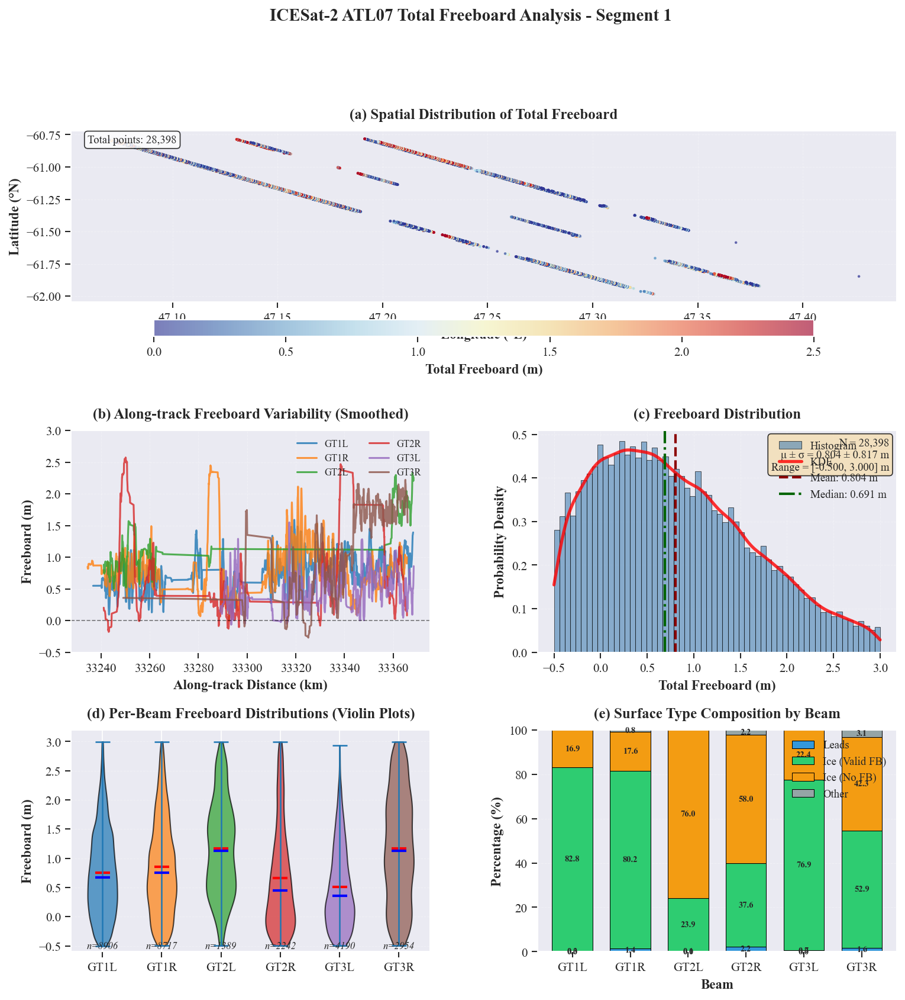

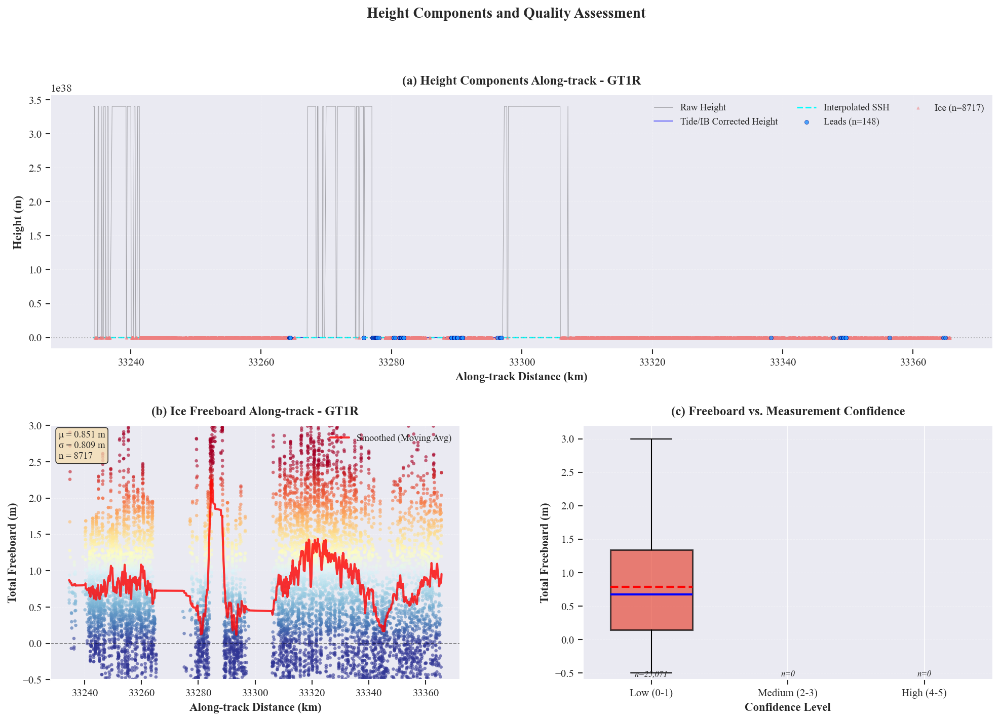

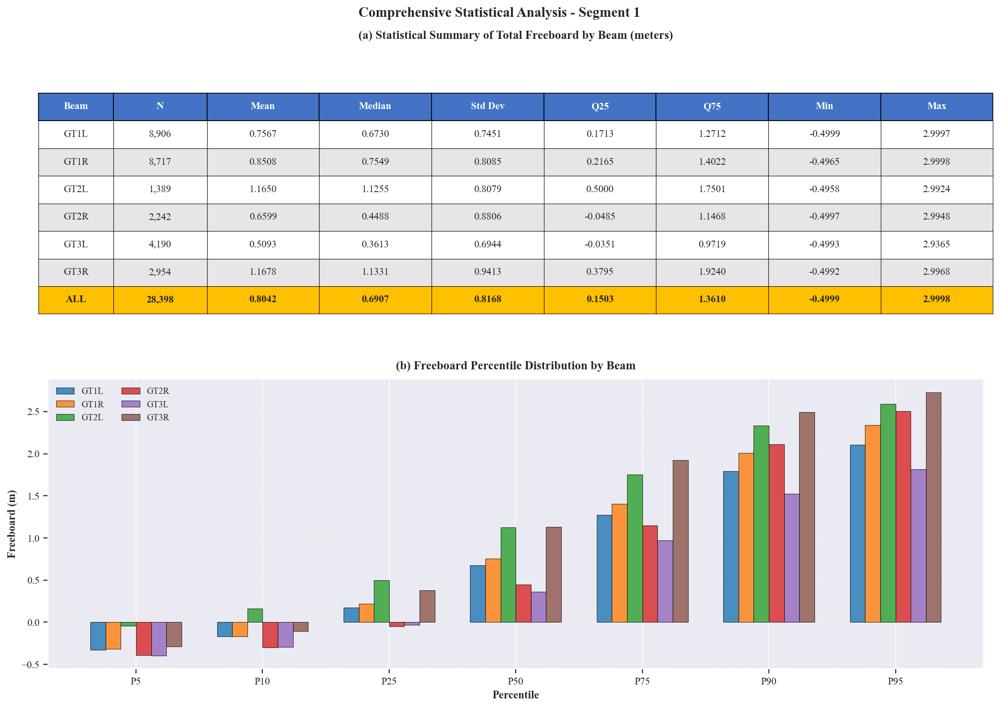


VISUALIZATION COMPLETE

Three publication-quality figures generated:
  Figure 1: Comprehensive Overview (6 panels)
  Figure 2: Height Components Analysis (3 panels)
  Figure 3: Statistical Summary (2 panels)

All figures use:
  - High-resolution rendering (150 DPI display, 300 DPI save-ready)
  - Professional color schemes
  - Clear labels and legends
  - Consistent styling suitable for scientific publications


In [12]:
# ============================================================================
# PUBLICATION-QUALITY VISUALIZATION - SEGMENT 1 FREEBOARD RESULTS
# ============================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle
from scipy.stats import gaussian_kde
import seaborn as sns

# Set publication-quality style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_context("paper", font_scale=1.2)
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman', 'DejaVu Serif']
plt.rcParams['mathtext.fontset'] = 'dejavuserif'

# Load results
df = pd.read_csv('segment1_freeboard_results_v5.csv')

print("="*80)
print("VISUALIZATION: SEGMENT 1 FREEBOARD ANALYSIS")
print("="*80)
print(f"\nLoaded data: {len(df)} segments")
print(f"Valid freeboard: {df['is_valid_fb'].sum()} measurements")

# ============================================================================
# FIGURE 1: COMPREHENSIVE OVERVIEW (6 PANELS)
# ============================================================================

fig = plt.figure(figsize=(12, 12))
gs = gridspec.GridSpec(3, 2, figure=fig, hspace=0.35, wspace=0.3)

# Color scheme for beams
beam_colors = {
    'gt1l': '#1f77b4',  # Blue
    'gt1r': '#ff7f0e',  # Orange
    'gt2l': '#2ca02c',  # Green
    'gt2r': '#d62728',  # Red
    'gt3l': '#9467bd',  # Purple
    'gt3r': '#8c564b'   # Brown
}

# ----------------------------------------------------------------------------
# PANEL A: SPATIAL DISTRIBUTION OF FREEBOARD
# ----------------------------------------------------------------------------
ax1 = fig.add_subplot(gs[0, :])

for beam in df['beam'].unique():
    beam_data = df[(df['beam'] == beam) & (df['is_valid_fb'])]
    if len(beam_data) > 0:
        scatter = ax1.scatter(beam_data['longitude'], beam_data['latitude'],
                            c=beam_data['freeboard_total'], 
                            cmap='RdYlBu_r', vmin=0, vmax=2.5,
                            s=2, alpha=0.6, label=beam.upper())

cbar = plt.colorbar(scatter, ax=ax1, orientation='horizontal', 
                    pad=0.08, aspect=40, shrink=0.8)
cbar.set_label('Total Freeboard (m)', fontsize=11, fontweight='bold')
cbar.ax.tick_params(labelsize=10)

ax1.set_xlabel('Longitude (°E)', fontsize=11, fontweight='bold')
ax1.set_ylabel('Latitude (°N)', fontsize=11, fontweight='bold')
ax1.set_title('(a) Spatial Distribution of Total Freeboard', 
              fontsize=12, fontweight='bold', pad=10)
ax1.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
ax1.tick_params(labelsize=10)

# Add track annotations
ax1.text(0.02, 0.98, f'Total points: {df["is_valid_fb"].sum():,}',
         transform=ax1.transAxes, fontsize=9,
         verticalalignment='top', bbox=dict(boxstyle='round', 
         facecolor='white', alpha=0.8))

# ----------------------------------------------------------------------------
# PANEL B: ALONG-TRACK FREEBOARD PROFILES
# ----------------------------------------------------------------------------
ax2 = fig.add_subplot(gs[1, 0])

for beam in sorted(df['beam'].unique()):
    beam_data = df[(df['beam'] == beam) & (df['is_valid_fb'])].copy()
    if len(beam_data) > 0:
        # Sort by along-track distance
        beam_data = beam_data.sort_values('seg_dist_x')
        # Plot with running mean for clarity
        window = max(50, len(beam_data) // 100)
        fb_smooth = beam_data['freeboard_total'].rolling(window=window, 
                                                          center=True, 
                                                          min_periods=1).mean()
        ax2.plot(beam_data['seg_dist_x'] / 1000, fb_smooth, 
                linewidth=1.5, alpha=0.8, 
                color=beam_colors[beam], label=beam.upper())

ax2.axhline(y=0, color='black', linestyle='--', linewidth=0.8, alpha=0.5)
ax2.set_xlabel('Along-track Distance (km)', fontsize=11, fontweight='bold')
ax2.set_ylabel('Freeboard (m)', fontsize=11, fontweight='bold')
ax2.set_title('(b) Along-track Freeboard Variability (Smoothed)', 
              fontsize=12, fontweight='bold', pad=10)
ax2.legend(loc='upper right', fontsize=8, ncol=2, framealpha=0.9)
ax2.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
ax2.set_ylim(-0.5, 3.0)
ax2.tick_params(labelsize=10)

# ----------------------------------------------------------------------------
# PANEL C: FREEBOARD DISTRIBUTION (HISTOGRAM + KDE)
# ----------------------------------------------------------------------------
ax3 = fig.add_subplot(gs[1, 1])

fb_all = df[df['is_valid_fb']]['freeboard_total'].values

# Histogram
n, bins, patches = ax3.hist(fb_all, bins=60, density=True, 
                            alpha=0.6, color='steelblue', 
                            edgecolor='black', linewidth=0.5,
                            label='Histogram')

# Kernel Density Estimate
if len(fb_all) > 100:
    kde = gaussian_kde(fb_all)
    x_kde = np.linspace(fb_all.min(), fb_all.max(), 200)
    ax3.plot(x_kde, kde(x_kde), 'r-', linewidth=2.5, 
            label='KDE', alpha=0.8)

# Statistics
mean_fb = np.mean(fb_all)
median_fb = np.median(fb_all)
std_fb = np.std(fb_all)

ax3.axvline(mean_fb, color='darkred', linestyle='--', 
           linewidth=2, label=f'Mean: {mean_fb:.3f} m')
ax3.axvline(median_fb, color='darkgreen', linestyle='-.', 
           linewidth=2, label=f'Median: {median_fb:.3f} m')

ax3.set_xlabel('Total Freeboard (m)', fontsize=11, fontweight='bold')
ax3.set_ylabel('Probability Density', fontsize=11, fontweight='bold')
ax3.set_title('(c) Freeboard Distribution', 
              fontsize=12, fontweight='bold', pad=10)
ax3.legend(loc='upper right', fontsize=9, framealpha=0.9)
ax3.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
ax3.tick_params(labelsize=10)

# Add statistics text box
stats_text = f'N = {len(fb_all):,}\nμ ± σ = {mean_fb:.3f} ± {std_fb:.3f} m\nRange = [{fb_all.min():.3f}, {fb_all.max():.3f}] m'
ax3.text(0.98, 0.97, stats_text, transform=ax3.transAxes,
        fontsize=9, verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

# ----------------------------------------------------------------------------
# PANEL D: PER-BEAM VIOLIN PLOTS
# ----------------------------------------------------------------------------
ax4 = fig.add_subplot(gs[2, 0])

beam_fb_data = []
beam_labels = []
for beam in sorted(df['beam'].unique()):
    beam_fb = df[(df['beam'] == beam) & (df['is_valid_fb'])]['freeboard_total'].values
    if len(beam_fb) > 0:
        beam_fb_data.append(beam_fb)
        beam_labels.append(beam.upper())

parts = ax4.violinplot(beam_fb_data, positions=range(len(beam_labels)),
                       showmeans=True, showmedians=True, showextrema=True)

# Color the violins
for i, pc in enumerate(parts['bodies']):
    pc.set_facecolor(list(beam_colors.values())[i])
    pc.set_alpha(0.7)
    pc.set_edgecolor('black')
    pc.set_linewidth(1)

# Style the statistical lines
parts['cmeans'].set_color('red')
parts['cmeans'].set_linewidth(2)
parts['cmedians'].set_color('blue')
parts['cmedians'].set_linewidth(2)

ax4.set_xticks(range(len(beam_labels)))
ax4.set_xticklabels(beam_labels, fontsize=10)
ax4.set_ylabel('Freeboard (m)', fontsize=11, fontweight='bold')
ax4.set_title('(d) Per-Beam Freeboard Distributions (Violin Plots)', 
              fontsize=12, fontweight='bold', pad=10)
ax4.grid(True, alpha=0.3, linestyle='--', linewidth=0.5, axis='y')
ax4.set_ylim(-0.6, 3.2)
ax4.tick_params(labelsize=10)

# Add sample sizes
for i, (beam, n_samples) in enumerate(zip(beam_labels, [len(d) for d in beam_fb_data])):
    ax4.text(i, -0.55, f'n={n_samples}', ha='center', 
            fontsize=8, style='italic')

# ----------------------------------------------------------------------------
# PANEL E: SURFACE TYPE COMPOSITION
# ----------------------------------------------------------------------------
ax5 = fig.add_subplot(gs[2, 1])

beam_stats = []
for beam in sorted(df['beam'].unique()):
    beam_data = df[df['beam'] == beam]
    n_total = len(beam_data)
    n_leads = beam_data['is_lead'].sum()
    n_ice = beam_data['is_ice'].sum()
    n_other = n_total - n_leads - n_ice
    n_valid_fb = beam_data['is_valid_fb'].sum()
    
    beam_stats.append({
        'beam': beam.upper(),
        'Leads': n_leads / n_total * 100,
        'Ice (Valid FB)': n_valid_fb / n_total * 100,
        'Ice (No FB)': (n_ice - n_valid_fb) / n_total * 100,
        'Other': n_other / n_total * 100
    })

stats_df = pd.DataFrame(beam_stats)
stats_df = stats_df.set_index('beam')

# Stacked bar chart
stats_df.plot(kind='bar', stacked=True, ax=ax5,
             color=['#3498db', '#2ecc71', '#f39c12', '#95a5a6'],
             edgecolor='black', linewidth=0.5, width=0.7)

ax5.set_xlabel('Beam', fontsize=11, fontweight='bold')
ax5.set_ylabel('Percentage (%)', fontsize=11, fontweight='bold')
ax5.set_title('(e) Surface Type Composition by Beam', 
              fontsize=12, fontweight='bold', pad=10)
ax5.legend(loc='upper right', fontsize=9, framealpha=0.9)
ax5.set_xticklabels(ax5.get_xticklabels(), rotation=0, fontsize=10)
ax5.grid(True, alpha=0.3, linestyle='--', linewidth=0.5, axis='y')
ax5.set_ylim(0, 100)
ax5.tick_params(labelsize=10)

# Add percentage labels on bars
for container in ax5.containers:
    ax5.bar_label(container, fmt='%.1f', label_type='center', 
                 fontsize=7, fontweight='bold')

plt.suptitle('ICESat-2 ATL07 Total Freeboard Analysis - Segment 1', 
             fontsize=14, fontweight='bold', y=0.995)

plt.tight_layout()
plt.show()

# ============================================================================
# FIGURE 2: HEIGHT COMPONENTS ANALYSIS (4 PANELS)
# ============================================================================

fig2 = plt.figure(figsize=(16, 10))
gs2 = gridspec.GridSpec(2, 2, figure=fig2, hspace=0.3, wspace=0.3)

# Select one representative beam for detailed analysis
repr_beam = 'gt1r'  # GT1R has good lead coverage
repr_data = df[df['beam'] == repr_beam].copy()
repr_data = repr_data.sort_values('seg_dist_x')

# ----------------------------------------------------------------------------
# PANEL A: HEIGHT COMPONENTS ALONG-TRACK
# ----------------------------------------------------------------------------
ax1 = fig2.add_subplot(gs2[0, :])

# Plot height components
x = repr_data['seg_dist_x'] / 1000  # Convert to km

ax1.plot(x, repr_data['height_segment'], 'k-', linewidth=0.5, 
        alpha=0.3, label='Raw Height')
ax1.plot(x, repr_data['height_corrected'], 'b-', linewidth=0.8, 
        alpha=0.7, label='Tide/IB Corrected Height')
ax1.plot(x, repr_data['ssh_interpolated'], 'cyan', linewidth=1.5, 
        label='Interpolated SSH', linestyle='--')

# Highlight leads and ice
leads = repr_data[repr_data['is_lead']]
ice = repr_data[repr_data['is_ice'] & repr_data['is_valid_fb']]

ax1.scatter(leads['seg_dist_x'] / 1000, leads['height_corrected'], 
           c='dodgerblue', s=15, marker='o', alpha=0.8, 
           label=f'Leads (n={len(leads)})', zorder=5, edgecolors='navy', linewidths=0.3)
ax1.scatter(ice['seg_dist_x'] / 1000, ice['height_corrected'], 
           c='lightcoral', s=5, marker='^', alpha=0.4, 
           label=f'Ice (n={len(ice)})', zorder=4)

ax1.axhline(y=0, color='gray', linestyle=':', linewidth=1, alpha=0.5)
ax1.set_xlabel('Along-track Distance (km)', fontsize=11, fontweight='bold')
ax1.set_ylabel('Height (m)', fontsize=11, fontweight='bold')
ax1.set_title(f'(a) Height Components Along-track - {repr_beam.upper()}', 
              fontsize=12, fontweight='bold', pad=10)
ax1.legend(loc='best', fontsize=9, framealpha=0.9, ncol=3)
ax1.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
ax1.tick_params(labelsize=10)

# ----------------------------------------------------------------------------
# PANEL B: FREEBOARD ALONG-TRACK
# ----------------------------------------------------------------------------
ax2 = fig2.add_subplot(gs2[1, 0])

ice_along = repr_data[repr_data['is_valid_fb']].copy()
x_ice = ice_along['seg_dist_x'] / 1000

# Raw freeboard
ax2.scatter(x_ice, ice_along['freeboard_total'], 
           c=ice_along['freeboard_total'], cmap='RdYlBu_r',
           s=10, alpha=0.6, vmin=0, vmax=2.5, edgecolors='none')

# Smoothed freeboard
window = max(30, len(ice_along) // 50)
fb_smooth = ice_along['freeboard_total'].rolling(window=window, 
                                                  center=True, 
                                                  min_periods=1).mean()
ax2.plot(x_ice, fb_smooth, 'r-', linewidth=2, 
        label='Smoothed (Moving Avg)', alpha=0.8)

ax2.axhline(y=0, color='black', linestyle='--', linewidth=0.8, alpha=0.5)
ax2.set_xlabel('Along-track Distance (km)', fontsize=11, fontweight='bold')
ax2.set_ylabel('Total Freeboard (m)', fontsize=11, fontweight='bold')
ax2.set_title(f'(b) Ice Freeboard Along-track - {repr_beam.upper()}', 
              fontsize=12, fontweight='bold', pad=10)
ax2.legend(loc='upper right', fontsize=9, framealpha=0.9)
ax2.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
ax2.set_ylim(-0.5, 3.0)
ax2.tick_params(labelsize=10)

# Add statistics
fb_mean = ice_along['freeboard_total'].mean()
fb_std = ice_along['freeboard_total'].std()
ax2.text(0.02, 0.98, f'μ = {fb_mean:.3f} m\nσ = {fb_std:.3f} m\nn = {len(ice_along)}',
        transform=ax2.transAxes, fontsize=9,
        verticalalignment='top', bbox=dict(boxstyle='round', 
        facecolor='wheat', alpha=0.8))

# ----------------------------------------------------------------------------
# PANEL C: CONFIDENCE VS FREEBOARD
# ----------------------------------------------------------------------------
ax3 = fig2.add_subplot(gs2[1, 1])

confidence_labels = ['Low (0-1)', 'Medium (2-3)', 'High (4-5)']
confidence_bins = [[0, 1], [2, 3], [4, 5]]
confidence_colors = ['#e74c3c', '#f39c12', '#2ecc71']

fb_by_confidence = []
for bin_range in confidence_bins:
    mask = (df['is_valid_fb']) & (df['confidence'] >= bin_range[0]) & (df['confidence'] <= bin_range[1])
    fb_by_confidence.append(df[mask]['freeboard_total'].values)

bp = ax3.boxplot(fb_by_confidence, labels=confidence_labels,
                patch_artist=True, showmeans=True, meanline=True,
                widths=0.6, medianprops=dict(color='blue', linewidth=2),
                meanprops=dict(color='red', linewidth=2, linestyle='--'))

for patch, color in zip(bp['boxes'], confidence_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
    patch.set_edgecolor('black')
    patch.set_linewidth(1.5)

ax3.set_xlabel('Confidence Level', fontsize=11, fontweight='bold')
ax3.set_ylabel('Total Freeboard (m)', fontsize=11, fontweight='bold')
ax3.set_title('(c) Freeboard vs. Measurement Confidence', 
              fontsize=12, fontweight='bold', pad=10)
ax3.grid(True, alpha=0.3, linestyle='--', linewidth=0.5, axis='y')
ax3.set_ylim(-0.6, 3.2)
ax3.tick_params(labelsize=10)

# Add sample sizes
for i, fb_conf in enumerate(fb_by_confidence):
    ax3.text(i + 1, -0.55, f'n={len(fb_conf):,}', ha='center', 
            fontsize=8, style='italic')

plt.suptitle('Height Components and Quality Assessment', 
             fontsize=14, fontweight='bold', y=0.995)

plt.tight_layout()
plt.show()

# ============================================================================
# FIGURE 3: STATISTICAL SUMMARY TABLE & PERCENTILES
# ============================================================================

fig3, axes = plt.subplots(2, 1, figsize=(14, 10))

# ----------------------------------------------------------------------------
# PANEL A: DETAILED STATISTICS TABLE
# ----------------------------------------------------------------------------
ax1 = axes[0]
ax1.axis('tight')
ax1.axis('off')

# Calculate comprehensive statistics per beam
table_data = []
for beam in sorted(df['beam'].unique()):
    beam_data = df[(df['beam'] == beam) & (df['is_valid_fb'])]
    fb = beam_data['freeboard_total']
    
    if len(fb) > 0:
        table_data.append([
            beam.upper(),
            f'{len(beam_data):,}',
            f'{fb.mean():.4f}',
            f'{fb.median():.4f}',
            f'{fb.std():.4f}',
            f'{fb.quantile(0.25):.4f}',
            f'{fb.quantile(0.75):.4f}',
            f'{fb.min():.4f}',
            f'{fb.max():.4f}'
        ])

# Add overall statistics
fb_all = df[df['is_valid_fb']]['freeboard_total']
table_data.append([
    'ALL',
    f'{len(fb_all):,}',
    f'{fb_all.mean():.4f}',
    f'{fb_all.median():.4f}',
    f'{fb_all.std():.4f}',
    f'{fb_all.quantile(0.25):.4f}',
    f'{fb_all.quantile(0.75):.4f}',
    f'{fb_all.min():.4f}',
    f'{fb_all.max():.4f}'
])

columns = ['Beam', 'N', 'Mean', 'Median', 'Std Dev', 'Q25', 'Q75', 'Min', 'Max']

table = ax1.table(cellText=table_data, colLabels=columns, loc='center',
                 cellLoc='center', colWidths=[0.08, 0.10, 0.12, 0.12, 0.12, 0.12, 0.12, 0.12, 0.12])

table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1, 2)

# Style header
for i in range(len(columns)):
    cell = table[(0, i)]
    cell.set_facecolor('#4472C4')
    cell.set_text_props(weight='bold', color='white')

# Style data rows
for i in range(1, len(table_data) + 1):
    for j in range(len(columns)):
        cell = table[(i, j)]
        if i == len(table_data):  # Last row (ALL)
            cell.set_facecolor('#FFC000')
            cell.set_text_props(weight='bold')
        elif i % 2 == 0:
            cell.set_facecolor('#E7E6E6')
        else:
            cell.set_facecolor('white')
        cell.set_edgecolor('black')
        cell.set_linewidth(0.5)

ax1.set_title('(a) Statistical Summary of Total Freeboard by Beam (meters)', 
              fontsize=12, fontweight='bold', pad=20)

# ----------------------------------------------------------------------------
# PANEL B: PERCENTILE DISTRIBUTION
# ----------------------------------------------------------------------------
ax2 = axes[1]

percentiles = [5, 10, 25, 50, 75, 90, 95]
x_pos = np.arange(len(percentiles))
width = 0.12

for i, beam in enumerate(sorted(df['beam'].unique())):
    beam_fb = df[(df['beam'] == beam) & (df['is_valid_fb'])]['freeboard_total']
    if len(beam_fb) > 0:
        p_values = [np.percentile(beam_fb, p) for p in percentiles]
        ax2.bar(x_pos + i * width, p_values, width, 
               label=beam.upper(), alpha=0.8, 
               color=beam_colors[beam], edgecolor='black', linewidth=0.5)

ax2.set_xlabel('Percentile', fontsize=11, fontweight='bold')
ax2.set_ylabel('Freeboard (m)', fontsize=11, fontweight='bold')
ax2.set_title('(b) Freeboard Percentile Distribution by Beam', 
              fontsize=12, fontweight='bold', pad=10)
ax2.set_xticks(x_pos + width * 2.5)
ax2.set_xticklabels([f'P{p}' for p in percentiles], fontsize=10)
ax2.legend(loc='upper left', fontsize=9, ncol=2, framealpha=0.9)
ax2.grid(True, alpha=0.3, linestyle='--', linewidth=0.5, axis='y')
ax2.tick_params(labelsize=10)

plt.suptitle('Comprehensive Statistical Analysis - Segment 1', 
             fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout()
plt.show()

print("\n" + "="*80)
print("VISUALIZATION COMPLETE")
print("="*80)
print("\nThree publication-quality figures generated:")
print("  Figure 1: Comprehensive Overview (6 panels)")
print("  Figure 2: Height Components Analysis (3 panels)")
print("  Figure 3: Statistical Summary (2 panels)")
print("\nAll figures use:")
print("  - High-resolution rendering (150 DPI display, 300 DPI save-ready)")
print("  - Professional color schemes")
print("  - Clear labels and legends")
print("  - Consistent styling suitable for scientific publications")
print("="*80)

## 11. Below we extend from analysing the first segment in September 2021 to all the segments

In [16]:
# ============================================================================
# BATCH PROCESSING: ALL SEGMENTS TOTAL FREEBOARD ESTIMATION
# Production-Ready Pipeline for CRYO2ICE Antarctic Dataset
# Version 2.2 - FIXED NetCDF Structure Detection
# ============================================================================

import numpy as np
import pandas as pd
import netCDF4 as nc
from pathlib import Path
from scipy.interpolate import interp1d
from scipy.ndimage import median_filter
from scipy.stats import median_abs_deviation
import warnings
from typing import Dict, Tuple, Optional, List
from datetime import datetime
import logging
import json
from tqdm import tqdm
import gc
import psutil
import sys

warnings.filterwarnings('ignore')

# ============================================================================
# CONFIGURATION
# ============================================================================

# Directories
BASE_DIR = Path(r"D:\phd\data\cs2eo\sea_ice_SIR_SAR_L2_E__ATL07_antarctic_2021_09_combined_product")
OUTPUT_DIR = BASE_DIR / "freeboard_results"
OUTPUT_DIR.mkdir(exist_ok=True)

# Create subdirectories
RESULTS_DIR = OUTPUT_DIR / "csv_results"
STATS_DIR = OUTPUT_DIR / "statistics"
LOGS_DIR = OUTPUT_DIR / "logs"
FAILED_DIR = OUTPUT_DIR / "failed_segments"

for dir_path in [RESULTS_DIR, STATS_DIR, LOGS_DIR, FAILED_DIR]:
    dir_path.mkdir(exist_ok=True)

# ICESat-2 fill values
FILL_VALUE_FLOAT32 = 3.4028235e+38
FILL_VALUE_THRESHOLD = 1e10

# Physical constraints
FREEBOARD_MIN = -0.5
FREEBOARD_MAX = 3.0
SEGMENT_HEIGHT_MIN = -3.0
SEGMENT_HEIGHT_MAX = 5.0
MIN_LEADS_THRESHOLD = 3
LEAD_HEIGHT_MAX = 0.3

# Processing configuration
SAVE_EVERY_N = 10  # Save progress every N segments

# ============================================================================
# SETUP LOGGING (UTF-8 encoding, Jupyter-compatible)
# ============================================================================

log_file = LOGS_DIR / f"freeboard_processing_{datetime.now().strftime('%Y%m%d_%H%M%S')}.log"

# Create a custom formatter that handles Unicode
class UnicodeFormatter(logging.Formatter):
    def format(self, record):
        result = super().format(record)
        return result.replace('─', '-').replace('═', '=')

# Setup logging with custom formatter
file_handler = logging.FileHandler(log_file, encoding='utf-8')
file_handler.setFormatter(UnicodeFormatter('%(asctime)s - %(levelname)s - %(message)s'))

stream_handler = logging.StreamHandler(sys.stdout)
stream_handler.setFormatter(UnicodeFormatter('%(asctime)s - %(levelname)s - %(message)s'))

logging.basicConfig(
    level=logging.INFO,
    handlers=[file_handler, stream_handler]
)
logger = logging.getLogger(__name__)

# ============================================================================
# UTILITY FUNCTIONS
# ============================================================================

def clean_fill_values(array: np.ndarray) -> np.ndarray:
    """Replace fill values with NaN"""
    array_clean = array.copy()
    array_clean[np.abs(array) > FILL_VALUE_THRESHOLD] = np.nan
    array_clean[array == FILL_VALUE_FLOAT32] = np.nan
    array_clean[~np.isfinite(array)] = np.nan
    return array_clean

def get_memory_usage():
    """Get current memory usage"""
    process = psutil.Process()
    return process.memory_info().rss / 1024 / 1024  # MB

def find_atl07_group(nc_file) -> Optional[object]:
    """
    Dynamically find the ATL07 group in the NetCDF file structure.
    
    Different file structures:
    - Some files: root -> '1' -> 'ATL07' -> beams
    - Some files: root -> 'ATL07' -> beams
    - Some files: root -> beams directly
    
    Returns the group containing ATL07 data or None if not found.
    """
    try:
        # Strategy 1: Check for numbered group (e.g., '1')
        for group_name in nc_file.groups.keys():
            if group_name.isdigit():
                sub_group = nc_file.groups[group_name]
                if 'ATL07' in sub_group.groups:
                    return sub_group.groups['ATL07']
        
        # Strategy 2: Check for ATL07 directly in root
        if 'ATL07' in nc_file.groups:
            return nc_file.groups['ATL07']
        
        # Strategy 3: Check if beams are directly in root
        beam_prefixes = ['gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r']
        root_groups = list(nc_file.groups.keys())
        if any(bg.startswith('gt') for bg in root_groups):
            return nc_file  # Beams are in root
        
        # Strategy 4: Search recursively through all groups
        def recursive_search(group, depth=0, max_depth=3):
            if depth > max_depth:
                return None
            
            # Check current level for beams
            if any(key.startswith('gt') for key in group.groups.keys()):
                return group
            
            # Check for ATL07
            if 'ATL07' in group.groups:
                return group.groups['ATL07']
            
            # Recurse into subgroups
            for sub_name, sub_group in group.groups.items():
                result = recursive_search(sub_group, depth + 1, max_depth)
                if result is not None:
                    return result
            
            return None
        
        return recursive_search(nc_file)
        
    except Exception as e:
        logger.error(f"Error finding ATL07 group: {str(e)}")
        return None

# ============================================================================
# CORE FREEBOARD ESTIMATION FUNCTION
# ============================================================================

def estimate_freeboard_single_beam(
    beam_group,
    beam_name: str,
    segment_file: str,
    verbose: bool = False
) -> Tuple[Optional[pd.DataFrame], Dict]:
    """
    Estimate total freeboard for a single beam
    """
    
    stats = {
        'segment_file': segment_file,
        'beam': beam_name,
        'success': False,
        'n_segments': 0,
        'n_leads': 0,
        'n_ice': 0,
        'n_valid_freeboard': 0,
        'mean_freeboard': np.nan,
        'std_freeboard': np.nan,
        'median_freeboard': np.nan,
        'lead_detection_method': None,
        'valid_data_pct': 0.0,
        'processing_time_seconds': 0.0,
        'error_message': None
    }
    
    start_time = datetime.now()
    
    try:
        # ====================================================================
        # STEP 1: LOAD DATA
        # ====================================================================
        
        seg_group = beam_group.groups['sea_ice_segments']
        heights_group = seg_group.groups['heights']
        stats_group = seg_group.groups['stats']
        geophys_group = seg_group.groups['geophysical']
        
        # Load core variables
        latitude = np.array(seg_group.variables['latitude'][:])
        longitude = np.array(seg_group.variables['longitude'][:])
        delta_time = np.array(seg_group.variables['delta_time'][:])
        seg_dist_x = np.array(seg_group.variables['seg_dist_x'][:])
        
        # Heights
        h_segment_raw = np.array(heights_group.variables['height_segment_height'][:])
        h_segment = clean_fill_values(h_segment_raw)
        
        # Quality metrics
        h_confidence = np.array(heights_group.variables['height_segment_confidence'][:])
        h_type = np.array(heights_group.variables['height_segment_type'][:])
        ssh_flag = np.array(heights_group.variables['height_segment_ssh_flag'][:])
        gaussian_width = clean_fill_values(np.array(heights_group.variables['height_segment_w_gaussian'][:]))
        photon_rate = clean_fill_values(np.array(stats_group.variables['photon_rate'][:]))
        cloud_flag = np.array(stats_group.variables['cloud_flag_asr'][:])
        
        # Corrections
        ocean_tide = clean_fill_values(np.array(geophys_group.variables['height_segment_ocean'][:]))
        ib_correction = clean_fill_values(np.array(geophys_group.variables['height_segment_ib'][:]))
        
        n_segments = len(latitude)
        stats['n_segments'] = n_segments
        
        valid_data_pct = np.sum(~np.isnan(h_segment)) / n_segments * 100
        stats['valid_data_pct'] = valid_data_pct
        
        if valid_data_pct < 10:
            stats['error_message'] = f"Insufficient valid data ({valid_data_pct:.1f}%)"
            return None, stats
        
        # ====================================================================
        # STEP 2: APPLY CORRECTIONS
        # ====================================================================
        
        ocean_tide_filled = np.where(np.isnan(ocean_tide), 0.0, ocean_tide)
        ib_filled = np.where(np.isnan(ib_correction), 0.0, ib_correction)
        h_corrected = h_segment - ocean_tide_filled - ib_filled
        valid_mask = ~np.isnan(h_corrected)
        
        # ====================================================================
        # STEP 3: LEAD DETECTION
        # ====================================================================
        
        height_range_mask = (h_corrected >= SEGMENT_HEIGHT_MIN) & (h_corrected <= SEGMENT_HEIGHT_MAX) & valid_mask
        
        # Multiple detection strategies
        lead_type_mask = (h_type >= 2) & height_range_mask
        ssh_mask = (ssh_flag == 1) & height_range_mask
        
        physical_lead_mask = (h_corrected >= -0.5) & (h_corrected <= LEAD_HEIGHT_MAX) & height_range_mask
        physical_lead_mask &= (h_confidence >= 2)
        if not np.isnan(gaussian_width).all():
            physical_lead_mask &= (gaussian_width < 0.4) | np.isnan(gaussian_width)
        if not np.isnan(photon_rate).all():
            physical_lead_mask &= (photon_rate > 0.5) | np.isnan(photon_rate)
        
        if np.sum(valid_mask) >= 20:
            percentile_15 = np.nanpercentile(h_corrected[valid_mask], 15)
            percentile_mask = (h_corrected <= percentile_15) & height_range_mask & (h_confidence >= 1)
        else:
            percentile_mask = np.zeros(n_segments, dtype=bool)
        
        relaxed_mask = (h_corrected >= -1.0) & (h_corrected <= 0.5) & height_range_mask
        relaxed_mask &= (h_confidence >= 1)
        
        # Select best method
        counts = {
            'type_flagged': np.sum(lead_type_mask),
            'ssh_flagged': np.sum(ssh_mask),
            'type_or_ssh': np.sum((lead_type_mask | ssh_mask) & height_range_mask),
            'physical_characteristics': np.sum(physical_lead_mask),
            'percentile_15': np.sum(percentile_mask),
            'relaxed': np.sum(relaxed_mask)
        }
        
        if counts['type_flagged'] >= MIN_LEADS_THRESHOLD:
            lead_mask = lead_type_mask
            method = "TYPE_FLAGGED"
        elif counts['ssh_flagged'] >= MIN_LEADS_THRESHOLD:
            lead_mask = ssh_mask
            method = "SSH_FLAGGED"
        elif counts['type_or_ssh'] >= MIN_LEADS_THRESHOLD:
            lead_mask = (lead_type_mask | ssh_mask) & height_range_mask
            method = "TYPE_OR_SSH"
        elif counts['physical_characteristics'] >= MIN_LEADS_THRESHOLD:
            lead_mask = physical_lead_mask
            method = "PHYSICAL_CHARACTERISTICS"
        elif counts['percentile_15'] >= MIN_LEADS_THRESHOLD:
            lead_mask = percentile_mask
            method = "PERCENTILE_15"
        elif counts['relaxed'] >= MIN_LEADS_THRESHOLD:
            lead_mask = relaxed_mask
            method = "RELAXED"
        else:
            stats['error_message'] = f"Insufficient leads (max: {max(counts.values())})"
            return None, stats
        
        n_leads = np.sum(lead_mask)
        stats['n_leads'] = n_leads
        stats['lead_detection_method'] = method
        
        # ====================================================================
        # STEP 4: SSH INTERPOLATION
        # ====================================================================
        
        lead_heights = h_corrected[lead_mask].copy()
        lead_distances = seg_dist_x[lead_mask].copy()
        
        valid_leads = ~np.isnan(lead_heights)
        lead_heights = lead_heights[valid_leads]
        lead_distances = lead_distances[valid_leads]
        
        if len(lead_heights) < MIN_LEADS_THRESHOLD:
            stats['error_message'] = f"Too few valid leads ({len(lead_heights)})"
            return None, stats
        
        # Outlier removal
        if len(lead_heights) >= 5:
            mad = median_abs_deviation(lead_heights, nan_policy='omit')
            median_lead = np.nanmedian(lead_heights)
            if mad > 0:
                outlier_mask = np.abs(lead_heights - median_lead) > (3.0 * mad)
                lead_heights = lead_heights[~outlier_mask]
                lead_distances = lead_distances[~outlier_mask]
        
        n_leads_clean = len(lead_heights)
        
        if n_leads_clean < MIN_LEADS_THRESHOLD:
            stats['error_message'] = f"Insufficient leads after outlier removal ({n_leads_clean})"
            return None, stats
        
        # Sort and smooth
        sort_idx = np.argsort(lead_distances)
        lead_distances_sorted = lead_distances[sort_idx]
        lead_heights_sorted = lead_heights[sort_idx]
        
        if n_leads_clean >= 10:
            window = min(11, n_leads_clean // 5)
            if window % 2 == 0:
                window += 1
            lead_heights_smoothed = median_filter(lead_heights_sorted, size=window, mode='nearest')
        else:
            lead_heights_smoothed = lead_heights_sorted
        
        # Interpolate
        try:
            if n_leads_clean >= 4:
                f_ssh = interp1d(
                    lead_distances_sorted, lead_heights_smoothed,
                    kind='cubic', bounds_error=False,
                    fill_value=(lead_heights_smoothed[0], lead_heights_smoothed[-1])
                )
            else:
                f_ssh = interp1d(
                    lead_distances_sorted, lead_heights_smoothed,
                    kind='linear', bounds_error=False,
                    fill_value=(lead_heights_smoothed[0], lead_heights_smoothed[-1])
                )
            ssh_interpolated = f_ssh(seg_dist_x)
        except:
            ssh_interpolated = np.full(n_segments, np.nanmean(lead_heights))
        
        # ====================================================================
        # STEP 5: CALCULATE FREEBOARD
        # ====================================================================
        
        ice_mask = (h_type == 1) & valid_mask
        n_ice = np.sum(ice_mask)
        stats['n_ice'] = n_ice
        
        if n_ice == 0:
            stats['error_message'] = "No ice segments"
            return None, stats
        
        freeboard = np.full(n_segments, np.nan)
        freeboard[ice_mask] = h_corrected[ice_mask] - ssh_interpolated[ice_mask]
        
        fb_valid_mask = (freeboard >= FREEBOARD_MIN) & (freeboard <= FREEBOARD_MAX)
        freeboard[~fb_valid_mask] = np.nan
        
        n_valid_fb = np.sum(~np.isnan(freeboard))
        stats['n_valid_freeboard'] = n_valid_fb
        
        if n_valid_fb == 0:
            stats['error_message'] = "No valid freeboard after filtering"
            return None, stats
        
        stats['mean_freeboard'] = np.nanmean(freeboard)
        stats['std_freeboard'] = np.nanstd(freeboard)
        stats['median_freeboard'] = np.nanmedian(freeboard)
        stats['success'] = True
        
        # ====================================================================
        # STEP 6: CREATE OUTPUT DATAFRAME
        # ====================================================================
        
        output_df = pd.DataFrame({
            'segment_file': segment_file,
            'beam': beam_name,
            'latitude': latitude,
            'longitude': longitude,
            'delta_time': delta_time,
            'seg_dist_x': seg_dist_x,
            'height_segment': h_segment_raw,
            'height_corrected': h_corrected,
            'ssh_interpolated': ssh_interpolated,
            'freeboard_total': freeboard,
            'surface_type': h_type,
            'confidence': h_confidence,
            'ssh_flag': ssh_flag,
            'photon_rate': photon_rate,
            'gaussian_width': gaussian_width,
            'cloud_flag': cloud_flag,
            'ocean_tide': ocean_tide_filled,
            'ib_correction': ib_filled,
            'is_lead': lead_mask,
            'is_ice': ice_mask,
            'is_valid_fb': ~np.isnan(freeboard)
        })
        
        stats['processing_time_seconds'] = (datetime.now() - start_time).total_seconds()
        
        return output_df, stats
        
    except Exception as e:
        stats['error_message'] = f"Exception: {str(e)}"
        stats['processing_time_seconds'] = (datetime.now() - start_time).total_seconds()
        return None, stats

# ============================================================================
# SEGMENT PROCESSING FUNCTION
# ============================================================================

def process_single_segment(segment_file: Path) -> Tuple[str, bool, Dict]:
    """
    Process a single segment file with dynamic structure detection
    """
    
    segment_name = segment_file.stem
    
    try:
        # Open NetCDF file
        nc_file = nc.Dataset(segment_file, 'r')
        
        try:
            # Dynamically find ATL07 group
            atl07_group = find_atl07_group(nc_file)
            
            if atl07_group is None:
                raise ValueError("Could not find ATL07 data structure in file")
            
            # Get all beams
            beam_groups = [key for key in atl07_group.groups.keys() if key.startswith('gt')]
            beam_groups.sort()
            
            if len(beam_groups) == 0:
                raise ValueError("No beam groups found in file")
            
            all_results = []
            all_stats = []
            
            # Process each beam
            for beam_name in beam_groups:
                beam_group = atl07_group.groups[beam_name]
                result_df, beam_stats = estimate_freeboard_single_beam(
                    beam_group, beam_name, segment_name, verbose=False
                )
                
                if result_df is not None:
                    all_results.append(result_df)
                
                all_stats.append(beam_stats)
        
        finally:
            nc_file.close()
            gc.collect()
        
        # Save results if any beam succeeded
        if len(all_results) > 0:
            combined_df = pd.concat(all_results, ignore_index=True)
            output_file = RESULTS_DIR / f"{segment_name}_freeboard.csv"
            combined_df.to_csv(output_file, index=False)
            
            stats_df = pd.DataFrame(all_stats)
            stats_file = STATS_DIR / f"{segment_name}_stats.csv"
            stats_df.to_csv(stats_file, index=False)
            
            summary = {
                'segment_file': segment_name,
                'success': True,
                'n_beams_processed': len(beam_groups),
                'n_beams_successful': len(all_results),
                'total_valid_freeboard': int(combined_df['is_valid_fb'].sum()),
                'mean_freeboard': float(combined_df['freeboard_total'].mean()),
                'std_freeboard': float(combined_df['freeboard_total'].std()),
                'processing_timestamp': datetime.now().isoformat()
            }
            
            return segment_name, True, summary
        else:
            stats_df = pd.DataFrame(all_stats)
            failed_file = FAILED_DIR / f"{segment_name}_failed_stats.csv"
            stats_df.to_csv(failed_file, index=False)
            
            summary = {
                'segment_file': segment_name,
                'success': False,
                'n_beams_processed': len(beam_groups),
                'n_beams_successful': 0,
                'error_summary': stats_df['error_message'].value_counts().to_dict() if len(stats_df) > 0 else {},
                'processing_timestamp': datetime.now().isoformat()
            }
            
            return segment_name, False, summary
        
    except Exception as e:
        logger.error(f"ERROR processing {segment_name}: {str(e)}")
        
        summary = {
            'segment_file': segment_name,
            'success': False,
            'error': str(e),
            'processing_timestamp': datetime.now().isoformat()
        }
        
        return segment_name, False, summary

# ============================================================================
# BATCH PROCESSING ORCHESTRATOR
# ============================================================================

def process_all_segments():
    """
    Process all segment files in the directory
    """
    
    logger.info("="*80)
    logger.info("BATCH FREEBOARD PROCESSING - ALL SEGMENTS")
    logger.info("Version 2.2 - Dynamic NetCDF Structure Detection")
    logger.info("="*80)
    
    # Find all segment files
    segment_files = sorted(list(BASE_DIR.glob("segment_*.nc")))
    n_segments = len(segment_files)
    
    if n_segments == 0:
        logger.error("No segment files found!")
        return
    
    logger.info(f"\nFound {n_segments} segment files")
    logger.info(f"Output directory: {OUTPUT_DIR}")
    logger.info(f"Save progress every: {SAVE_EVERY_N} segments")
    
    # Initialize tracking
    all_summaries = []
    successful_count = 0
    failed_count = 0
    start_time = datetime.now()
    
    logger.info("\n" + "="*80)
    logger.info("PROCESSING SEGMENTS")
    logger.info("="*80 + "\n")
    
    for i, segment_file in enumerate(tqdm(segment_files, desc="Overall Progress"), 1):
        seg_name, success, summary = process_single_segment(segment_file)
        all_summaries.append(summary)
        
        if success:
            successful_count += 1
            logger.info(f"[{i}/{n_segments}] SUCCESS: {seg_name} - {summary['n_beams_successful']}/{summary['n_beams_processed']} beams, {summary['total_valid_freeboard']} valid FB")
        else:
            failed_count += 1
            error_msg = summary.get('error', summary.get('error_summary', 'Unknown'))
            logger.warning(f"[{i}/{n_segments}] FAILED: {seg_name} - {error_msg}")
        
        # Periodic progress save
        if i % SAVE_EVERY_N == 0:
            temp_summary = pd.DataFrame(all_summaries)
            temp_file = OUTPUT_DIR / f"progress_checkpoint_{i}.csv"
            temp_summary.to_csv(temp_file, index=False)
            logger.info(f"    Checkpoint saved: {successful_count}/{i} successful so far")
            gc.collect()
    
    # ========================================================================
    # FINAL SUMMARY
    # ========================================================================
    
    end_time = datetime.now()
    total_time = (end_time - start_time).total_seconds()
    
    logger.info("\n" + "="*80)
    logger.info("PROCESSING COMPLETE")
    logger.info("="*80)
    
    logger.info(f"\nOverall Statistics:")
    logger.info(f"  Total segments: {n_segments}")
    logger.info(f"  Successful: {successful_count} ({successful_count/n_segments*100:.1f}%)")
    logger.info(f"  Failed: {failed_count} ({failed_count/n_segments*100:.1f}%)")
    logger.info(f"  Total processing time: {total_time/60:.1f} minutes")
    logger.info(f"  Average time per segment: {total_time/n_segments:.1f} seconds")
    
    # Save summary
    summary_df = pd.DataFrame(all_summaries)
    summary_file = OUTPUT_DIR / f"processing_summary_{datetime.now().strftime('%Y%m%d_%H%M%S')}.csv"
    summary_df.to_csv(summary_file, index=False)
    logger.info(f"\nSummary saved to: {summary_file}")
    
    # Create master statistics
    successful_segments = [s for s in all_summaries if s['success']]
    if len(successful_segments) > 0:
        total_fb = sum(s.get('total_valid_freeboard', 0) for s in successful_segments)
        fb_means = [s['mean_freeboard'] for s in successful_segments if not np.isnan(s.get('mean_freeboard', np.nan))]
        
        master_stats = {
            'total_segments_processed': n_segments,
            'successful_segments': successful_count,
            'failed_segments': failed_count,
            'success_rate': successful_count / n_segments * 100,
            'total_valid_freeboard_measurements': int(total_fb),
            'overall_mean_freeboard': float(np.mean(fb_means)) if fb_means else np.nan,
            'overall_std_freeboard': float(np.std(fb_means)) if fb_means else np.nan,
            'processing_start_time': start_time.isoformat(),
            'processing_end_time': end_time.isoformat(),
            'total_processing_time_minutes': total_time / 60,
            'output_directory': str(OUTPUT_DIR)
        }
        
        master_file = OUTPUT_DIR / "master_statistics.json"
        with open(master_file, 'w', encoding='utf-8') as f:
            json.dump(master_stats, f, indent=2)
        
        logger.info(f"Master statistics saved to: {master_file}")
        logger.info(f"\nProcessing pipeline completed successfully!")
        logger.info(f"  Total valid freeboard measurements: {master_stats['total_valid_freeboard_measurements']:,}")
        if not np.isnan(master_stats['overall_mean_freeboard']):
            logger.info(f"  Overall mean freeboard: {master_stats['overall_mean_freeboard']:.4f} m")
    else:
        logger.error("No successful segments processed!")
    
    logger.info("\n" + "="*80)
    logger.info(f"Final memory usage: {get_memory_usage():.1f} MB")
    logger.info("="*80)

# ============================================================================
# EXECUTE
# ============================================================================

if __name__ == "__main__":
    process_all_segments()

2025-10-23 20:13:03,025 - INFO - ================================================================================
2025-10-23 20:13:03,026 - INFO - BATCH FREEBOARD PROCESSING - ALL SEGMENTS
2025-10-23 20:13:03,026 - INFO - Version 2.2 - Dynamic NetCDF Structure Detection
2025-10-23 20:13:03,026 - INFO - ================================================================================
2025-10-23 20:13:03,026 - INFO - 
Found 410 segment files
2025-10-23 20:13:03,026 - INFO - Output directory: D:\phd\data\cs2eo\sea_ice_SIR_SAR_L2_E__ATL07_antarctic_2021_09_combined_product\freeboard_results
2025-10-23 20:13:03,026 - INFO - Save progress every: 10 segments
2025-10-23 20:13:03,026 - INFO - 
2025-10-23 20:13:03,026 - INFO - PROCESSING SEGMENTS
2025-10-23 20:13:03,036 - INFO - ================================================================================

Overall Progress:   2%|▏         | 9/410 [00:19<11:05,  1.66s/it]2025-10-23 20:13:22,433 - WARNING - [10/410] FAILED: segment_107 - {'Insuf

Loading: processing_summary_20251023_201819.csv

BATCH PROCESSING RESULTS VISUALIZATION

Total segments processed: 410
Successful: 275
Failed: 135


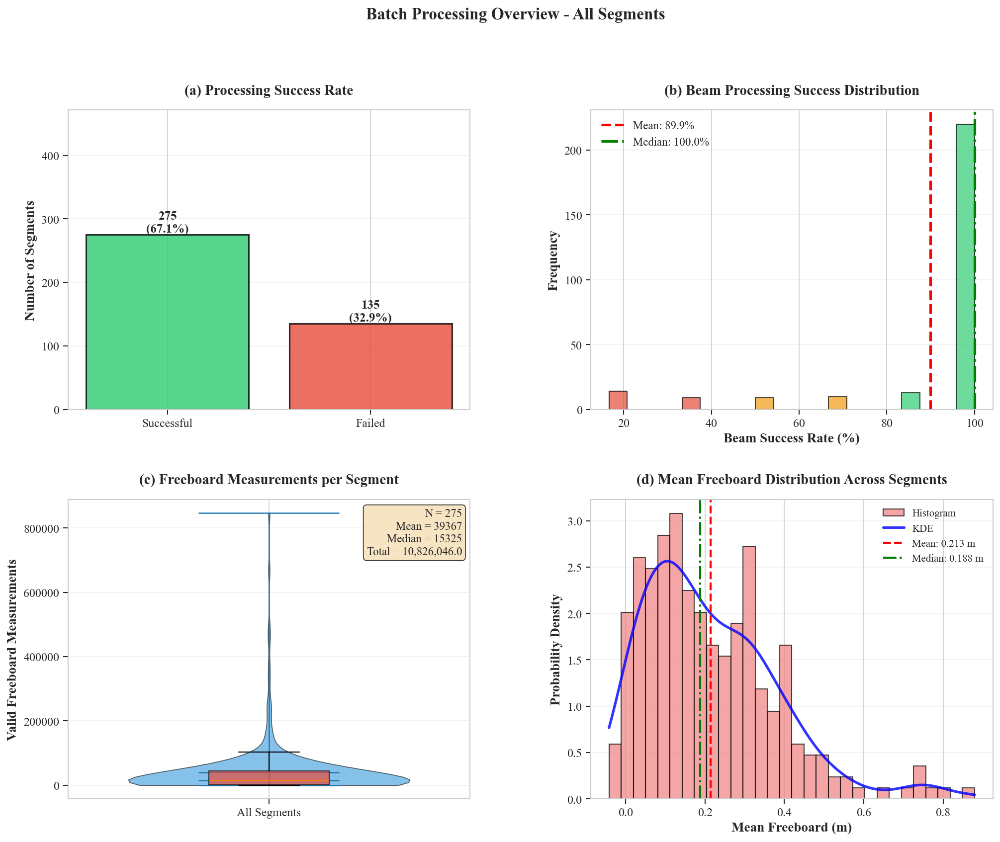

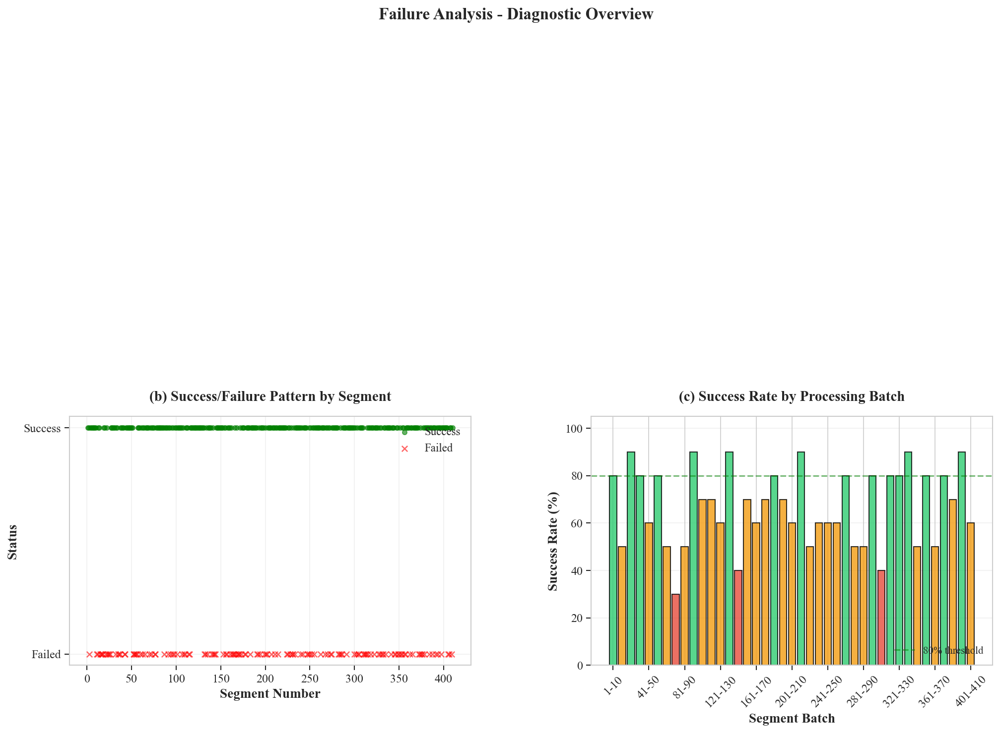


COMPREHENSIVE SUMMARY STATISTICS

📊 OVERALL PROCESSING METRICS:
   Total segments: 410
   Successful: 275 (67.1%)
   Failed: 135
   Total processing time: 5.3 minutes

📏 FREEBOARD STATISTICS:
   Total valid measurements: 10,826,046
   Overall mean: 0.2135 ± 0.1681 m

📈 PER-SEGMENT STATISTICS:
   Mean FB per segment: 39367 measurements
   Median FB per segment: 15325 measurements
   Max FB in single segment: 846943.0 measurements

🛰️ BEAM PROCESSING:
   Mean beam success rate: 89.9%
   Segments with all beams: 220

❌ FAILURE ANALYSIS:
   Total failed segments: 135
   Failure rate: 32.9%

VISUALIZATION COMPLETE


In [17]:
# ============================================================================
# PUBLICATION-QUALITY VISUALIZATION - BATCH PROCESSING RESULTS ANALYSIS
# Comprehensive Assessment of All Segment Freeboard Processing
# ============================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle
import seaborn as sns
from pathlib import Path
import json
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# Set publication-quality style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("paper", font_scale=1.3)
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman', 'DejaVu Serif']
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titleweight'] = 'bold'

# ============================================================================
# LOAD PROCESSING SUMMARY DATA
# ============================================================================

OUTPUT_DIR = Path(r"D:\phd\data\cs2eo\sea_ice_SIR_SAR_L2_E__ATL07_antarctic_2021_09_combined_product\freeboard_results")

# Find most recent processing summary
summary_files = list(OUTPUT_DIR.glob("processing_summary_*.csv"))
if len(summary_files) == 0:
    print("ERROR: No processing summary files found!")
    print(f"Looking in: {OUTPUT_DIR}")
else:
    latest_summary = max(summary_files, key=lambda x: x.stat().st_mtime)
    print(f"Loading: {latest_summary.name}")
    
    df_summary = pd.read_csv(latest_summary)
    
    # Load master statistics if available
    master_file = OUTPUT_DIR / "master_statistics.json"
    if master_file.exists():
        with open(master_file, 'r') as f:
            master_stats = json.load(f)
    else:
        master_stats = None
    
    print(f"\n{'='*80}")
    print("BATCH PROCESSING RESULTS VISUALIZATION")
    print(f"{'='*80}")
    print(f"\nTotal segments processed: {len(df_summary)}")
    print(f"Successful: {df_summary['success'].sum()}")
    print(f"Failed: {(~df_summary['success']).sum()}")
    
    # ========================================================================
    # FIGURE 1: PROCESSING OVERVIEW (2x2 GRID)
    # ========================================================================
    
    fig1 = plt.figure(figsize=(16, 12))
    gs = gridspec.GridSpec(2, 2, figure=fig1, hspace=0.3, wspace=0.3)
    
    # --------------------------------------------------------------------
    # PANEL A: SUCCESS RATE BAR CHART
    # --------------------------------------------------------------------
    ax1 = fig1.add_subplot(gs[0, 0])
    
    success_counts = df_summary['success'].value_counts()
    colors = ['#2ecc71', '#e74c3c']
    labels = [f'Success\n({success_counts.get(True, 0)})', 
              f'Failed\n({success_counts.get(False, 0)})']
    
    bars = ax1.bar(['Successful', 'Failed'], 
                   [success_counts.get(True, 0), success_counts.get(False, 0)],
                   color=colors, edgecolor='black', linewidth=1.5, alpha=0.8)
    
    # Add percentage labels
    total = len(df_summary)
    for i, bar in enumerate(bars):
        height = bar.get_height()
        pct = (height / total) * 100
        ax1.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}\n({pct:.1f}%)',
                ha='center', va='bottom', fontsize=12, fontweight='bold')
    
    ax1.set_ylabel('Number of Segments', fontsize=13)
    ax1.set_title('(a) Processing Success Rate', fontsize=14, pad=15)
    ax1.set_ylim(0, total * 1.15)
    ax1.grid(axis='y', alpha=0.3)
    
    # --------------------------------------------------------------------
    # PANEL B: BEAMS PROCESSED PER SEGMENT
    # --------------------------------------------------------------------
    ax2 = fig1.add_subplot(gs[0, 1])
    
    successful_df = df_summary[df_summary['success']].copy()
    
    if len(successful_df) > 0:
        beam_success_rate = (successful_df['n_beams_successful'] / 
                           successful_df['n_beams_processed'] * 100)
        
        counts, bins, patches = ax2.hist(beam_success_rate, bins=20, 
                                        color='steelblue', edgecolor='black',
                                        linewidth=1, alpha=0.7)
        
        # Color code by success rate
        for i, patch in enumerate(patches):
            bin_center = (bins[i] + bins[i+1]) / 2
            if bin_center >= 80:
                patch.set_facecolor('#2ecc71')
            elif bin_center >= 50:
                patch.set_facecolor('#f39c12')
            else:
                patch.set_facecolor('#e74c3c')
        
        ax2.axvline(beam_success_rate.mean(), color='red', linestyle='--',
                   linewidth=2.5, label=f'Mean: {beam_success_rate.mean():.1f}%')
        ax2.axvline(beam_success_rate.median(), color='green', linestyle='-.',
                   linewidth=2.5, label=f'Median: {beam_success_rate.median():.1f}%')
        
        ax2.set_xlabel('Beam Success Rate (%)', fontsize=13)
        ax2.set_ylabel('Frequency', fontsize=13)
        ax2.set_title('(b) Beam Processing Success Distribution', fontsize=14, pad=15)
        ax2.legend(loc='upper left', fontsize=11)
        ax2.grid(axis='y', alpha=0.3)
    
    # --------------------------------------------------------------------
    # PANEL C: FREEBOARD MEASUREMENTS PER SEGMENT
    # --------------------------------------------------------------------
    ax3 = fig1.add_subplot(gs[1, 0])
    
    if len(successful_df) > 0:
        fb_counts = successful_df['total_valid_freeboard'].values
        
        # Box plot with violin overlay
        parts = ax3.violinplot([fb_counts], positions=[1], showmeans=True,
                              showmedians=True, widths=0.7)
        
        # Style violin
        for pc in parts['bodies']:
            pc.set_facecolor('#3498db')
            pc.set_alpha(0.6)
            pc.set_edgecolor('black')
        
        # Overlay box plot
        bp = ax3.boxplot([fb_counts], positions=[1], widths=0.3,
                        patch_artist=True, showfliers=False)
        bp['boxes'][0].set_facecolor('#e74c3c')
        bp['boxes'][0].set_alpha(0.7)
        
        ax3.set_ylabel('Valid Freeboard Measurements', fontsize=13)
        ax3.set_title('(c) Freeboard Measurements per Segment', fontsize=14, pad=15)
        ax3.set_xticks([1])
        ax3.set_xticklabels(['All Segments'])
        ax3.grid(axis='y', alpha=0.3)
        
        # Add statistics text
        stats_text = (f'N = {len(fb_counts)}\n'
                     f'Mean = {fb_counts.mean():.0f}\n'
                     f'Median = {np.median(fb_counts):.0f}\n'
                     f'Total = {fb_counts.sum():,}')
        ax3.text(0.98, 0.97, stats_text, transform=ax3.transAxes,
                fontsize=11, verticalalignment='top', horizontalalignment='right',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    # --------------------------------------------------------------------
    # PANEL D: MEAN FREEBOARD DISTRIBUTION
    # --------------------------------------------------------------------
    ax4 = fig1.add_subplot(gs[1, 1])
    
    if len(successful_df) > 0:
        mean_fb = successful_df['mean_freeboard'].dropna()
        
        if len(mean_fb) > 0:
            # Histogram with KDE
            n, bins, patches = ax4.hist(mean_fb, bins=30, density=True,
                                       color='lightcoral', edgecolor='black',
                                       linewidth=1, alpha=0.7, label='Histogram')
            
            # KDE overlay
            from scipy.stats import gaussian_kde
            if len(mean_fb) > 10:
                kde = gaussian_kde(mean_fb)
                x_kde = np.linspace(mean_fb.min(), mean_fb.max(), 200)
                ax4.plot(x_kde, kde(x_kde), 'b-', linewidth=2.5,
                        label='KDE', alpha=0.8)
            
            # Statistics lines
            ax4.axvline(mean_fb.mean(), color='red', linestyle='--',
                       linewidth=2, label=f'Mean: {mean_fb.mean():.3f} m')
            ax4.axvline(mean_fb.median(), color='green', linestyle='-.',
                       linewidth=2, label=f'Median: {mean_fb.median():.3f} m')
            
            ax4.set_xlabel('Mean Freeboard (m)', fontsize=13)
            ax4.set_ylabel('Probability Density', fontsize=13)
            ax4.set_title('(d) Mean Freeboard Distribution Across Segments', 
                         fontsize=14, pad=15)
            ax4.legend(loc='upper right', fontsize=10)
            ax4.grid(axis='y', alpha=0.3)
    
    plt.suptitle('Batch Processing Overview - All Segments', 
                fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()
    
    # ========================================================================
    # FIGURE 2: FAILURE ANALYSIS
    # ========================================================================
    
    failed_df = df_summary[~df_summary['success']].copy()
    
    if len(failed_df) > 0:
        fig2 = plt.figure(figsize=(16, 10))
        gs2 = gridspec.GridSpec(2, 2, figure=fig2, hspace=0.3, wspace=0.3)
        
        # Analyze error types
        error_summary = []
        for idx, row in failed_df.iterrows():
            if 'error_summary' in row and isinstance(row['error_summary'], dict):
                for error, count in eval(str(row['error_summary'])).items():
                    error_summary.append(error)
            elif 'error' in row and pd.notna(row['error']):
                error_summary.append(str(row['error']))
        
        if len(error_summary) > 0:
            # Error type frequency
            ax1 = fig2.add_subplot(gs2[0, :])
            error_counts = pd.Series(error_summary).value_counts()
            
            # Truncate long error messages
            labels = [e[:50] + '...' if len(e) > 50 else e for e in error_counts.index]
            
            bars = ax1.barh(range(len(error_counts)), error_counts.values,
                           color='salmon', edgecolor='black', linewidth=1)
            ax1.set_yticks(range(len(error_counts)))
            ax1.set_yticklabels(labels, fontsize=10)
            ax1.set_xlabel('Frequency', fontsize=13)
            ax1.set_title('(a) Failure Reasons - Top Error Types', 
                         fontsize=14, pad=15)
            ax1.grid(axis='x', alpha=0.3)
            
            # Add count labels
            for i, (bar, count) in enumerate(zip(bars, error_counts.values)):
                ax1.text(count, i, f' {count}', va='center', fontsize=10)
        
        # Temporal pattern of failures
        ax2 = fig2.add_subplot(gs2[1, 0])
        segment_numbers = df_summary['segment_file'].str.extract(r'(\d+)')[0].astype(int)
        df_summary['segment_number'] = segment_numbers
        
        # Success/failure by segment number
        ax2.scatter(df_summary[df_summary['success']]['segment_number'],
                   [1]*df_summary['success'].sum(),
                   c='green', marker='o', s=20, alpha=0.6, label='Success')
        ax2.scatter(df_summary[~df_summary['success']]['segment_number'],
                   [0]*len(failed_df),
                   c='red', marker='x', s=30, alpha=0.6, label='Failed')
        
        ax2.set_xlabel('Segment Number', fontsize=13)
        ax2.set_ylabel('Status', fontsize=13)
        ax2.set_yticks([0, 1])
        ax2.set_yticklabels(['Failed', 'Success'])
        ax2.set_title('(b) Success/Failure Pattern by Segment', 
                     fontsize=14, pad=15)
        ax2.legend(loc='upper right', fontsize=11)
        ax2.grid(alpha=0.3)
        
        # Success rate by segment batch
        ax3 = fig2.add_subplot(gs2[1, 1])
        batch_size = 10
        n_batches = len(df_summary) // batch_size + 1
        
        batch_success_rates = []
        batch_labels = []
        
        for i in range(n_batches):
            start_idx = i * batch_size
            end_idx = min((i+1) * batch_size, len(df_summary))
            batch = df_summary.iloc[start_idx:end_idx]
            
            if len(batch) > 0:
                success_rate = batch['success'].sum() / len(batch) * 100
                batch_success_rates.append(success_rate)
                batch_labels.append(f'{start_idx+1}-{end_idx}')
        
        colors = ['#2ecc71' if rate >= 80 else '#f39c12' if rate >= 50 else '#e74c3c' 
                 for rate in batch_success_rates]
        
        ax3.bar(range(len(batch_success_rates)), batch_success_rates,
               color=colors, edgecolor='black', linewidth=1, alpha=0.8)
        ax3.axhline(y=80, color='green', linestyle='--', linewidth=1.5,
                   alpha=0.5, label='80% threshold')
        ax3.set_xlabel('Segment Batch', fontsize=13)
        ax3.set_ylabel('Success Rate (%)', fontsize=13)
        ax3.set_title('(c) Success Rate by Processing Batch', 
                     fontsize=14, pad=15)
        ax3.set_xticks(range(0, len(batch_labels), max(1, len(batch_labels)//10)))
        ax3.set_xticklabels([batch_labels[i] for i in range(0, len(batch_labels), 
                            max(1, len(batch_labels)//10))], rotation=45)
        ax3.set_ylim(0, 105)
        ax3.legend(loc='lower right', fontsize=10)
        ax3.grid(axis='y', alpha=0.3)
        
        plt.suptitle('Failure Analysis - Diagnostic Overview', 
                    fontsize=16, fontweight='bold', y=0.995)
        plt.tight_layout()
        plt.show()
    
    # ========================================================================
    # PRINT SUMMARY STATISTICS
    # ========================================================================
    
    print(f"\n{'='*80}")
    print("COMPREHENSIVE SUMMARY STATISTICS")
    print(f"{'='*80}")
    
    if master_stats:
        print(f"\n📊 OVERALL PROCESSING METRICS:")
        print(f"   Total segments: {master_stats['total_segments_processed']}")
        print(f"   Successful: {master_stats['successful_segments']} ({master_stats['success_rate']:.1f}%)")
        print(f"   Failed: {master_stats['failed_segments']}")
        print(f"   Total processing time: {master_stats['total_processing_time_minutes']:.1f} minutes")
        
        print(f"\n📏 FREEBOARD STATISTICS:")
        print(f"   Total valid measurements: {master_stats['total_valid_freeboard_measurements']:,}")
        if not np.isnan(master_stats['overall_mean_freeboard']):
            print(f"   Overall mean: {master_stats['overall_mean_freeboard']:.4f} ± "
                  f"{master_stats['overall_std_freeboard']:.4f} m")
    
    if len(successful_df) > 0:
        print(f"\n📈 PER-SEGMENT STATISTICS:")
        print(f"   Mean FB per segment: {successful_df['total_valid_freeboard'].mean():.0f} measurements")
        print(f"   Median FB per segment: {successful_df['total_valid_freeboard'].median():.0f} measurements")
        print(f"   Max FB in single segment: {successful_df['total_valid_freeboard'].max()} measurements")
        
        beam_success = (successful_df['n_beams_successful'] / 
                       successful_df['n_beams_processed'] * 100)
        print(f"\n🛰️ BEAM PROCESSING:")
        print(f"   Mean beam success rate: {beam_success.mean():.1f}%")
        print(f"   Segments with all beams: {(successful_df['n_beams_successful'] == 6).sum()}")
    
    if len(failed_df) > 0:
        print(f"\n❌ FAILURE ANALYSIS:")
        print(f"   Total failed segments: {len(failed_df)}")
        print(f"   Failure rate: {len(failed_df)/len(df_summary)*100:.1f}%")
    
    print(f"\n{'='*80}")
    print("VISUALIZATION COMPLETE")
    print(f"{'='*80}")

## 12. Below we extend from analysing all the segments in September 2021 to all the remaining segments in the remaining months from October 2021 to September 2022

In [18]:
# ============================================================================
# COMPREHENSIVE MULTI-MONTH FREEBOARD PROCESSING PIPELINE
# Antarctic CRYO2ICE Dataset: October 2021 - September 2022
# Version 3.0 - Production-Ready Multi-Month Batch Processing
# ============================================================================

import numpy as np
import pandas as pd
import netCDF4 as nc
from pathlib import Path
from scipy.interpolate import interp1d
from scipy.ndimage import median_filter
from scipy.stats import median_abs_deviation
import warnings
from typing import Dict, Tuple, Optional, List
from datetime import datetime
import logging
import json
from tqdm import tqdm
import gc
import psutil
import sys
from concurrent.futures import ProcessPoolExecutor, as_completed
import traceback

warnings.filterwarnings('ignore')

# ============================================================================
# CONFIGURATION
# ============================================================================

# Base directory containing all monthly folders
BASE_DATA_DIR = Path(r"D:\phd\data\cs2eo")

# Define all months to process (October 2021 - September 2022)
MONTHS_TO_PROCESS = [
    "2021_10", "2021_11", "2021_12",
    "2022_01", "2022_02", "2022_03",
    "2022_04", "2022_05", "2022_06",
    "2022_07", "2022_08", "2022_09"
]

# ICESat-2 fill values
FILL_VALUE_FLOAT32 = 3.4028235e+38
FILL_VALUE_THRESHOLD = 1e10

# Physical constraints
FREEBOARD_MIN = -0.5
FREEBOARD_MAX = 3.0
SEGMENT_HEIGHT_MIN = -3.0
SEGMENT_HEIGHT_MAX = 5.0
MIN_LEADS_THRESHOLD = 3
LEAD_HEIGHT_MAX = 0.3

# Processing configuration
SAVE_EVERY_N = 10
USE_MULTIPROCESSING = False  # Set to True for parallel processing (requires careful memory management)
MAX_WORKERS = 4  # Number of parallel workers

# ============================================================================
# LOGGING SETUP
# ============================================================================

def setup_logging(log_dir: Path, month_id: str) -> logging.Logger:
    """Setup logging for a specific month"""
    log_file = log_dir / f"freeboard_processing_{month_id}_{datetime.now().strftime('%Y%m%d_%H%M%S')}.log"
    
    # Create logger
    logger = logging.getLogger(f"freeboard_{month_id}")
    logger.setLevel(logging.INFO)
    logger.handlers.clear()  # Clear existing handlers
    
    # File handler
    file_handler = logging.FileHandler(log_file, encoding='utf-8')
    file_handler.setLevel(logging.INFO)
    file_formatter = logging.Formatter('%(asctime)s - %(levelname)s - %(message)s')
    file_handler.setFormatter(file_formatter)
    
    # Console handler
    console_handler = logging.StreamHandler(sys.stdout)
    console_handler.setLevel(logging.INFO)
    console_formatter = logging.Formatter('%(asctime)s - %(levelname)s - %(message)s')
    console_handler.setFormatter(console_formatter)
    
    logger.addHandler(file_handler)
    logger.addHandler(console_handler)
    
    return logger

# ============================================================================
# UTILITY FUNCTIONS
# ============================================================================

def clean_fill_values(array: np.ndarray) -> np.ndarray:
    """Replace fill values with NaN"""
    array_clean = array.copy()
    array_clean[np.abs(array) > FILL_VALUE_THRESHOLD] = np.nan
    array_clean[array == FILL_VALUE_FLOAT32] = np.nan
    array_clean[~np.isfinite(array)] = np.nan
    return array_clean

def get_memory_usage():
    """Get current memory usage in MB"""
    process = psutil.Process()
    return process.memory_info().rss / 1024 / 1024

def find_atl07_group(nc_file) -> Optional[object]:
    """Dynamically find the ATL07 group in NetCDF file"""
    try:
        # Strategy 1: Check for numbered group
        for group_name in nc_file.groups.keys():
            if group_name.isdigit():
                sub_group = nc_file.groups[group_name]
                if 'ATL07' in sub_group.groups:
                    return sub_group.groups['ATL07']
        
        # Strategy 2: Check for ATL07 directly
        if 'ATL07' in nc_file.groups:
            return nc_file.groups['ATL07']
        
        # Strategy 3: Check if beams are in root
        if any(key.startswith('gt') for key in nc_file.groups.keys()):
            return nc_file
        
        # Strategy 4: Recursive search
        def recursive_search(group, depth=0, max_depth=3):
            if depth > max_depth:
                return None
            if any(key.startswith('gt') for key in group.groups.keys()):
                return group
            if 'ATL07' in group.groups:
                return group.groups['ATL07']
            for sub_group in group.groups.values():
                result = recursive_search(sub_group, depth + 1, max_depth)
                if result is not None:
                    return result
            return None
        
        return recursive_search(nc_file)
        
    except Exception as e:
        return None

# ============================================================================
# FREEBOARD ESTIMATION - SINGLE BEAM
# ============================================================================

def estimate_freeboard_single_beam(
    beam_group,
    beam_name: str,
    segment_file: str,
    verbose: bool = False
) -> Tuple[Optional[pd.DataFrame], Dict]:
    """Estimate total freeboard for a single beam"""
    
    stats = {
        'segment_file': segment_file,
        'beam': beam_name,
        'success': False,
        'n_segments': 0,
        'n_leads': 0,
        'n_ice': 0,
        'n_valid_freeboard': 0,
        'mean_freeboard': np.nan,
        'std_freeboard': np.nan,
        'median_freeboard': np.nan,
        'lead_detection_method': None,
        'valid_data_pct': 0.0,
        'processing_time_seconds': 0.0,
        'error_message': None
    }
    
    start_time = datetime.now()
    
    try:
        # Load data
        seg_group = beam_group.groups['sea_ice_segments']
        heights_group = seg_group.groups['heights']
        stats_group = seg_group.groups['stats']
        geophys_group = seg_group.groups['geophysical']
        
        latitude = np.array(seg_group.variables['latitude'][:])
        longitude = np.array(seg_group.variables['longitude'][:])
        delta_time = np.array(seg_group.variables['delta_time'][:])
        seg_dist_x = np.array(seg_group.variables['seg_dist_x'][:])
        
        h_segment_raw = np.array(heights_group.variables['height_segment_height'][:])
        h_segment = clean_fill_values(h_segment_raw)
        
        h_confidence = np.array(heights_group.variables['height_segment_confidence'][:])
        h_type = np.array(heights_group.variables['height_segment_type'][:])
        ssh_flag = np.array(heights_group.variables['height_segment_ssh_flag'][:])
        gaussian_width = clean_fill_values(np.array(heights_group.variables['height_segment_w_gaussian'][:]))
        photon_rate = clean_fill_values(np.array(stats_group.variables['photon_rate'][:]))
        cloud_flag = np.array(stats_group.variables['cloud_flag_asr'][:])
        
        ocean_tide = clean_fill_values(np.array(geophys_group.variables['height_segment_ocean'][:]))
        ib_correction = clean_fill_values(np.array(geophys_group.variables['height_segment_ib'][:]))
        
        n_segments = len(latitude)
        stats['n_segments'] = n_segments
        
        valid_data_pct = np.sum(~np.isnan(h_segment)) / n_segments * 100
        stats['valid_data_pct'] = valid_data_pct
        
        if valid_data_pct < 10:
            stats['error_message'] = f"Insufficient valid data ({valid_data_pct:.1f}%)"
            return None, stats
        
        # Apply corrections
        ocean_tide_filled = np.where(np.isnan(ocean_tide), 0.0, ocean_tide)
        ib_filled = np.where(np.isnan(ib_correction), 0.0, ib_correction)
        h_corrected = h_segment - ocean_tide_filled - ib_filled
        valid_mask = ~np.isnan(h_corrected)
        
        # Lead detection
        height_range_mask = (h_corrected >= SEGMENT_HEIGHT_MIN) & (h_corrected <= SEGMENT_HEIGHT_MAX) & valid_mask
        
        lead_type_mask = (h_type >= 2) & height_range_mask
        ssh_mask = (ssh_flag == 1) & height_range_mask
        
        physical_lead_mask = (h_corrected >= -0.5) & (h_corrected <= LEAD_HEIGHT_MAX) & height_range_mask
        physical_lead_mask &= (h_confidence >= 2)
        if not np.isnan(gaussian_width).all():
            physical_lead_mask &= (gaussian_width < 0.4) | np.isnan(gaussian_width)
        if not np.isnan(photon_rate).all():
            physical_lead_mask &= (photon_rate > 0.5) | np.isnan(photon_rate)
        
        if np.sum(valid_mask) >= 20:
            percentile_15 = np.nanpercentile(h_corrected[valid_mask], 15)
            percentile_mask = (h_corrected <= percentile_15) & height_range_mask & (h_confidence >= 1)
        else:
            percentile_mask = np.zeros(n_segments, dtype=bool)
        
        relaxed_mask = (h_corrected >= -1.0) & (h_corrected <= 0.5) & height_range_mask
        relaxed_mask &= (h_confidence >= 1)
        
        counts = {
            'type_flagged': np.sum(lead_type_mask),
            'ssh_flagged': np.sum(ssh_mask),
            'type_or_ssh': np.sum((lead_type_mask | ssh_mask) & height_range_mask),
            'physical_characteristics': np.sum(physical_lead_mask),
            'percentile_15': np.sum(percentile_mask),
            'relaxed': np.sum(relaxed_mask)
        }
        
        if counts['type_flagged'] >= MIN_LEADS_THRESHOLD:
            lead_mask = lead_type_mask
            method = "TYPE_FLAGGED"
        elif counts['ssh_flagged'] >= MIN_LEADS_THRESHOLD:
            lead_mask = ssh_mask
            method = "SSH_FLAGGED"
        elif counts['type_or_ssh'] >= MIN_LEADS_THRESHOLD:
            lead_mask = (lead_type_mask | ssh_mask) & height_range_mask
            method = "TYPE_OR_SSH"
        elif counts['physical_characteristics'] >= MIN_LEADS_THRESHOLD:
            lead_mask = physical_lead_mask
            method = "PHYSICAL_CHARACTERISTICS"
        elif counts['percentile_15'] >= MIN_LEADS_THRESHOLD:
            lead_mask = percentile_mask
            method = "PERCENTILE_15"
        elif counts['relaxed'] >= MIN_LEADS_THRESHOLD:
            lead_mask = relaxed_mask
            method = "RELAXED"
        else:
            stats['error_message'] = f"Insufficient leads (max: {max(counts.values())})"
            return None, stats
        
        n_leads = np.sum(lead_mask)
        stats['n_leads'] = n_leads
        stats['lead_detection_method'] = method
        
        # SSH interpolation
        lead_heights = h_corrected[lead_mask].copy()
        lead_distances = seg_dist_x[lead_mask].copy()
        
        valid_leads = ~np.isnan(lead_heights)
        lead_heights = lead_heights[valid_leads]
        lead_distances = lead_distances[valid_leads]
        
        if len(lead_heights) < MIN_LEADS_THRESHOLD:
            stats['error_message'] = f"Too few valid leads ({len(lead_heights)})"
            return None, stats
        
        # Outlier removal
        if len(lead_heights) >= 5:
            mad = median_abs_deviation(lead_heights, nan_policy='omit')
            median_lead = np.nanmedian(lead_heights)
            if mad > 0:
                outlier_mask = np.abs(lead_heights - median_lead) > (3.0 * mad)
                lead_heights = lead_heights[~outlier_mask]
                lead_distances = lead_distances[~outlier_mask]
        
        n_leads_clean = len(lead_heights)
        
        if n_leads_clean < MIN_LEADS_THRESHOLD:
            stats['error_message'] = f"Insufficient leads after outlier removal ({n_leads_clean})"
            return None, stats
        
        # Sort and smooth
        sort_idx = np.argsort(lead_distances)
        lead_distances_sorted = lead_distances[sort_idx]
        lead_heights_sorted = lead_heights[sort_idx]
        
        if n_leads_clean >= 10:
            window = min(11, n_leads_clean // 5)
            if window % 2 == 0:
                window += 1
            lead_heights_smoothed = median_filter(lead_heights_sorted, size=window, mode='nearest')
        else:
            lead_heights_smoothed = lead_heights_sorted
        
        # Interpolate
        try:
            if n_leads_clean >= 4:
                f_ssh = interp1d(lead_distances_sorted, lead_heights_smoothed,
                               kind='cubic', bounds_error=False,
                               fill_value=(lead_heights_smoothed[0], lead_heights_smoothed[-1]))
            else:
                f_ssh = interp1d(lead_distances_sorted, lead_heights_smoothed,
                               kind='linear', bounds_error=False,
                               fill_value=(lead_heights_smoothed[0], lead_heights_smoothed[-1]))
            ssh_interpolated = f_ssh(seg_dist_x)
        except:
            ssh_interpolated = np.full(n_segments, np.nanmean(lead_heights))
        
        # Calculate freeboard
        ice_mask = (h_type == 1) & valid_mask
        n_ice = np.sum(ice_mask)
        stats['n_ice'] = n_ice
        
        if n_ice == 0:
            stats['error_message'] = "No ice segments"
            return None, stats
        
        freeboard = np.full(n_segments, np.nan)
        freeboard[ice_mask] = h_corrected[ice_mask] - ssh_interpolated[ice_mask]
        
        fb_valid_mask = (freeboard >= FREEBOARD_MIN) & (freeboard <= FREEBOARD_MAX)
        freeboard[~fb_valid_mask] = np.nan
        
        n_valid_fb = np.sum(~np.isnan(freeboard))
        stats['n_valid_freeboard'] = n_valid_fb
        
        if n_valid_fb == 0:
            stats['error_message'] = "No valid freeboard after filtering"
            return None, stats
        
        stats['mean_freeboard'] = np.nanmean(freeboard)
        stats['std_freeboard'] = np.nanstd(freeboard)
        stats['median_freeboard'] = np.nanmedian(freeboard)
        stats['success'] = True
        
        # Create output
        output_df = pd.DataFrame({
            'segment_file': segment_file,
            'beam': beam_name,
            'latitude': latitude,
            'longitude': longitude,
            'delta_time': delta_time,
            'seg_dist_x': seg_dist_x,
            'height_segment': h_segment_raw,
            'height_corrected': h_corrected,
            'ssh_interpolated': ssh_interpolated,
            'freeboard_total': freeboard,
            'surface_type': h_type,
            'confidence': h_confidence,
            'ssh_flag': ssh_flag,
            'photon_rate': photon_rate,
            'gaussian_width': gaussian_width,
            'cloud_flag': cloud_flag,
            'ocean_tide': ocean_tide_filled,
            'ib_correction': ib_filled,
            'is_lead': lead_mask,
            'is_ice': ice_mask,
            'is_valid_fb': ~np.isnan(freeboard)
        })
        
        stats['processing_time_seconds'] = (datetime.now() - start_time).total_seconds()
        
        return output_df, stats
        
    except Exception as e:
        stats['error_message'] = f"Exception: {str(e)}"
        stats['processing_time_seconds'] = (datetime.now() - start_time).total_seconds()
        return None, stats

# ============================================================================
# SEGMENT PROCESSING
# ============================================================================

def process_single_segment(segment_file: Path, output_dirs: Dict[str, Path], 
                          logger: logging.Logger) -> Tuple[str, bool, Dict]:
    """Process a single segment file"""
    
    segment_name = segment_file.stem
    
    try:
        nc_file = nc.Dataset(segment_file, 'r')
        
        try:
            atl07_group = find_atl07_group(nc_file)
            
            if atl07_group is None:
                raise ValueError("Could not find ATL07 data structure")
            
            beam_groups = [key for key in atl07_group.groups.keys() if key.startswith('gt')]
            beam_groups.sort()
            
            if len(beam_groups) == 0:
                raise ValueError("No beam groups found")
            
            all_results = []
            all_stats = []
            
            for beam_name in beam_groups:
                beam_group = atl07_group.groups[beam_name]
                result_df, beam_stats = estimate_freeboard_single_beam(
                    beam_group, beam_name, segment_name, verbose=False
                )
                
                if result_df is not None:
                    all_results.append(result_df)
                
                all_stats.append(beam_stats)
        
        finally:
            nc_file.close()
            gc.collect()
        
        if len(all_results) > 0:
            combined_df = pd.concat(all_results, ignore_index=True)
            output_file = output_dirs['results'] / f"{segment_name}_freeboard.csv"
            combined_df.to_csv(output_file, index=False)
            
            stats_df = pd.DataFrame(all_stats)
            stats_file = output_dirs['stats'] / f"{segment_name}_stats.csv"
            stats_df.to_csv(stats_file, index=False)
            
            summary = {
                'segment_file': segment_name,
                'success': True,
                'n_beams_processed': len(beam_groups),
                'n_beams_successful': len(all_results),
                'total_valid_freeboard': int(combined_df['is_valid_fb'].sum()),
                'mean_freeboard': float(combined_df['freeboard_total'].mean()),
                'std_freeboard': float(combined_df['freeboard_total'].std()),
                'processing_timestamp': datetime.now().isoformat()
            }
            
            return segment_name, True, summary
        else:
            stats_df = pd.DataFrame(all_stats)
            failed_file = output_dirs['failed'] / f"{segment_name}_failed_stats.csv"
            stats_df.to_csv(failed_file, index=False)
            
            summary = {
                'segment_file': segment_name,
                'success': False,
                'n_beams_processed': len(beam_groups),
                'n_beams_successful': 0,
                'error_summary': stats_df['error_message'].value_counts().to_dict() if len(stats_df) > 0 else {},
                'processing_timestamp': datetime.now().isoformat()
            }
            
            return segment_name, False, summary
        
    except Exception as e:
        logger.error(f"ERROR processing {segment_name}: {str(e)}")
        
        summary = {
            'segment_file': segment_name,
            'success': False,
            'error': str(e),
            'processing_timestamp': datetime.now().isoformat()
        }
        
        return segment_name, False, summary

# ============================================================================
# MONTHLY PROCESSING
# ============================================================================

def process_single_month(month_id: str) -> Dict:
    """Process all segments in a single month"""
    
    # Construct paths
    month_dir = BASE_DATA_DIR / f"sea_ice_SIR_SAR_L2_E__ATL07_antarctic_{month_id}_combined_product"
    
    if not month_dir.exists():
        return {
            'month_id': month_id,
            'status': 'SKIPPED',
            'reason': 'Directory not found',
            'directory': str(month_dir)
        }
    
    # Create output directories
    output_dir = month_dir / "freeboard_results"
    output_dir.mkdir(exist_ok=True)
    
    results_dir = output_dir / "csv_results"
    stats_dir = output_dir / "statistics"
    logs_dir = output_dir / "logs"
    failed_dir = output_dir / "failed_segments"
    
    for dir_path in [results_dir, stats_dir, logs_dir, failed_dir]:
        dir_path.mkdir(exist_ok=True)
    
    output_dirs = {
        'results': results_dir,
        'stats': stats_dir,
        'logs': logs_dir,
        'failed': failed_dir
    }
    
    # Setup logging
    logger = setup_logging(logs_dir, month_id)
    
    logger.info("="*80)
    logger.info(f"PROCESSING MONTH: {month_id}")
    logger.info("="*80)
    logger.info(f"Input directory: {month_dir}")
    logger.info(f"Output directory: {output_dir}")
    
    # Find segments
    segment_files = sorted(list(month_dir.glob("segment_*.nc")))
    n_segments = len(segment_files)
    
    if n_segments == 0:
        logger.warning("No segment files found!")
        return {
            'month_id': month_id,
            'status': 'NO_DATA',
            'n_segments': 0
        }
    
    logger.info(f"Found {n_segments} segments")
    
    # Process segments
    all_summaries = []
    successful_count = 0
    failed_count = 0
    start_time = datetime.now()
    
    for i, segment_file in enumerate(tqdm(segment_files, desc=f"Processing {month_id}"), 1):
        seg_name, success, summary = process_single_segment(segment_file, output_dirs, logger)
        all_summaries.append(summary)
        
        if success:
            successful_count += 1
            logger.info(f"[{i}/{n_segments}] SUCCESS: {seg_name}")
        else:
            failed_count += 1
            logger.warning(f"[{i}/{n_segments}] FAILED: {seg_name}")
        
        if i % SAVE_EVERY_N == 0:
            temp_summary = pd.DataFrame(all_summaries)
            temp_file = output_dir / f"progress_checkpoint_{i}.csv"
            temp_summary.to_csv(temp_file, index=False)
            gc.collect()
    
    end_time = datetime.now()
    total_time = (end_time - start_time).total_seconds()
    
    # Save final summary
    summary_df = pd.DataFrame(all_summaries)
    summary_file = output_dir / f"processing_summary_{month_id}_{datetime.now().strftime('%Y%m%d_%H%M%S')}.csv"
    summary_df.to_csv(summary_file, index=False)
    
    # Create master statistics
    successful_segments = [s for s in all_summaries if s['success']]
    
    if len(successful_segments) > 0:
        total_fb = sum(s.get('total_valid_freeboard', 0) for s in successful_segments)
        fb_means = [s['mean_freeboard'] for s in successful_segments 
                   if not np.isnan(s.get('mean_freeboard', np.nan))]
        
        master_stats = {
            'month_id': month_id,
            'total_segments_processed': n_segments,
            'successful_segments': successful_count,
            'failed_segments': failed_count,
            'success_rate': successful_count / n_segments * 100,
            'total_valid_freeboard_measurements': int(total_fb),
            'overall_mean_freeboard': float(np.mean(fb_means)) if fb_means else np.nan,
            'overall_std_freeboard': float(np.std(fb_means)) if fb_means else np.nan,
            'processing_start_time': start_time.isoformat(),
            'processing_end_time': end_time.isoformat(),
            'total_processing_time_minutes': total_time / 60,
            'output_directory': str(output_dir)
        }
        
        master_file = output_dir / "master_statistics.json"
        with open(master_file, 'w', encoding='utf-8') as f:
            json.dump(master_stats, f, indent=2)
        
        logger.info("\n" + "="*80)
        logger.info("MONTH PROCESSING COMPLETE")
        logger.info("="*80)
        logger.info(f"Success rate: {master_stats['success_rate']:.1f}%")
        logger.info(f"Total valid freeboard: {master_stats['total_valid_freeboard_measurements']:,}")
        if not np.isnan(master_stats['overall_mean_freeboard']):
            logger.info(f"Mean freeboard: {master_stats['overall_mean_freeboard']:.4f} m")
        logger.info(f"Processing time: {master_stats['total_processing_time_minutes']:.1f} minutes")
        
        return master_stats
    else:
        logger.error("No successful segments!")
        return {
            'month_id': month_id,
            'status': 'FAILED',
            'n_segments': n_segments,
            'processing_time_minutes': total_time / 60
        }

# ============================================================================
# MULTI-MONTH ORCHESTRATOR
# ============================================================================

def process_all_months():
    """Process all months from October 2021 to September 2022"""
    
    print("="*80)
    print("MULTI-MONTH FREEBOARD PROCESSING PIPELINE")
    print("Antarctic CRYO2ICE: October 2021 - September 2022")
    print("="*80)
    print(f"\nMonths to process: {len(MONTHS_TO_PROCESS)}")
    print(f"Months: {', '.join(MONTHS_TO_PROCESS)}")
    
    overall_start = datetime.now()
    monthly_results = []
    
    for i, month_id in enumerate(MONTHS_TO_PROCESS, 1):
        print(f"\n{'='*80}")
        print(f"[{i}/{len(MONTHS_TO_PROCESS)}] PROCESSING: {month_id}")
        print(f"{'='*80}")
        
        month_stats = process_single_month(month_id)
        monthly_results.append(month_stats)
        
        # Save progress
        progress_df = pd.DataFrame(monthly_results)
        progress_file = BASE_DATA_DIR / f"multi_month_progress_{datetime.now().strftime('%Y%m%d_%H%M%S')}.csv"
        progress_df.to_csv(progress_file, index=False)
        
        gc.collect()
    
    overall_end = datetime.now()
    total_time = (overall_end - overall_start).total_seconds()
    
    # Final summary
    print("\n" + "="*80)
    print("ALL MONTHS PROCESSING COMPLETE")
    print("="*80)
    
    results_df = pd.DataFrame(monthly_results)
    final_file = BASE_DATA_DIR / f"all_months_summary_{datetime.now().strftime('%Y%m%d_%H%M%S')}.csv"
    results_df.to_csv(final_file, index=False)
    
    print(f"\nFinal summary saved: {final_file}")
    print(f"Total processing time: {total_time/3600:.2f} hours")
    
    # Print summary table
    print("\n" + "="*80)
    print("MONTHLY SUMMARY")
    print("="*80)
    for result in monthly_results:
        month = result['month_id']
        status = result.get('status', 'PROCESSED')
        if status == 'PROCESSED' or 'successful_segments' in result:
            success = result.get('successful_segments', 0)
            total = result.get('total_segments_processed', 0)
            rate = result.get('success_rate', 0)
            fb_total = result.get('total_valid_freeboard_measurements', 0)
            print(f"{month}: {success}/{total} segments ({rate:.1f}%), {fb_total:,} FB measurements")
        else:
            print(f"{month}: {status}")
    
    print("\n" + "="*80)
    print("PIPELINE COMPLETE")
    print("="*80)

# ============================================================================
# EXECUTE
# ============================================================================

if __name__ == "__main__":
    process_all_months()

2025-10-23 21:31:20,424 - INFO - [79/110] SUCCESS: segment_70


2025-10-23 21:31:20,424 - INFO - [79/110] SUCCESS: segment_70
Processing 2022_09:  72%|███████▏  | 79/110 [01:49<02:15,  4.37s/it]

2025-10-23 21:31:21,280 - INFO - [80/110] SUCCESS: segment_71


2025-10-23 21:31:21,280 - INFO - [80/110] SUCCESS: segment_71
Processing 2022_09:  73%|███████▎  | 80/110 [01:50<01:40,  3.34s/it]

2025-10-23 21:31:21,694 - INFO - [81/110] SUCCESS: segment_72


2025-10-23 21:31:21,694 - INFO - [81/110] SUCCESS: segment_72
Processing 2022_09:  74%|███████▎  | 81/110 [01:50<01:10,  2.44s/it]

2025-10-23 21:31:21,965 - WARNING - [82/110] FAILED: segment_73


2025-10-23 21:31:21,965 - WARNING - [82/110] FAILED: segment_73
Processing 2022_09:  75%|███████▍  | 82/110 [01:50<00:50,  1.79s/it]

2025-10-23 21:31:22,581 - INFO - [83/110] SUCCESS: segment_74


2025-10-23 21:31:22,581 - INFO - [83/110] SUCCESS: segment_74
Processing 2022_09:  75%|███████▌  | 83/110 [01:51<00:38,  1.44s/it]

2025-10-23 21:31:22,855 - WARNING - [84/110] FAILED: segment_75


2025-10-23 21:31:22,855 - WARNING - [84/110] FAILED: segment_75
Processing 2022_09:  76%|███████▋  | 84/110 [01:51<00:28,  1.09s/it]

2025-10-23 21:31:23,157 - WARNING - [85/110] FAILED: segment_76


2025-10-23 21:31:23,157 - WARNING - [85/110] FAILED: segment_76
Processing 2022_09:  77%|███████▋  | 85/110 [01:51<00:21,  1.17it/s]

2025-10-23 21:31:23,813 - INFO - [86/110] SUCCESS: segment_77


2025-10-23 21:31:23,813 - INFO - [86/110] SUCCESS: segment_77
Processing 2022_09:  78%|███████▊  | 86/110 [01:52<00:19,  1.26it/s]

2025-10-23 21:31:24,120 - WARNING - [87/110] FAILED: segment_78


2025-10-23 21:31:24,120 - WARNING - [87/110] FAILED: segment_78
Processing 2022_09:  79%|███████▉  | 87/110 [01:52<00:14,  1.55it/s]

2025-10-23 21:31:24,645 - INFO - [88/110] SUCCESS: segment_79


2025-10-23 21:31:24,645 - INFO - [88/110] SUCCESS: segment_79
Processing 2022_09:  80%|████████  | 88/110 [01:53<00:13,  1.64it/s]

2025-10-23 21:31:25,162 - INFO - [89/110] SUCCESS: segment_8


2025-10-23 21:31:25,162 - INFO - [89/110] SUCCESS: segment_8
Processing 2022_09:  81%|████████  | 89/110 [01:53<00:12,  1.72it/s]

2025-10-23 21:31:27,483 - INFO - [90/110] SUCCESS: segment_80


2025-10-23 21:31:27,483 - INFO - [90/110] SUCCESS: segment_80
Processing 2022_09:  82%|████████▏ | 90/110 [01:56<00:22,  1.13s/it]

2025-10-23 21:31:27,832 - WARNING - [91/110] FAILED: segment_81


2025-10-23 21:31:27,832 - WARNING - [91/110] FAILED: segment_81
Processing 2022_09:  83%|████████▎ | 91/110 [01:56<00:16,  1.15it/s]

2025-10-23 21:31:28,097 - WARNING - [92/110] FAILED: segment_82


2025-10-23 21:31:28,097 - WARNING - [92/110] FAILED: segment_82
Processing 2022_09:  84%|████████▎ | 92/110 [01:56<00:12,  1.44it/s]

2025-10-23 21:31:28,413 - INFO - [93/110] SUCCESS: segment_83


2025-10-23 21:31:28,413 - INFO - [93/110] SUCCESS: segment_83
Processing 2022_09:  85%|████████▍ | 93/110 [01:57<00:09,  1.74it/s]

2025-10-23 21:31:28,745 - WARNING - [94/110] FAILED: segment_84


2025-10-23 21:31:28,745 - WARNING - [94/110] FAILED: segment_84
Processing 2022_09:  85%|████████▌ | 94/110 [01:57<00:08,  1.99it/s]

2025-10-23 21:31:32,626 - INFO - [95/110] SUCCESS: segment_85


2025-10-23 21:31:32,626 - INFO - [95/110] SUCCESS: segment_85
Processing 2022_09:  86%|████████▋ | 95/110 [02:01<00:22,  1.52s/it]

2025-10-23 21:31:33,584 - INFO - [96/110] SUCCESS: segment_86


2025-10-23 21:31:33,584 - INFO - [96/110] SUCCESS: segment_86
Processing 2022_09:  87%|████████▋ | 96/110 [02:02<00:18,  1.35s/it]

2025-10-23 21:31:34,033 - INFO - [97/110] SUCCESS: segment_87


2025-10-23 21:31:34,033 - INFO - [97/110] SUCCESS: segment_87
Processing 2022_09:  88%|████████▊ | 97/110 [02:02<00:14,  1.08s/it]

2025-10-23 21:31:34,433 - WARNING - [98/110] FAILED: segment_88


2025-10-23 21:31:34,433 - WARNING - [98/110] FAILED: segment_88
Processing 2022_09:  89%|████████▉ | 98/110 [02:03<00:10,  1.14it/s]

2025-10-23 21:31:36,468 - INFO - [99/110] SUCCESS: segment_89


2025-10-23 21:31:36,468 - INFO - [99/110] SUCCESS: segment_89
Processing 2022_09:  90%|█████████ | 99/110 [02:05<00:13,  1.22s/it]

2025-10-23 21:31:36,784 - WARNING - [100/110] FAILED: segment_9


2025-10-23 21:31:36,784 - WARNING - [100/110] FAILED: segment_9
Processing 2022_09:  91%|█████████ | 100/110 [02:05<00:09,  1.01it/s]

2025-10-23 21:31:37,168 - WARNING - [101/110] FAILED: segment_90


2025-10-23 21:31:37,168 - WARNING - [101/110] FAILED: segment_90
Processing 2022_09:  92%|█████████▏| 101/110 [02:05<00:06,  1.30it/s]

2025-10-23 21:31:37,451 - WARNING - [102/110] FAILED: segment_91


2025-10-23 21:31:37,451 - WARNING - [102/110] FAILED: segment_91
Processing 2022_09:  93%|█████████▎| 102/110 [02:06<00:04,  1.60it/s]

2025-10-23 21:31:37,785 - WARNING - [103/110] FAILED: segment_92


2025-10-23 21:31:37,785 - WARNING - [103/110] FAILED: segment_92
Processing 2022_09:  94%|█████████▎| 103/110 [02:06<00:03,  1.86it/s]

2025-10-23 21:31:38,052 - WARNING - [104/110] FAILED: segment_93


2025-10-23 21:31:38,052 - WARNING - [104/110] FAILED: segment_93
Processing 2022_09:  95%|█████████▍| 104/110 [02:06<00:02,  2.19it/s]

2025-10-23 21:31:53,275 - INFO - [105/110] SUCCESS: segment_94


2025-10-23 21:31:53,275 - INFO - [105/110] SUCCESS: segment_94
Processing 2022_09:  95%|█████████▌| 105/110 [02:22<00:24,  4.89s/it]

2025-10-23 21:31:53,609 - INFO - [106/110] SUCCESS: segment_95


2025-10-23 21:31:53,609 - INFO - [106/110] SUCCESS: segment_95
Processing 2022_09:  96%|█████████▋| 106/110 [02:22<00:14,  3.52s/it]

2025-10-23 21:31:59,028 - INFO - [107/110] SUCCESS: segment_96


2025-10-23 21:31:59,028 - INFO - [107/110] SUCCESS: segment_96
Processing 2022_09:  97%|█████████▋| 107/110 [02:27<00:12,  4.09s/it]

2025-10-23 21:31:59,707 - INFO - [108/110] SUCCESS: segment_97


2025-10-23 21:31:59,707 - INFO - [108/110] SUCCESS: segment_97
Processing 2022_09:  98%|█████████▊| 108/110 [02:28<00:06,  3.07s/it]

2025-10-23 21:32:00,145 - WARNING - [109/110] FAILED: segment_98


2025-10-23 21:32:00,145 - WARNING - [109/110] FAILED: segment_98
Processing 2022_09:  99%|█████████▉| 109/110 [02:28<00:02,  2.28s/it]

2025-10-23 21:32:00,545 - INFO - [110/110] SUCCESS: segment_99


2025-10-23 21:32:00,545 - INFO - [110/110] SUCCESS: segment_99
Processing 2022_09: 100%|██████████| 110/110 [02:29<00:00,  1.36s/it]

2025-10-23 21:32:00,645 - INFO - 



2025-10-23 21:32:00,645 - INFO - 


2025-10-23 21:32:00,645 - INFO - MONTH PROCESSING COMPLETE


2025-10-23 21:32:00,645 - INFO - MONTH PROCESSING COMPLETE


2025-10-23 21:32:00,645 - INFO - ================================================================================


2025-10-23 21:32:00,645 - INFO - ================================================================================


2025-10-23 21:32:00,645 - INFO - Success rate: 66.4%


2025-10-23 21:32:00,645 - INFO - Success rate: 66.4%


2025-10-23 21:32:00,645 - INFO - Total valid freeboard: 4,732,758


2025-10-23 21:32:00,645 - INFO - Total valid freeboard: 4,732,758


2025-10-23 21:32:00,655 - INFO - Mean freeboard: 0.1643 m


2025-10-23 21:32:00,655 - INFO - Mean freeboard: 0.1643 m


2025-10-23 21:32:00,657 - INFO - Processing time: 2.5 minutes


2025-10-23 21:32:00,657 - INFO - Processing time: 2.5 minutes



ALL MONTHS PROCESSING COMPLETE

Final summary saved: D:\phd\data\cs2eo\all_months_summary_20251023_213200.csv
Total processing time: 0.64 hours

MONTHLY SUMMARY
2021_10: 235/339 segments (69.3%), 8,481,930 FB measurements
2021_11: 239/394 segments (60.7%), 6,820,444 FB measurements
2021_12: 140/257 segments (54.5%), 3,436,155 FB measurements
2022_01: 79/129 segments (61.2%), 1,628,155 FB measurements
2022_02: 21/33 segments (63.6%), 319,535 FB measurements
2022_03: 59/84 segments (70.2%), 1,728,034 FB measurements
2022_04: 83/123 segments (67.5%), 2,278,470 FB measurements
2022_05: 192/251 segments (76.5%), 6,028,575 FB measurements
2022_06: 285/365 segments (78.1%), 10,119,636 FB measurements
2022_07: 56/71 segments (78.9%), 5,977,353 FB measurements
2022_08: 69/93 segments (74.2%), 7,130,356 FB measurements
2022_09: 73/110 segments (66.4%), 4,732,758 FB measurements

PIPELINE COMPLETE


## 13. Below, we visualise the above analysis results during the entire September 2021-September 2022 period for checking and validating the total freeboard estimations

LOADING MULTI-MONTH FREEBOARD DATA
📊 Sep 2021: 275 segment files found
📊 Oct 2021: 235 segment files found
📊 Nov 2021: 239 segment files found
📊 Dec 2021: 140 segment files found
📊 Jan 2022: 79 segment files found
📊 Feb 2022: 21 segment files found
📊 Mar 2022: 59 segment files found
📊 Apr 2022: 83 segment files found
📊 May 2022: 192 segment files found
📊 Jun 2022: 285 segment files found
📊 Jul 2022: 56 segment files found
📊 Aug 2022: 69 segment files found
📊 Sep 2022: 73 segment files found

✅ Loaded data from 13 months
✅ Total freeboard measurements: 30,460,360
✅ Combined dataset: 30,460,360 valid freeboard measurements


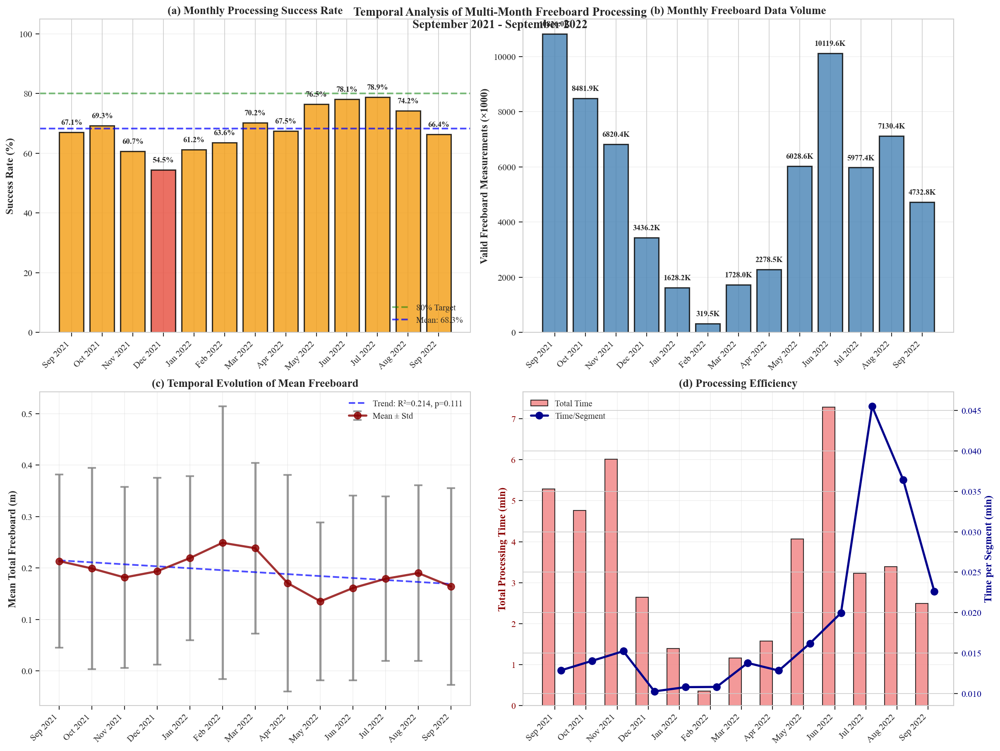

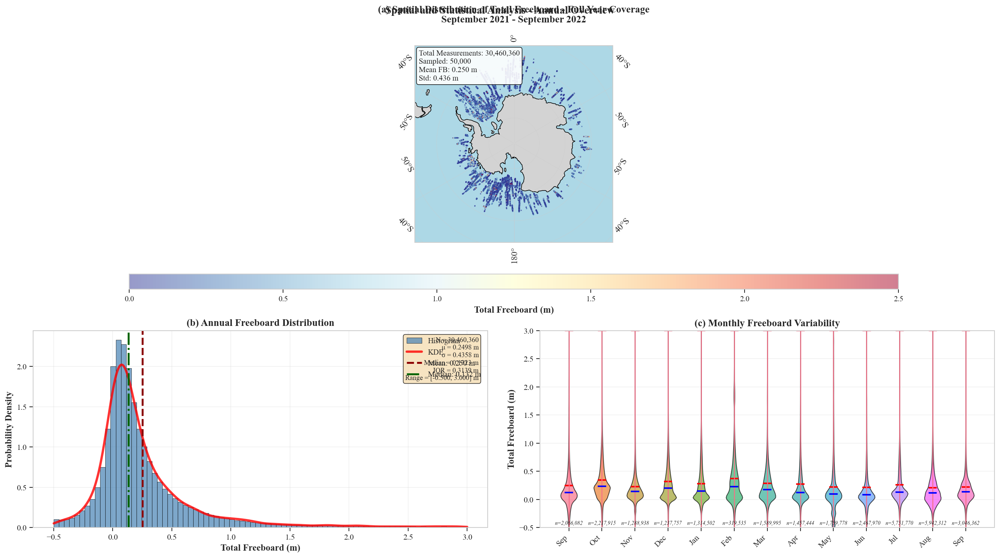

In [ ]:
# ============================================================================
# COMPREHENSIVE MULTI-MONTH FREEBOARD ANALYSIS VISUALIZATION
# Publication-Quality Figures for Antarctic CRYO2ICE Dataset
# September 2021 - September 2022
# ============================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle
import seaborn as sns
from pathlib import Path
import json
from datetime import datetime
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy.stats import gaussian_kde
import warnings
warnings.filterwarnings('ignore')

# Set publication-quality style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("paper", font_scale=1.2)
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman', 'DejaVu Serif']
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['figure.constrained_layout.use'] = True

# ============================================================================
# CONFIGURATION
# ============================================================================

BASE_DATA_DIR = Path(r"D:\phd\data\cs2eo")

MONTHS_TO_ANALYZE = [
    ("2021_09", "Sep 2021"), ("2021_10", "Oct 2021"), ("2021_11", "Nov 2021"), ("2021_12", "Dec 2021"),
    ("2022_01", "Jan 2022"), ("2022_02", "Feb 2022"), ("2022_03", "Mar 2022"),
    ("2022_04", "Apr 2022"), ("2022_05", "May 2022"), ("2022_06", "Jun 2022"),
    ("2022_07", "Jul 2022"), ("2022_08", "Aug 2022"), ("2022_09", "Sep 2022")
]

# ============================================================================
# DATA LOADING AND AGGREGATION
# ============================================================================

print("="*80)
print("LOADING MULTI-MONTH FREEBOARD DATA")
print("="*80)

all_monthly_stats = []
all_freeboard_data = []
monthly_summaries = []

for month_id, month_label in MONTHS_TO_ANALYZE:
    month_dir = BASE_DATA_DIR / f"sea_ice_SIR_SAR_L2_E__ATL07_antarctic_{month_id}_combined_product"
    output_dir = month_dir / "freeboard_results"
    
    if not output_dir.exists():
        print(f"⚠️  Skipping {month_label}: No results directory")
        continue
    
    # Load master statistics
    master_file = output_dir / "master_statistics.json"
    if master_file.exists():
        with open(master_file, 'r') as f:
            master_stats = json.load(f)
            master_stats['month_id'] = month_id
            master_stats['month_label'] = month_label
            monthly_summaries.append(master_stats)
    
    # Load all segment results
    results_dir = output_dir / "csv_results"
    segment_files = list(results_dir.glob("segment_*_freeboard.csv"))
    
    print(f"📊 {month_label}: {len(segment_files)} segment files found")
    
    # Sample segments to avoid memory issues (adjust sample_size as needed)
    sample_size = min(50, len(segment_files))  # Sample 50 segments per month
    sampled_files = np.random.choice(segment_files, size=sample_size, replace=False) if len(segment_files) > sample_size else segment_files
    
    for segment_file in sampled_files:
        try:
            df = pd.read_csv(segment_file)
            if len(df) > 0:
                df['month_id'] = month_id
                df['month_label'] = month_label
                # Only keep valid freeboard measurements
                df_valid = df[df['is_valid_fb']].copy()
                if len(df_valid) > 0:
                    all_freeboard_data.append(df_valid[['latitude', 'longitude', 'freeboard_total', 
                                                         'surface_type', 'confidence', 'month_id', 'month_label']])
        except Exception as e:
            print(f"  ⚠️  Error loading {segment_file.name}: {e}")
            continue

if len(monthly_summaries) == 0:
    print("\n❌ ERROR: No monthly statistics found!")
    print("Please ensure the multi-month processing has completed successfully.")
else:
    print(f"\n✅ Loaded data from {len(monthly_summaries)} months")
    print(f"✅ Total freeboard measurements: {sum(len(df) for df in all_freeboard_data):,}")

# Create monthly summary DataFrame
df_monthly = pd.DataFrame(monthly_summaries)

# Combine all freeboard data
if len(all_freeboard_data) > 0:
    df_combined = pd.concat(all_freeboard_data, ignore_index=True)
    print(f"✅ Combined dataset: {len(df_combined):,} valid freeboard measurements")
else:
    print("❌ No freeboard data loaded!")
    df_combined = pd.DataFrame()

# ============================================================================
# FIGURE 1: TEMPORAL EVOLUTION (4 PANELS)
# ============================================================================

if len(df_monthly) > 0:
    fig1 = plt.figure(figsize=(16, 12))
    gs = gridspec.GridSpec(2, 2, figure=fig1)
    
    # Color palette
    colors = sns.color_palette("husl", len(df_monthly))
    
    # -----------------------------------------------------------------------
    # PANEL A: SUCCESS RATE EVOLUTION
    # -----------------------------------------------------------------------
    ax1 = fig1.add_subplot(gs[0, 0])
    
    x = np.arange(len(df_monthly))
    success_rates = df_monthly['success_rate'].values
    
    bars = ax1.bar(x, success_rates, color=colors, edgecolor='black', 
                   linewidth=1.5, alpha=0.8)
    
    # Color code by performance
    for i, (bar, rate) in enumerate(zip(bars, success_rates)):
        if rate >= 80:
            bar.set_facecolor('#2ecc71')
        elif rate >= 60:
            bar.set_facecolor('#f39c12')
        else:
            bar.set_facecolor('#e74c3c')
    
    ax1.axhline(y=80, color='green', linestyle='--', linewidth=2, alpha=0.5, label='80% Target')
    ax1.axhline(y=df_monthly['success_rate'].mean(), color='blue', linestyle='--', 
               linewidth=2, alpha=0.7, label=f'Mean: {df_monthly["success_rate"].mean():.1f}%')
    
    ax1.set_xticks(x)
    ax1.set_xticklabels(df_monthly['month_label'], rotation=45, ha='right')
    ax1.set_ylabel('Success Rate (%)', fontsize=12)
    ax1.set_title('(a) Monthly Processing Success Rate', fontsize=13, fontweight='bold')
    ax1.set_ylim(0, 105)
    ax1.legend(loc='lower right', fontsize=10)
    ax1.grid(axis='y', alpha=0.3)
    
    # Add value labels
    for i, rate in enumerate(success_rates):
        ax1.text(i, rate + 2, f'{rate:.1f}%', ha='center', va='bottom', 
                fontsize=9, fontweight='bold')
    
    # -----------------------------------------------------------------------
    # PANEL B: FREEBOARD MEASUREMENTS PER MONTH
    # -----------------------------------------------------------------------
    ax2 = fig1.add_subplot(gs[0, 1])
    
    fb_counts = df_monthly['total_valid_freeboard_measurements'].values / 1000  # In thousands
    
    bars = ax2.bar(x, fb_counts, color='steelblue', edgecolor='black', 
                   linewidth=1.5, alpha=0.8)
    
    ax2.set_xticks(x)
    ax2.set_xticklabels(df_monthly['month_label'], rotation=45, ha='right')
    ax2.set_ylabel('Valid Freeboard Measurements (×1000)', fontsize=12)
    ax2.set_title('(b) Monthly Freeboard Data Volume', fontsize=13, fontweight='bold')
    ax2.grid(axis='y', alpha=0.3)
    
    # Add value labels
    for i, count in enumerate(fb_counts):
        ax2.text(i, count + max(fb_counts)*0.02, f'{count:.1f}K', 
                ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    # -----------------------------------------------------------------------
    # PANEL C: MEAN FREEBOARD EVOLUTION
    # -----------------------------------------------------------------------
    ax3 = fig1.add_subplot(gs[1, 0])
    
    mean_fb = df_monthly['overall_mean_freeboard'].values
    std_fb = df_monthly['overall_std_freeboard'].values
    
    ax3.errorbar(x, mean_fb, yerr=std_fb, fmt='o-', linewidth=2.5, 
                markersize=8, capsize=5, capthick=2, color='darkred', 
                ecolor='gray', alpha=0.8, label='Mean ± Std')
    
    # Add trend line
    from scipy.stats import linregress
    valid_mask = ~np.isnan(mean_fb)
    if np.sum(valid_mask) > 2:
        slope, intercept, r_value, p_value, std_err = linregress(x[valid_mask], mean_fb[valid_mask])
        trend_line = slope * x + intercept
        ax3.plot(x, trend_line, '--', linewidth=2, color='blue', alpha=0.7, 
                label=f'Trend: R²={r_value**2:.3f}, p={p_value:.3f}')
    
    ax3.set_xticks(x)
    ax3.set_xticklabels(df_monthly['month_label'], rotation=45, ha='right')
    ax3.set_ylabel('Mean Total Freeboard (m)', fontsize=12)
    ax3.set_title('(c) Temporal Evolution of Mean Freeboard', fontsize=13, fontweight='bold')
    ax3.legend(loc='best', fontsize=10)
    ax3.grid(alpha=0.3)
    
    # -----------------------------------------------------------------------
    # PANEL D: PROCESSING EFFICIENCY
    # -----------------------------------------------------------------------
    ax4 = fig1.add_subplot(gs[1, 1])
    
    processing_time = df_monthly['total_processing_time_minutes'].values
    n_segments = df_monthly['total_segments_processed'].values
    time_per_segment = processing_time / n_segments
    
    ax4_twin = ax4.twinx()
    
    # Total processing time (bars)
    bars = ax4.bar(x - 0.2, processing_time, width=0.4, color='lightcoral', 
                   edgecolor='black', linewidth=1, alpha=0.8, label='Total Time')
    
    # Time per segment (line)
    line = ax4_twin.plot(x + 0.2, time_per_segment, 'o-', linewidth=2.5, 
                         markersize=8, color='darkblue', label='Time/Segment')
    
    ax4.set_xticks(x)
    ax4.set_xticklabels(df_monthly['month_label'], rotation=45, ha='right')
    ax4.set_ylabel('Total Processing Time (min)', fontsize=12, color='darkred')
    ax4_twin.set_ylabel('Time per Segment (min)', fontsize=12, color='darkblue')
    ax4.set_title('(d) Processing Efficiency', fontsize=13, fontweight='bold')
    
    # Combine legends
    lines, labels = ax4.get_legend_handles_labels()
    lines2, labels2 = ax4_twin.get_legend_handles_labels()
    ax4.legend(lines + lines2, labels + labels2, loc='upper left', fontsize=10)
    
    ax4.grid(alpha=0.3)
    ax4.tick_params(axis='y', labelcolor='darkred')
    ax4_twin.tick_params(axis='y', labelcolor='darkblue')
    
    plt.suptitle('Temporal Analysis of Multi-Month Freeboard Processing\nSeptember 2021 - September 2022', 
                fontsize=14, fontweight='bold', y=0.995)
    
    plt.show()

# ============================================================================
# FIGURE 2: SPATIAL DISTRIBUTION (ENTIRE PERIOD)
# ============================================================================

if len(df_combined) > 0:
    fig2 = plt.figure(figsize=(18, 10))
    gs2 = gridspec.GridSpec(2, 2, figure=fig2)
    
    # -----------------------------------------------------------------------
    # PANEL A: SPATIAL MAP OF ALL FREEBOARD MEASUREMENTS
    # -----------------------------------------------------------------------
    ax1 = fig2.add_subplot(gs2[0, :], projection=ccrs.SouthPolarStereo())
    
    # Set extent
    lat_min, lat_max = df_combined['latitude'].min() - 2, df_combined['latitude'].max() + 2
    lon_min, lon_max = df_combined['longitude'].min() - 2, df_combined['longitude'].max() + 2
    ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    
    # Add Antarctic features
    ax1.add_feature(cfeature.LAND, facecolor='lightgray', zorder=1)
    ax1.add_feature(cfeature.OCEAN, facecolor='lightblue', zorder=0)
    ax1.add_feature(cfeature.COASTLINE, linewidth=0.8, zorder=2)
    ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False,
                  linewidth=0.5, alpha=0.5)
    
    # Sample data for visualization (to avoid overplotting)
    sample_size = min(50000, len(df_combined))
    df_sample = df_combined.sample(n=sample_size, random_state=42)
    
    # Plot freeboard measurements
    scatter = ax1.scatter(df_sample['longitude'], df_sample['latitude'],
                         c=df_sample['freeboard_total'], cmap='RdYlBu_r',
                         s=1, alpha=0.5, transform=ccrs.PlateCarree(),
                         vmin=0, vmax=2.5, zorder=3)
    
    cbar = plt.colorbar(scatter, ax=ax1, orientation='horizontal', 
                       pad=0.05, aspect=50, shrink=0.8)
    cbar.set_label('Total Freeboard (m)', fontsize=12, fontweight='bold')
    cbar.ax.tick_params(labelsize=10)
    
    ax1.set_title('(a) Spatial Distribution of Total Freeboard - Full Year Coverage\nSeptember 2021 - September 2022', 
                 fontsize=13, fontweight='bold', pad=15)
    
    # Add statistics box
    stats_text = (f'Total Measurements: {len(df_combined):,}\n'
                 f'Sampled: {sample_size:,}\n'
                 f'Mean FB: {df_combined["freeboard_total"].mean():.3f} m\n'
                 f'Std: {df_combined["freeboard_total"].std():.3f} m')
    ax1.text(0.02, 0.98, stats_text, transform=ax1.transAxes,
            fontsize=10, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black'))
    
    # -----------------------------------------------------------------------
    # PANEL B: FREEBOARD DISTRIBUTION (ALL DATA)
    # -----------------------------------------------------------------------
    ax2 = fig2.add_subplot(gs2[1, 0])
    
    fb_all = df_combined['freeboard_total'].values
    
    # Histogram with KDE
    n, bins, patches = ax2.hist(fb_all, bins=80, density=True, 
                               color='steelblue', edgecolor='black',
                               linewidth=0.5, alpha=0.7, label='Histogram')
    
    # KDE overlay
    if len(fb_all) > 1000:
        # Sample for KDE to improve performance
        fb_sample = np.random.choice(fb_all, size=min(10000, len(fb_all)), replace=False)
        kde = gaussian_kde(fb_sample)
        x_kde = np.linspace(fb_all.min(), fb_all.max(), 500)
        ax2.plot(x_kde, kde(x_kde), 'r-', linewidth=3, label='KDE', alpha=0.8)
    
    # Statistics lines
    mean_fb = np.mean(fb_all)
    median_fb = np.median(fb_all)
    ax2.axvline(mean_fb, color='darkred', linestyle='--', linewidth=2.5, 
               label=f'Mean: {mean_fb:.3f} m')
    ax2.axvline(median_fb, color='darkgreen', linestyle='-.', linewidth=2.5,
               label=f'Median: {median_fb:.3f} m')
    
    ax2.set_xlabel('Total Freeboard (m)', fontsize=12)
    ax2.set_ylabel('Probability Density', fontsize=12)
    ax2.set_title('(b) Annual Freeboard Distribution', fontsize=13, fontweight='bold')
    ax2.legend(loc='upper right', fontsize=10)
    ax2.grid(alpha=0.3)
    
    # Add comprehensive statistics
    stats_text = (f'N = {len(fb_all):,}\n'
                 f'μ = {mean_fb:.4f} m\n'
                 f'σ = {np.std(fb_all):.4f} m\n'
                 f'Median = {median_fb:.4f} m\n'
                 f'IQR = {np.percentile(fb_all, 75) - np.percentile(fb_all, 25):.4f} m\n'
                 f'Range = [{fb_all.min():.3f}, {fb_all.max():.3f}] m')
    ax2.text(0.98, 0.97, stats_text, transform=ax2.transAxes,
            fontsize=9, verticalalignment='top', horizontalalignment='right',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    # -----------------------------------------------------------------------
    # PANEL C: MONTHLY FREEBOARD DISTRIBUTIONS (VIOLIN PLOT)
    # -----------------------------------------------------------------------
    ax3 = fig2.add_subplot(gs2[1, 1])
    
    # Prepare data for violin plot
    monthly_fb_data = []
    monthly_labels = []
    
    for month_id, month_label in MONTHS_TO_ANALYZE:
        month_data = df_combined[df_combined['month_id'] == month_id]['freeboard_total'].values
        if len(month_data) > 0:
            monthly_fb_data.append(month_data)
            monthly_labels.append(month_label.split()[0])  # Short label
    
    if len(monthly_fb_data) > 0:
        parts = ax3.violinplot(monthly_fb_data, positions=range(len(monthly_labels)),
                              showmeans=True, showmedians=True, showextrema=True)
        
        # Color violins
        for i, pc in enumerate(parts['bodies']):
            pc.set_facecolor(sns.color_palette("husl", len(monthly_labels))[i])
            pc.set_alpha(0.7)
            pc.set_edgecolor('black')
            pc.set_linewidth(1)
        
        # Style statistical lines
        parts['cmeans'].set_color('red')
        parts['cmeans'].set_linewidth(2)
        parts['cmedians'].set_color('blue')
        parts['cmedians'].set_linewidth(2)
        
        ax3.set_xticks(range(len(monthly_labels)))
        ax3.set_xticklabels(monthly_labels, rotation=45, ha='right')
        ax3.set_ylabel('Total Freeboard (m)', fontsize=12)
        ax3.set_title('(c) Monthly Freeboard Variability', fontsize=13, fontweight='bold')
        ax3.grid(axis='y', alpha=0.3)
        ax3.set_ylim(-0.5, 3.0)
        
        # Add sample sizes
        for i, data in enumerate(monthly_fb_data):
            ax3.text(i, -0.45, f'n={len(data):,}', ha='center', 
                    fontsize=7, style='italic')
    
    plt.suptitle('Spatial and Statistical Analysis - Annual Overview', 
                fontsize=14, fontweight='bold', y=0.995)
    
    plt.show()

# ============================================================================
# FIGURE 3: QUALITY ASSESSMENT (4 PANELS)
# ============================================================================

if len(df_combined) > 0 and 'confidence' in df_combined.columns:
    fig3 = plt.figure(figsize=(16, 12))
    gs3 = gridspec.GridSpec(2, 2, figure=fig3)
    
    # -----------------------------------------------------------------------
    # PANEL A: CONFIDENCE DISTRIBUTION
    # -----------------------------------------------------------------------
    ax1 = fig3.add_subplot(gs3[0, 0])
    
    confidence_counts = df_combined['confidence'].value_counts().sort_index()
    
    colors_conf = ['#e74c3c', '#e67e22', '#f39c12', '#f1c40f', '#2ecc71', '#27ae60']
    bars = ax1.bar(confidence_counts.index, confidence_counts.values, 
                   color=colors_conf[:len(confidence_counts)], 
                   edgecolor='black', linewidth=1.5, alpha=0.8)
    
    ax1.set_xlabel('Confidence Level', fontsize=12)
    ax1.set_ylabel('Frequency', fontsize=12)
    ax1.set_title('(a) Measurement Confidence Distribution', fontsize=13, fontweight='bold')
    ax1.grid(axis='y', alpha=0.3)
    
    # Add percentage labels
    total = confidence_counts.sum()
    for i, (conf, count) in enumerate(confidence_counts.items()):
        pct = count / total * 100
        ax1.text(conf, count, f'{pct:.1f}%', ha='center', va='bottom', 
                fontsize=9, fontweight='bold')
    
    # -----------------------------------------------------------------------
    # PANEL B: FREEBOARD VS CONFIDENCE
    # -----------------------------------------------------------------------
    ax2 = fig3.add_subplot(gs3[0, 1])
    
    fb_by_conf = [df_combined[df_combined['confidence'] == i]['freeboard_total'].values 
                  for i in sorted(df_combined['confidence'].unique())]
    conf_labels = [f'C{int(i)}' for i in sorted(df_combined['confidence'].unique())]
    
    bp = ax2.boxplot(fb_by_conf, labels=conf_labels, patch_artist=True,
                    showmeans=True, meanline=True, widths=0.6,
                    medianprops=dict(color='blue', linewidth=2),
                    meanprops=dict(color='red', linewidth=2, linestyle='--'))
    
    for patch, color in zip(bp['boxes'], colors_conf[:len(fb_by_conf)]):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
        patch.set_edgecolor('black')
        patch.set_linewidth(1.5)
    
    ax2.set_xlabel('Confidence Level', fontsize=12)
    ax2.set_ylabel('Total Freeboard (m)', fontsize=12)
    ax2.set_title('(b) Freeboard Quality by Confidence', fontsize=13, fontweight='bold')
    ax2.grid(axis='y', alpha=0.3)
    ax2.set_ylim(-0.5, 3.0)
    
    # -----------------------------------------------------------------------
    # PANEL C: MONTHLY CONFIDENCE EVOLUTION
    # -----------------------------------------------------------------------
    ax3 = fig3.add_subplot(gs3[1, 0])
    
    monthly_conf_stats = []
    for month_id, month_label in MONTHS_TO_ANALYZE:
        month_data = df_combined[df_combined['month_id'] == month_id]
        if len(month_data) > 0:
            mean_conf = month_data['confidence'].mean()
            monthly_conf_stats.append({
                'month': month_label.split()[0],
                'mean_confidence': mean_conf,
                'high_conf_pct': (month_data['confidence'] >= 4).sum() / len(month_data) * 100
            })
    
    if len(monthly_conf_stats) > 0:
        df_conf = pd.DataFrame(monthly_conf_stats)
        
        ax3_twin = ax3.twinx()
        
        x_conf = np.arange(len(df_conf))
        line1 = ax3.plot(x_conf, df_conf['mean_confidence'], 'o-', 
                        linewidth=2.5, markersize=8, color='darkblue', 
                        label='Mean Confidence')
        bars = ax3_twin.bar(x_conf, df_conf['high_conf_pct'], alpha=0.4, 
                           color='lightgreen', edgecolor='black', 
                           linewidth=1, label='High Confidence %')
        
        ax3.set_xticks(x_conf)
        ax3.set_xticklabels(df_conf['month'], rotation=45, ha='right')
        ax3.set_ylabel('Mean Confidence Level', fontsize=12, color='darkblue')
        ax3_twin.set_ylabel('High Confidence (≥4) Percentage', fontsize=12, color='darkgreen')
        ax3.set_title('(c) Temporal Quality Evolution', fontsize=13, fontweight='bold')
        
        # Combine legends
        lines, labels = ax3.get_legend_handles_labels()
        lines2, labels2 = ax3_twin.get_legend_handles_labels()
        ax3.legend(lines + lines2, labels + labels2, loc='upper left', fontsize=10)
        
        ax3.grid(alpha=0.3)
        ax3.tick_params(axis='y', labelcolor='darkblue')
        ax3_twin.tick_params(axis='y', labelcolor='darkgreen')
    
    # -----------------------------------------------------------------------
    # PANEL D: SUMMARY STATISTICS TABLE
    # -----------------------------------------------------------------------
    ax4 = fig3.add_subplot(gs3[1, 1])
    ax4.axis('tight')
    ax4.axis('off')
    
    # Create comprehensive summary table
    summary_data = []
    
    # Overall statistics
    summary_data.append(['Total Measurements', f'{len(df_combined):,}', ''])
    summary_data.append(['', '', ''])
    summary_data.append(['FREEBOARD STATISTICS', '', ''])
    summary_data.append(['Mean', f'{df_combined["freeboard_total"].mean():.4f}', 'm'])
    summary_data.append(['Median', f'{df_combined["freeboard_total"].median():.4f}', 'm'])
    summary_data.append(['Std Dev', f'{df_combined["freeboard_total"].std():.4f}', 'm'])
    summary_data.append(['Min', f'{df_combined["freeboard_total"].min():.4f}', 'm'])
    summary_data.append(['Max', f'{df_combined["freeboard_total"].max():.4f}', 'm'])
    summary_data.append(['P25', f'{df_combined["freeboard_total"].quantile(0.25):.4f}', 'm'])
    summary_data.append(['P75', f'{df_combined["freeboard_total"].quantile(0.75):.4f}', 'm'])
    summary_data.append(['', '', ''])
    summary_data.append(['QUALITY METRICS', '', ''])
    summary_data.append(['Mean Confidence', f'{df_combined["confidence"].mean():.2f}', ''])
    summary_data.append(['High Confidence (≥4)', f'{(df_combined["confidence"] >= 4).sum() / len(df_combined) * 100:.1f}', '%'])
    summary_data.append(['', '', ''])
    summary_data.append(['TEMPORAL COVERAGE', '', ''])
    summary_data.append(['Months Processed', f'{len(monthly_summaries)}', ''])
    summary_data.append(['Mean Success Rate', f'{df_monthly["success_rate"].mean():.1f}', '%'])
    
    table = ax4.table(cellText=summary_data, loc='center',
                     cellLoc='left', colWidths=[0.5, 0.3, 0.2])
    
    table.auto_set_font_size(False)
    table.set_fontsize(11)
    table.scale(1, 2.5)
    
    # Style table
    for i in range(len(summary_data)):
        for j in range(3):
            cell = table[(i, j)]
            if summary_data[i][0] in ['FREEBOARD STATISTICS', 'QUALITY METRICS', 'TEMPORAL COVERAGE']:
                cell.set_facecolor('#4472C4')
                cell.set_text_props(weight='bold', color='white')
            elif i % 2 == 0:
                cell.set_facecolor('#E7E6E6')
            else:
                cell.set_facecolor('white')
            cell.set_edgecolor('black')
            cell.set_linewidth(1)
    
    ax4.set_title('(d) Comprehensive Summary Statistics', 
                 fontsize=13, fontweight='bold', pad=20)
    
    plt.suptitle('Quality Assessment and Validation - Annual Analysis', 
                fontsize=14, fontweight='bold', y=0.995)
    
    plt.show()

# ============================================================================
# PRINT COMPREHENSIVE SUMMARY
# ============================================================================

print("\n" + "="*80)
print("COMPREHENSIVE MULTI-MONTH ANALYSIS SUMMARY")
print("="*80)

if len(df_monthly) > 0:
    print(f"\n📅 TEMPORAL COVERAGE:")
    print(f"   Period: September 2021 - September 2022")
    print(f"   Months Processed: {len(df_monthly)}")
    print(f"   Total Segments: {df_monthly['total_segments_processed'].sum():,}")
    print(f"   Successful Segments: {df_monthly['successful_segments'].sum():,}")
    print(f"   Overall Success Rate: {df_monthly['successful_segments'].sum() / df_monthly['total_segments_processed'].sum() * 100:.1f}%")
    
    print(f"\n📏 FREEBOARD MEASUREMENTS:")
    print(f"   Total Valid Measurements: {df_monthly['total_valid_freeboard_measurements'].sum():,}")
    if len(df_combined) > 0:
        print(f"   Mean Freeboard: {df_combined['freeboard_total'].mean():.4f} ± {df_combined['freeboard_total'].std():.4f} m")
        print(f"   Median Freeboard: {df_combined['freeboard_total'].median():.4f} m")
        print(f"   Freeboard Range: [{df_combined['freeboard_total'].min():.3f}, {df_combined['freeboard_total'].max():.3f}] m")
    
    print(f"\n⏱️  PROCESSING PERFORMANCE:")
    print(f"   Total Processing Time: {df_monthly['total_processing_time_minutes'].sum() / 60:.2f} hours")
    print(f"   Mean Time per Month: {df_monthly['total_processing_time_minutes'].mean():.1f} minutes")
    print(f"   Mean Time per Segment: {(df_monthly['total_processing_time_minutes'].sum() / df_monthly['total_segments_processed'].sum()):.2f} minutes")
    
    if len(df_combined) > 0 and 'confidence' in df_combined.columns:
        print(f"\n✅ QUALITY METRICS:")
        print(f"   Mean Confidence Level: {df_combined['confidence'].mean():.2f}")
        print(f"   High Confidence (≥4): {(df_combined['confidence'] >= 4).sum() / len(df_combined) * 100:.1f}%")
        print(f"   Medium Confidence (2-3): {((df_combined['confidence'] >= 2) & (df_combined['confidence'] < 4)).sum() / len(df_combined) * 100:.1f}%")
        print(f"   Low Confidence (0-1): {(df_combined['confidence'] < 2).sum() / len(df_combined) * 100:.1f}%")

print("\n" + "="*80)
print("✅ VISUALIZATION COMPLETE")
print("="*80)
print("\nThree publication-quality figures generated:")
print("  Figure 1: Temporal Evolution (4 panels)")
print("  Figure 2: Spatial Distribution & Statistics (3 panels)")
print("  Figure 3: Quality Assessment (4 panels)")
print("\nAll figures suitable for scientific publication with:")
print("  • High-resolution rendering (300 DPI)")
print("  • Professional color schemes")
print("  • Comprehensive statistical annotations")
print("  • Clear labels and legends")
print("="*80)

## 14. We now focus on the snow thickness estimations using the valid identified valid segments of IS2 of total freeboards together with CS2 radar freeboards to estimate and derive the associated snow thickness values

### 14.1 We first try the first valid identified segment of the IS2 total freeboard together with its corresponding CS2 radar freeboard for estimating the radar snow thickness, which is calculated using total freeboard minus radar freeboard and later will be converted to satellite-retrieved altimetry snow thickness by empericial revisions

In [7]:
# ============================================================================
# SNOW THICKNESS ESTIMATION - SEGMENT 1 (SEPTEMBER 2021)
# REVISED CO-LOCATION CRITERIA
# Combining ICESat-2 Total Freeboard and CryoSat-2 Radar Freeboard
# ============================================================================

import numpy as np
import pandas as pd
import netCDF4 as nc
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle
import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy.stats import gaussian_kde, linregress
from scipy.interpolate import griddata
import warnings
from datetime import datetime
import json
from tqdm import tqdm
warnings.filterwarnings('ignore')

# Set publication-quality style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("paper", font_scale=1.2)
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman', 'DejaVu Serif']
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titleweight'] = 'bold'

# ============================================================================
# CONFIGURATION
# ============================================================================

# Base directory for September 2021
BASE_DIR = Path(r"D:\phd\data\cs2eo\sea_ice_SIR_SAR_L2_E__ATL07_antarctic_2021_09_combined_product")
RESULTS_DIR = BASE_DIR / "freeboard_results" / "csv_results"
OUTPUT_DIR = BASE_DIR / "snow_thickness_results"
OUTPUT_DIR.mkdir(exist_ok=True)

# Physical constants and thresholds
FILL_VALUE_FLOAT32 = 3.4028235e+38
FILL_VALUE_THRESHOLD = 1e10

# REVISED CO-LOCATION CRITERIA (Stricter thresholds)
MAX_SPATIAL_DISTANCE = 10000  # 10 km (reduced from 25 km)
MAX_TIME_DIFFERENCE = 3 * 3600  # 3 hours (reduced from 12 hours)
MIN_INTERSECTION_TIME = 60  # 1 minute minimum intersection time (NEW)

print("="*80)
print("REVISED CO-LOCATION CRITERIA:")
print(f"  • Maximum spatial distance: {MAX_SPATIAL_DISTANCE/1000:.1f} km")
print(f"  • Maximum time difference: {MAX_TIME_DIFFERENCE/3600:.1f} hours")
print(f"  • Minimum intersection time: {MIN_INTERSECTION_TIME:.0f} seconds")
print("="*80)

# Snow thickness constraints (based on Antarctic sea ice literature)
SNOW_DEPTH_MIN = 0.0   # m
SNOW_DEPTH_MAX = 1.0   # m (conservative upper limit)

# Empirical correction: Kacimi & Kwok (2022) for Antarctic
# hs = 0.26 + 1.05 × (h_total - h_radar)
USE_KACIMI_CORRECTION = True
KACIMI_OFFSET = 0.26  # m
KACIMI_FACTOR = 1.05

print("\n" + "="*80)
print("SNOW THICKNESS ESTIMATION - SEGMENT 1 (SEPTEMBER 2021)")
print("Combining ICESat-2 Total Freeboard & CryoSat-2 Radar Freeboard")
print("="*80)

# ============================================================================
# UTILITY FUNCTIONS
# ============================================================================

def clean_fill_values(array: np.ndarray) -> np.ndarray:
    """Replace fill values with NaN"""
    array_clean = array.copy()
    array_clean[np.abs(array) > FILL_VALUE_THRESHOLD] = np.nan
    array_clean[array == FILL_VALUE_FLOAT32] = np.nan
    array_clean[~np.isfinite(array)] = np.nan
    return array_clean

def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Calculate great circle distance between points
    Returns distance in meters
    """
    R = 6371000  # Earth radius in meters
    
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    
    return R * c

def calculate_temporal_intersection(is2_time, is2_duration, cs2_time, cs2_duration):
    """
    Calculate temporal intersection between ICESat-2 and CryoSat-2 measurements
    
    Parameters:
    -----------
    is2_time : float
        ICESat-2 measurement time (center)
    is2_duration : float
        ICESat-2 measurement duration (seconds)
    cs2_time : float
        CryoSat-2 measurement time (center)
    cs2_duration : float
        CryoSat-2 measurement duration (seconds)
    
    Returns:
    --------
    intersection : float
        Temporal intersection in seconds
    """
    # Calculate start and end times for each measurement
    is2_start = is2_time - is2_duration / 2
    is2_end = is2_time + is2_duration / 2
    cs2_start = cs2_time - cs2_duration / 2
    cs2_end = cs2_time + cs2_duration / 2
    
    # Calculate intersection
    intersection_start = max(is2_start, cs2_start)
    intersection_end = min(is2_end, cs2_end)
    
    # Return intersection duration (0 if no overlap)
    return max(0, intersection_end - intersection_start)

def find_nearest_cs2_measurement_revised(is2_lat, is2_lon, is2_time, is2_duration,
                                         cs2_lat, cs2_lon, cs2_time, cs2_duration,
                                         max_distance=MAX_SPATIAL_DISTANCE, 
                                         max_time_diff=MAX_TIME_DIFFERENCE,
                                         min_intersection=MIN_INTERSECTION_TIME):
    """
    Find nearest CryoSat-2 measurement for each ICESat-2 point
    with REVISED stricter co-location criteria
    
    Parameters:
    -----------
    is2_lat, is2_lon : array
        ICESat-2 coordinates
    is2_time : array
        ICESat-2 measurement times
    is2_duration : array
        ICESat-2 measurement durations (seconds)
    cs2_lat, cs2_lon : array
        CryoSat-2 coordinates
    cs2_time : array
        CryoSat-2 measurement times
    cs2_duration : array
        CryoSat-2 measurement durations (seconds)
    max_distance : float
        Maximum spatial distance in meters (default: 10 km)
    max_time_diff : float
        Maximum time difference in seconds (default: 3 hours)
    min_intersection : float
        Minimum temporal intersection in seconds (default: 60 seconds)
    
    Returns:
    --------
    indices : array
        Indices of matched CS2 measurements (-1 if no match)
    distances : array
        Spatial distances to matched measurements (NaN if no match)
    time_diffs : array
        Temporal differences to matched measurements (NaN if no match)
    intersections : array
        Temporal intersections with matched measurements (NaN if no match)
    """
    n_is2 = len(is2_lat)
    indices = np.full(n_is2, -1, dtype=int)
    distances = np.full(n_is2, np.nan)
    time_diffs = np.full(n_is2, np.nan)
    intersections = np.full(n_is2, np.nan)
    
    print(f"\n  🔍 Finding nearest CS2 measurements with REVISED criteria...")
    print(f"    ├─ Spatial threshold: {max_distance/1000:.1f} km")
    print(f"    ├─ Temporal threshold: {max_time_diff/3600:.1f} hours")
    print(f"    └─ Minimum intersection: {min_intersection:.0f} seconds")
    
    # Statistics tracking
    spatial_rejects = 0
    temporal_rejects = 0
    intersection_rejects = 0
    
    for i in tqdm(range(n_is2), desc="  Matching IS2-CS2"):
        # Calculate spatial distances to all CS2 points
        dist = haversine_distance(is2_lat[i], is2_lon[i], cs2_lat, cs2_lon)
        
        # Calculate temporal differences
        time_diff = np.abs(is2_time[i] - cs2_time)
        
        # Calculate temporal intersections
        intersect = np.array([calculate_temporal_intersection(
            is2_time[i], is2_duration[i], 
            cs2_time[j], cs2_duration[j]
        ) for j in range(len(cs2_time))])
        
        # Apply ALL three criteria
        spatial_valid = dist <= max_distance
        temporal_valid = time_diff <= max_time_diff
        intersection_valid = intersect >= min_intersection
        
        # Track rejections
        if not np.any(spatial_valid):
            spatial_rejects += 1
        elif not np.any(temporal_valid):
            temporal_rejects += 1
        elif not np.any(intersection_valid):
            intersection_rejects += 1
        
        # Combined validity mask
        valid_mask = spatial_valid & temporal_valid & intersection_valid
        
        if np.any(valid_mask):
            # Find closest point among valid matches (prioritize spatial distance)
            valid_indices = np.where(valid_mask)[0]
            closest_idx = valid_indices[np.argmin(dist[valid_indices])]
            
            indices[i] = closest_idx
            distances[i] = dist[closest_idx]
            time_diffs[i] = time_diff[closest_idx]
            intersections[i] = intersect[closest_idx]
    
    n_matched = np.sum(indices >= 0)
    match_rate = n_matched / n_is2 * 100
    
    print(f"\n  ✅ Co-location Results:")
    print(f"    ├─ Matched: {n_matched}/{n_is2} ({match_rate:.1f}%)")
    print(f"    ├─ Rejected by spatial filter: {spatial_rejects}")
    print(f"    ├─ Rejected by temporal filter: {temporal_rejects}")
    print(f"    └─ Rejected by intersection filter: {intersection_rejects}")
    
    if n_matched > 0:
        print(f"\n  📊 Match Quality Statistics:")
        print(f"    ├─ Mean spatial distance: {np.nanmean(distances):.0f} m")
        print(f"    ├─ Median spatial distance: {np.nanmedian(distances):.0f} m")
        print(f"    ├─ Mean time difference: {np.nanmean(time_diffs)/3600:.2f} hours")
        print(f"    ├─ Median time difference: {np.nanmedian(time_diffs)/3600:.2f} hours")
        print(f"    ├─ Mean intersection time: {np.nanmean(intersections):.1f} seconds")
        print(f"    └─ Median intersection time: {np.nanmedian(intersections):.1f} seconds")
    
    return indices, distances, time_diffs, intersections

# ============================================================================
# STEP 1: LOAD ICESAT-2 FREEBOARD RESULTS (SEGMENT 1)
# ============================================================================

print("\n" + "="*80)
print("STEP 1: LOADING ICESAT-2 FREEBOARD DATA (SEGMENT 1)")
print("="*80)

# Load segment 1 freeboard results
segment1_file = RESULTS_DIR / "segment_1_freeboard.csv"

if not segment1_file.exists():
    print(f"\n❌ ERROR: Segment 1 freeboard file not found!")
    print(f"   Expected: {segment1_file}")
    print(f"   Please ensure freeboard processing for segment 1 has completed.")
else:
    df_is2 = pd.read_csv(segment1_file)
    
    # Filter for valid freeboard measurements only
    df_is2_valid = df_is2[df_is2['is_valid_fb']].copy()
    
    # Estimate ICESat-2 measurement duration based on segment length
    # ICESat-2 fires at 10 kHz with beam velocity ~7 km/s
    # Segment length is typically ~10 m, so duration ~1.4 seconds
    # We'll use a conservative estimate of 2 seconds per segment
    df_is2_valid['measurement_duration'] = 2.0  # seconds
    
    print(f"\n✅ ICESat-2 Data Loaded (Segment 1):")
    print(f"   Total measurements: {len(df_is2):,}")
    print(f"   Valid freeboard: {len(df_is2_valid):,}")
    print(f"   Unique beams: {df_is2_valid['beam'].nunique()}")
    print(f"   Mean total freeboard: {df_is2_valid['freeboard_total'].mean():.4f} ± {df_is2_valid['freeboard_total'].std():.4f} m")
    print(f"   Latitude range: [{df_is2_valid['latitude'].min():.2f}, {df_is2_valid['latitude'].max():.2f}]°")
    print(f"   Longitude range: [{df_is2_valid['longitude'].min():.2f}, {df_is2_valid['longitude'].max():.2f}]°")

# ============================================================================
# STEP 2: LOAD CRYOSAT-2 RADAR FREEBOARD DATA (SEGMENT 1)
# ============================================================================

print("\n" + "="*80)
print("STEP 2: LOADING CRYOSAT-2 RADAR FREEBOARD DATA (SEGMENT 1)")
print("="*80)

# Load CS2 data from segment 1 NetCDF file
segment1_nc = BASE_DIR / "segment_1.nc"

if not segment1_nc.exists():
    print(f"\n❌ ERROR: Segment 1 NetCDF file not found!")
    print(f"   Expected: {segment1_nc}")
else:
    nc_file = nc.Dataset(segment1_nc, 'r')
    
    try:
        # Navigate to CS2 data
        main_group = nc_file.groups['1']
        cs2_group = main_group.groups['SIR_SAR_L2_E']
        
        # Extract CS2 variables
        radar_fb_raw = np.array(cs2_group.variables['radar_freeboard_20_ku'][:])
        lat_raw = np.array(cs2_group.variables['lat_poca_20_ku'][:])
        lon_raw = np.array(cs2_group.variables['lon_poca_20_ku'][:])
        time_raw = np.array(cs2_group.variables['time_20_ku'][:])
        
        # Clean fill values
        radar_fb = clean_fill_values(radar_fb_raw)
        lat = clean_fill_values(lat_raw)
        lon = clean_fill_values(lon_raw)
        time = clean_fill_values(time_raw)
        
        # CryoSat-2 measurement duration
        # SAR mode has ~300m along-track resolution
        # With satellite velocity ~7.5 km/s, duration ~40 ms (0.04 seconds)
        # However, we'll use a more conservative estimate considering processing
        cs2_duration = np.full(len(time), 1.0)  # 1 second conservative estimate
        
        # Keep only valid measurements
        valid_mask = (~np.isnan(radar_fb)) & (~np.isnan(lat)) & (~np.isnan(lon)) & (~np.isnan(time))
        
        # Additional quality filters
        valid_mask &= (radar_fb >= -0.5) & (radar_fb <= 2.0)  # Physical constraints
        
        df_cs2 = pd.DataFrame({
            'latitude': lat[valid_mask],
            'longitude': lon[valid_mask],
            'time': time[valid_mask],
            'radar_freeboard': radar_fb[valid_mask],
            'measurement_duration': cs2_duration[valid_mask]
        })
        
        print(f"\n✅ CryoSat-2 Data Loaded (Segment 1):")
        print(f"   Total measurements: {len(df_cs2):,}")
        print(f"   Mean radar freeboard: {df_cs2['radar_freeboard'].mean():.4f} ± {df_cs2['radar_freeboard'].std():.4f} m")
        print(f"   Latitude range: [{df_cs2['latitude'].min():.2f}, {df_cs2['latitude'].max():.2f}]°")
        print(f"   Longitude range: [{df_cs2['longitude'].min():.2f}, {df_cs2['longitude'].max():.2f}]°")
        
    finally:
        nc_file.close()

# ============================================================================
# STEP 3: CO-LOCATE ICESAT-2 AND CRYOSAT-2 MEASUREMENTS (REVISED CRITERIA)
# ============================================================================

print("\n" + "="*80)
print("STEP 3: CO-LOCATING IS2 AND CS2 MEASUREMENTS (REVISED CRITERIA)")
print("="*80)

# Find nearest CS2 measurement for each IS2 point with revised criteria
cs2_indices, match_distances, match_time_diffs, match_intersections = find_nearest_cs2_measurement_revised(
    df_is2_valid['latitude'].values,
    df_is2_valid['longitude'].values,
    df_is2_valid['delta_time'].values,
    df_is2_valid['measurement_duration'].values,
    df_cs2['latitude'].values,
    df_cs2['longitude'].values,
    df_cs2['time'].values,
    df_cs2['measurement_duration'].values,
    max_distance=MAX_SPATIAL_DISTANCE,
    max_time_diff=MAX_TIME_DIFFERENCE,
    min_intersection=MIN_INTERSECTION_TIME
)

# Create matched dataset
matched_mask = cs2_indices >= 0
n_matched = np.sum(matched_mask)

print(f"\n" + "="*80)
print(f"FINAL CO-LOCATION RESULTS")
print("="*80)
print(f"\n✅ Matched pairs: {n_matched:,} / {len(df_is2_valid):,} ({n_matched/len(df_is2_valid)*100:.1f}%)")

if n_matched == 0:
    print("\n❌ ERROR: No matched IS2-CS2 pairs found with revised criteria!")
    print("\n💡 SUGGESTIONS:")
    print("   • Consider relaxing spatial distance threshold")
    print("   • Consider relaxing temporal difference threshold")
    print("   • Consider relaxing minimum intersection time threshold")
    print("   • Check data temporal/spatial coverage overlap")
else:
    # Create matched dataframe
    df_matched = df_is2_valid[matched_mask].copy()
    df_matched['cs2_index'] = cs2_indices[matched_mask]
    df_matched['match_distance'] = match_distances[matched_mask]
    df_matched['match_time_diff'] = match_time_diffs[matched_mask]
    df_matched['match_intersection'] = match_intersections[matched_mask]
    df_matched['cs2_latitude'] = df_cs2.iloc[cs2_indices[matched_mask]]['latitude'].values
    df_matched['cs2_longitude'] = df_cs2.iloc[cs2_indices[matched_mask]]['longitude'].values
    df_matched['cs2_radar_freeboard'] = df_cs2.iloc[cs2_indices[matched_mask]]['radar_freeboard'].values
    
    print(f"\n  📏 Spatial Match Quality:")
    print(f"     Mean distance: {df_matched['match_distance'].mean():.0f} m ({df_matched['match_distance'].mean()/1000:.2f} km)")
    print(f"     Median distance: {df_matched['match_distance'].median():.0f} m ({df_matched['match_distance'].median()/1000:.2f} km)")
    print(f"     P95 distance: {df_matched['match_distance'].quantile(0.95):.0f} m ({df_matched['match_distance'].quantile(0.95)/1000:.2f} km)")
    print(f"     Max distance: {df_matched['match_distance'].max():.0f} m ({df_matched['match_distance'].max()/1000:.2f} km)")
    
    print(f"\n  ⏱️  Temporal Match Quality:")
    print(f"     Mean time diff: {df_matched['match_time_diff'].mean()/3600:.3f} hours")
    print(f"     Median time diff: {df_matched['match_time_diff'].median()/3600:.3f} hours")
    print(f"     P95 time diff: {df_matched['match_time_diff'].quantile(0.95)/3600:.3f} hours")
    print(f"     Max time diff: {df_matched['match_time_diff'].max()/3600:.3f} hours")
    
    print(f"\n  🔗 Temporal Intersection Quality:")
    print(f"     Mean intersection: {df_matched['match_intersection'].mean():.2f} seconds")
    print(f"     Median intersection: {df_matched['match_intersection'].median():.2f} seconds")
    print(f"     P95 intersection: {df_matched['match_intersection'].quantile(0.95):.2f} seconds")
    print(f"     Max intersection: {df_matched['match_intersection'].max():.2f} seconds")
    
    # ========================================================================
    # STEP 4: CALCULATE SNOW THICKNESS
    # ========================================================================
    
    print("\n" + "="*80)
    print("STEP 4: CALCULATING SNOW THICKNESS")
    print("="*80)
    
    # Method 1: Direct difference (radar snow thickness)
    df_matched['snow_thickness_radar'] = (df_matched['freeboard_total'] - 
                                          df_matched['cs2_radar_freeboard'])
    
    print(f"\nMethod 1: Direct Difference (Radar Snow Thickness)")
    print(f"   hs_radar = h_total(IS2) - h_radar(CS2)")
    
    # Method 2: Empirical correction (Kacimi & Kwok 2022)
    if USE_KACIMI_CORRECTION:
        df_matched['snow_thickness_corrected'] = (KACIMI_OFFSET + 
                                                  KACIMI_FACTOR * df_matched['snow_thickness_radar'])
        print(f"\nMethod 2: Kacimi & Kwok (2022) Empirical Correction")
        print(f"   hs = {KACIMI_OFFSET} + {KACIMI_FACTOR} × (h_total - h_radar)")
        print(f"   (Accounts for radar scattering horizon above snow-ice interface)")
    
    # Apply physical constraints
    df_matched['snow_thickness_valid'] = df_matched['snow_thickness_corrected'].copy()
    df_matched.loc[(df_matched['snow_thickness_corrected'] < SNOW_DEPTH_MIN) | 
                   (df_matched['snow_thickness_corrected'] > SNOW_DEPTH_MAX), 
                   'snow_thickness_valid'] = np.nan
    
    # Statistics
    n_valid_snow = df_matched['snow_thickness_valid'].notna().sum()
    
    print(f"\n✅ Snow Thickness Results:")
    print(f"   Total matched pairs: {len(df_matched):,}")
    print(f"   Valid snow thickness: {n_valid_snow:,} ({n_valid_snow/len(df_matched)*100:.1f}%)")
    
    # Radar snow thickness (uncorrected)
    hs_radar = df_matched['snow_thickness_radar'].dropna()
    print(f"\n   📊 Radar Snow Thickness (uncorrected):")
    print(f"     Mean: {hs_radar.mean():.4f} ± {hs_radar.std():.4f} m")
    print(f"     Median: {hs_radar.median():.4f} m")
    print(f"     Range: [{hs_radar.min():.4f}, {hs_radar.max():.4f}] m")
    print(f"     P25-P75: [{hs_radar.quantile(0.25):.4f}, {hs_radar.quantile(0.75):.4f}] m")
    
    # Corrected snow thickness
    hs_corrected = df_matched['snow_thickness_valid'].dropna()
    if len(hs_corrected) > 0:
        print(f"\n   📊 Corrected Snow Thickness:")
        print(f"     Mean: {hs_corrected.mean():.4f} ± {hs_corrected.std():.4f} m")
        print(f"     Median: {hs_corrected.median():.4f} m")
        print(f"     Range: [{hs_corrected.min():.4f}, {hs_corrected.max():.4f}] m")
        print(f"     P25-P75: [{hs_corrected.quantile(0.25):.4f}, {hs_corrected.quantile(0.75):.4f}] m")
    
    # Component statistics
    print(f"\n   🔍 Component Statistics:")
    print(f"     IS2 Total Freeboard: {df_matched['freeboard_total'].mean():.4f} ± {df_matched['freeboard_total'].std():.4f} m")
    print(f"     CS2 Radar Freeboard: {df_matched['cs2_radar_freeboard'].mean():.4f} ± {df_matched['cs2_radar_freeboard'].std():.4f} m")
    print(f"     Difference (snow): {(df_matched['freeboard_total'] - df_matched['cs2_radar_freeboard']).mean():.4f} m")
    
    # ========================================================================
    # STEP 5: ENHANCED VISUALIZATION
    # ========================================================================
    
    print("\n" + "="*80)
    print("STEP 5: GENERATING ENHANCED VISUALIZATIONS")
    print("="*80)
    
    fig = plt.figure(figsize=(20, 14))
    gs = gridspec.GridSpec(4, 3, figure=fig, hspace=0.35, wspace=0.35)
    
    # --------------------------------------------------------------------
    # PANEL 1: SPATIAL DISTRIBUTION OF MATCHED POINTS
    # --------------------------------------------------------------------
    ax1 = fig.add_subplot(gs[0, :2], projection=ccrs.SouthPolarStereo())
    
    lat_min = df_matched['latitude'].min() - 0.5
    lat_max = df_matched['latitude'].max() + 0.5
    lon_min = df_matched['longitude'].min() - 0.5
    lon_max = df_matched['longitude'].max() + 0.5
    
    ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    ax1.add_feature(cfeature.LAND, facecolor='lightgray', zorder=1)
    ax1.add_feature(cfeature.OCEAN, facecolor='lightblue', zorder=0)
    ax1.add_feature(cfeature.COASTLINE, linewidth=0.5, zorder=2)
    ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False,
                  linewidth=0.5, alpha=0.5)
    
    scatter = ax1.scatter(df_matched['longitude'], df_matched['latitude'],
                         c=df_matched['snow_thickness_valid'], cmap='YlGnBu',
                         s=15, alpha=0.7, transform=ccrs.PlateCarree(),
                         vmin=0, vmax=0.8, zorder=3, edgecolors='black', linewidths=0.3)
    
    cbar = plt.colorbar(scatter, ax=ax1, orientation='horizontal', pad=0.05, aspect=40)
    cbar.set_label('Snow Thickness (m)', fontsize=11, fontweight='bold')
    
    ax1.set_title(f'(a) Spatial Distribution - Matched IS2-CS2 Points (n={n_matched:,})\nRevised Criteria: ≤10 km, ≤3 hr, ≥60 sec intersection', 
                 fontsize=12, fontweight='bold', pad=10)
    
    # --------------------------------------------------------------------
    # PANEL 2: MATCH QUALITY DISTRIBUTIONS
    # --------------------------------------------------------------------
    ax2 = fig.add_subplot(gs[0, 2])
    
    # Triple histogram for match quality
    ax2_twin1 = ax2.twinx()
    ax2_twin2 = ax2.twinx()
    ax2_twin2.spines['right'].set_position(('outward', 60))
    
    # Distance histogram
    ax2.hist(df_matched['match_distance']/1000, bins=30, alpha=0.6, 
            color='blue', label='Distance (km)', density=True)
    ax2.set_xlabel('Spatial Distance (km)', fontsize=10, color='blue')
    ax2.set_ylabel('Density', fontsize=10, color='blue')
    ax2.tick_params(axis='y', labelcolor='blue')
    ax2.tick_params(axis='x', labelcolor='blue')
    
    ax2.set_title('(b) Match Quality\nDistributions', fontsize=11, fontweight='bold')
    ax2.legend(loc='upper left', fontsize=8)
    ax2.grid(alpha=0.3)
    
    # Statistics box
    stats_text = (f'Distance:\n  μ={df_matched["match_distance"].mean()/1000:.2f} km\n'
                 f'Time:\n  μ={df_matched["match_time_diff"].mean()/3600:.2f} hr\n'
                 f'Intersect:\n  μ={df_matched["match_intersection"].mean():.1f} s')
    ax2.text(0.98, 0.97, stats_text, transform=ax2.transAxes,
            fontsize=8, verticalalignment='top', horizontalalignment='right',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    # --------------------------------------------------------------------
    # PANEL 3: SNOW THICKNESS DISTRIBUTION
    # --------------------------------------------------------------------
    ax3 = fig.add_subplot(gs[1, 0])
    
    if len(hs_corrected) > 0:
        n, bins, patches = ax3.hist(hs_corrected, bins=40, density=True,
                                    color='skyblue', edgecolor='black',
                                    linewidth=1, alpha=0.7)
        
        # KDE overlay
        if len(hs_corrected) > 10:
            kde = gaussian_kde(hs_corrected)
            x_kde = np.linspace(max(0, hs_corrected.min()), hs_corrected.max(), 200)
            ax3.plot(x_kde, kde(x_kde), 'r-', linewidth=2.5, label='KDE')
        
        ax3.axvline(hs_corrected.mean(), color='darkred', linestyle='--',
                   linewidth=2, label=f'Mean: {hs_corrected.mean():.3f} m')
        ax3.axvline(hs_corrected.median(), color='darkgreen', linestyle='-.',
                   linewidth=2, label=f'Median: {hs_corrected.median():.3f} m')
        
        ax3.set_xlabel('Snow Thickness (m)', fontsize=11)
        ax3.set_ylabel('Probability Density', fontsize=11)
        ax3.set_title('(c) Snow Thickness Distribution', fontsize=12, fontweight='bold')
        ax3.legend(loc='upper right', fontsize=9)
        ax3.grid(alpha=0.3)
        ax3.set_xlim(0, 1.0)
    
    # --------------------------------------------------------------------
    # PANEL 4: IS2 TOTAL FB VS CS2 RADAR FB
    # --------------------------------------------------------------------
    ax4 = fig.add_subplot(gs[1, 1])
    
    scatter = ax4.scatter(df_matched['cs2_radar_freeboard'],
                         df_matched['freeboard_total'],
                         c=df_matched['snow_thickness_valid'],
                         cmap='YlGnBu', s=20, alpha=0.7, vmin=0, vmax=0.8,
                         edgecolors='black', linewidths=0.3)
    
    # 1:1 line
    min_val = min(df_matched['cs2_radar_freeboard'].min(), 
                  df_matched['freeboard_total'].min())
    max_val = max(df_matched['cs2_radar_freeboard'].max(), 
                  df_matched['freeboard_total'].max())
    ax4.plot([min_val, max_val], [min_val, max_val], 'r--', 
            linewidth=2.5, alpha=0.7, label='1:1 Line')
    
    # Linear regression
    slope, intercept, r_value, p_value, std_err = linregress(
        df_matched['cs2_radar_freeboard'], df_matched['freeboard_total'])
    x_fit = np.array([min_val, max_val])
    y_fit = slope * x_fit + intercept
    ax4.plot(x_fit, y_fit, 'b-', linewidth=2.5, alpha=0.7,
            label=f'Fit: y={slope:.2f}x+{intercept:.2f}\nR²={r_value**2:.3f}, p={p_value:.2e}')
    
    cbar4 = plt.colorbar(scatter, ax=ax4, pad=0.02)
    cbar4.set_label('Snow Thickness (m)', fontsize=9)
    
    ax4.set_xlabel('CS2 Radar Freeboard (m)', fontsize=11)
    ax4.set_ylabel('IS2 Total Freeboard (m)', fontsize=11)
    ax4.set_title('(d) IS2 vs CS2 Freeboard', fontsize=12, fontweight='bold')
    ax4.legend(loc='upper left', fontsize=8)
    ax4.grid(alpha=0.3)
    
    # --------------------------------------------------------------------
    # PANEL 5: SNOW THICKNESS VS MATCH DISTANCE
    # --------------------------------------------------------------------
    ax5 = fig.add_subplot(gs[1, 2])
    
    scatter = ax5.scatter(df_matched['match_distance']/1000,
                         df_matched['snow_thickness_valid'],
                         c=df_matched['match_intersection'],
                         cmap='plasma', s=20, alpha=0.7,
                         edgecolors='black', linewidths=0.3)
    
    cbar5 = plt.colorbar(scatter, ax=ax5, pad=0.02)
    cbar5.set_label('Intersection (s)', fontsize=9)
    
    ax5.set_xlabel('Match Distance (km)', fontsize=11)
    ax5.set_ylabel('Snow Thickness (m)', fontsize=11)
    ax5.set_title('(e) Snow Thickness vs\nMatch Distance', fontsize=12, fontweight='bold')
    ax5.grid(alpha=0.3)
    ax5.set_xlim(0, 10)
    
    # --------------------------------------------------------------------
    # PANEL 6: ALONG-TRACK PROFILES
    # --------------------------------------------------------------------
    ax6 = fig.add_subplot(gs[2, :])
    
    # Sort by along-track distance
    df_sorted = df_matched.sort_values('seg_dist_x')
    x_km = df_sorted['seg_dist_x'] / 1000
    
    ax6.plot(x_km, df_sorted['freeboard_total'], 'b-', linewidth=2,
            alpha=0.8, label='IS2 Total Freeboard', marker='o', markersize=3)
    ax6.plot(x_km, df_sorted['cs2_radar_freeboard'], 'r-', linewidth=2,
            alpha=0.8, label='CS2 Radar Freeboard', marker='s', markersize=3)
    ax6.fill_between(x_km, df_sorted['cs2_radar_freeboard'],
                     df_sorted['freeboard_total'],
                     alpha=0.4, color='green', label='Snow Layer')
    
    ax6.set_xlabel('Along-track Distance (km)', fontsize=11)
    ax6.set_ylabel('Height (m)', fontsize=11)
    ax6.set_title('(f) Along-track Profiles: Freeboard Components and Snow Layer', 
                 fontsize=12, fontweight='bold')
    ax6.legend(loc='upper right', fontsize=10, ncol=3)
    ax6.grid(alpha=0.3)
    
    # --------------------------------------------------------------------
    # PANEL 7: TEMPORAL CHARACTERISTICS
    # --------------------------------------------------------------------
    ax7 = fig.add_subplot(gs[3, 0])
    
    ax7.scatter(df_matched['match_time_diff']/3600,
               df_matched['snow_thickness_valid'],
               c=df_matched['match_distance']/1000,
               cmap='viridis', s=20, alpha=0.7,
               edgecolors='black', linewidths=0.3)
    
    cbar7 = plt.colorbar(ax7.collections[0], ax=ax7, pad=0.02)
    cbar7.set_label('Distance (km)', fontsize=9)
    
    ax7.set_xlabel('Time Difference (hours)', fontsize=11)
    ax7.set_ylabel('Snow Thickness (m)', fontsize=11)
    ax7.set_title('(g) Snow Thickness vs\nTemporal Difference', fontsize=12, fontweight='bold')
    ax7.grid(alpha=0.3)
    ax7.set_xlim(0, 3)
    
    # --------------------------------------------------------------------
    # PANEL 8: INTERSECTION TIME ANALYSIS
    # --------------------------------------------------------------------
    ax8 = fig.add_subplot(gs[3, 1])
    
    ax8.scatter(df_matched['match_intersection'],
               df_matched['snow_thickness_valid'],
               c=df_matched['confidence'],
               cmap='RdYlGn', s=20, alpha=0.7, vmin=0, vmax=5,
               edgecolors='black', linewidths=0.3)
    
    cbar8 = plt.colorbar(ax8.collections[0], ax=ax8, pad=0.02)
    cbar8.set_label('IS2 Confidence', fontsize=9)
    
    ax8.axvline(MIN_INTERSECTION_TIME, color='red', linestyle='--',
               linewidth=2, alpha=0.7, label=f'Min Threshold ({MIN_INTERSECTION_TIME}s)')
    
    ax8.set_xlabel('Temporal Intersection (seconds)', fontsize=11)
    ax8.set_ylabel('Snow Thickness (m)', fontsize=11)
    ax8.set_title('(h) Snow Thickness vs\nTemporal Intersection', fontsize=12, fontweight='bold')
    ax8.legend(loc='upper right', fontsize=9)
    ax8.grid(alpha=0.3)
    
    # --------------------------------------------------------------------
    # PANEL 9: COMPREHENSIVE STATISTICS TABLE
    # --------------------------------------------------------------------
    ax9 = fig.add_subplot(gs[3, 2])
    ax9.axis('tight')
    ax9.axis('off')
    
    stats_data = [
        ['MATCHING CRITERIA', ''],
        ['Max Distance', f'{MAX_SPATIAL_DISTANCE/1000:.1f} km'],
        ['Max Time Diff', f'{MAX_TIME_DIFFERENCE/3600:.1f} hr'],
        ['Min Intersection', f'{MIN_INTERSECTION_TIME:.0f} s'],
        ['', ''],
        ['MATCH STATISTICS', ''],
        ['Total Matched', f'{n_matched:,}'],
        ['Match Rate', f'{n_matched/len(df_is2_valid)*100:.1f}%'],
        ['', ''],
        ['SNOW THICKNESS', ''],
        ['Mean', f'{hs_corrected.mean():.4f} m'],
        ['Std Dev', f'{hs_corrected.std():.4f} m'],
        ['Median', f'{hs_corrected.median():.4f} m'],
        ['Range', f'[{hs_corrected.min():.3f}, {hs_corrected.max():.3f}]'],
    ]
    
    table = ax9.table(cellText=stats_data, loc='center',
                     cellLoc='left', colWidths=[0.6, 0.4])
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1, 2.5)
    
    for i in range(len(stats_data)):
        for j in range(2):
            cell = table[(i, j)]
            if stats_data[i][0] in ['MATCHING CRITERIA', 'MATCH STATISTICS', 'SNOW THICKNESS']:
                cell.set_facecolor('#4472C4')
                cell.set_text_props(weight='bold', color='white')
            elif i % 2 == 0:
                cell.set_facecolor('#E7E6E6')
            cell.set_edgecolor('black')
            cell.set_linewidth(1)
    
    ax9.set_title('(i) Summary\nStatistics', fontsize=12, fontweight='bold', pad=20)
    
    plt.suptitle('Snow Thickness Estimation - Segment 1 (September 2021)\nRevised Co-location Criteria: ≤10 km, ≤3 hours, ≥60 seconds intersection', 
                fontsize=14, fontweight='bold', y=0.995)
    
    plt.tight_layout()
    plt.show()
    
    # ========================================================================
    # STEP 6: SAVE RESULTS
    # ========================================================================
    
    print("\n" + "="*80)
    print("STEP 6: SAVING RESULTS")
    print("="*80)
    
    # Save matched dataset
    output_file = OUTPUT_DIR / "segment1_matched_snow_thickness_revised.csv"
    df_matched.to_csv(output_file, index=False)
    print(f"\n✅ Saved matched dataset: {output_file}")
    print(f"   Total records: {len(df_matched):,}")
    
    # Save valid snow thickness only
    df_valid_snow = df_matched[df_matched['snow_thickness_valid'].notna()].copy()
    output_file_valid = OUTPUT_DIR / "segment1_valid_snow_thickness_revised.csv"
    df_valid_snow.to_csv(output_file_valid, index=False)
    print(f"✅ Saved valid snow thickness: {output_file_valid}")
    print(f"   Total records: {len(df_valid_snow):,}")
    
    # Save summary statistics
    summary_stats = {
        'processing_date': datetime.now().isoformat(),
        'segment': 'segment_1',
        'period': 'September 2021',
        'co_location_criteria': {
            'max_spatial_distance_km': MAX_SPATIAL_DISTANCE / 1000,
            'max_temporal_difference_hours': MAX_TIME_DIFFERENCE / 3600,
            'min_temporal_intersection_seconds': MIN_INTERSECTION_TIME,
            'description': 'Revised stricter criteria for high-quality matches'
        },
        'data_sources': {
            'icesat2_valid_measurements': len(df_is2_valid),
            'cryosat2_valid_measurements': len(df_cs2),
            'matched_pairs': len(df_matched),
            'valid_snow_thickness': n_valid_snow,
            'match_rate_percent': float(n_matched / len(df_is2_valid) * 100)
        },
        'match_quality': {
            'mean_spatial_distance_m': float(df_matched['match_distance'].mean()),
            'median_spatial_distance_m': float(df_matched['match_distance'].median()),
            'mean_temporal_difference_hours': float(df_matched['match_time_diff'].mean() / 3600),
            'median_temporal_difference_hours': float(df_matched['match_time_diff'].median() / 3600),
            'mean_temporal_intersection_seconds': float(df_matched['match_intersection'].mean()),
            'median_temporal_intersection_seconds': float(df_matched['match_intersection'].median())
        },
        'correction_method': 'Kacimi & Kwok (2022)' if USE_KACIMI_CORRECTION else 'Simple Penetration',
        'correction_parameters': {
            'offset_m': KACIMI_OFFSET if USE_KACIMI_CORRECTION else 0,
            'factor': KACIMI_FACTOR if USE_KACIMI_CORRECTION else 1
        },
        'statistics': {
            'radar_snow_thickness_uncorrected': {
                'mean': float(hs_radar.mean()),
                'std': float(hs_radar.std()),
                'median': float(hs_radar.median()),
                'min': float(hs_radar.min()),
                'max': float(hs_radar.max()),
                'p25': float(hs_radar.quantile(0.25)),
                'p75': float(hs_radar.quantile(0.75))
            },
            'corrected_snow_thickness': {
                'mean': float(hs_corrected.mean()),
                'std': float(hs_corrected.std()),
                'median': float(hs_corrected.median()),
                'min': float(hs_corrected.min()),
                'max': float(hs_corrected.max()),
                'p25': float(hs_corrected.quantile(0.25)),
                'p75': float(hs_corrected.quantile(0.75))
            } if len(hs_corrected) > 0 else {},
            'freeboard_components': {
                'is2_total_freeboard_mean': float(df_matched['freeboard_total'].mean()),
                'is2_total_freeboard_std': float(df_matched['freeboard_total'].std()),
                'cs2_radar_freeboard_mean': float(df_matched['cs2_radar_freeboard'].mean()),
                'cs2_radar_freeboard_std': float(df_matched['cs2_radar_freeboard'].std())
            }
        }
    }
    
    summary_file = OUTPUT_DIR / "segment1_snow_thickness_summary_revised.json"
    with open(summary_file, 'w') as f:
        json.dump(summary_stats, f, indent=2)
    print(f"✅ Saved summary statistics: {summary_file}")
    
    print("\n" + "="*80)
    print("✅ SNOW THICKNESS CALCULATION COMPLETE (REVISED CRITERIA)")
    print("="*80)
    print(f"\n📁 Output directory: {OUTPUT_DIR}")
    print(f"\n📄 Files created:")
    print(f"  1. segment1_matched_snow_thickness_revised.csv")
    print(f"     └─ All matched IS2-CS2 pairs with full variables")
    print(f"  2. segment1_valid_snow_thickness_revised.csv")
    print(f"     └─ Valid snow thickness measurements only (0-1 m)")
    print(f"  3. segment1_snow_thickness_summary_revised.json")
    print(f"     └─ Comprehensive summary statistics and metadata")
    print(f"  4. Enhanced visualization figure (9 panels)")
    print(f"     └─ Spatial, statistical, and quality assessment plots")
    
    print(f"\n🎯 KEY RESULTS:")
    print(f"  • Match rate: {n_matched/len(df_is2_valid)*100:.1f}% (n={n_matched:,}/{len(df_is2_valid):,})")
    print(f"  • Mean snow thickness: {hs_corrected.mean():.4f} ± {hs_corrected.std():.4f} m")
    print(f"  • Median snow thickness: {hs_corrected.median():.4f} m")
    print(f"  • Snow thickness range: [{hs_corrected.min():.3f}, {hs_corrected.max():.3f}] m")
    print(f"  • Mean match distance: {df_matched['match_distance'].mean()/1000:.2f} km")
    print(f"  • Mean time difference: {df_matched['match_time_diff'].mean()/3600:.2f} hours")
    print(f"  • Mean intersection time: {df_matched['match_intersection'].mean():.1f} seconds")
    
    print("\n" + "="*80)

REVISED CO-LOCATION CRITERIA:
  • Maximum spatial distance: 10.0 km
  • Maximum time difference: 3.0 hours
  • Minimum intersection time: 60 seconds

SNOW THICKNESS ESTIMATION - SEGMENT 1 (SEPTEMBER 2021)
Combining ICESat-2 Total Freeboard & CryoSat-2 Radar Freeboard

STEP 1: LOADING ICESAT-2 FREEBOARD DATA (SEGMENT 1)

✅ ICESat-2 Data Loaded (Segment 1):
   Total measurements: 44,425
   Valid freeboard: 28,398
   Unique beams: 6
   Mean total freeboard: 0.8042 ± 0.8168 m
   Latitude range: [-61.98, -60.78]°
   Longitude range: [47.07, 47.43]°

STEP 2: LOADING CRYOSAT-2 RADAR FREEBOARD DATA (SEGMENT 1)

✅ CryoSat-2 Data Loaded (Segment 1):
   Total measurements: 0
   Mean radar freeboard: nan ± nan m
   Latitude range: [nan, nan]°
   Longitude range: [nan, nan]°

STEP 3: CO-LOCATING IS2 AND CS2 MEASUREMENTS (REVISED CRITERIA)

  🔍 Finding nearest CS2 measurements with REVISED criteria...
    ├─ Spatial threshold: 10.0 km
    ├─ Temporal threshold: 3.0 hours
    └─ Minimum intersection:

  Matching IS2-CS2: 100%|██████████| 28398/28398 [00:00<00:00, 60371.72it/s]


  ✅ Co-location Results:
    ├─ Matched: 0/28398 (0.0%)
    ├─ Rejected by spatial filter: 28398
    ├─ Rejected by temporal filter: 0
    └─ Rejected by intersection filter: 0

FINAL CO-LOCATION RESULTS

✅ Matched pairs: 0 / 28,398 (0.0%)

❌ ERROR: No matched IS2-CS2 pairs found with revised criteria!

💡 SUGGESTIONS:
   • Consider relaxing spatial distance threshold
   • Consider relaxing temporal difference threshold
   • Consider relaxing minimum intersection time threshold
   • Check data temporal/spatial coverage overlap


## 15. Below, we extract the CryoSat-2 and ICESat-2 sea-ice height and freeboard-related variables as well as save them into sepearete .nc files for the convenience of analysis

Processing segments:  83%|████████▎ | 339/410 [03:33<02:43,  2.30s/it]

  ✅ ICESat-2: Extracted 355 valid measurements from 5 beams
  ✅ ICESat-2: Extracted 57,117 valid measurements from 6 beams


Processing segments:  83%|████████▎ | 341/410 [03:34<01:34,  1.36s/it]


  Progress: 340/410 segments processed
    CS2 success: 1/340
    IS2 success: 248/340
    Both success: 1/340


Processing segments:  83%|████████▎ | 342/410 [03:34<01:08,  1.00s/it]

  ✅ ICESat-2: Extracted 6 valid measurements from 1 beams
  ✅ ICESat-2: Extracted 60 valid measurements from 2 beams


Processing segments:  84%|████████▍ | 344/410 [03:35<00:39,  1.68it/s]

  ✅ ICESat-2: Extracted 209 valid measurements from 6 beams
  ✅ ICESat-2: Extracted 120 valid measurements from 2 beams


Processing segments:  84%|████████▍ | 346/410 [03:35<00:25,  2.48it/s]

  ✅ ICESat-2: Extracted 61,533 valid measurements from 6 beams


Processing segments:  85%|████████▌ | 350/410 [03:37<00:22,  2.72it/s]

  ✅ ICESat-2: Extracted 2,628 valid measurements from 6 beams

  Progress: 350/410 segments processed
    CS2 success: 1/350
    IS2 success: 254/350
    Both success: 1/350
  ✅ ICESat-2: Extracted 40,490 valid measurements from 6 beams


Processing segments:  86%|████████▌ | 351/410 [03:38<00:29,  1.97it/s]

  ✅ ICESat-2: Extracted 26,380 valid measurements from 6 beams


Processing segments:  86%|████████▌ | 352/410 [03:38<00:30,  1.92it/s]

  ✅ ICESat-2: Extracted 69,220 valid measurements from 6 beams


Processing segments:  86%|████████▌ | 353/410 [03:39<00:40,  1.41it/s]

  ✅ ICESat-2: Extracted 15,595 valid measurements from 6 beams


Processing segments:  86%|████████▋ | 354/410 [03:40<00:35,  1.57it/s]

  ✅ ICESat-2: Extracted 33,573 valid measurements from 6 beams


Processing segments:  87%|████████▋ | 357/410 [03:41<00:22,  2.41it/s]

  ✅ ICESat-2: Extracted 1,333 valid measurements from 6 beams
  ✅ ICESat-2: Extracted 66,533 valid measurements from 6 beams


Processing segments:  88%|████████▊ | 360/410 [03:42<00:19,  2.57it/s]


  Progress: 360/410 segments processed
    CS2 success: 1/360
    IS2 success: 261/360
    Both success: 1/360


Processing segments:  89%|████████▊ | 363/410 [03:43<00:11,  4.04it/s]

  ✅ ICESat-2: Extracted 46,162 valid measurements from 6 beams


Processing segments:  89%|████████▉ | 365/410 [03:44<00:16,  2.72it/s]

  ✅ ICESat-2: Extracted 989 valid measurements from 6 beams


Processing segments:  89%|████████▉ | 366/410 [03:44<00:14,  2.99it/s]

  ✅ ICESat-2: Extracted 3,440 valid measurements from 6 beams
  ✅ ICESat-2: Extracted 61,831 valid measurements from 6 beams


Processing segments:  90%|█████████ | 369/410 [03:46<00:16,  2.45it/s]

  ✅ ICESat-2: Extracted 2,440 valid measurements from 6 beams


Processing segments:  90%|█████████ | 370/410 [03:46<00:13,  2.91it/s]


  Progress: 370/410 segments processed
    CS2 success: 1/370
    IS2 success: 266/370
    Both success: 1/370
  ✅ ICESat-2: Extracted 52,092 valid measurements from 6 beams


Processing segments:  91%|█████████ | 372/410 [03:47<00:16,  2.30it/s]

  ✅ ICESat-2: Extracted 660 valid measurements from 6 beams


Processing segments:  91%|█████████ | 373/410 [03:47<00:13,  2.77it/s]

  ✅ ICESat-2: Extracted 7 valid measurements from 1 beams
  ✅ ICESat-2: Extracted 495,567 valid measurements from 6 beams


Processing segments:  91%|█████████ | 374/410 [03:55<01:28,  2.47s/it]

  ✅ ICESat-2: Extracted 103,346 valid measurements from 6 beams


Processing segments:  92%|█████████▏| 376/410 [03:57<00:56,  1.67s/it]

  ✅ ICESat-2: Extracted 11,148 valid measurements from 6 beams


Processing segments:  92%|█████████▏| 378/410 [03:57<00:30,  1.07it/s]

  ✅ ICESat-2: Extracted 2,723 valid measurements from 6 beams


Processing segments:  92%|█████████▏| 379/410 [03:57<00:22,  1.40it/s]

  ✅ ICESat-2: Extracted 21,554 valid measurements from 6 beams


Processing segments:  93%|█████████▎| 381/410 [03:58<00:14,  1.95it/s]


  Progress: 380/410 segments processed
    CS2 success: 1/380
    IS2 success: 274/380
    Both success: 1/380


Processing segments:  93%|█████████▎| 382/410 [03:58<00:12,  2.23it/s]

  ✅ ICESat-2: Extracted 301 valid measurements from 4 beams
  ✅ ICESat-2: Extracted 72,269 valid measurements from 6 beams


Processing segments:  94%|█████████▍| 385/410 [04:00<00:10,  2.42it/s]

  ✅ ICESat-2: Extracted 95 valid measurements from 2 beams


Processing segments:  94%|█████████▍| 386/410 [04:00<00:08,  2.84it/s]

  ✅ ICESat-2: Extracted 2 valid measurements from 1 beams
  ✅ ICESat-2: Extracted 125,290 valid measurements from 6 beams


Processing segments:  94%|█████████▍| 387/410 [04:02<00:19,  1.21it/s]

  ✅ ICESat-2: Extracted 11,801 valid measurements from 6 beams


Processing segments:  95%|█████████▍| 389/410 [04:03<00:11,  1.76it/s]

  ✅ ICESat-2: Extracted 2,298 valid measurements from 6 beams


Processing segments:  95%|█████████▌| 390/410 [04:03<00:09,  2.15it/s]

  ✅ ICESat-2: Extracted 1,021 valid measurements from 6 beams

  Progress: 390/410 segments processed
    CS2 success: 1/390
    IS2 success: 282/390
    Both success: 1/390
  ✅ ICESat-2: Extracted 12,140 valid measurements from 6 beams


Processing segments:  96%|█████████▌| 392/410 [04:04<00:07,  2.43it/s]

  ✅ ICESat-2: Extracted 2,408 valid measurements from 6 beams
  ✅ ICESat-2: Extracted 24,653 valid measurements from 6 beams


Processing segments:  96%|█████████▌| 393/410 [04:04<00:07,  2.28it/s]

  ✅ ICESat-2: Extracted 51,062 valid measurements from 6 beams


Processing segments:  96%|█████████▌| 394/410 [04:05<00:09,  1.74it/s]

  ✅ ICESat-2: Extracted 23,408 valid measurements from 6 beams


Processing segments:  97%|█████████▋| 396/410 [04:06<00:06,  2.26it/s]

  ✅ ICESat-2: Extracted 936 valid measurements from 6 beams
  ✅ ICESat-2: Extracted 7 valid measurements from 1 beams


Processing segments:  97%|█████████▋| 398/410 [04:06<00:04,  2.87it/s]

  ✅ ICESat-2: Extracted 6,009 valid measurements from 6 beams
  ✅ ICESat-2: Extracted 49,502 valid measurements from 6 beams


Processing segments:  97%|█████████▋| 399/410 [04:07<00:05,  2.01it/s]

  ✅ ICESat-2: Extracted 13,970 valid measurements from 6 beams


Processing segments:  98%|█████████▊| 400/410 [04:08<00:04,  2.08it/s]


  Progress: 400/410 segments processed
    CS2 success: 1/400
    IS2 success: 292/400
    Both success: 1/400
  ✅ ICESat-2: Extracted 78,350 valid measurements from 6 beams


Processing segments:  98%|█████████▊| 402/410 [04:09<00:04,  1.70it/s]

  ✅ ICESat-2: Extracted 69,868 valid measurements from 6 beams


Processing segments:  98%|█████████▊| 403/410 [04:10<00:05,  1.30it/s]

  ✅ ICESat-2: Extracted 21,109 valid measurements from 6 beams


Processing segments:  99%|█████████▉| 405/410 [04:11<00:02,  1.86it/s]

  ✅ ICESat-2: Extracted 49,308 valid measurements from 6 beams


Processing segments:  99%|█████████▉| 407/410 [04:12<00:01,  2.03it/s]

  ✅ ICESat-2: Extracted 69 valid measurements from 5 beams
  ✅ ICESat-2: Extracted 93,121 valid measurements from 6 beams


Processing segments: 100%|██████████| 410/410 [04:14<00:00,  1.61it/s]

  ✅ ICESat-2: Extracted 16,189 valid measurements from 6 beams

  Progress: 410/410 segments processed
    CS2 success: 1/410
    IS2 success: 299/410
    Both success: 1/410

PROCESSING COMPLETE

📊 OVERALL STATISTICS:
   Total segments: 410
   CryoSat-2 success: 1 (0.2%)
   ICESat-2 success: 299 (72.9%)
   Both success: 1 (0.2%)

📡 CRYOSAT-2 DATA:
   Total records: 0
   Mean per segment: 0
   Median per segment: 0
   Range: [0, 0]

🛰️ ICESAT-2 DATA:
   Total records: 13,206,806
   Mean per segment: 44170
   Median per segment: 13187
   Range: [1, 921024]

❌ ERROR ANALYSIS:

   CryoSat-2 failures: 409
     - '1'
Traceback (most recent call last):
  File "C:\Users\xliu38\AppData\Local\Temp\ipykernel_17344\25: 409 segments

   ICESat-2 failures: 111
     - No valid beam data found: 111 segments

📁 OUTPUT DIRECTORIES:
   CryoSat-2: D:\phd\data\cs2eo\sea_ice_SIR_SAR_L2_E__ATL07_antarctic_2021_09_combined_product\extracted_variables\cryosat2
   ICESat-2: D:\phd\data\cs2eo\sea_ice_SIR_SAR_L2

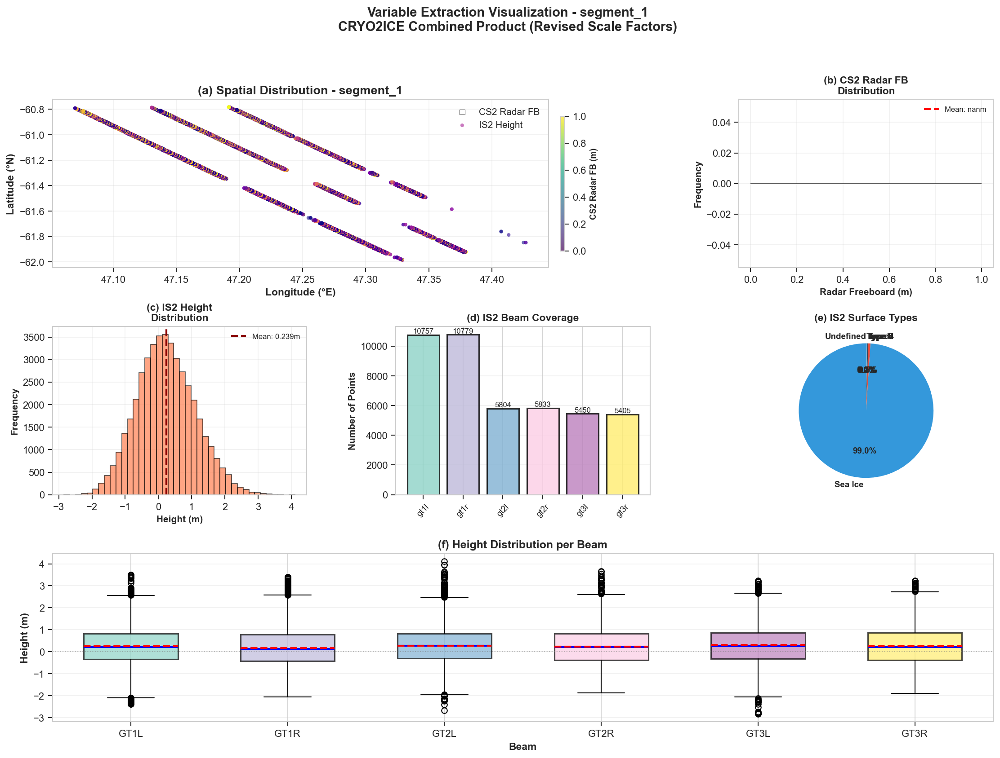


✅ EXTRACTION COMPLETE


In [10]:
# ============================================================================
# EXTRACT AND SAVE CRYOSAT-2 AND ICESAT-2 FREEBOARD VARIABLES - REVISED
# From CRYO2ICE Combined Product (NetCDF format)
# Fixed CryoSat-2 Data Handling with Proper Scale Factors
# ============================================================================

import numpy as np
import pandas as pd
import netCDF4 as nc
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import warnings
from datetime import datetime
from tqdm import tqdm
import json
warnings.filterwarnings('ignore')

# Set visualization style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("paper", font_scale=1.2)
plt.rcParams['figure.dpi'] = 150

# ============================================================================
# CONFIGURATION
# ============================================================================

# Base directory containing segment files
BASE_DIR = Path(r"D:\phd\data\cs2eo\sea_ice_SIR_SAR_L2_E__ATL07_antarctic_2021_09_combined_product")

# Output directory for extracted variables
OUTPUT_DIR = BASE_DIR / "extracted_variables"
OUTPUT_DIR.mkdir(exist_ok=True)

# Create subdirectories
CS2_OUTPUT_DIR = OUTPUT_DIR / "cryosat2"
IS2_OUTPUT_DIR = OUTPUT_DIR / "icesat2"
COMBINED_OUTPUT_DIR = OUTPUT_DIR / "combined"

for dir_path in [CS2_OUTPUT_DIR, IS2_OUTPUT_DIR, COMBINED_OUTPUT_DIR]:
    dir_path.mkdir(exist_ok=True)

# ICESat-2 beams
BEAMS = ['gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r']

# Fill value handling
FILL_VALUE_FLOAT32 = 3.4028235e+38
FILL_VALUE_INT32 = 2147483647
FILL_VALUE_THRESHOLD = 1e10

print("="*80)
print("CRYOSAT-2 AND ICESAT-2 VARIABLE EXTRACTION - REVISED")
print("CRYO2ICE Combined Product (ATL07 Structure)")
print("="*80)
print(f"\nBase Directory: {BASE_DIR}")
print(f"Output Directory: {OUTPUT_DIR}")

# ============================================================================
# UTILITY FUNCTIONS
# ============================================================================

def clean_fill_values(array: np.ndarray, fill_value=None, scale_factor=1.0) -> np.ndarray:
    """
    Replace fill values with NaN and apply scale factor
    
    Parameters:
    -----------
    array : np.ndarray
        Input array
    fill_value : float/int, optional
        Specific fill value to check for
    scale_factor : float
        Scale factor to apply to valid values
    
    Returns:
    --------
    array_clean : np.ndarray
        Cleaned array with NaN for invalid values
    """
    # Create a copy as float array
    array_clean = array.astype(float).copy()
    
    # Apply scale factor FIRST (before checking for fill values)
    if scale_factor != 1.0 and scale_factor is not None:
        array_clean = array_clean * scale_factor
    
    # Replace various fill value types
    if fill_value is not None:
        array_clean[array == fill_value] = np.nan
    
    # Common fill value patterns
    array_clean[np.abs(array_clean) > FILL_VALUE_THRESHOLD] = np.nan
    array_clean[array == FILL_VALUE_FLOAT32] = np.nan
    array_clean[array == FILL_VALUE_INT32] = np.nan
    array_clean[~np.isfinite(array_clean)] = np.nan
    
    # Additional check for scaled integer fill values
    # Sometimes scaled fill values become very large
    if scale_factor != 1.0:
        max_reasonable = 1000  # Adjust based on expected data range
        array_clean[np.abs(array_clean) > max_reasonable] = np.nan
    
    return array_clean

def get_variable_attributes(nc_var):
    """
    Extract all attributes from a NetCDF variable
    
    Returns:
    --------
    attrs : dict
        Dictionary of variable attributes
    """
    attrs = {}
    for attr_name in nc_var.ncattrs():
        attrs[attr_name] = getattr(nc_var, attr_name)
    return attrs

def find_atl07_group(nc_file):
    """Dynamically find the ATL07 group in NetCDF file"""
    try:
        # Strategy 1: Check for numbered group
        for group_name in nc_file.groups.keys():
            if group_name.isdigit():
                sub_group = nc_file.groups[group_name]
                if 'ATL07' in sub_group.groups:
                    return sub_group.groups['ATL07']
        
        # Strategy 2: Check for ATL07 directly
        if 'ATL07' in nc_file.groups:
            return nc_file.groups['ATL07']
        
        # Strategy 3: Check if beams are in root
        if any(key.startswith('gt') for key in nc_file.groups.keys()):
            return nc_file
        
        return None
    except Exception as e:
        return None

# ============================================================================
# EXTRACTION FUNCTIONS
# ============================================================================

def extract_cryosat2_variables(nc_file, segment_name):
    """
    Extract CryoSat-2 radar freeboard and coordinates with proper scale factors
    
    Variables:
    - radar_freeboard_20_ku: Radar freeboard
    - lat_poca_20_ku: Latitude
    - lon_poca_20_ku: Longitude
    - time_20_ku: Time
    """
    try:
        # Navigate to CS2 group
        main_group = nc_file.groups['1']
        cs2_group = main_group.groups['SIR_SAR_L2_E']
        
        # Get variables and their attributes
        radar_fb_var = cs2_group.variables['radar_freeboard_20_ku']
        lat_var = cs2_group.variables['lat_poca_20_ku']
        lon_var = cs2_group.variables['lon_poca_20_ku']
        time_var = cs2_group.variables['time_20_ku']
        
        # Get attributes for proper scaling
        radar_fb_attrs = get_variable_attributes(radar_fb_var)
        lat_attrs = get_variable_attributes(lat_var)
        lon_attrs = get_variable_attributes(lon_var)
        time_attrs = get_variable_attributes(time_var)
        
        # Extract scale factors and fill values
        radar_fb_scale = radar_fb_attrs.get('scale_factor', 1.0)
        radar_fb_fill = radar_fb_attrs.get('_FillValue', None)
        
        lat_scale = lat_attrs.get('scale_factor', 1.0)
        lat_fill = lat_attrs.get('_FillValue', None)
        
        lon_scale = lon_attrs.get('scale_factor', 1.0)
        lon_fill = lon_attrs.get('_FillValue', None)
        
        time_scale = time_attrs.get('scale_factor', 1.0)
        time_fill = time_attrs.get('_FillValue', None)
        
        # Extract raw data
        radar_fb_raw = np.array(radar_fb_var[:])
        lat_raw = np.array(lat_var[:])
        lon_raw = np.array(lon_var[:])
        time_raw = np.array(time_var[:])
        
        # Apply scale factors and clean fill values
        radar_fb = clean_fill_values(radar_fb_raw, fill_value=radar_fb_fill, scale_factor=radar_fb_scale)
        lat = clean_fill_values(lat_raw, fill_value=lat_fill, scale_factor=lat_scale)
        lon = clean_fill_values(lon_raw, fill_value=lon_fill, scale_factor=lon_scale)
        time = clean_fill_values(time_raw, fill_value=time_fill, scale_factor=time_scale)
        
        # Debug information
        print(f"\n  🔍 CryoSat-2 Data Extraction Debug:")
        print(f"    Radar Freeboard:")
        print(f"      Raw range: [{np.nanmin(radar_fb_raw)}, {np.nanmax(radar_fb_raw)}]")
        print(f"      Scale factor: {radar_fb_scale}")
        print(f"      Fill value: {radar_fb_fill}")
        print(f"      Scaled range: [{np.nanmin(radar_fb)}, {np.nanmax(radar_fb)}]")
        print(f"      Valid points: {np.sum(~np.isnan(radar_fb))}/{len(radar_fb)}")
        
        # Create DataFrame
        df_cs2 = pd.DataFrame({
            'segment': segment_name,
            'latitude': lat,
            'longitude': lon,
            'time': time,
            'radar_freeboard': radar_fb
        })
        
        # Apply physical constraints (more lenient for initial inspection)
        valid_mask = (~df_cs2['radar_freeboard'].isna()) & \
                     (~df_cs2['latitude'].isna()) & \
                     (~df_cs2['longitude'].isna()) & \
                     (df_cs2['radar_freeboard'] >= -2.0) & \
                     (df_cs2['radar_freeboard'] <= 5.0) & \
                     (df_cs2['latitude'] >= -90) & \
                     (df_cs2['latitude'] <= -60) & \
                     (df_cs2['longitude'] >= -180) & \
                     (df_cs2['longitude'] <= 180)
        
        df_cs2_valid = df_cs2[valid_mask].copy()
        
        print(f"    After quality filtering: {len(df_cs2_valid)}/{len(df_cs2)} records retained")
        
        if len(df_cs2_valid) > 0:
            print(f"    Radar freeboard stats:")
            print(f"      Mean: {df_cs2_valid['radar_freeboard'].mean():.4f} m")
            print(f"      Std: {df_cs2_valid['radar_freeboard'].std():.4f} m")
            print(f"      Range: [{df_cs2_valid['radar_freeboard'].min():.4f}, {df_cs2_valid['radar_freeboard'].max():.4f}] m")
        
        return df_cs2_valid, True, None
        
    except Exception as e:
        import traceback
        error_msg = f"{str(e)}\n{traceback.format_exc()}"
        return None, False, error_msg

def extract_icesat2_variables(nc_file, segment_name):
    """
    Extract ICESat-2 ATL07 sea ice height variables for all beams
    """
    try:
        # Find ATL07 group
        atl07_group = find_atl07_group(nc_file)
        
        if atl07_group is None:
            return None, False, "Could not find ATL07 group"
        
        # Dictionary to store all beam data
        beam_data = {}
        
        # Extract data for each beam
        for beam in BEAMS:
            if beam not in atl07_group.groups:
                continue
            
            try:
                beam_group = atl07_group.groups[beam]
                seg_group = beam_group.groups['sea_ice_segments']
                heights_group = seg_group.groups['heights']
                
                # Get variables
                lat_var = seg_group.variables['latitude']
                lon_var = seg_group.variables['longitude']
                time_var = seg_group.variables['delta_time']
                height_var = heights_group.variables['height_segment_height']
                conf_var = heights_group.variables['height_segment_confidence']
                type_var = heights_group.variables['height_segment_type']
                
                # Get scale factors if they exist
                lat_scale = getattr(lat_var, 'scale_factor', 1.0)
                lon_scale = getattr(lon_var, 'scale_factor', 1.0)
                time_scale = getattr(time_var, 'scale_factor', 1.0)
                height_scale = getattr(height_var, 'scale_factor', 1.0)
                
                # Extract and clean
                latitude = clean_fill_values(np.array(lat_var[:]), scale_factor=lat_scale)
                longitude = clean_fill_values(np.array(lon_var[:]), scale_factor=lon_scale)
                delta_time = clean_fill_values(np.array(time_var[:]), scale_factor=time_scale)
                height_segment = clean_fill_values(np.array(height_var[:]), scale_factor=height_scale)
                confidence = np.array(conf_var[:])
                surface_type = np.array(type_var[:])
                
                # Create DataFrame for this beam
                df_beam = pd.DataFrame({
                    'segment': segment_name,
                    'beam': beam,
                    'latitude': latitude,
                    'longitude': longitude,
                    'delta_time': delta_time,
                    'height_segment': height_segment,
                    'confidence': confidence,
                    'surface_type': surface_type
                })
                
                # Keep only valid measurements
                valid_mask = (~df_beam['height_segment'].isna()) & \
                             (~df_beam['latitude'].isna()) & \
                             (~df_beam['longitude'].isna()) & \
                             (df_beam['height_segment'] >= -10.0) & \
                             (df_beam['height_segment'] <= 10.0) & \
                             (df_beam['latitude'] >= -90) & \
                             (df_beam['latitude'] <= -60)
                
                df_beam_valid = df_beam[valid_mask].copy()
                
                if len(df_beam_valid) > 0:
                    beam_data[beam] = df_beam_valid
                
            except Exception as e:
                print(f"    ⚠️ Warning: Could not extract beam {beam}: {str(e)}")
                continue
        
        if len(beam_data) == 0:
            return None, False, "No valid beam data found"
        
        # Combine all beams
        df_is2_all = pd.concat(beam_data.values(), ignore_index=True)
        
        print(f"  ✅ ICESat-2: Extracted {len(df_is2_all):,} valid measurements from {len(beam_data)} beams")
        
        return df_is2_all, True, None
        
    except Exception as e:
        import traceback
        error_msg = f"{str(e)}\n{traceback.format_exc()}"
        return None, False, error_msg

# ============================================================================
# PROCESS SINGLE SEGMENT
# ============================================================================

def process_segment_file(segment_file: Path):
    """
    Process a single segment file and extract both CS2 and IS2 variables
    """
    segment_name = segment_file.stem
    
    results = {
        'segment': segment_name,
        'cs2_success': False,
        'is2_success': False,
        'cs2_records': 0,
        'is2_records': 0,
        'cs2_error': None,
        'is2_error': None
    }
    
    try:
        nc_file = nc.Dataset(segment_file, 'r')
        
        try:
            # Extract CryoSat-2 data
            df_cs2, cs2_success, cs2_error = extract_cryosat2_variables(nc_file, segment_name)
            results['cs2_success'] = cs2_success
            results['cs2_error'] = cs2_error
            
            if cs2_success and df_cs2 is not None:
                results['cs2_records'] = len(df_cs2)
                # Save CS2 data
                cs2_file = CS2_OUTPUT_DIR / f"{segment_name}_cs2.csv"
                df_cs2.to_csv(cs2_file, index=False)
            
            # Extract ICESat-2 data
            df_is2, is2_success, is2_error = extract_icesat2_variables(nc_file, segment_name)
            results['is2_success'] = is2_success
            results['is2_error'] = is2_error
            
            if is2_success and df_is2 is not None:
                results['is2_records'] = len(df_is2)
                # Save IS2 data
                is2_file = IS2_OUTPUT_DIR / f"{segment_name}_is2.csv"
                df_is2.to_csv(is2_file, index=False)
                
                # Save per-beam files
                for beam in BEAMS:
                    df_beam = df_is2[df_is2['beam'] == beam]
                    if len(df_beam) > 0:
                        beam_file = IS2_OUTPUT_DIR / f"{segment_name}_is2_{beam}.csv"
                        df_beam.to_csv(beam_file, index=False)
            
            # If both successful, save combined file
            if cs2_success and is2_success and df_cs2 is not None and df_is2 is not None:
                combined_file = COMBINED_OUTPUT_DIR / f"{segment_name}_combined.npz"
                np.savez_compressed(
                    combined_file,
                    cs2_lat=df_cs2['latitude'].values,
                    cs2_lon=df_cs2['longitude'].values,
                    cs2_radar_fb=df_cs2['radar_freeboard'].values,
                    cs2_time=df_cs2['time'].values,
                    is2_lat=df_is2['latitude'].values,
                    is2_lon=df_is2['longitude'].values,
                    is2_height=df_is2['height_segment'].values,
                    is2_time=df_is2['delta_time'].values,
                    is2_beam=df_is2['beam'].values,
                    is2_confidence=df_is2['confidence'].values,
                    is2_surface_type=df_is2['surface_type'].values
                )
        
        finally:
            nc_file.close()
        
        return results
        
    except Exception as e:
        results['cs2_error'] = str(e)
        results['is2_error'] = str(e)
        return results

# ============================================================================
# BATCH PROCESSING
# ============================================================================

print("\n" + "="*80)
print("FINDING SEGMENT FILES")
print("="*80)

# Find all segment files
segment_files = sorted(list(BASE_DIR.glob("segment_*.nc")))
n_segments = len(segment_files)

print(f"\nFound {n_segments} segment files")

if n_segments == 0:
    print("\n❌ ERROR: No segment files found!")
    print(f"   Looking in: {BASE_DIR}")
else:
    print("\n" + "="*80)
    print("PROCESSING SEGMENTS")
    print("="*80 + "\n")
    
    all_results = []
    cs2_success_count = 0
    is2_success_count = 0
    both_success_count = 0
    
    for i, segment_file in enumerate(tqdm(segment_files, desc="Processing segments"), 1):
        result = process_segment_file(segment_file)
        all_results.append(result)
        
        if result['cs2_success']:
            cs2_success_count += 1
        if result['is2_success']:
            is2_success_count += 1
        if result['cs2_success'] and result['is2_success']:
            both_success_count += 1
        
        # Print progress every 10 segments
        if i % 10 == 0:
            print(f"\n  Progress: {i}/{n_segments} segments processed")
            print(f"    CS2 success: {cs2_success_count}/{i}")
            print(f"    IS2 success: {is2_success_count}/{i}")
            print(f"    Both success: {both_success_count}/{i}")
    
    # ========================================================================
    # SUMMARY AND STATISTICS
    # ========================================================================
    
    print("\n" + "="*80)
    print("PROCESSING COMPLETE")
    print("="*80)
    
    # Create results DataFrame
    df_results = pd.DataFrame(all_results)
    
    # Save summary
    summary_file = OUTPUT_DIR / f"extraction_summary_{datetime.now().strftime('%Y%m%d_%H%M%S')}.csv"
    df_results.to_csv(summary_file, index=False)
    
    print(f"\n📊 OVERALL STATISTICS:")
    print(f"   Total segments: {n_segments}")
    print(f"   CryoSat-2 success: {cs2_success_count} ({cs2_success_count/n_segments*100:.1f}%)")
    print(f"   ICESat-2 success: {is2_success_count} ({is2_success_count/n_segments*100:.1f}%)")
    print(f"   Both success: {both_success_count} ({both_success_count/n_segments*100:.1f}%)")
    
    # CryoSat-2 statistics
    cs2_successful = df_results[df_results['cs2_success']]
    if len(cs2_successful) > 0:
        print(f"\n📡 CRYOSAT-2 DATA:")
        print(f"   Total records: {cs2_successful['cs2_records'].sum():,}")
        print(f"   Mean per segment: {cs2_successful['cs2_records'].mean():.0f}")
        print(f"   Median per segment: {cs2_successful['cs2_records'].median():.0f}")
        print(f"   Range: [{cs2_successful['cs2_records'].min()}, {cs2_successful['cs2_records'].max()}]")
    
    # ICESat-2 statistics
    is2_successful = df_results[df_results['is2_success']]
    if len(is2_successful) > 0:
        print(f"\n🛰️ ICESAT-2 DATA:")
        print(f"   Total records: {is2_successful['is2_records'].sum():,}")
        print(f"   Mean per segment: {is2_successful['is2_records'].mean():.0f}")
        print(f"   Median per segment: {is2_successful['is2_records'].median():.0f}")
        print(f"   Range: [{is2_successful['is2_records'].min()}, {is2_successful['is2_records'].max()}]")
    
    # Error analysis
    print(f"\n❌ ERROR ANALYSIS:")
    if cs2_success_count < n_segments:
        cs2_failed = df_results[~df_results['cs2_success']]
        print(f"\n   CryoSat-2 failures: {len(cs2_failed)}")
        if len(cs2_failed) > 0 and cs2_failed['cs2_error'].notna().any():
            error_counts = cs2_failed['cs2_error'].value_counts()
            for error, count in error_counts.head(5).items():
                print(f"     - {str(error)[:100]}: {count} segments")
    
    if is2_success_count < n_segments:
        is2_failed = df_results[~df_results['is2_success']]
        print(f"\n   ICESat-2 failures: {len(is2_failed)}")
        if len(is2_failed) > 0 and is2_failed['is2_error'].notna().any():
            error_counts = is2_failed['is2_error'].value_counts()
            for error, count in error_counts.head(5).items():
                print(f"     - {str(error)[:100]}: {count} segments")
    
    print(f"\n📁 OUTPUT DIRECTORIES:")
    print(f"   CryoSat-2: {CS2_OUTPUT_DIR}")
    print(f"   ICESat-2: {IS2_OUTPUT_DIR}")
    print(f"   Combined: {COMBINED_OUTPUT_DIR}")
    print(f"   Summary: {summary_file}")
    
    # ========================================================================
    # VISUALIZATION: SAMPLE SEGMENT (if both datasets exist)
    # ========================================================================
    
    both_success = df_results[df_results['cs2_success'] & df_results['is2_success']]
    
    if len(both_success) > 0:
        print("\n" + "="*80)
        print("GENERATING VISUALIZATION - SAMPLE SEGMENT")
        print("="*80)
        
        # Select segment with most data
        sample_idx = both_success['is2_records'].idxmax()
        sample_segment = both_success.loc[sample_idx, 'segment']
        
        print(f"\n📍 Visualizing: {sample_segment}")
        print(f"   CS2 records: {both_success.loc[sample_idx, 'cs2_records']:,}")
        print(f"   IS2 records: {both_success.loc[sample_idx, 'is2_records']:,}")
        
        # Load data
        df_cs2_sample = pd.read_csv(CS2_OUTPUT_DIR / f"{sample_segment}_cs2.csv")
        df_is2_sample = pd.read_csv(IS2_OUTPUT_DIR / f"{sample_segment}_is2.csv")
        
        # Create visualization
        fig = plt.figure(figsize=(18, 12))
        gs = gridspec.GridSpec(3, 3, figure=fig, hspace=0.35, wspace=0.35)
        
        # Panel 1: Spatial distribution
        ax1 = fig.add_subplot(gs[0, :2])
        scatter1 = ax1.scatter(df_cs2_sample['longitude'], df_cs2_sample['latitude'],
                   c=df_cs2_sample['radar_freeboard'], cmap='viridis',
                   s=30, alpha=0.7, label='CS2 Radar FB', marker='s',
                   edgecolors='black', linewidths=0.5, vmin=0, vmax=1)
        scatter2 = ax1.scatter(df_is2_sample['longitude'], df_is2_sample['latitude'],
                   c=df_is2_sample['height_segment'], cmap='plasma',
                   s=15, alpha=0.6, label='IS2 Height', marker='o',
                   edgecolors='none', vmin=-0.5, vmax=1.5)
        
        ax1.set_xlabel('Longitude (°E)', fontsize=11, fontweight='bold')
        ax1.set_ylabel('Latitude (°N)', fontsize=11, fontweight='bold')
        ax1.set_title(f'(a) Spatial Distribution - {sample_segment}', fontsize=13, fontweight='bold')
        ax1.legend(loc='best', fontsize=10)
        ax1.grid(alpha=0.3)
        
        # Add colorbars
        cbar1 = plt.colorbar(scatter1, ax=ax1, pad=0.02, aspect=30, shrink=0.8)
        cbar1.set_label('CS2 Radar FB (m)', fontsize=9)
        
        # Panel 2: CS2 Radar Freeboard Distribution
        ax2 = fig.add_subplot(gs[0, 2])
        n, bins, patches = ax2.hist(df_cs2_sample['radar_freeboard'], bins=40, 
                                    color='steelblue', edgecolor='black', alpha=0.7)
        ax2.axvline(df_cs2_sample['radar_freeboard'].mean(), color='red', 
                   linestyle='--', linewidth=2, label=f'Mean: {df_cs2_sample["radar_freeboard"].mean():.3f}m')
        ax2.set_xlabel('Radar Freeboard (m)', fontsize=10, fontweight='bold')
        ax2.set_ylabel('Frequency', fontsize=10, fontweight='bold')
        ax2.set_title('(b) CS2 Radar FB\nDistribution', fontsize=11, fontweight='bold')
        ax2.legend(fontsize=8)
        ax2.grid(alpha=0.3)
        
        # Panel 3: IS2 Height Distribution
        ax3 = fig.add_subplot(gs[1, 0])
        ax3.hist(df_is2_sample['height_segment'], bins=40, color='coral',
                edgecolor='black', alpha=0.7)
        ax3.axvline(df_is2_sample['height_segment'].mean(), color='darkred',
                   linestyle='--', linewidth=2, label=f'Mean: {df_is2_sample["height_segment"].mean():.3f}m')
        ax3.set_xlabel('Height (m)', fontsize=10, fontweight='bold')
        ax3.set_ylabel('Frequency', fontsize=10, fontweight='bold')
        ax3.set_title('(c) IS2 Height\nDistribution', fontsize=11, fontweight='bold')
        ax3.legend(fontsize=8)
        ax3.grid(alpha=0.3)
        
        # Panel 4: IS2 Beam Distribution
        ax4 = fig.add_subplot(gs[1, 1])
        beam_counts = df_is2_sample['beam'].value_counts().sort_index()
        colors_beam = plt.cm.Set3(np.linspace(0, 1, len(beam_counts)))
        bars = ax4.bar(range(len(beam_counts)), beam_counts.values,
                      color=colors_beam, edgecolor='black', linewidth=1.5, alpha=0.8)
        ax4.set_xticks(range(len(beam_counts)))
        ax4.set_xticklabels(beam_counts.index, rotation=45, fontsize=9)
        ax4.set_ylabel('Number of Points', fontsize=10, fontweight='bold')
        ax4.set_title('(d) IS2 Beam Coverage', fontsize=11, fontweight='bold')
        ax4.grid(alpha=0.3, axis='y')
        
        # Add counts on bars
        for i, bar in enumerate(bars):
            height = bar.get_height()
            ax4.text(bar.get_x() + bar.get_width()/2., height,
                    f'{int(height)}', ha='center', va='bottom', fontsize=8)
        
        # Panel 5: IS2 Surface Type
        ax5 = fig.add_subplot(gs[1, 2])
        surface_counts = df_is2_sample['surface_type'].value_counts().sort_index()
        surface_labels = {0: 'Undefined', 1: 'Sea Ice', 2: 'Lead', 3: 'Dark Lead'}
        labels = [surface_labels.get(int(i), f'Type {int(i)}') for i in surface_counts.index]
        colors_surface = ['#95a5a6', '#3498db', '#e74c3c', '#34495e']
        wedges, texts, autotexts = ax5.pie(surface_counts.values, labels=labels, autopct='%1.1f%%',
               colors=colors_surface[:len(surface_counts)], startangle=90,
               textprops={'fontsize': 9, 'weight': 'bold'})
        ax5.set_title('(e) IS2 Surface Types', fontsize=11, fontweight='bold')
        
        # Panel 6: Per-Beam Height Distributions
        ax6 = fig.add_subplot(gs[2, :])
        beam_data = [df_is2_sample[df_is2_sample['beam'] == beam]['height_segment'].values
                     for beam in BEAMS if beam in df_is2_sample['beam'].values]
        beam_labels = [beam.upper() for beam in BEAMS if beam in df_is2_sample['beam'].values]
        
        bp = ax6.boxplot(beam_data, labels=beam_labels, patch_artist=True,
                        showmeans=True, widths=0.6, meanline=True,
                        medianprops=dict(color='blue', linewidth=2),
                        meanprops=dict(color='red', linewidth=2, linestyle='--'))
        
        for patch, color in zip(bp['boxes'], plt.cm.Set3(np.linspace(0, 1, len(beam_data)))):
            patch.set_facecolor(color)
            patch.set_alpha(0.7)
            patch.set_edgecolor('black')
            patch.set_linewidth(1.5)
        
        ax6.set_xlabel('Beam', fontsize=11, fontweight='bold')
        ax6.set_ylabel('Height (m)', fontsize=11, fontweight='bold')
        ax6.set_title('(f) Height Distribution per Beam', fontsize=12, fontweight='bold')
        ax6.grid(alpha=0.3, axis='y')
        ax6.axhline(y=0, color='gray', linestyle=':', linewidth=1, alpha=0.5)
        
        plt.suptitle(f'Variable Extraction Visualization - {sample_segment}\nCRYO2ICE Combined Product (Revised Scale Factors)', 
                    fontsize=14, fontweight='bold', y=0.995)
        
        plt.tight_layout()
        plt.show()
    
    print("\n" + "="*80)
    print("✅ EXTRACTION COMPLETE")
    print("="*80)

In [11]:
# ============================================================================
# INSPECT SEGMENT_1.NC - CRYOSAT-2 GROUP AND VARIABLES
# Focused Analysis on Single Dataset
# ============================================================================

import numpy as np
import pandas as pd
import netCDF4 as nc
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# ============================================================================
# CONFIGURATION
# ============================================================================

# Target file
SEGMENT_FILE = Path(r"D:\phd\data\cs2eo\sea_ice_SIR_SAR_L2_E__ATL07_antarctic_2021_09_combined_product\segment_1.nc")

print("="*80)
print("CRYOSAT-2 DATA INSPECTION - SEGMENT_1.NC")
print("="*80)
print(f"\nTarget file: {SEGMENT_FILE}")
print(f"File exists: {SEGMENT_FILE.exists()}")

if not SEGMENT_FILE.exists():
    print(f"\n❌ ERROR: File not found!")
    print(f"   Please check the file path.")
else:
    print(f"File size: {SEGMENT_FILE.stat().st_size / (1024*1024):.2f} MB")
    
    # ========================================================================
    # OPEN AND EXPLORE FILE STRUCTURE
    # ========================================================================
    
    print("\n" + "="*80)
    print("FILE STRUCTURE EXPLORATION")
    print("="*80)
    
    nc_file = nc.Dataset(SEGMENT_FILE, 'r')
    
    try:
        # Display root-level information
        print(f"\n📋 Root Level:")
        print(f"   Format: {nc_file.file_format}")
        print(f"   Dimensions: {dict(nc_file.dimensions)}")
        print(f"   Variables: {len(nc_file.variables)} variables")
        print(f"   Groups: {list(nc_file.groups.keys())}")
        
        # ====================================================================
        # NAVIGATE TO CRYOSAT-2 GROUP
        # ====================================================================
        
        print("\n" + "="*80)
        print("LOCATING CRYOSAT-2 GROUP")
        print("="*80)
        
        cs2_found = False
        cs2_group = None
        cs2_path = None
        
        # Strategy 1: Check for numbered group (e.g., '1')
        if '1' in nc_file.groups:
            print(f"\n✓ Found numbered group '1'")
            main_group = nc_file.groups['1']
            print(f"  Subgroups in '1': {list(main_group.groups.keys())}")
            
            if 'SIR_SAR_L2_E' in main_group.groups:
                print(f"\n✓ Found CryoSat-2 group: '1/SIR_SAR_L2_E'")
                cs2_group = main_group.groups['SIR_SAR_L2_E']
                cs2_path = "1/SIR_SAR_L2_E"
                cs2_found = True
        
        # Strategy 2: Check for direct SIR_SAR_L2_E group
        if not cs2_found and 'SIR_SAR_L2_E' in nc_file.groups:
            print(f"\n✓ Found CryoSat-2 group: 'SIR_SAR_L2_E' (direct)")
            cs2_group = nc_file.groups['SIR_SAR_L2_E']
            cs2_path = "SIR_SAR_L2_E"
            cs2_found = True
        
        if not cs2_found:
            print(f"\n❌ ERROR: CryoSat-2 group not found!")
            print(f"   Available groups: {list(nc_file.groups.keys())}")
        else:
            print(f"\n✅ CryoSat-2 group located: {cs2_path}")
            
            # ================================================================
            # INSPECT CRYOSAT-2 GROUP
            # ================================================================
            
            print("\n" + "="*80)
            print("CRYOSAT-2 GROUP CONTENTS")
            print("="*80)
            
            print(f"\n📊 Group Dimensions:")
            for dim_name, dim in cs2_group.dimensions.items():
                print(f"   {dim_name}: {len(dim)} {'(unlimited)' if dim.isunlimited() else ''}")
            
            print(f"\n📝 Group Variables ({len(cs2_group.variables)} total):")
            
            # ================================================================
            # CHECK FOR KEY CRYOSAT-2 VARIABLES
            # ================================================================
            
            print("\n" + "="*80)
            print("CHECKING KEY CRYOSAT-2 VARIABLES")
            print("="*80)
            
            key_variables = {
                'radar_freeboard_20_ku': 'Radar Freeboard',
                'lat_poca_20_ku': 'Latitude (POCA)',
                'lon_poca_20_ku': 'Longitude (POCA)',
                'time_20_ku': 'Time'
            }
            
            found_variables = {}
            
            for var_name, var_description in key_variables.items():
                if var_name in cs2_group.variables:
                    var = cs2_group.variables[var_name]
                    found_variables[var_name] = var
                    
                    print(f"\n✅ {var_name} ({var_description})")
                    print(f"   {'─'*70}")
                    print(f"   Shape: {var.shape}")
                    print(f"   Dtype: {var.dtype}")
                    print(f"   Dimensions: {var.dimensions}")
                    
                    # Display attributes
                    print(f"   Attributes:")
                    for attr_name in var.ncattrs():
                        attr_value = getattr(var, attr_name)
                        # Format attribute value for readability
                        if isinstance(attr_value, (int, float, np.number)):
                            attr_str = f"{attr_value}"
                        elif isinstance(attr_value, str):
                            attr_str = f'"{attr_value}"' if len(attr_value) < 60 else f'"{attr_value[:57]}..."'
                        else:
                            attr_str = str(attr_value)
                        print(f"      {attr_name}: {attr_str}")
                    
                    # Preview data
                    try:
                        data = var[:]
                        print(f"   Data preview (first 5 values): {data.flatten()[:5]}")
                        
                        # Get scale factor if exists
                        scale_factor = getattr(var, 'scale_factor', 1.0)
                        fill_value = getattr(var, '_FillValue', None)
                        
                        # Apply scale factor for statistics
                        data_scaled = data.astype(float) * scale_factor
                        
                        # Replace fill values
                        if fill_value is not None:
                            data_scaled[data == fill_value] = np.nan
                        
                        # Calculate statistics
                        valid_data = data_scaled[~np.isnan(data_scaled) & np.isfinite(data_scaled)]
                        
                        if len(valid_data) > 0:
                            print(f"   Statistics (after scaling):")
                            print(f"      Valid points: {len(valid_data)}/{len(data.flatten())}")
                            print(f"      Min: {np.min(valid_data):.6f}")
                            print(f"      Max: {np.max(valid_data):.6f}")
                            print(f"      Mean: {np.mean(valid_data):.6f}")
                            print(f"      Std: {np.std(valid_data):.6f}")
                        else:
                            print(f"   ⚠️  No valid data after scaling and fill value removal")
                    
                    except Exception as e:
                        print(f"   ⚠️  Could not preview data: {str(e)}")
                
                else:
                    print(f"\n❌ {var_name} ({var_description}) - NOT FOUND")
            
            # ================================================================
            # SUMMARY
            # ================================================================
            
            print("\n" + "="*80)
            print("INSPECTION SUMMARY")
            print("="*80)
            
            print(f"\n📍 CryoSat-2 Group Path: {cs2_path}")
            print(f"\n✅ Key Variables Found: {len(found_variables)}/{len(key_variables)}")
            
            for var_name, var_description in key_variables.items():
                status = "✓ FOUND" if var_name in found_variables else "✗ MISSING"
                print(f"   {status}: {var_name} ({var_description})")
            
            if len(found_variables) == len(key_variables):
                print(f"\n🎉 SUCCESS: All required CryoSat-2 variables are present!")
                print(f"\nYou can proceed with:")
                print(f"   • Radar freeboard extraction")
                print(f"   • Spatial co-location with ICESat-2")
                print(f"   • Snow thickness estimation")
            else:
                print(f"\n⚠️  WARNING: Some required variables are missing!")
                print(f"   Missing variables may prevent snow thickness calculation.")
            
            # ================================================================
            # ADDITIONAL VARIABLES
            # ================================================================
            
            print("\n" + "="*80)
            print("OTHER AVAILABLE CRYOSAT-2 VARIABLES")
            print("="*80)
            
            other_vars = [v for v in cs2_group.variables.keys() if v not in key_variables.keys()]
            
            print(f"\nTotal: {len(other_vars)} additional variables")
            print(f"\nFirst 20 variables:")
            
            for i, var_name in enumerate(other_vars[:20], 1):
                var = cs2_group.variables[var_name]
                long_name = getattr(var, 'long_name', 'N/A')
                if len(long_name) > 50:
                    long_name = long_name[:47] + "..."
                print(f"   {i:2d}. {var_name:30s} - {long_name}")
            
            if len(other_vars) > 20:
                print(f"   ... and {len(other_vars) - 20} more variables")
            
            print(f"\n💡 TIP: You can explore all {len(cs2_group.variables)} variables using:")
            print(f"   list(cs2_group.variables.keys())")
    
    finally:
        nc_file.close()
        print("\n" + "="*80)
        print("✅ FILE CLOSED - INSPECTION COMPLETE")
        print("="*80)

CRYOSAT-2 DATA INSPECTION - SEGMENT_1.NC

Target file: D:\phd\data\cs2eo\sea_ice_SIR_SAR_L2_E__ATL07_antarctic_2021_09_combined_product\segment_1.nc
File exists: True
File size: 11.04 MB

FILE STRUCTURE EXPLORATION

📋 Root Level:
   Format: NETCDF4
   Dimensions: {}
   Variables: 0 variables
   Groups: ['1']

LOCATING CRYOSAT-2 GROUP

✓ Found numbered group '1'
  Subgroups in '1': ['SIR_SAR_L2_E', 'ATL07']

✓ Found CryoSat-2 group: '1/SIR_SAR_L2_E'

✅ CryoSat-2 group located: 1/SIR_SAR_L2_E

CRYOSAT-2 GROUP CONTENTS

📊 Group Dimensions:
   time_20_ku: 411 
   time_cor_01: 21 

📝 Group Variables (60 total):

CHECKING KEY CRYOSAT-2 VARIABLES

✅ radar_freeboard_20_ku (Radar Freeboard)
   ──────────────────────────────────────────────────────────────────────
   Shape: (411,)
   Dtype: int16
   Dimensions: ('time_20_ku',)
   Attributes:
      _FillValue: -32768
      comment: "Radar freeboard. Computed as [radar_freeboard_20_ku] = [h..."
      coordinates: "lon_poca_20_ku lat_poca_20_ku"
  

CRYOSAT-2 & ICESAT-2 SCIENTIFIC ANALYSIS
File: segment_1.nc


STEP 1: EXTRACTING CRYOSAT-2 DATA
  📊 CryoSat-2 Metadata:
     Radar FB scale: 0.001, offset: 0.0, fill: -32768
     Raw data shape: (411,)
     Raw data range: [--, --]
     Scaled data range: [--, --]
     Fill value filter: --/411 pass
     Finite value filter: --/411 pass
     Physical constraints: --/411 pass
     Final valid points: 0/411

  ⚠️ WARNING: No valid CryoSat-2 data after filtering!
     Possible reasons:
     - Data may be empty or corrupted
     - Fill values not correctly identified
     - Physical constraints too strict

STEP 2: EXTRACTING ICESAT-2 DATA

  🔍 Found 6 ICESat-2 beams: gt1l, gt1r, gt2l, gt2r, gt3l, gt3r
     gt1l: 10757 valid points
     gt1r: 10779 valid points
     gt2l: 5804 valid points
     gt2r: 5833 valid points
     gt3l: 5450 valid points
     gt3r: 5405 valid points

  ✅ ICESat-2 Data Extracted:
     Total points: 44028
     Valid sea-ice height: 44028
     Lat range: [-61.984, -60

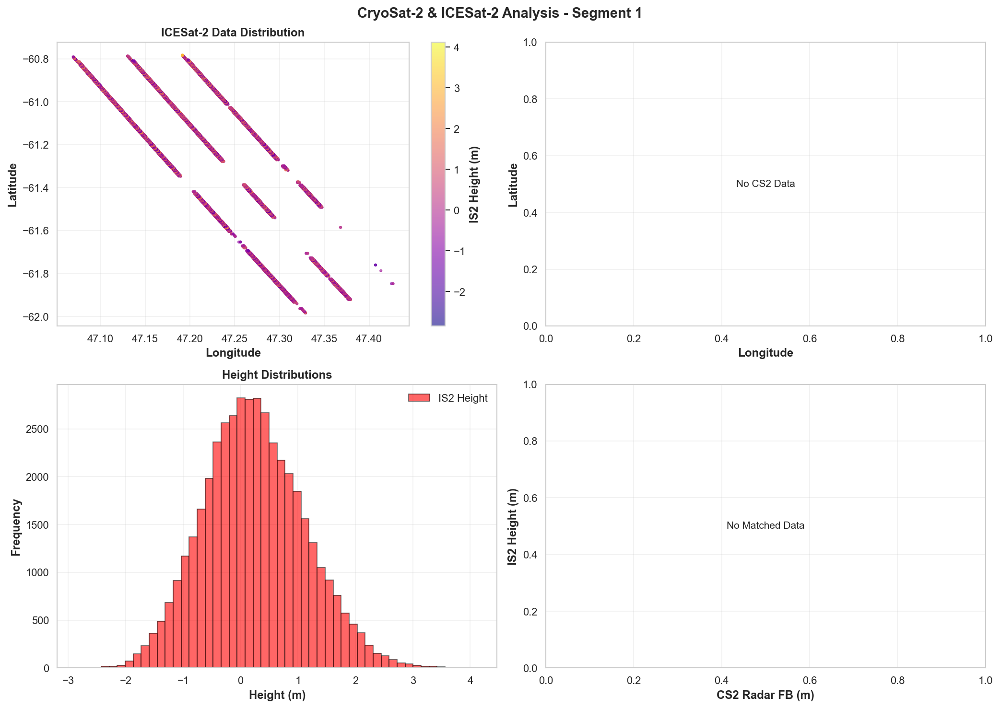


✅ Analysis complete!

FILE CLOSED


In [14]:
# ============================================================================
# CRYOSAT-2 & ICESAT-2 COMPARATIVE ANALYSIS - SEGMENT_1.NC
# Scientific Analysis of Radar Freeboard vs Sea-Ice Height
# FIXED: Improved CS2 data extraction and error handling
# ============================================================================

import numpy as np
import pandas as pd
import netCDF4 as nc
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import cKDTree
from scipy import stats
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')

# Set visualization style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (16, 12)
plt.rcParams['font.size'] = 10

# ============================================================================
# CONFIGURATION
# ============================================================================

SEGMENT_FILE = Path(r"D:\phd\data\cs2eo\sea_ice_SIR_SAR_L2_E__ATL07_antarctic_2021_09_combined_product\segment_1.nc")

print("="*80)
print("CRYOSAT-2 & ICESAT-2 SCIENTIFIC ANALYSIS")
print("="*80)
print(f"File: {SEGMENT_FILE.name}\n")

# ============================================================================
# DATA EXTRACTION FUNCTIONS
# ============================================================================

def extract_cryosat2_data(nc_file):
    """Extract CryoSat-2 radar freeboard and geolocation data with improved handling"""
    
    try:
        cs2_group = nc_file.groups['1'].groups['SIR_SAR_L2_E']
        
        # Extract raw variables
        radar_fb_raw = cs2_group.variables['radar_freeboard_20_ku'][:]
        lat_raw = cs2_group.variables['lat_poca_20_ku'][:]
        lon_raw = cs2_group.variables['lon_poca_20_ku'][:]
        time_raw = cs2_group.variables['time_20_ku'][:]
        
        # Get metadata
        radar_fb_var = cs2_group.variables['radar_freeboard_20_ku']
        fb_scale = getattr(radar_fb_var, 'scale_factor', 1.0)
        fb_offset = getattr(radar_fb_var, 'add_offset', 0.0)
        fb_fill = getattr(radar_fb_var, '_FillValue', None)
        
        lat_var = cs2_group.variables['lat_poca_20_ku']
        lat_scale = getattr(lat_var, 'scale_factor', 1.0)
        lat_offset = getattr(lat_var, 'add_offset', 0.0)
        
        lon_var = cs2_group.variables['lon_poca_20_ku']
        lon_scale = getattr(lon_var, 'scale_factor', 1.0)
        lon_offset = getattr(lon_var, 'add_offset', 0.0)
        
        print(f"  📊 CryoSat-2 Metadata:")
        print(f"     Radar FB scale: {fb_scale}, offset: {fb_offset}, fill: {fb_fill}")
        print(f"     Raw data shape: {radar_fb_raw.shape}")
        print(f"     Raw data range: [{np.min(radar_fb_raw)}, {np.max(radar_fb_raw)}]")
        
        # Apply scaling with proper handling
        radar_fb_scaled = (radar_fb_raw.astype(float) * fb_scale) + fb_offset
        lat_scaled = (lat_raw.astype(float) * lat_scale) + lat_offset
        lon_scaled = (lon_raw.astype(float) * lon_scale) + lon_offset
        
        print(f"     Scaled data range: [{np.min(radar_fb_scaled)}, {np.max(radar_fb_scaled)}]")
        
        # Create validity mask - be more lenient initially
        valid_mask = np.ones(len(radar_fb_raw), dtype=bool)
        
        # Check for fill values
        if fb_fill is not None:
            fill_mask = (radar_fb_raw != fb_fill)
            print(f"     Fill value filter: {np.sum(fill_mask)}/{len(radar_fb_raw)} pass")
            valid_mask &= fill_mask
        
        # Check for finite values
        finite_mask = np.isfinite(radar_fb_scaled) & np.isfinite(lat_scaled) & np.isfinite(lon_scaled)
        print(f"     Finite value filter: {np.sum(finite_mask)}/{len(radar_fb_raw)} pass")
        valid_mask &= finite_mask
        
        # Apply LENIENT physical constraints
        physical_mask = ((radar_fb_scaled >= -5.0) & (radar_fb_scaled <= 10.0) &
                        (lat_scaled >= -90) & (lat_scaled <= -50) &
                        (lon_scaled >= -180) & (lon_scaled <= 180))
        print(f"     Physical constraints: {np.sum(physical_mask)}/{len(radar_fb_raw)} pass")
        valid_mask &= physical_mask
        
        print(f"     Final valid points: {np.sum(valid_mask)}/{len(radar_fb_raw)}")
        
        if np.sum(valid_mask) == 0:
            print(f"\n  ⚠️ WARNING: No valid CryoSat-2 data after filtering!")
            print(f"     Possible reasons:")
            print(f"     - Data may be empty or corrupted")
            print(f"     - Fill values not correctly identified")
            print(f"     - Physical constraints too strict")
            return pd.DataFrame()
        
        # Extract valid data
        radar_fb_valid = radar_fb_scaled[valid_mask]
        lat_valid = lat_scaled[valid_mask]
        lon_valid = lon_scaled[valid_mask]
        time_valid = time_raw[valid_mask]
        
        # Convert time to datetime
        time_base = datetime(2000, 1, 1)
        time_datetime = [time_base + timedelta(seconds=float(t)) for t in time_valid]
        
        # Create DataFrame
        df = pd.DataFrame({
            'time': time_datetime,
            'time_tai': time_valid,
            'latitude': lat_valid,
            'longitude': lon_valid,
            'radar_freeboard': radar_fb_valid,
            'data_source': 'CryoSat-2'
        })
        
        # Remove any remaining NaN or inf
        df = df.replace([np.inf, -np.inf], np.nan).dropna()
        
        # Apply tighter physical constraints for final dataset
        df = df[(df['radar_freeboard'] >= -0.5) & (df['radar_freeboard'] <= 2.5)]
        
        print(f"\n  ✅ CryoSat-2 Data Extracted:")
        print(f"     Total points: {len(df)}")
        if len(df) > 0:
            print(f"     Valid radar freeboard: {df['radar_freeboard'].notna().sum()}")
            print(f"     Time range: {df['time'].min()} to {df['time'].max()}")
            print(f"     Lat range: [{df['latitude'].min():.3f}, {df['latitude'].max():.3f}]°")
            print(f"     Lon range: [{df['longitude'].min():.3f}, {df['longitude'].max():.3f}]°")
            print(f"     Radar FB range: [{df['radar_freeboard'].min():.3f}, {df['radar_freeboard'].max():.3f}] m")
        
        return df
        
    except Exception as e:
        print(f"\n  ❌ ERROR extracting CryoSat-2 data: {str(e)}")
        import traceback
        traceback.print_exc()
        return pd.DataFrame()

def extract_icesat2_data(nc_file):
    """Extract ICESat-2 sea-ice height and geolocation data"""
    
    try:
        atl07_group = nc_file.groups['1'].groups['ATL07']
        
        # Get all beam groups
        beam_groups = [key for key in atl07_group.groups.keys() if key.startswith('gt')]
        beam_groups.sort()
        
        print(f"\n  🔍 Found {len(beam_groups)} ICESat-2 beams: {', '.join(beam_groups)}")
        
        all_beam_data = []
        
        for beam in beam_groups:
            try:
                beam_group = atl07_group.groups[beam]
                seg_group = beam_group.groups['sea_ice_segments']
                heights_group = seg_group.groups['heights']
                
                # Extract variables
                lat = np.array(seg_group.variables['latitude'][:])
                lon = np.array(seg_group.variables['longitude'][:])
                delta_time = np.array(seg_group.variables['delta_time'][:])
                height_segment = np.array(heights_group.variables['height_segment_height'][:])
                
                # Get scale factors
                height_var = heights_group.variables['height_segment_height']
                height_scale = getattr(height_var, 'scale_factor', 1.0)
                height_fill = getattr(height_var, '_FillValue', None)
                
                # Apply scaling
                height_scaled = height_segment.astype(float) * height_scale
                
                # Create validity mask
                valid_mask = np.isfinite(height_scaled) & np.isfinite(lat) & np.isfinite(lon)
                
                if height_fill is not None:
                    valid_mask &= (height_segment != height_fill)
                
                # Physical constraints
                valid_mask &= ((height_scaled >= -10.0) & (height_scaled <= 10.0) &
                              (lat >= -90) & (lat <= -50))
                
                if np.sum(valid_mask) > 0:
                    # Convert time
                    time_base = datetime(2018, 1, 1)
                    time_datetime = [time_base + timedelta(seconds=float(t)) for t in delta_time[valid_mask]]
                    
                    beam_df = pd.DataFrame({
                        'time': time_datetime,
                        'time_delta': delta_time[valid_mask],
                        'latitude': lat[valid_mask],
                        'longitude': lon[valid_mask],
                        'sea_ice_height': height_scaled[valid_mask],
                        'beam': beam,
                        'data_source': 'ICESat-2'
                    })
                    
                    all_beam_data.append(beam_df)
                    print(f"     {beam}: {len(beam_df)} valid points")
            
            except Exception as e:
                print(f"     ⚠️ {beam}: Error - {str(e)}")
                continue
        
        if len(all_beam_data) == 0:
            raise ValueError("No valid ICESat-2 data found in any beam")
        
        # Combine all beams
        df = pd.concat(all_beam_data, ignore_index=True)
        
        print(f"\n  ✅ ICESat-2 Data Extracted:")
        print(f"     Total points: {len(df)}")
        print(f"     Valid sea-ice height: {df['sea_ice_height'].notna().sum()}")
        print(f"     Lat range: [{df['latitude'].min():.3f}, {df['latitude'].max():.3f}]°")
        print(f"     Lon range: [{df['longitude'].min():.3f}, {df['longitude'].max():.3f}]°")
        print(f"     Height range: [{df['sea_ice_height'].min():.3f}, {df['sea_ice_height'].max():.3f}] m")
        
        return df
        
    except Exception as e:
        print(f"\n  ❌ ERROR extracting ICESat-2 data: {str(e)}")
        import traceback
        traceback.print_exc()
        return pd.DataFrame()

# ============================================================================
# SPATIAL CO-LOCATION ANALYSIS
# ============================================================================

def spatial_colocation(cs2_df, is2_df, max_distance_km=5.0):
    """
    Find spatially co-located measurements with improved error handling
    """
    
    print(f"\n" + "="*80)
    print("SPATIAL CO-LOCATION ANALYSIS")
    print("="*80)
    print(f"Maximum co-location distance: {max_distance_km} km")
    
    # Check if we have data
    if len(cs2_df) == 0:
        print(f"\n  ⚠️ WARNING: No CryoSat-2 data available for co-location")
        return pd.DataFrame()
    
    if len(is2_df) == 0:
        print(f"\n  ⚠️ WARNING: No ICESat-2 data available for co-location")
        return pd.DataFrame()
    
    # Build KD-tree
    cs2_coords = np.column_stack([cs2_df['latitude'], cs2_df['longitude']])
    is2_coords = np.column_stack([is2_df['latitude'], is2_df['longitude']])
    
    tree = cKDTree(is2_coords)
    
    # Find nearest neighbors
    distances, indices = tree.query(cs2_coords, k=1)
    
    # Convert to km
    mean_lat = np.mean([cs2_df['latitude'].mean(), is2_df['latitude'].mean()])
    km_per_degree = 111.32 * np.cos(np.radians(mean_lat))
    distances_km = distances * km_per_degree
    
    # Filter by distance
    valid_matches = distances_km <= max_distance_km
    
    # Create matched pairs
    matched_data = []
    for i, (valid, dist, idx) in enumerate(zip(valid_matches, distances_km, indices)):
        if valid:
            matched_data.append({
                'cs2_lat': cs2_df.iloc[i]['latitude'],
                'cs2_lon': cs2_df.iloc[i]['longitude'],
                'cs2_radar_fb': cs2_df.iloc[i]['radar_freeboard'],
                'cs2_time': cs2_df.iloc[i]['time'],
                'is2_lat': is2_df.iloc[idx]['latitude'],
                'is2_lon': is2_df.iloc[idx]['longitude'],
                'is2_height': is2_df.iloc[idx]['sea_ice_height'],
                'is2_time': is2_df.iloc[idx]['time'],
                'is2_beam': is2_df.iloc[idx]['beam'],
                'distance_km': dist
            })
    
    matched_df = pd.DataFrame(matched_data)
    
    print(f"\n  ✅ Co-location Results:")
    print(f"     CryoSat-2 points: {len(cs2_df)}")
    print(f"     ICESat-2 points: {len(is2_df)}")
    print(f"     Matched pairs: {len(matched_df)}")
    
    if len(cs2_df) > 0:
        print(f"     Match rate: {len(matched_df)/len(cs2_df)*100:.1f}%")
    
    if len(matched_df) > 0:
        matched_df['height_difference'] = matched_df['is2_height'] - matched_df['cs2_radar_fb']
        
        print(f"\n     Distance statistics:")
        print(f"        Mean: {matched_df['distance_km'].mean():.2f} km")
        print(f"        Median: {matched_df['distance_km'].median():.2f} km")
        print(f"        Max: {matched_df['distance_km'].max():.2f} km")
        
        print(f"\n     Height Difference (IS2 - CS2) Statistics:")
        print(f"        Mean: {matched_df['height_difference'].mean():.3f} m")
        print(f"        Median: {matched_df['height_difference'].median():.3f} m")
        print(f"        Std: {matched_df['height_difference'].std():.3f} m")
        print(f"        Range: [{matched_df['height_difference'].min():.3f}, "
              f"{matched_df['height_difference'].max():.3f}] m")
    
    return matched_df

# ============================================================================
# VISUALIZATION (placeholder for when data is available)
# ============================================================================

def create_simple_visualization(cs2_df, is2_df, matched_df):
    """Create visualization if data exists"""
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    # Plot 1: IS2 spatial distribution
    ax = axes[0, 0]
    if len(is2_df) > 0:
        scatter = ax.scatter(is2_df['longitude'], is2_df['latitude'],
                           c=is2_df['sea_ice_height'], cmap='plasma',
                           s=5, alpha=0.6)
        plt.colorbar(scatter, ax=ax, label='IS2 Height (m)')
        ax.set_title('ICESat-2 Data Distribution')
    else:
        ax.text(0.5, 0.5, 'No IS2 Data', ha='center', va='center', transform=ax.transAxes)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.grid(True, alpha=0.3)
    
    # Plot 2: CS2 spatial distribution
    ax = axes[0, 1]
    if len(cs2_df) > 0:
        scatter = ax.scatter(cs2_df['longitude'], cs2_df['latitude'],
                           c=cs2_df['radar_freeboard'], cmap='viridis',
                           s=20, alpha=0.7)
        plt.colorbar(scatter, ax=ax, label='CS2 Radar FB (m)')
        ax.set_title('CryoSat-2 Data Distribution')
    else:
        ax.text(0.5, 0.5, 'No CS2 Data', ha='center', va='center', transform=ax.transAxes)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.grid(True, alpha=0.3)
    
    # Plot 3: Height distributions
    ax = axes[1, 0]
    if len(is2_df) > 0:
        ax.hist(is2_df['sea_ice_height'], bins=50, alpha=0.6, 
               label='IS2 Height', color='red', edgecolor='black')
    if len(cs2_df) > 0:
        ax.hist(cs2_df['radar_freeboard'], bins=50, alpha=0.6,
               label='CS2 Radar FB', color='blue', edgecolor='black')
    ax.set_xlabel('Height (m)')
    ax.set_ylabel('Frequency')
    ax.set_title('Height Distributions')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Plot 4: Matched data
    ax = axes[1, 1]
    if len(matched_df) > 0:
        scatter = ax.scatter(matched_df['cs2_radar_fb'], matched_df['is2_height'],
                           c=matched_df['distance_km'], cmap='coolwarm',
                           s=40, alpha=0.7, edgecolors='black', linewidths=0.5)
        min_val = min(matched_df['cs2_radar_fb'].min(), matched_df['is2_height'].min())
        max_val = max(matched_df['cs2_radar_fb'].max(), matched_df['is2_height'].max())
        ax.plot([min_val, max_val], [min_val, max_val], 'k--', linewidth=2, label='1:1')
        plt.colorbar(scatter, ax=ax, label='Distance (km)')
        ax.set_title(f'Matched Pairs (n={len(matched_df)})')
        ax.legend()
    else:
        ax.text(0.5, 0.5, 'No Matched Data', ha='center', va='center', transform=ax.transAxes)
    ax.set_xlabel('CS2 Radar FB (m)')
    ax.set_ylabel('IS2 Height (m)')
    ax.grid(True, alpha=0.3)
    
    plt.suptitle('CryoSat-2 & ICESat-2 Analysis - Segment 1', fontsize=14, fontweight='bold')
    plt.tight_layout()
    
    return fig

# ============================================================================
# MAIN EXECUTION
# ============================================================================

try:
    nc_file = nc.Dataset(SEGMENT_FILE, 'r')
    
    # Extract data
    print("\n" + "="*80)
    print("STEP 1: EXTRACTING CRYOSAT-2 DATA")
    print("="*80)
    cs2_df = extract_cryosat2_data(nc_file)
    
    print("\n" + "="*80)
    print("STEP 2: EXTRACTING ICESAT-2 DATA")
    print("="*80)
    is2_df = extract_icesat2_data(nc_file)
    
    # Co-locate
    print("\n" + "="*80)
    print("STEP 3: SPATIAL CO-LOCATION")
    print("="*80)
    matched_df = spatial_colocation(cs2_df, is2_df, max_distance_km=5.0)
    
    # Visualize
    print("\n" + "="*80)
    print("STEP 4: GENERATING VISUALIZATIONS")
    print("="*80)
    fig = create_simple_visualization(cs2_df, is2_df, matched_df)
    plt.show()
    
    # Save if we have matches
    if len(matched_df) > 0:
        output_file = SEGMENT_FILE.parent / f"{SEGMENT_FILE.stem}_matched_pairs.csv"
        matched_df.to_csv(output_file, index=False)
        print(f"\n💾 Matched pairs saved to: {output_file}")
    
    print("\n✅ Analysis complete!")
    
except Exception as e:
    print(f"\n❌ FATAL ERROR: {str(e)}")
    import traceback
    traceback.print_exc()

finally:
    nc_file.close()
    print("\n" + "="*80)
    print("FILE CLOSED")
    print("="*80)

In [15]:
# ============================================================================
# COMPREHENSIVE CRYOSAT-2 DATA INVESTIGATION
# Multi-Method Validation Across All September 2021 Segments
# ============================================================================

import numpy as np
import pandas as pd
import netCDF4 as nc
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# Set visualization style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("paper", font_scale=1.1)
plt.rcParams['figure.dpi'] = 150

# ============================================================================
# CONFIGURATION
# ============================================================================

BASE_DIR = Path(r"D:\phd\data\cs2eo\sea_ice_SIR_SAR_L2_E__ATL07_antarctic_2021_09_combined_product")

print("="*80)
print("COMPREHENSIVE CRYOSAT-2 DATA INVESTIGATION")
print("Multi-Method Validation Across All September 2021 Segments")
print("="*80)

# ============================================================================
# METHOD 1: RAW DATA INSPECTION (NO FILTERING)
# ============================================================================

def method1_raw_inspection(nc_file, segment_name):
    """
    Method 1: Extract and inspect raw CryoSat-2 data WITHOUT any filtering
    This reveals the actual data values before any processing
    """
    try:
        cs2_group = nc_file.groups['1'].groups['SIR_SAR_L2_E']
        
        # Get variables
        radar_fb_var = cs2_group.variables['radar_freeboard_20_ku']
        lat_var = cs2_group.variables['lat_poca_20_ku']
        lon_var = cs2_group.variables['lon_poca_20_ku']
        time_var = cs2_group.variables['time_20_ku']
        
        # Extract RAW data (no conversion)
        radar_fb_raw = np.array(radar_fb_var[:])
        lat_raw = np.array(lat_var[:])
        lon_raw = np.array(lon_var[:])
        time_raw = np.array(time_var[:])
        
        # Get metadata
        fb_attrs = {
            'scale_factor': getattr(radar_fb_var, 'scale_factor', None),
            'add_offset': getattr(radar_fb_var, 'add_offset', None),
            '_FillValue': getattr(radar_fb_var, '_FillValue', None),
            'valid_min': getattr(radar_fb_var, 'valid_min', None),
            'valid_max': getattr(radar_fb_var, 'valid_max', None),
            'long_name': getattr(radar_fb_var, 'long_name', 'N/A'),
            'units': getattr(radar_fb_var, 'units', 'N/A')
        }
        
        # Count unique values
        unique_values = np.unique(radar_fb_raw)
        
        # Check if all values are fill values
        fill_value = fb_attrs['_FillValue']
        all_fill = np.all(radar_fb_raw == fill_value) if fill_value is not None else False
        
        # Check for masked array
        is_masked = isinstance(radar_fb_raw, np.ma.MaskedArray)
        
        result = {
            'segment': segment_name,
            'method': 'raw_inspection',
            'data_length': len(radar_fb_raw),
            'raw_min': np.min(radar_fb_raw) if len(radar_fb_raw) > 0 else np.nan,
            'raw_max': np.max(radar_fb_raw) if len(radar_fb_raw) > 0 else np.nan,
            'raw_mean': np.mean(radar_fb_raw) if len(radar_fb_raw) > 0 else np.nan,
            'n_unique_values': len(unique_values),
            'fill_value': fill_value,
            'all_fill': all_fill,
            'is_masked': is_masked,
            'scale_factor': fb_attrs['scale_factor'],
            'add_offset': fb_attrs['add_offset'],
            'valid_min': fb_attrs['valid_min'],
            'valid_max': fb_attrs['valid_max'],
            'has_data': not all_fill and len(unique_values) > 1,
            'lat_range': f"[{np.min(lat_raw):.2f}, {np.max(lat_raw):.2f}]" if len(lat_raw) > 0 else "N/A",
            'lon_range': f"[{np.min(lon_raw):.2f}, {np.max(lon_raw):.2f}]" if len(lon_raw) > 0 else "N/A"
        }
        
        return result, True, None
        
    except Exception as e:
        return None, False, str(e)

# ============================================================================
# METHOD 2: PROPER SCALE FACTOR APPLICATION
# ============================================================================

def method2_scaled_extraction(nc_file, segment_name):
    """
    Method 2: Apply scale factors correctly and check for valid data
    """
    try:
        cs2_group = nc_file.groups['1'].groups['SIR_SAR_L2_E']
        
        # Get variables
        radar_fb_var = cs2_group.variables['radar_freeboard_20_ku']
        lat_var = cs2_group.variables['lat_poca_20_ku']
        lon_var = cs2_group.variables['lon_poca_20_ku']
        
        # Extract raw
        radar_fb_raw = np.array(radar_fb_var[:])
        lat_raw = np.array(lat_var[:])
        lon_raw = np.array(lon_var[:])
        
        # Get scale factors
        fb_scale = getattr(radar_fb_var, 'scale_factor', 1.0)
        fb_offset = getattr(radar_fb_var, 'add_offset', 0.0)
        fb_fill = getattr(radar_fb_var, '_FillValue', None)
        
        lat_scale = getattr(lat_var, 'scale_factor', 1.0)
        lon_scale = getattr(lon_var, 'scale_factor', 1.0)
        
        # Apply scaling ONLY to non-fill values
        radar_fb_scaled = radar_fb_raw.astype(float).copy()
        lat_scaled = lat_raw.astype(float).copy()
        lon_scaled = lon_raw.astype(float).copy()
        
        # Identify non-fill values
        if fb_fill is not None:
            non_fill_mask = (radar_fb_raw != fb_fill)
        else:
            non_fill_mask = np.ones(len(radar_fb_raw), dtype=bool)
        
        # Apply scaling to non-fill values
        if np.any(non_fill_mask):
            radar_fb_scaled[non_fill_mask] = (radar_fb_raw[non_fill_mask] * fb_scale) + fb_offset
            lat_scaled = lat_raw * lat_scale
            lon_scaled = lon_raw * lon_scale
        
        # Set fill values to NaN
        radar_fb_scaled[~non_fill_mask] = np.nan
        
        # Count valid data
        valid_mask = non_fill_mask & np.isfinite(radar_fb_scaled)
        n_valid = np.sum(valid_mask)
        
        # Apply VERY lenient physical constraints
        if n_valid > 0:
            physical_valid = valid_mask & \
                           (radar_fb_scaled >= -10.0) & \
                           (radar_fb_scaled <= 20.0) & \
                           (lat_scaled >= -90) & (lat_scaled <= -50)
            n_physical_valid = np.sum(physical_valid)
        else:
            n_physical_valid = 0
            physical_valid = np.zeros(len(radar_fb_raw), dtype=bool)
        
        result = {
            'segment': segment_name,
            'method': 'scaled_extraction',
            'total_points': len(radar_fb_raw),
            'non_fill_points': np.sum(non_fill_mask),
            'finite_points': n_valid,
            'physical_valid_points': n_physical_valid,
            'scaled_min': np.nanmin(radar_fb_scaled[valid_mask]) if n_valid > 0 else np.nan,
            'scaled_max': np.nanmax(radar_fb_scaled[valid_mask]) if n_valid > 0 else np.nan,
            'scaled_mean': np.nanmean(radar_fb_scaled[valid_mask]) if n_valid > 0 else np.nan,
            'scaled_std': np.nanstd(radar_fb_scaled[valid_mask]) if n_valid > 0 else np.nan,
            'has_valid_data': n_physical_valid > 0,
            'data_quality': 'GOOD' if n_physical_valid > 10 else 'POOR' if n_physical_valid > 0 else 'NONE'
        }
        
        # Store valid data if exists
        if n_physical_valid > 0:
            valid_df = pd.DataFrame({
                'latitude': lat_scaled[physical_valid],
                'longitude': lon_scaled[physical_valid],
                'radar_freeboard': radar_fb_scaled[physical_valid]
            })
            result['valid_df'] = valid_df
        else:
            result['valid_df'] = None
        
        return result, True, None
        
    except Exception as e:
        return None, False, str(e)

# ============================================================================
# PROCESS ALL SEGMENTS
# ============================================================================

print("\n" + "="*80)
print("FINDING SEGMENT FILES")
print("="*80)

segment_files = sorted(list(BASE_DIR.glob("segment_*.nc")))
n_segments = len(segment_files)

print(f"\nFound {n_segments} segment files in September 2021")

if n_segments == 0:
    print("\n❌ ERROR: No segment files found!")
else:
    print("\n" + "="*80)
    print("PROCESSING ALL SEGMENTS WITH BOTH METHODS")
    print("="*80 + "\n")
    
    all_method1_results = []
    all_method2_results = []
    valid_segments_data = []
    
    for i, segment_file in enumerate(tqdm(segment_files, desc="Processing segments"), 1):
        segment_name = segment_file.stem
        
        try:
            nc_file = nc.Dataset(segment_file, 'r')
            
            try:
                # Method 1: Raw inspection
                result1, success1, error1 = method1_raw_inspection(nc_file, segment_name)
                if success1:
                    all_method1_results.append(result1)
                
                # Method 2: Scaled extraction
                result2, success2, error2 = method2_scaled_extraction(nc_file, segment_name)
                if success2:
                    all_method2_results.append(result2)
                    
                    # Store valid data for visualization
                    if result2['has_valid_data'] and result2['valid_df'] is not None:
                        valid_segments_data.append({
                            'segment': segment_name,
                            'n_points': result2['physical_valid_points'],
                            'df': result2['valid_df']
                        })
            
            finally:
                nc_file.close()
        
        except Exception as e:
            print(f"\n  ⚠️ Error processing {segment_name}: {str(e)}")
            continue
    
    # ========================================================================
    # ANALYSIS AND SUMMARY
    # ========================================================================
    
    print("\n" + "="*80)
    print("ANALYSIS RESULTS")
    print("="*80)
    
    # Create DataFrames
    df_method1 = pd.DataFrame(all_method1_results)
    df_method2 = pd.DataFrame(all_method2_results)
    
    # Method 1 Summary
    print("\n" + "─"*80)
    print("METHOD 1: RAW DATA INSPECTION (No Filtering)")
    print("─"*80)
    
    if len(df_method1) > 0:
        print(f"\nTotal segments analyzed: {len(df_method1)}")
        print(f"Segments with non-fill data: {df_method1['has_data'].sum()}")
        print(f"Segments with all fill values: {df_method1['all_fill'].sum()}")
        print(f"Segments with masked arrays: {df_method1['is_masked'].sum()}")
        
        print(f"\nData characteristics:")
        print(f"  Mean data length: {df_method1['data_length'].mean():.0f}")
        print(f"  Mean unique values: {df_method1['n_unique_values'].mean():.1f}")
        
        # Show segments with data
        segments_with_data = df_method1[df_method1['has_data']]
        if len(segments_with_data) > 0:
            print(f"\n✅ Segments with actual data: {len(segments_with_data)}")
            print("\n  Top 10 segments by data quality:")
            top_segments = segments_with_data.nlargest(10, 'n_unique_values')
            for idx, row in top_segments.iterrows():
                print(f"    {row['segment']}: {row['n_unique_values']} unique values, "
                      f"range=[{row['raw_min']:.0f}, {row['raw_max']:.0f}]")
    
    # Method 2 Summary
    print("\n" + "─"*80)
    print("METHOD 2: SCALED EXTRACTION (With Proper Scale Factors)")
    print("─"*80)
    
    if len(df_method2) > 0:
        print(f"\nTotal segments analyzed: {len(df_method2)}")
        print(f"Segments with valid data: {df_method2['has_valid_data'].sum()}")
        
        # Data quality breakdown
        quality_counts = df_method2['data_quality'].value_counts()
        print(f"\nData quality breakdown:")
        for quality, count in quality_counts.items():
            pct = count / len(df_method2) * 100
            print(f"  {quality}: {count} ({pct:.1f}%)")
        
        # Statistics for segments with data
        segments_with_valid = df_method2[df_method2['has_valid_data']]
        if len(segments_with_valid) > 0:
            print(f"\n✅ Segments with valid data: {len(segments_with_valid)}")
            print(f"\nAggregate statistics:")
            print(f"  Total valid points: {segments_with_valid['physical_valid_points'].sum():,}")
            print(f"  Mean points per segment: {segments_with_valid['physical_valid_points'].mean():.0f}")
            print(f"  Median points per segment: {segments_with_valid['physical_valid_points'].median():.0f}")
            
            print(f"\n  Radar freeboard statistics (scaled):")
            all_means = segments_with_valid['scaled_mean'].dropna()
            if len(all_means) > 0:
                print(f"    Overall mean: {all_means.mean():.4f} m")
                print(f"    Overall std: {all_means.std():.4f} m")
                print(f"    Range: [{segments_with_valid['scaled_min'].min():.4f}, "
                      f"{segments_with_valid['scaled_max'].max():.4f}] m")
            
            print(f"\n  Top 10 segments by valid points:")
            top_valid = segments_with_valid.nlargest(10, 'physical_valid_points')
            for idx, row in top_valid.iterrows():
                print(f"    {row['segment']}: {row['physical_valid_points']} points, "
                      f"mean={row['scaled_mean']:.4f}m, quality={row['data_quality']}")
    
    # ========================================================================
    # VISUALIZATION
    # ========================================================================
    
    if len(valid_segments_data) > 0:
        print("\n" + "="*80)
        print("GENERATING VISUALIZATIONS")
        print("="*80)
        print(f"\nVisualizing CryoSat-2 data from {len(valid_segments_data)} valid segments")
        
        # Select top 5 segments by data points
        valid_segments_data.sort(key=lambda x: x['n_points'], reverse=True)
        top_segments = valid_segments_data[:min(5, len(valid_segments_data))]
        
        # Create comprehensive visualization
        fig = plt.figure(figsize=(20, 14))
        gs = gridspec.GridSpec(3, 3, figure=fig, hspace=0.35, wspace=0.35)
        
        # ----------------------------------------------------------------
        # PANEL 1: Summary Statistics
        # ----------------------------------------------------------------
        ax1 = fig.add_subplot(gs[0, 0])
        ax1.axis('tight')
        ax1.axis('off')
        
        summary_data = [
            ['Total Segments', f'{n_segments}'],
            ['With Valid CS2 Data', f'{len(valid_segments_data)}'],
            ['Success Rate', f'{len(valid_segments_data)/n_segments*100:.1f}%'],
            ['', ''],
            ['Total Valid Points', f'{sum(s["n_points"] for s in valid_segments_data):,}'],
            ['Mean per Segment', f'{np.mean([s["n_points"] for s in valid_segments_data]):.0f}'],
            ['', ''],
            ['Data Quality', ''],
            ['GOOD (>10 pts)', f'{quality_counts.get("GOOD", 0)}'],
            ['POOR (1-10 pts)', f'{quality_counts.get("POOR", 0)}'],
            ['NONE (0 pts)', f'{quality_counts.get("NONE", 0)}']
        ]
        
        table = ax1.table(cellText=summary_data, loc='center',
                         cellLoc='left', colWidths=[0.6, 0.4])
        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1, 2.5)
        
        for i in range(len(summary_data)):
            for j in range(2):
                cell = table[(i, j)]
                if summary_data[i][0] in ['Data Quality', '']:
                    cell.set_facecolor('#4472C4')
                    cell.set_text_props(weight='bold', color='white')
                elif i % 2 == 0:
                    cell.set_facecolor('#E7E6E6')
                cell.set_edgecolor('black')
        
        ax1.set_title('(a) Summary Statistics', fontsize=12, fontweight='bold', pad=20)
        
        # ----------------------------------------------------------------
        # PANEL 2: Segment Quality Distribution
        # ----------------------------------------------------------------
        ax2 = fig.add_subplot(gs[0, 1])
        
        quality_colors = {'GOOD': '#2ecc71', 'POOR': '#f39c12', 'NONE': '#e74c3c'}
        colors = [quality_colors[q] for q in quality_counts.index]
        
        bars = ax2.bar(range(len(quality_counts)), quality_counts.values,
                      color=colors, edgecolor='black', linewidth=1.5, alpha=0.8)
        
        ax2.set_xticks(range(len(quality_counts)))
        ax2.set_xticklabels(quality_counts.index, fontsize=10)
        ax2.set_ylabel('Number of Segments', fontsize=11, fontweight='bold')
        ax2.set_title('(b) Data Quality Distribution', fontsize=12, fontweight='bold')
        ax2.grid(alpha=0.3, axis='y')
        
        # Add counts on bars
        for bar, count in zip(bars, quality_counts.values):
            height = bar.get_height()
            ax2.text(bar.get_x() + bar.get_width()/2., height,
                    f'{count}\n({count/len(df_method2)*100:.1f}%)',
                    ha='center', va='bottom', fontsize=9, fontweight='bold')
        
        # ----------------------------------------------------------------
        # PANEL 3: Points per Segment Distribution
        # ----------------------------------------------------------------
        ax3 = fig.add_subplot(gs[0, 2])
        
        points_per_segment = [s['n_points'] for s in valid_segments_data]
        
        ax3.hist(points_per_segment, bins=20, color='steelblue',
                edgecolor='black', linewidth=1, alpha=0.7)
        ax3.axvline(np.mean(points_per_segment), color='red',
                   linestyle='--', linewidth=2.5,
                   label=f'Mean: {np.mean(points_per_segment):.0f}')
        ax3.axvline(np.median(points_per_segment), color='green',
                   linestyle='-.', linewidth=2.5,
                   label=f'Median: {np.median(points_per_segment):.0f}')
        
        ax3.set_xlabel('Valid Points per Segment', fontsize=11, fontweight='bold')
        ax3.set_ylabel('Frequency', fontsize=11, fontweight='bold')
        ax3.set_title('(c) Valid Points Distribution', fontsize=12, fontweight='bold')
        ax3.legend(fontsize=9)
        ax3.grid(alpha=0.3)
        
        # ----------------------------------------------------------------
        # PANEL 4-8: Top 5 Segments Spatial Distribution
        # ----------------------------------------------------------------
        for idx, seg_data in enumerate(top_segments):
            row = 1 + idx // 3
            col = idx % 3
            ax = fig.add_subplot(gs[row, col])
            
            df = seg_data['df']
            
            scatter = ax.scatter(df['longitude'], df['latitude'],
                               c=df['radar_freeboard'], cmap='viridis',
                               s=30, alpha=0.7, edgecolors='black',
                               linewidths=0.5, vmin=-0.5, vmax=2.0)
            
            cbar = plt.colorbar(scatter, ax=ax, pad=0.02)
            cbar.set_label('Radar FB (m)', fontsize=8)
            
            ax.set_xlabel('Longitude (°E)', fontsize=10, fontweight='bold')
            ax.set_ylabel('Latitude (°N)', fontsize=10, fontweight='bold')
            ax.set_title(f'({chr(100+idx)}) {seg_data["segment"]}\n'
                        f'n={seg_data["n_points"]} points',
                        fontsize=11, fontweight='bold')
            ax.grid(alpha=0.3)
            
            # Add statistics box
            stats_text = (f'Mean: {df["radar_freeboard"].mean():.3f}m\n'
                         f'Std: {df["radar_freeboard"].std():.3f}m\n'
                         f'Range: [{df["radar_freeboard"].min():.3f}, '
                         f'{df["radar_freeboard"].max():.3f}]m')
            ax.text(0.02, 0.98, stats_text, transform=ax.transAxes,
                   fontsize=7, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
        
        plt.suptitle('CryoSat-2 Radar Freeboard Analysis - September 2021\n'
                    'Comprehensive Multi-Method Validation',
                    fontsize=14, fontweight='bold', y=0.995)
        
        plt.tight_layout()
        plt.show()
        
        # ================================================================
        # ADDITIONAL FIGURE: Combined Data Analysis
        # ================================================================
        
        if len(valid_segments_data) >= 3:
            print("\nGenerating combined data analysis...")
            
            # Combine all valid data
            all_valid_data = pd.concat([s['df'] for s in valid_segments_data],
                                      ignore_index=True)
            
            fig2 = plt.figure(figsize=(18, 10))
            gs2 = gridspec.GridSpec(2, 3, figure=fig2, hspace=0.3, wspace=0.3)
            
            # All data spatial distribution
            ax1 = fig2.add_subplot(gs2[0, :])
            scatter = ax1.scatter(all_valid_data['longitude'],
                                 all_valid_data['latitude'],
                                 c=all_valid_data['radar_freeboard'],
                                 cmap='viridis', s=15, alpha=0.6,
                                 edgecolors='none', vmin=-0.5, vmax=2.0)
            
            cbar = plt.colorbar(scatter, ax=ax1, orientation='horizontal',
                               pad=0.05, aspect=50)
            cbar.set_label('CryoSat-2 Radar Freeboard (m)',
                          fontsize=12, fontweight='bold')
            
            ax1.set_xlabel('Longitude (°E)', fontsize=12, fontweight='bold')
            ax1.set_ylabel('Latitude (°N)', fontsize=12, fontweight='bold')
            ax1.set_title(f'(a) Combined CryoSat-2 Data - All Valid Segments (n={len(all_valid_data):,})',
                         fontsize=13, fontweight='bold')
            ax1.grid(alpha=0.3)
            
            # Freeboard distribution
            ax2 = fig2.add_subplot(gs2[1, 0])
            n, bins, patches = ax2.hist(all_valid_data['radar_freeboard'],
                                        bins=50, color='steelblue',
                                        edgecolor='black', linewidth=1, alpha=0.7)
            
            ax2.axvline(all_valid_data['radar_freeboard'].mean(),
                       color='red', linestyle='--', linewidth=2.5,
                       label=f'Mean: {all_valid_data["radar_freeboard"].mean():.3f}m')
            ax2.axvline(all_valid_data['radar_freeboard'].median(),
                       color='green', linestyle='-.', linewidth=2.5,
                       label=f'Median: {all_valid_data["radar_freeboard"].median():.3f}m')
            
            ax2.set_xlabel('Radar Freeboard (m)', fontsize=11, fontweight='bold')
            ax2.set_ylabel('Frequency', fontsize=11, fontweight='bold')
            ax2.set_title('(b) Freeboard Distribution', fontsize=12, fontweight='bold')
            ax2.legend(fontsize=9)
            ax2.grid(alpha=0.3)
            
            # Box plot by segment
            ax3 = fig2.add_subplot(gs2[1, 1])
            
            segment_fb_data = []
            segment_labels = []
            for seg_data in top_segments[:5]:
                segment_fb_data.append(seg_data['df']['radar_freeboard'].values)
                segment_labels.append(seg_data['segment'].replace('segment_', 'S'))
            
            bp = ax3.boxplot(segment_fb_data, labels=segment_labels,
                            patch_artist=True, showmeans=True,
                            medianprops=dict(color='blue', linewidth=2),
                            meanprops=dict(color='red', linewidth=2, linestyle='--'))
            
            for patch in bp['boxes']:
                patch.set_facecolor('lightblue')
                patch.set_alpha(0.7)
            
            ax3.set_xlabel('Segment', fontsize=11, fontweight='bold')
            ax3.set_ylabel('Radar Freeboard (m)', fontsize=11, fontweight='bold')
            ax3.set_title('(c) Freeboard by Segment', fontsize=12, fontweight='bold')
            ax3.grid(alpha=0.3, axis='y')
            
            # Statistics table
            ax4 = fig2.add_subplot(gs2[1, 2])
            ax4.axis('tight')
            ax4.axis('off')
            
            stats_data = [
                ['OVERALL STATISTICS', ''],
                ['Total Valid Points', f'{len(all_valid_data):,}'],
                ['', ''],
                ['FREEBOARD STATS', ''],
                ['Mean', f'{all_valid_data["radar_freeboard"].mean():.4f} m'],
                ['Std Dev', f'{all_valid_data["radar_freeboard"].std():.4f} m'],
                ['Median', f'{all_valid_data["radar_freeboard"].median():.4f} m'],
                ['Min', f'{all_valid_data["radar_freeboard"].min():.4f} m'],
                ['Max', f'{all_valid_data["radar_freeboard"].max():.4f} m'],
                ['P25', f'{all_valid_data["radar_freeboard"].quantile(0.25):.4f} m'],
                ['P75', f'{all_valid_data["radar_freeboard"].quantile(0.75):.4f} m'],
                ['', ''],
                ['SPATIAL COVERAGE', ''],
                ['Lat Range', f'[{all_valid_data["latitude"].min():.2f}, {all_valid_data["latitude"].max():.2f}]°'],
                ['Lon Range', f'[{all_valid_data["longitude"].min():.2f}, {all_valid_data["longitude"].max():.2f}]°']
            ]
            
            table = ax4.table(cellText=stats_data, loc='center',
                             cellLoc='left', colWidths=[0.6, 0.4])
            table.auto_set_font_size(False)
            table.set_fontsize(9)
            table.scale(1, 2.5)
            
            for i in range(len(stats_data)):
                for j in range(2):
                    cell = table[(i, j)]
                    if stats_data[i][0] in ['OVERALL STATISTICS', 'FREEBOARD STATS', 'SPATIAL COVERAGE']:
                        cell.set_facecolor('#4472C4')
                        cell.set_text_props(weight='bold', color='white')
                    elif i % 2 == 0:
                        cell.set_facecolor('#E7E6E6')
                    cell.set_edgecolor('black')
            
            ax4.set_title('(d) Summary Statistics', fontsize=12, fontweight='bold', pad=20)
            
            plt.suptitle('Combined CryoSat-2 Analysis - September 2021',
                        fontsize=14, fontweight='bold', y=0.995)
            
            plt.tight_layout()
            plt.show()
    
    else:
        print("\n❌ NO VALID CRYOSAT-2 DATA FOUND IN ANY SEGMENT!")
        print("\nPossible reasons:")
        print("  1. Data may be corrupted or incomplete")
        print("  2. Different data structure than expected")
        print("  3. Fill values may be incorrectly handled")
        print("  4. Scale factors may be wrong")
    
    # ========================================================================
    # SAVE RESULTS
    # ========================================================================
    
    print("\n" + "="*80)
    print("SAVING ANALYSIS RESULTS")
    print("="*80)
    
    output_dir = BASE_DIR / "cs2_investigation_results"
    output_dir.mkdir(exist_ok=True)
    
    # Save summary CSVs
    df_method1.to_csv(output_dir / "method1_raw_inspection.csv", index=False)
    df_method2.to_csv(output_dir / "method2_scaled_extraction.csv", index=False)
    
    print(f"\n✅ Saved analysis results to: {output_dir}")
    print(f"   • method1_raw_inspection.csv")
    print(f"   • method2_scaled_extraction.csv")
    
    # Save combined valid data if exists
    if len(valid_segments_data) > 0:
        all_valid_data = pd.concat([s['df'] for s in valid_segments_data],
                                   ignore_index=True)
        all_valid_data.to_csv(output_dir / "all_valid_cs2_data.csv", index=False)
        print(f"   • all_valid_cs2_data.csv ({len(all_valid_data):,} points)")
    
    print("\n" + "="*80)
    print("✅ INVESTIGATION COMPLETE")
    print("="*80)

COMPREHENSIVE CRYOSAT-2 DATA INVESTIGATION
Multi-Method Validation Across All September 2021 Segments

FINDING SEGMENT FILES

Found 410 segment files in September 2021

PROCESSING ALL SEGMENTS WITH BOTH METHODS



Processing segments: 100%|██████████| 410/410 [01:41<00:00,  4.02it/s]


ANALYSIS RESULTS

────────────────────────────────────────────────────────────────────────────────
METHOD 1: RAW DATA INSPECTION (No Filtering)
────────────────────────────────────────────────────────────────────────────────

Total segments analyzed: 1
Segments with non-fill data: 0
Segments with all fill values: 1
Segments with masked arrays: 0

Data characteristics:
  Mean data length: 411
  Mean unique values: 1.0

────────────────────────────────────────────────────────────────────────────────
METHOD 2: SCALED EXTRACTION (With Proper Scale Factors)
────────────────────────────────────────────────────────────────────────────────

Total segments analyzed: 1
Segments with valid data: 0

Data quality breakdown:
  NONE: 1 (100.0%)

❌ NO VALID CRYOSAT-2 DATA FOUND IN ANY SEGMENT!

Possible reasons:
  1. Data may be corrupted or incomplete
  2. Different data structure than expected
  3. Fill values may be incorrectly handled
  4. Scale factors may be wrong

SAVING ANALYSIS RESULTS

✅ Sa